In [5]:
from keras.datasets import mnist
import keras #深度学习框架
import keras.models #模型
from keras.models import Sequential #神经网络
from keras.layers import Dense #处理神经网络层
from keras.utils import np_utils #numpy处理
from keras.layers import Activation #激活
from keras.layers import LSTM
from keras.layers import TimeDistributed #时间
from keras.optimizers import Adam #优化
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

batch_start = 0 #开始的位置
time_steps = 20 #每一步20
batch_size = 50 #批量处理大小是20
input_size = 1 #输入1
output_size = 1 #输出1
cell_size = 20 #单元格
LR = 0.006

def get_batch():
    global batch_start,time_steps
    xs = np.arange(batch_start,batch_start+time_steps*batch_size).reshape(batch_size,time_steps)/(10*np.pi)
    seq = np.sin(xs) #曲线
    res = np.cos(xs) #曲线
    print("  ",xs)
    #plt.plot(xs,seq) #绘制曲线
    #plt.plot(xs,res)
    #plt.plot(seq,res)
    #plt.show()
    batch_start += time_steps
    return [seq[:,:,np.newaxis],res[:,:,np.newaxis],xs]
print("  ",get_batch())

   [[ 0.          0.03183099  0.06366198  0.09549297  0.12732395  0.15915494
   0.19098593  0.22281692  0.25464791  0.2864789   0.31830989  0.35014087
   0.38197186  0.41380285  0.44563384  0.47746483  0.50929582  0.54112681
   0.5729578   0.60478878]
 [ 0.63661977  0.66845076  0.70028175  0.73211274  0.76394373  0.79577472
   0.8276057   0.85943669  0.89126768  0.92309867  0.95492966  0.98676065
   1.01859164  1.05042262  1.08225361  1.1140846   1.14591559  1.17774658
   1.20957757  1.24140856]
 [ 1.27323954  1.30507053  1.33690152  1.36873251  1.4005635   1.43239449
   1.46422548  1.49605647  1.52788745  1.55971844  1.59154943  1.62338042
   1.65521141  1.6870424   1.71887339  1.75070437  1.78253536  1.81436635
   1.84619734  1.87802833]
 [ 1.90985932  1.94169031  1.97352129  2.00535228  2.03718327  2.06901426
   2.10084525  2.13267624  2.16450723  2.19633821  2.2281692   2.26000019
   2.29183118  2.32366217  2.35549316  2.38732415  2.41915513  2.45098612
   2.48281711  2.5146481 ]
 

e:\anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Update your `LSTM` call to the Keras 2 API: `LSTM(batch_input_shape=(50, 20, 1..., return_sequences=True, stateful=True, units=20)`
  import sys


  训练----------------------------
   [[319.58312573 319.61495672 319.64678771 319.67861869 319.71044968
  319.74228067 319.77411166 319.80594265 319.83777364 319.86960463
  319.90143561 319.9332666  319.96509759 319.99692858 320.02875957
  320.06059056 320.09242155 320.12425254 320.15608352 320.18791451]
 [320.2197455  320.25157649 320.28340748 320.31523847 320.34706946
  320.37890044 320.41073143 320.44256242 320.47439341 320.5062244
  320.53805539 320.56988638 320.60171736 320.63354835 320.66537934
  320.69721033 320.72904132 320.76087231 320.7927033  320.82453428]
 [320.85636527 320.88819626 320.92002725 320.95185824 320.98368923
  321.01552022 321.0473512  321.07918219 321.11101318 321.14284417
  321.17467516 321.20650615 321.23833714 321.27016813 321.30199911
  321.3338301  321.36566109 321.39749208 321.42932307 321.46115406]
 [321.49298505 321.52481603 321.55664702 321.58847801 321.620309
  321.65213999 321.68397098 321.71580197 321.74763295 321.77946394
  321.81129493 321.8431259

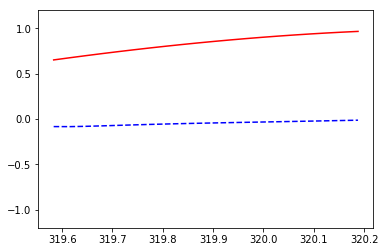

   0.540579
   [[320.2197455  320.25157649 320.28340748 320.31523847 320.34706946
  320.37890044 320.41073143 320.44256242 320.47439341 320.5062244
  320.53805539 320.56988638 320.60171736 320.63354835 320.66537934
  320.69721033 320.72904132 320.76087231 320.7927033  320.82453428]
 [320.85636527 320.88819626 320.92002725 320.95185824 320.98368923
  321.01552022 321.0473512  321.07918219 321.11101318 321.14284417
  321.17467516 321.20650615 321.23833714 321.27016813 321.30199911
  321.3338301  321.36566109 321.39749208 321.42932307 321.46115406]
 [321.49298505 321.52481603 321.55664702 321.58847801 321.620309
  321.65213999 321.68397098 321.71580197 321.74763295 321.77946394
  321.81129493 321.84312592 321.87495691 321.9067879  321.93861889
  321.97044987 322.00228086 322.03411185 322.06594284 322.09777383]
 [322.12960482 322.16143581 322.1932668  322.22509778 322.25692877
  322.28875976 322.32059075 322.35242174 322.38425273 322.41608372
  322.4479147  322.47974569 322.51157668 322.54

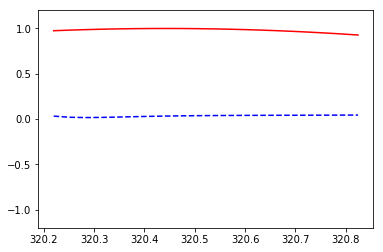

   [[320.85636527 320.88819626 320.92002725 320.95185824 320.98368923
  321.01552022 321.0473512  321.07918219 321.11101318 321.14284417
  321.17467516 321.20650615 321.23833714 321.27016813 321.30199911
  321.3338301  321.36566109 321.39749208 321.42932307 321.46115406]
 [321.49298505 321.52481603 321.55664702 321.58847801 321.620309
  321.65213999 321.68397098 321.71580197 321.74763295 321.77946394
  321.81129493 321.84312592 321.87495691 321.9067879  321.93861889
  321.97044987 322.00228086 322.03411185 322.06594284 322.09777383]
 [322.12960482 322.16143581 322.1932668  322.22509778 322.25692877
  322.28875976 322.32059075 322.35242174 322.38425273 322.41608372
  322.4479147  322.47974569 322.51157668 322.54340767 322.57523866
  322.60706965 322.63890064 322.67073162 322.70256261 322.7343936 ]
 [322.76622459 322.79805558 322.82988657 322.86171756 322.89354854
  322.92537953 322.95721052 322.98904151 323.0208725  323.05270349
  323.08453448 323.11636547 323.14819645 323.18002744 323.

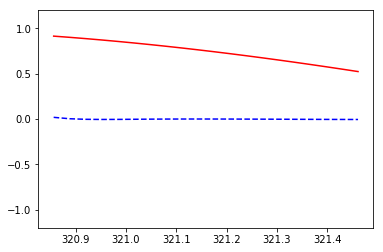

   [[321.49298505 321.52481603 321.55664702 321.58847801 321.620309
  321.65213999 321.68397098 321.71580197 321.74763295 321.77946394
  321.81129493 321.84312592 321.87495691 321.9067879  321.93861889
  321.97044987 322.00228086 322.03411185 322.06594284 322.09777383]
 [322.12960482 322.16143581 322.1932668  322.22509778 322.25692877
  322.28875976 322.32059075 322.35242174 322.38425273 322.41608372
  322.4479147  322.47974569 322.51157668 322.54340767 322.57523866
  322.60706965 322.63890064 322.67073162 322.70256261 322.7343936 ]
 [322.76622459 322.79805558 322.82988657 322.86171756 322.89354854
  322.92537953 322.95721052 322.98904151 323.0208725  323.05270349
  323.08453448 323.11636547 323.14819645 323.18002744 323.21185843
  323.24368942 323.27552041 323.3073514  323.33918239 323.37101337]
 [323.40284436 323.43467535 323.46650634 323.49833733 323.53016832
  323.56199931 323.59383029 323.62566128 323.65749227 323.68932326
  323.72115425 323.75298524 323.78481623 323.81664721 323.

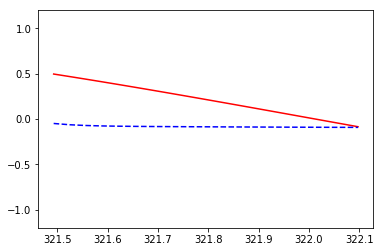

   [[322.12960482 322.16143581 322.1932668  322.22509778 322.25692877
  322.28875976 322.32059075 322.35242174 322.38425273 322.41608372
  322.4479147  322.47974569 322.51157668 322.54340767 322.57523866
  322.60706965 322.63890064 322.67073162 322.70256261 322.7343936 ]
 [322.76622459 322.79805558 322.82988657 322.86171756 322.89354854
  322.92537953 322.95721052 322.98904151 323.0208725  323.05270349
  323.08453448 323.11636547 323.14819645 323.18002744 323.21185843
  323.24368942 323.27552041 323.3073514  323.33918239 323.37101337]
 [323.40284436 323.43467535 323.46650634 323.49833733 323.53016832
  323.56199931 323.59383029 323.62566128 323.65749227 323.68932326
  323.72115425 323.75298524 323.78481623 323.81664721 323.8484782
  323.88030919 323.91214018 323.94397117 323.97580216 324.00763315]
 [324.03946414 324.07129512 324.10312611 324.1349571  324.16678809
  324.19861908 324.23045007 324.26228106 324.29411204 324.32594303
  324.35777402 324.38960501 324.421436   324.45326699 324

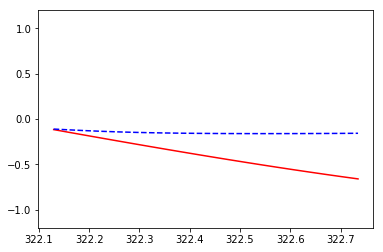

   [[322.76622459 322.79805558 322.82988657 322.86171756 322.89354854
  322.92537953 322.95721052 322.98904151 323.0208725  323.05270349
  323.08453448 323.11636547 323.14819645 323.18002744 323.21185843
  323.24368942 323.27552041 323.3073514  323.33918239 323.37101337]
 [323.40284436 323.43467535 323.46650634 323.49833733 323.53016832
  323.56199931 323.59383029 323.62566128 323.65749227 323.68932326
  323.72115425 323.75298524 323.78481623 323.81664721 323.8484782
  323.88030919 323.91214018 323.94397117 323.97580216 324.00763315]
 [324.03946414 324.07129512 324.10312611 324.1349571  324.16678809
  324.19861908 324.23045007 324.26228106 324.29411204 324.32594303
  324.35777402 324.38960501 324.421436   324.45326699 324.48509798
  324.51692896 324.54875995 324.58059094 324.61242193 324.64425292]
 [324.67608391 324.7079149  324.73974588 324.77157687 324.80340786
  324.83523885 324.86706984 324.89890083 324.93073182 324.96256281
  324.99439379 325.02622478 325.05805577 325.08988676 325

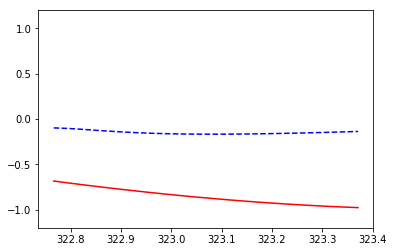

   [[323.40284436 323.43467535 323.46650634 323.49833733 323.53016832
  323.56199931 323.59383029 323.62566128 323.65749227 323.68932326
  323.72115425 323.75298524 323.78481623 323.81664721 323.8484782
  323.88030919 323.91214018 323.94397117 323.97580216 324.00763315]
 [324.03946414 324.07129512 324.10312611 324.1349571  324.16678809
  324.19861908 324.23045007 324.26228106 324.29411204 324.32594303
  324.35777402 324.38960501 324.421436   324.45326699 324.48509798
  324.51692896 324.54875995 324.58059094 324.61242193 324.64425292]
 [324.67608391 324.7079149  324.73974588 324.77157687 324.80340786
  324.83523885 324.86706984 324.89890083 324.93073182 324.96256281
  324.99439379 325.02622478 325.05805577 325.08988676 325.12171775
  325.15354874 325.18537973 325.21721071 325.2490417  325.28087269]
 [325.31270368 325.34453467 325.37636566 325.40819665 325.44002763
  325.47185862 325.50368961 325.5355206  325.56735159 325.59918258
  325.63101357 325.66284455 325.69467554 325.72650653 325

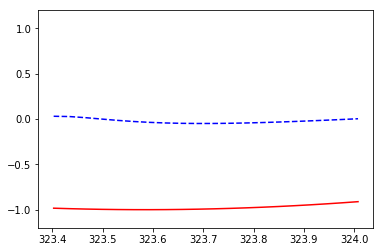

   [[324.03946414 324.07129512 324.10312611 324.1349571  324.16678809
  324.19861908 324.23045007 324.26228106 324.29411204 324.32594303
  324.35777402 324.38960501 324.421436   324.45326699 324.48509798
  324.51692896 324.54875995 324.58059094 324.61242193 324.64425292]
 [324.67608391 324.7079149  324.73974588 324.77157687 324.80340786
  324.83523885 324.86706984 324.89890083 324.93073182 324.96256281
  324.99439379 325.02622478 325.05805577 325.08988676 325.12171775
  325.15354874 325.18537973 325.21721071 325.2490417  325.28087269]
 [325.31270368 325.34453467 325.37636566 325.40819665 325.44002763
  325.47185862 325.50368961 325.5355206  325.56735159 325.59918258
  325.63101357 325.66284455 325.69467554 325.72650653 325.75833752
  325.79016851 325.8219995  325.85383049 325.88566147 325.91749246]
 [325.94932345 325.98115444 326.01298543 326.04481642 326.07664741
  326.1084784  326.14030938 326.17214037 326.20397136 326.23580235
  326.26763334 326.29946433 326.33129532 326.3631263  32

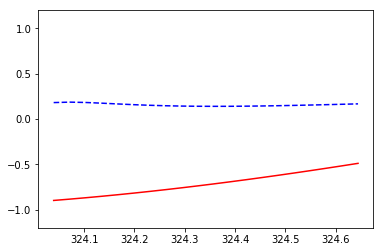

   [[324.67608391 324.7079149  324.73974588 324.77157687 324.80340786
  324.83523885 324.86706984 324.89890083 324.93073182 324.96256281
  324.99439379 325.02622478 325.05805577 325.08988676 325.12171775
  325.15354874 325.18537973 325.21721071 325.2490417  325.28087269]
 [325.31270368 325.34453467 325.37636566 325.40819665 325.44002763
  325.47185862 325.50368961 325.5355206  325.56735159 325.59918258
  325.63101357 325.66284455 325.69467554 325.72650653 325.75833752
  325.79016851 325.8219995  325.85383049 325.88566147 325.91749246]
 [325.94932345 325.98115444 326.01298543 326.04481642 326.07664741
  326.1084784  326.14030938 326.17214037 326.20397136 326.23580235
  326.26763334 326.29946433 326.33129532 326.3631263  326.39495729
  326.42678828 326.45861927 326.49045026 326.52228125 326.55411224]
 [326.58594322 326.61777421 326.6496052  326.68143619 326.71326718
  326.74509817 326.77692916 326.80876014 326.84059113 326.87242212
  326.90425311 326.9360841  326.96791509 326.99974608 32

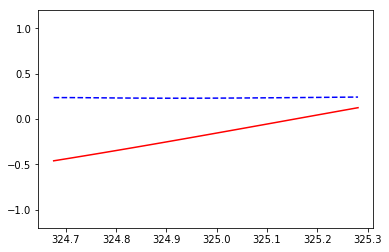

   [[325.31270368 325.34453467 325.37636566 325.40819665 325.44002763
  325.47185862 325.50368961 325.5355206  325.56735159 325.59918258
  325.63101357 325.66284455 325.69467554 325.72650653 325.75833752
  325.79016851 325.8219995  325.85383049 325.88566147 325.91749246]
 [325.94932345 325.98115444 326.01298543 326.04481642 326.07664741
  326.1084784  326.14030938 326.17214037 326.20397136 326.23580235
  326.26763334 326.29946433 326.33129532 326.3631263  326.39495729
  326.42678828 326.45861927 326.49045026 326.52228125 326.55411224]
 [326.58594322 326.61777421 326.6496052  326.68143619 326.71326718
  326.74509817 326.77692916 326.80876014 326.84059113 326.87242212
  326.90425311 326.9360841  326.96791509 326.99974608 327.03157707
  327.06340805 327.09523904 327.12707003 327.15890102 327.19073201]
 [327.222563   327.25439399 327.28622497 327.31805596 327.34988695
  327.38171794 327.41354893 327.44537992 327.47721091 327.50904189
  327.54087288 327.57270387 327.60453486 327.63636585 32

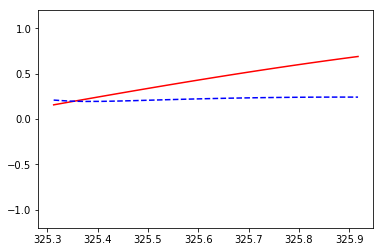

   [[325.94932345 325.98115444 326.01298543 326.04481642 326.07664741
  326.1084784  326.14030938 326.17214037 326.20397136 326.23580235
  326.26763334 326.29946433 326.33129532 326.3631263  326.39495729
  326.42678828 326.45861927 326.49045026 326.52228125 326.55411224]
 [326.58594322 326.61777421 326.6496052  326.68143619 326.71326718
  326.74509817 326.77692916 326.80876014 326.84059113 326.87242212
  326.90425311 326.9360841  326.96791509 326.99974608 327.03157707
  327.06340805 327.09523904 327.12707003 327.15890102 327.19073201]
 [327.222563   327.25439399 327.28622497 327.31805596 327.34988695
  327.38171794 327.41354893 327.44537992 327.47721091 327.50904189
  327.54087288 327.57270387 327.60453486 327.63636585 327.66819684
  327.70002783 327.73185881 327.7636898  327.79552079 327.82735178]
 [327.85918277 327.89101376 327.92284475 327.95467574 327.98650672
  328.01833771 328.0501687  328.08199969 328.11383068 328.14566167
  328.17749266 328.20932364 328.24115463 328.27298562 32

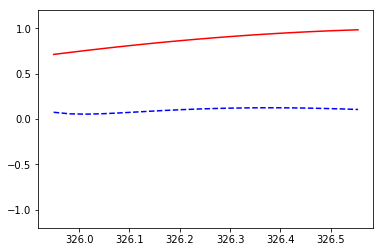

   0.44391763
   [[326.58594322 326.61777421 326.6496052  326.68143619 326.71326718
  326.74509817 326.77692916 326.80876014 326.84059113 326.87242212
  326.90425311 326.9360841  326.96791509 326.99974608 327.03157707
  327.06340805 327.09523904 327.12707003 327.15890102 327.19073201]
 [327.222563   327.25439399 327.28622497 327.31805596 327.34988695
  327.38171794 327.41354893 327.44537992 327.47721091 327.50904189
  327.54087288 327.57270387 327.60453486 327.63636585 327.66819684
  327.70002783 327.73185881 327.7636898  327.79552079 327.82735178]
 [327.85918277 327.89101376 327.92284475 327.95467574 327.98650672
  328.01833771 328.0501687  328.08199969 328.11383068 328.14566167
  328.17749266 328.20932364 328.24115463 328.27298562 328.30481661
  328.3366476  328.36847859 328.40030958 328.43214056 328.46397155]
 [328.49580254 328.52763353 328.55946452 328.59129551 328.6231265
  328.65495748 328.68678847 328.71861946 328.75045045 328.78228144
  328.81411243 328.84594342 328.87777441 32

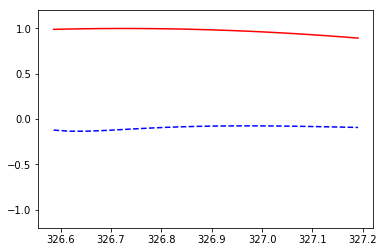

   [[327.222563   327.25439399 327.28622497 327.31805596 327.34988695
  327.38171794 327.41354893 327.44537992 327.47721091 327.50904189
  327.54087288 327.57270387 327.60453486 327.63636585 327.66819684
  327.70002783 327.73185881 327.7636898  327.79552079 327.82735178]
 [327.85918277 327.89101376 327.92284475 327.95467574 327.98650672
  328.01833771 328.0501687  328.08199969 328.11383068 328.14566167
  328.17749266 328.20932364 328.24115463 328.27298562 328.30481661
  328.3366476  328.36847859 328.40030958 328.43214056 328.46397155]
 [328.49580254 328.52763353 328.55946452 328.59129551 328.6231265
  328.65495748 328.68678847 328.71861946 328.75045045 328.78228144
  328.81411243 328.84594342 328.87777441 328.90960539 328.94143638
  328.97326737 329.00509836 329.03692935 329.06876034 329.10059133]
 [329.13242231 329.1642533  329.19608429 329.22791528 329.25974627
  329.29157726 329.32340825 329.35523923 329.38707022 329.41890121
  329.4507322  329.48256319 329.51439418 329.54622517 329

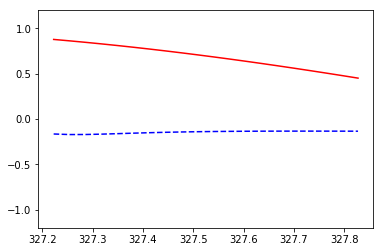

   [[327.85918277 327.89101376 327.92284475 327.95467574 327.98650672
  328.01833771 328.0501687  328.08199969 328.11383068 328.14566167
  328.17749266 328.20932364 328.24115463 328.27298562 328.30481661
  328.3366476  328.36847859 328.40030958 328.43214056 328.46397155]
 [328.49580254 328.52763353 328.55946452 328.59129551 328.6231265
  328.65495748 328.68678847 328.71861946 328.75045045 328.78228144
  328.81411243 328.84594342 328.87777441 328.90960539 328.94143638
  328.97326737 329.00509836 329.03692935 329.06876034 329.10059133]
 [329.13242231 329.1642533  329.19608429 329.22791528 329.25974627
  329.29157726 329.32340825 329.35523923 329.38707022 329.41890121
  329.4507322  329.48256319 329.51439418 329.54622517 329.57805615
  329.60988714 329.64171813 329.67354912 329.70538011 329.7372111 ]
 [329.76904209 329.80087308 329.83270406 329.86453505 329.89636604
  329.92819703 329.96002802 329.99185901 330.02369    330.05552098
  330.08735197 330.11918296 330.15101395 330.18284494 330

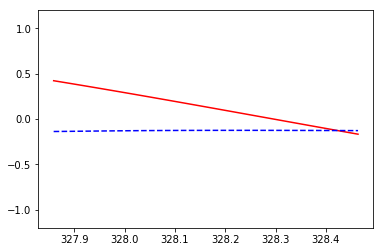

   [[328.49580254 328.52763353 328.55946452 328.59129551 328.6231265
  328.65495748 328.68678847 328.71861946 328.75045045 328.78228144
  328.81411243 328.84594342 328.87777441 328.90960539 328.94143638
  328.97326737 329.00509836 329.03692935 329.06876034 329.10059133]
 [329.13242231 329.1642533  329.19608429 329.22791528 329.25974627
  329.29157726 329.32340825 329.35523923 329.38707022 329.41890121
  329.4507322  329.48256319 329.51439418 329.54622517 329.57805615
  329.60988714 329.64171813 329.67354912 329.70538011 329.7372111 ]
 [329.76904209 329.80087308 329.83270406 329.86453505 329.89636604
  329.92819703 329.96002802 329.99185901 330.02369    330.05552098
  330.08735197 330.11918296 330.15101395 330.18284494 330.21467593
  330.24650692 330.2783379  330.31016889 330.34199988 330.37383087]
 [330.40566186 330.43749285 330.46932384 330.50115482 330.53298581
  330.5648168  330.59664779 330.62847878 330.66030977 330.69214076
  330.72397174 330.75580273 330.78763372 330.81946471 330

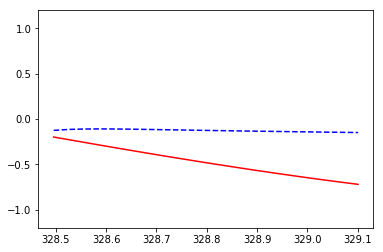

   [[329.13242231 329.1642533  329.19608429 329.22791528 329.25974627
  329.29157726 329.32340825 329.35523923 329.38707022 329.41890121
  329.4507322  329.48256319 329.51439418 329.54622517 329.57805615
  329.60988714 329.64171813 329.67354912 329.70538011 329.7372111 ]
 [329.76904209 329.80087308 329.83270406 329.86453505 329.89636604
  329.92819703 329.96002802 329.99185901 330.02369    330.05552098
  330.08735197 330.11918296 330.15101395 330.18284494 330.21467593
  330.24650692 330.2783379  330.31016889 330.34199988 330.37383087]
 [330.40566186 330.43749285 330.46932384 330.50115482 330.53298581
  330.5648168  330.59664779 330.62847878 330.66030977 330.69214076
  330.72397174 330.75580273 330.78763372 330.81946471 330.8512957
  330.88312669 330.91495768 330.94678867 330.97861965 331.01045064]
 [331.04228163 331.07411262 331.10594361 331.1377746  331.16960559
  331.20143657 331.23326756 331.26509855 331.29692954 331.32876053
  331.36059152 331.39242251 331.42425349 331.45608448 331

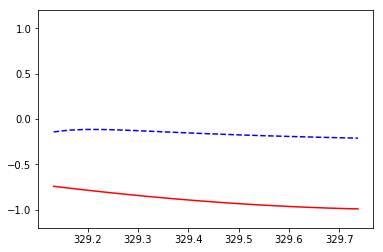

   [[329.76904209 329.80087308 329.83270406 329.86453505 329.89636604
  329.92819703 329.96002802 329.99185901 330.02369    330.05552098
  330.08735197 330.11918296 330.15101395 330.18284494 330.21467593
  330.24650692 330.2783379  330.31016889 330.34199988 330.37383087]
 [330.40566186 330.43749285 330.46932384 330.50115482 330.53298581
  330.5648168  330.59664779 330.62847878 330.66030977 330.69214076
  330.72397174 330.75580273 330.78763372 330.81946471 330.8512957
  330.88312669 330.91495768 330.94678867 330.97861965 331.01045064]
 [331.04228163 331.07411262 331.10594361 331.1377746  331.16960559
  331.20143657 331.23326756 331.26509855 331.29692954 331.32876053
  331.36059152 331.39242251 331.42425349 331.45608448 331.48791547
  331.51974646 331.55157745 331.58340844 331.61523943 331.64707041]
 [331.6789014  331.71073239 331.74256338 331.77439437 331.80622536
  331.83805635 331.86988734 331.90171832 331.93354931 331.9653803
  331.99721129 332.02904228 332.06087327 332.09270426 332.

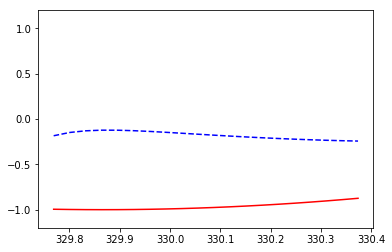

   [[330.40566186 330.43749285 330.46932384 330.50115482 330.53298581
  330.5648168  330.59664779 330.62847878 330.66030977 330.69214076
  330.72397174 330.75580273 330.78763372 330.81946471 330.8512957
  330.88312669 330.91495768 330.94678867 330.97861965 331.01045064]
 [331.04228163 331.07411262 331.10594361 331.1377746  331.16960559
  331.20143657 331.23326756 331.26509855 331.29692954 331.32876053
  331.36059152 331.39242251 331.42425349 331.45608448 331.48791547
  331.51974646 331.55157745 331.58340844 331.61523943 331.64707041]
 [331.6789014  331.71073239 331.74256338 331.77439437 331.80622536
  331.83805635 331.86988734 331.90171832 331.93354931 331.9653803
  331.99721129 332.02904228 332.06087327 332.09270426 332.12453524
  332.15636623 332.18819722 332.22002821 332.2518592  332.28369019]
 [332.31552118 332.34735216 332.37918315 332.41101414 332.44284513
  332.47467612 332.50650711 332.5383381  332.57016908 332.60200007
  332.63383106 332.66566205 332.69749304 332.72932403 332.

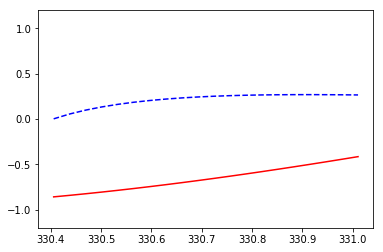

   [[331.04228163 331.07411262 331.10594361 331.1377746  331.16960559
  331.20143657 331.23326756 331.26509855 331.29692954 331.32876053
  331.36059152 331.39242251 331.42425349 331.45608448 331.48791547
  331.51974646 331.55157745 331.58340844 331.61523943 331.64707041]
 [331.6789014  331.71073239 331.74256338 331.77439437 331.80622536
  331.83805635 331.86988734 331.90171832 331.93354931 331.9653803
  331.99721129 332.02904228 332.06087327 332.09270426 332.12453524
  332.15636623 332.18819722 332.22002821 332.2518592  332.28369019]
 [332.31552118 332.34735216 332.37918315 332.41101414 332.44284513
  332.47467612 332.50650711 332.5383381  332.57016908 332.60200007
  332.63383106 332.66566205 332.69749304 332.72932403 332.76115502
  332.79298601 332.82481699 332.85664798 332.88847897 332.92030996]
 [332.95214095 332.98397194 333.01580293 333.04763391 333.0794649
  333.11129589 333.14312688 333.17495787 333.20678886 333.23861985
  333.27045083 333.30228182 333.33411281 333.3659438  333.

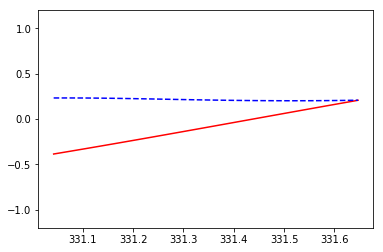

   [[331.6789014  331.71073239 331.74256338 331.77439437 331.80622536
  331.83805635 331.86988734 331.90171832 331.93354931 331.9653803
  331.99721129 332.02904228 332.06087327 332.09270426 332.12453524
  332.15636623 332.18819722 332.22002821 332.2518592  332.28369019]
 [332.31552118 332.34735216 332.37918315 332.41101414 332.44284513
  332.47467612 332.50650711 332.5383381  332.57016908 332.60200007
  332.63383106 332.66566205 332.69749304 332.72932403 332.76115502
  332.79298601 332.82481699 332.85664798 332.88847897 332.92030996]
 [332.95214095 332.98397194 333.01580293 333.04763391 333.0794649
  333.11129589 333.14312688 333.17495787 333.20678886 333.23861985
  333.27045083 333.30228182 333.33411281 333.3659438  333.39777479
  333.42960578 333.46143677 333.49326775 333.52509874 333.55692973]
 [333.58876072 333.62059171 333.6524227  333.68425369 333.71608468
  333.74791566 333.77974665 333.81157764 333.84340863 333.87523962
  333.90707061 333.9389016  333.97073258 334.00256357 334.

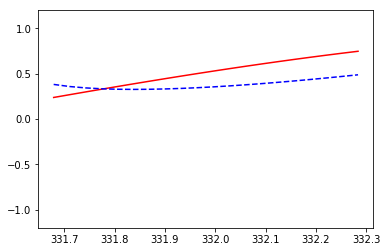

   [[332.31552118 332.34735216 332.37918315 332.41101414 332.44284513
  332.47467612 332.50650711 332.5383381  332.57016908 332.60200007
  332.63383106 332.66566205 332.69749304 332.72932403 332.76115502
  332.79298601 332.82481699 332.85664798 332.88847897 332.92030996]
 [332.95214095 332.98397194 333.01580293 333.04763391 333.0794649
  333.11129589 333.14312688 333.17495787 333.20678886 333.23861985
  333.27045083 333.30228182 333.33411281 333.3659438  333.39777479
  333.42960578 333.46143677 333.49326775 333.52509874 333.55692973]
 [333.58876072 333.62059171 333.6524227  333.68425369 333.71608468
  333.74791566 333.77974665 333.81157764 333.84340863 333.87523962
  333.90707061 333.9389016  333.97073258 334.00256357 334.03439456
  334.06622555 334.09805654 334.12988753 334.16171852 334.1935495 ]
 [334.22538049 334.25721148 334.28904247 334.32087346 334.35270445
  334.38453544 334.41636642 334.44819741 334.4800284  334.51185939
  334.54369038 334.57552137 334.60735236 334.63918335 334

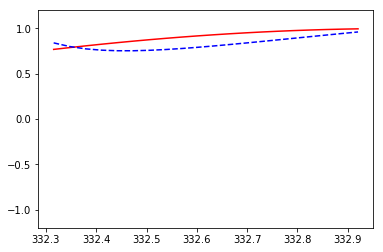

   0.119017944
   [[332.95214095 332.98397194 333.01580293 333.04763391 333.0794649
  333.11129589 333.14312688 333.17495787 333.20678886 333.23861985
  333.27045083 333.30228182 333.33411281 333.3659438  333.39777479
  333.42960578 333.46143677 333.49326775 333.52509874 333.55692973]
 [333.58876072 333.62059171 333.6524227  333.68425369 333.71608468
  333.74791566 333.77974665 333.81157764 333.84340863 333.87523962
  333.90707061 333.9389016  333.97073258 334.00256357 334.03439456
  334.06622555 334.09805654 334.12988753 334.16171852 334.1935495 ]
 [334.22538049 334.25721148 334.28904247 334.32087346 334.35270445
  334.38453544 334.41636642 334.44819741 334.4800284  334.51185939
  334.54369038 334.57552137 334.60735236 334.63918335 334.67101433
  334.70284532 334.73467631 334.7665073  334.79833829 334.83016928]
 [334.86200027 334.89383125 334.92566224 334.95749323 334.98932422
  335.02115521 335.0529862  335.08481719 335.11664817 335.14847916
  335.18031015 335.21214114 335.24397213 3

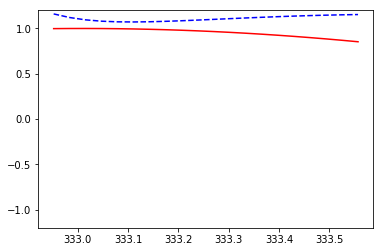

   [[333.58876072 333.62059171 333.6524227  333.68425369 333.71608468
  333.74791566 333.77974665 333.81157764 333.84340863 333.87523962
  333.90707061 333.9389016  333.97073258 334.00256357 334.03439456
  334.06622555 334.09805654 334.12988753 334.16171852 334.1935495 ]
 [334.22538049 334.25721148 334.28904247 334.32087346 334.35270445
  334.38453544 334.41636642 334.44819741 334.4800284  334.51185939
  334.54369038 334.57552137 334.60735236 334.63918335 334.67101433
  334.70284532 334.73467631 334.7665073  334.79833829 334.83016928]
 [334.86200027 334.89383125 334.92566224 334.95749323 334.98932422
  335.02115521 335.0529862  335.08481719 335.11664817 335.14847916
  335.18031015 335.21214114 335.24397213 335.27580312 335.30763411
  335.33946509 335.37129608 335.40312707 335.43495806 335.46678905]
 [335.49862004 335.53045103 335.56228201 335.594113   335.62594399
  335.65777498 335.68960597 335.72143696 335.75326795 335.78509894
  335.81692992 335.84876091 335.8805919  335.91242289 33

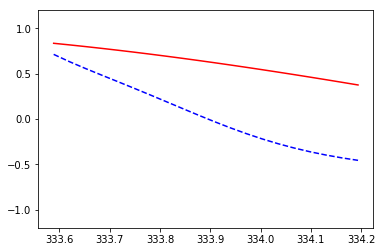

   [[334.22538049 334.25721148 334.28904247 334.32087346 334.35270445
  334.38453544 334.41636642 334.44819741 334.4800284  334.51185939
  334.54369038 334.57552137 334.60735236 334.63918335 334.67101433
  334.70284532 334.73467631 334.7665073  334.79833829 334.83016928]
 [334.86200027 334.89383125 334.92566224 334.95749323 334.98932422
  335.02115521 335.0529862  335.08481719 335.11664817 335.14847916
  335.18031015 335.21214114 335.24397213 335.27580312 335.30763411
  335.33946509 335.37129608 335.40312707 335.43495806 335.46678905]
 [335.49862004 335.53045103 335.56228201 335.594113   335.62594399
  335.65777498 335.68960597 335.72143696 335.75326795 335.78509894
  335.81692992 335.84876091 335.8805919  335.91242289 335.94425388
  335.97608487 336.00791586 336.03974684 336.07157783 336.10340882]
 [336.13523981 336.1670708  336.19890179 336.23073278 336.26256376
  336.29439475 336.32622574 336.35805673 336.38988772 336.42171871
  336.4535497  336.48538068 336.51721167 336.54904266 33

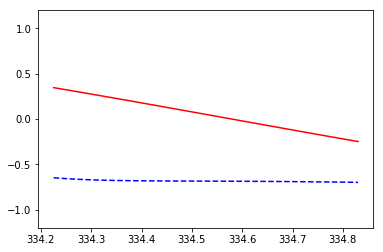

   [[334.86200027 334.89383125 334.92566224 334.95749323 334.98932422
  335.02115521 335.0529862  335.08481719 335.11664817 335.14847916
  335.18031015 335.21214114 335.24397213 335.27580312 335.30763411
  335.33946509 335.37129608 335.40312707 335.43495806 335.46678905]
 [335.49862004 335.53045103 335.56228201 335.594113   335.62594399
  335.65777498 335.68960597 335.72143696 335.75326795 335.78509894
  335.81692992 335.84876091 335.8805919  335.91242289 335.94425388
  335.97608487 336.00791586 336.03974684 336.07157783 336.10340882]
 [336.13523981 336.1670708  336.19890179 336.23073278 336.26256376
  336.29439475 336.32622574 336.35805673 336.38988772 336.42171871
  336.4535497  336.48538068 336.51721167 336.54904266 336.58087365
  336.61270464 336.64453563 336.67636662 336.70819761 336.74002859]
 [336.77185958 336.80369057 336.83552156 336.86735255 336.89918354
  336.93101453 336.96284551 336.9946765  337.02650749 337.05833848
  337.09016947 337.12200046 337.15383145 337.18566243 33

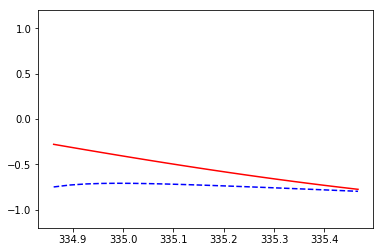

   [[335.49862004 335.53045103 335.56228201 335.594113   335.62594399
  335.65777498 335.68960597 335.72143696 335.75326795 335.78509894
  335.81692992 335.84876091 335.8805919  335.91242289 335.94425388
  335.97608487 336.00791586 336.03974684 336.07157783 336.10340882]
 [336.13523981 336.1670708  336.19890179 336.23073278 336.26256376
  336.29439475 336.32622574 336.35805673 336.38988772 336.42171871
  336.4535497  336.48538068 336.51721167 336.54904266 336.58087365
  336.61270464 336.64453563 336.67636662 336.70819761 336.74002859]
 [336.77185958 336.80369057 336.83552156 336.86735255 336.89918354
  336.93101453 336.96284551 336.9946765  337.02650749 337.05833848
  337.09016947 337.12200046 337.15383145 337.18566243 337.21749342
  337.24932441 337.2811554  337.31298639 337.34481738 337.37664837]
 [337.40847935 337.44031034 337.47214133 337.50397232 337.53580331
  337.5676343  337.59946529 337.63129628 337.66312726 337.69495825
  337.72678924 337.75862023 337.79045122 337.82228221 33

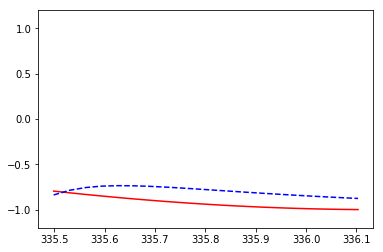

   [[336.13523981 336.1670708  336.19890179 336.23073278 336.26256376
  336.29439475 336.32622574 336.35805673 336.38988772 336.42171871
  336.4535497  336.48538068 336.51721167 336.54904266 336.58087365
  336.61270464 336.64453563 336.67636662 336.70819761 336.74002859]
 [336.77185958 336.80369057 336.83552156 336.86735255 336.89918354
  336.93101453 336.96284551 336.9946765  337.02650749 337.05833848
  337.09016947 337.12200046 337.15383145 337.18566243 337.21749342
  337.24932441 337.2811554  337.31298639 337.34481738 337.37664837]
 [337.40847935 337.44031034 337.47214133 337.50397232 337.53580331
  337.5676343  337.59946529 337.63129628 337.66312726 337.69495825
  337.72678924 337.75862023 337.79045122 337.82228221 337.8541132
  337.88594418 337.91777517 337.94960616 337.98143715 338.01326814]
 [338.04509913 338.07693012 338.1087611  338.14059209 338.17242308
  338.20425407 338.23608506 338.26791605 338.29974704 338.33157802
  338.36340901 338.39524    338.42707099 338.45890198 338

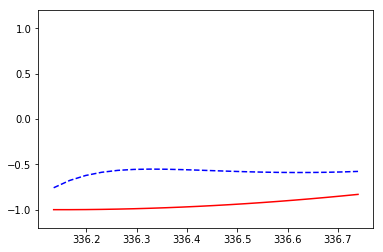

   [[336.77185958 336.80369057 336.83552156 336.86735255 336.89918354
  336.93101453 336.96284551 336.9946765  337.02650749 337.05833848
  337.09016947 337.12200046 337.15383145 337.18566243 337.21749342
  337.24932441 337.2811554  337.31298639 337.34481738 337.37664837]
 [337.40847935 337.44031034 337.47214133 337.50397232 337.53580331
  337.5676343  337.59946529 337.63129628 337.66312726 337.69495825
  337.72678924 337.75862023 337.79045122 337.82228221 337.8541132
  337.88594418 337.91777517 337.94960616 337.98143715 338.01326814]
 [338.04509913 338.07693012 338.1087611  338.14059209 338.17242308
  338.20425407 338.23608506 338.26791605 338.29974704 338.33157802
  338.36340901 338.39524    338.42707099 338.45890198 338.49073297
  338.52256396 338.55439495 338.58622593 338.61805692 338.64988791]
 [338.6817189  338.71354989 338.74538088 338.77721187 338.80904285
  338.84087384 338.87270483 338.90453582 338.93636681 338.9681978
  339.00002879 339.03185977 339.06369076 339.09552175 339.

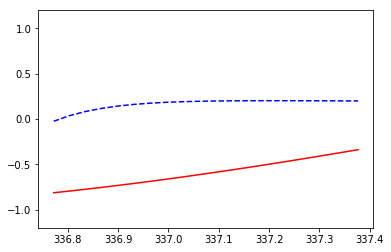

   [[337.40847935 337.44031034 337.47214133 337.50397232 337.53580331
  337.5676343  337.59946529 337.63129628 337.66312726 337.69495825
  337.72678924 337.75862023 337.79045122 337.82228221 337.8541132
  337.88594418 337.91777517 337.94960616 337.98143715 338.01326814]
 [338.04509913 338.07693012 338.1087611  338.14059209 338.17242308
  338.20425407 338.23608506 338.26791605 338.29974704 338.33157802
  338.36340901 338.39524    338.42707099 338.45890198 338.49073297
  338.52256396 338.55439495 338.58622593 338.61805692 338.64988791]
 [338.6817189  338.71354989 338.74538088 338.77721187 338.80904285
  338.84087384 338.87270483 338.90453582 338.93636681 338.9681978
  339.00002879 339.03185977 339.06369076 339.09552175 339.12735274
  339.15918373 339.19101472 339.22284571 339.25467669 339.28650768]
 [339.31833867 339.35016966 339.38200065 339.41383164 339.44566263
  339.47749362 339.5093246  339.54115559 339.57298658 339.60481757
  339.63664856 339.66847955 339.70031054 339.73214152 339.

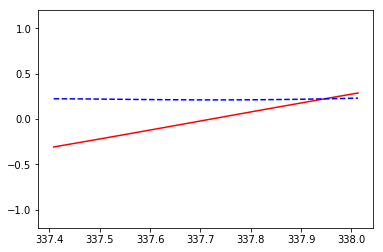

   [[338.04509913 338.07693012 338.1087611  338.14059209 338.17242308
  338.20425407 338.23608506 338.26791605 338.29974704 338.33157802
  338.36340901 338.39524    338.42707099 338.45890198 338.49073297
  338.52256396 338.55439495 338.58622593 338.61805692 338.64988791]
 [338.6817189  338.71354989 338.74538088 338.77721187 338.80904285
  338.84087384 338.87270483 338.90453582 338.93636681 338.9681978
  339.00002879 339.03185977 339.06369076 339.09552175 339.12735274
  339.15918373 339.19101472 339.22284571 339.25467669 339.28650768]
 [339.31833867 339.35016966 339.38200065 339.41383164 339.44566263
  339.47749362 339.5093246  339.54115559 339.57298658 339.60481757
  339.63664856 339.66847955 339.70031054 339.73214152 339.76397251
  339.7958035  339.82763449 339.85946548 339.89129647 339.92312746]
 [339.95495844 339.98678943 340.01862042 340.05045141 340.0822824
  340.11411339 340.14594438 340.17777536 340.20960635 340.24143734
  340.27326833 340.30509932 340.33693031 340.3687613  340.

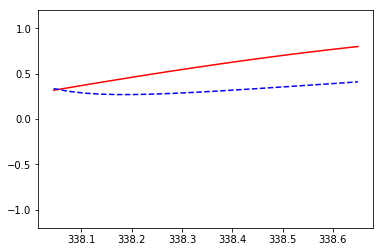

   [[338.6817189  338.71354989 338.74538088 338.77721187 338.80904285
  338.84087384 338.87270483 338.90453582 338.93636681 338.9681978
  339.00002879 339.03185977 339.06369076 339.09552175 339.12735274
  339.15918373 339.19101472 339.22284571 339.25467669 339.28650768]
 [339.31833867 339.35016966 339.38200065 339.41383164 339.44566263
  339.47749362 339.5093246  339.54115559 339.57298658 339.60481757
  339.63664856 339.66847955 339.70031054 339.73214152 339.76397251
  339.7958035  339.82763449 339.85946548 339.89129647 339.92312746]
 [339.95495844 339.98678943 340.01862042 340.05045141 340.0822824
  340.11411339 340.14594438 340.17777536 340.20960635 340.24143734
  340.27326833 340.30509932 340.33693031 340.3687613  340.40059228
  340.43242327 340.46425426 340.49608525 340.52791624 340.55974723]
 [340.59157822 340.62340921 340.65524019 340.68707118 340.71890217
  340.75073316 340.78256415 340.81439514 340.84622613 340.87805711
  340.9098881  340.94171909 340.97355008 341.00538107 341.

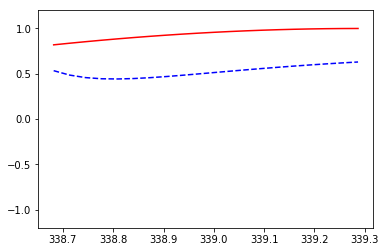

   0.16908291
   [[339.31833867 339.35016966 339.38200065 339.41383164 339.44566263
  339.47749362 339.5093246  339.54115559 339.57298658 339.60481757
  339.63664856 339.66847955 339.70031054 339.73214152 339.76397251
  339.7958035  339.82763449 339.85946548 339.89129647 339.92312746]
 [339.95495844 339.98678943 340.01862042 340.05045141 340.0822824
  340.11411339 340.14594438 340.17777536 340.20960635 340.24143734
  340.27326833 340.30509932 340.33693031 340.3687613  340.40059228
  340.43242327 340.46425426 340.49608525 340.52791624 340.55974723]
 [340.59157822 340.62340921 340.65524019 340.68707118 340.71890217
  340.75073316 340.78256415 340.81439514 340.84622613 340.87805711
  340.9098881  340.94171909 340.97355008 341.00538107 341.03721206
  341.06904305 341.10087403 341.13270502 341.16453601 341.196367  ]
 [341.22819799 341.26002898 341.29185997 341.32369095 341.35552194
  341.38735293 341.41918392 341.45101491 341.4828459  341.51467689
  341.54650788 341.57833886 341.61016985 34

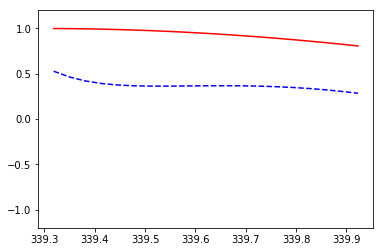

   [[339.95495844 339.98678943 340.01862042 340.05045141 340.0822824
  340.11411339 340.14594438 340.17777536 340.20960635 340.24143734
  340.27326833 340.30509932 340.33693031 340.3687613  340.40059228
  340.43242327 340.46425426 340.49608525 340.52791624 340.55974723]
 [340.59157822 340.62340921 340.65524019 340.68707118 340.71890217
  340.75073316 340.78256415 340.81439514 340.84622613 340.87805711
  340.9098881  340.94171909 340.97355008 341.00538107 341.03721206
  341.06904305 341.10087403 341.13270502 341.16453601 341.196367  ]
 [341.22819799 341.26002898 341.29185997 341.32369095 341.35552194
  341.38735293 341.41918392 341.45101491 341.4828459  341.51467689
  341.54650788 341.57833886 341.61016985 341.64200084 341.67383183
  341.70566282 341.73749381 341.7693248  341.80115578 341.83298677]
 [341.86481776 341.89664875 341.92847974 341.96031073 341.99214172
  342.0239727  342.05580369 342.08763468 342.11946567 342.15129666
  342.18312765 342.21495864 342.24678962 342.27862061 342

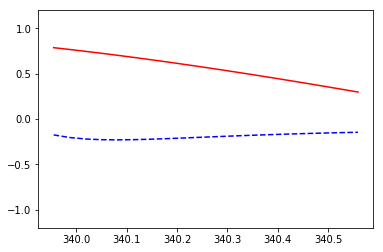

   [[340.59157822 340.62340921 340.65524019 340.68707118 340.71890217
  340.75073316 340.78256415 340.81439514 340.84622613 340.87805711
  340.9098881  340.94171909 340.97355008 341.00538107 341.03721206
  341.06904305 341.10087403 341.13270502 341.16453601 341.196367  ]
 [341.22819799 341.26002898 341.29185997 341.32369095 341.35552194
  341.38735293 341.41918392 341.45101491 341.4828459  341.51467689
  341.54650788 341.57833886 341.61016985 341.64200084 341.67383183
  341.70566282 341.73749381 341.7693248  341.80115578 341.83298677]
 [341.86481776 341.89664875 341.92847974 341.96031073 341.99214172
  342.0239727  342.05580369 342.08763468 342.11946567 342.15129666
  342.18312765 342.21495864 342.24678962 342.27862061 342.3104516
  342.34228259 342.37411358 342.40594457 342.43777556 342.46960655]
 [342.50143753 342.53326852 342.56509951 342.5969305  342.62876149
  342.66059248 342.69242347 342.72425445 342.75608544 342.78791643
  342.81974742 342.85157841 342.8834094  342.91524039 342

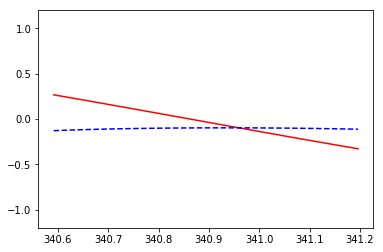

   [[341.22819799 341.26002898 341.29185997 341.32369095 341.35552194
  341.38735293 341.41918392 341.45101491 341.4828459  341.51467689
  341.54650788 341.57833886 341.61016985 341.64200084 341.67383183
  341.70566282 341.73749381 341.7693248  341.80115578 341.83298677]
 [341.86481776 341.89664875 341.92847974 341.96031073 341.99214172
  342.0239727  342.05580369 342.08763468 342.11946567 342.15129666
  342.18312765 342.21495864 342.24678962 342.27862061 342.3104516
  342.34228259 342.37411358 342.40594457 342.43777556 342.46960655]
 [342.50143753 342.53326852 342.56509951 342.5969305  342.62876149
  342.66059248 342.69242347 342.72425445 342.75608544 342.78791643
  342.81974742 342.85157841 342.8834094  342.91524039 342.94707137
  342.97890236 343.01073335 343.04256434 343.07439533 343.10622632]
 [343.13805731 343.16988829 343.20171928 343.23355027 343.26538126
  343.29721225 343.32904324 343.36087423 343.39270522 343.4245362
  343.45636719 343.48819818 343.52002917 343.55186016 343.

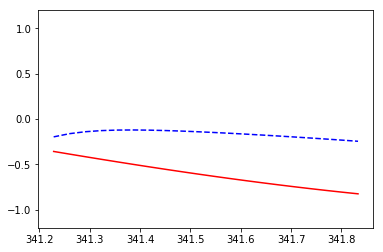

   [[341.86481776 341.89664875 341.92847974 341.96031073 341.99214172
  342.0239727  342.05580369 342.08763468 342.11946567 342.15129666
  342.18312765 342.21495864 342.24678962 342.27862061 342.3104516
  342.34228259 342.37411358 342.40594457 342.43777556 342.46960655]
 [342.50143753 342.53326852 342.56509951 342.5969305  342.62876149
  342.66059248 342.69242347 342.72425445 342.75608544 342.78791643
  342.81974742 342.85157841 342.8834094  342.91524039 342.94707137
  342.97890236 343.01073335 343.04256434 343.07439533 343.10622632]
 [343.13805731 343.16988829 343.20171928 343.23355027 343.26538126
  343.29721225 343.32904324 343.36087423 343.39270522 343.4245362
  343.45636719 343.48819818 343.52002917 343.55186016 343.58369115
  343.61552214 343.64735312 343.67918411 343.7110151  343.74284609]
 [343.77467708 343.80650807 343.83833906 343.87017004 343.90200103
  343.93383202 343.96566301 343.997494   344.02932499 344.06115598
  344.09298696 344.12481795 344.15664894 344.18847993 344.

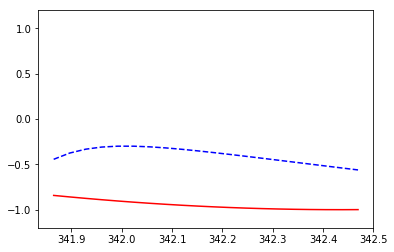

   [[342.50143753 342.53326852 342.56509951 342.5969305  342.62876149
  342.66059248 342.69242347 342.72425445 342.75608544 342.78791643
  342.81974742 342.85157841 342.8834094  342.91524039 342.94707137
  342.97890236 343.01073335 343.04256434 343.07439533 343.10622632]
 [343.13805731 343.16988829 343.20171928 343.23355027 343.26538126
  343.29721225 343.32904324 343.36087423 343.39270522 343.4245362
  343.45636719 343.48819818 343.52002917 343.55186016 343.58369115
  343.61552214 343.64735312 343.67918411 343.7110151  343.74284609]
 [343.77467708 343.80650807 343.83833906 343.87017004 343.90200103
  343.93383202 343.96566301 343.997494   344.02932499 344.06115598
  344.09298696 344.12481795 344.15664894 344.18847993 344.22031092
  344.25214191 344.2839729  344.31580389 344.34763487 344.37946586]
 [344.41129685 344.44312784 344.47495883 344.50678982 344.53862081
  344.57045179 344.60228278 344.63411377 344.66594476 344.69777575
  344.72960674 344.76143773 344.79326871 344.8250997  344

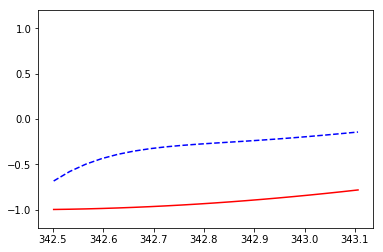

   [[343.13805731 343.16988829 343.20171928 343.23355027 343.26538126
  343.29721225 343.32904324 343.36087423 343.39270522 343.4245362
  343.45636719 343.48819818 343.52002917 343.55186016 343.58369115
  343.61552214 343.64735312 343.67918411 343.7110151  343.74284609]
 [343.77467708 343.80650807 343.83833906 343.87017004 343.90200103
  343.93383202 343.96566301 343.997494   344.02932499 344.06115598
  344.09298696 344.12481795 344.15664894 344.18847993 344.22031092
  344.25214191 344.2839729  344.31580389 344.34763487 344.37946586]
 [344.41129685 344.44312784 344.47495883 344.50678982 344.53862081
  344.57045179 344.60228278 344.63411377 344.66594476 344.69777575
  344.72960674 344.76143773 344.79326871 344.8250997  344.85693069
  344.88876168 344.92059267 344.95242366 344.98425465 345.01608563]
 [345.04791662 345.07974761 345.1115786  345.14340959 345.17524058
  345.20707157 345.23890255 345.27073354 345.30256453 345.33439552
  345.36622651 345.3980575  345.42988849 345.46171948 345

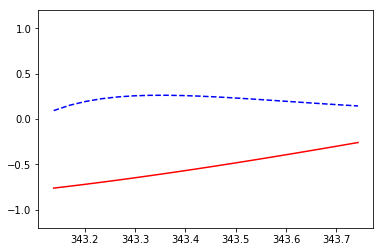

   [[343.77467708 343.80650807 343.83833906 343.87017004 343.90200103
  343.93383202 343.96566301 343.997494   344.02932499 344.06115598
  344.09298696 344.12481795 344.15664894 344.18847993 344.22031092
  344.25214191 344.2839729  344.31580389 344.34763487 344.37946586]
 [344.41129685 344.44312784 344.47495883 344.50678982 344.53862081
  344.57045179 344.60228278 344.63411377 344.66594476 344.69777575
  344.72960674 344.76143773 344.79326871 344.8250997  344.85693069
  344.88876168 344.92059267 344.95242366 344.98425465 345.01608563]
 [345.04791662 345.07974761 345.1115786  345.14340959 345.17524058
  345.20707157 345.23890255 345.27073354 345.30256453 345.33439552
  345.36622651 345.3980575  345.42988849 345.46171948 345.49355046
  345.52538145 345.55721244 345.58904343 345.62087442 345.65270541]
 [345.6845364  345.71636738 345.74819837 345.78002936 345.81186035
  345.84369134 345.87552233 345.90735332 345.9391843  345.97101529
  346.00284628 346.03467727 346.06650826 346.09833925 34

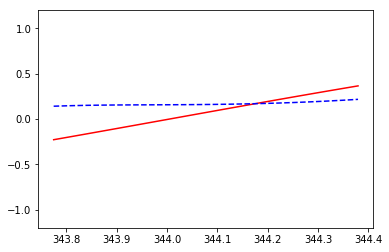

   [[344.41129685 344.44312784 344.47495883 344.50678982 344.53862081
  344.57045179 344.60228278 344.63411377 344.66594476 344.69777575
  344.72960674 344.76143773 344.79326871 344.8250997  344.85693069
  344.88876168 344.92059267 344.95242366 344.98425465 345.01608563]
 [345.04791662 345.07974761 345.1115786  345.14340959 345.17524058
  345.20707157 345.23890255 345.27073354 345.30256453 345.33439552
  345.36622651 345.3980575  345.42988849 345.46171948 345.49355046
  345.52538145 345.55721244 345.58904343 345.62087442 345.65270541]
 [345.6845364  345.71636738 345.74819837 345.78002936 345.81186035
  345.84369134 345.87552233 345.90735332 345.9391843  345.97101529
  346.00284628 346.03467727 346.06650826 346.09833925 346.13017024
  346.16200122 346.19383221 346.2256632  346.25749419 346.28932518]
 [346.32115617 346.35298716 346.38481815 346.41664913 346.44848012
  346.48031111 346.5121421  346.54397309 346.57580408 346.60763507
  346.63946605 346.67129704 346.70312803 346.73495902 34

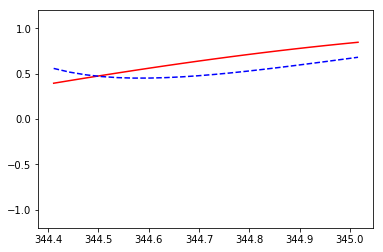

   [[345.04791662 345.07974761 345.1115786  345.14340959 345.17524058
  345.20707157 345.23890255 345.27073354 345.30256453 345.33439552
  345.36622651 345.3980575  345.42988849 345.46171948 345.49355046
  345.52538145 345.55721244 345.58904343 345.62087442 345.65270541]
 [345.6845364  345.71636738 345.74819837 345.78002936 345.81186035
  345.84369134 345.87552233 345.90735332 345.9391843  345.97101529
  346.00284628 346.03467727 346.06650826 346.09833925 346.13017024
  346.16200122 346.19383221 346.2256632  346.25749419 346.28932518]
 [346.32115617 346.35298716 346.38481815 346.41664913 346.44848012
  346.48031111 346.5121421  346.54397309 346.57580408 346.60763507
  346.63946605 346.67129704 346.70312803 346.73495902 346.76679001
  346.798621   346.83045199 346.86228297 346.89411396 346.92594495]
 [346.95777594 346.98960693 347.02143792 347.05326891 347.08509989
  347.11693088 347.14876187 347.18059286 347.21242385 347.24425484
  347.27608583 347.30791682 347.3397478  347.37157879 34

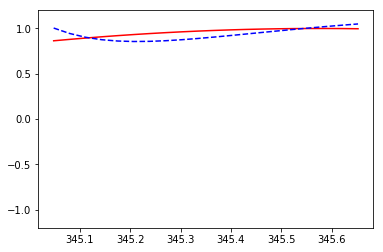

   0.069666736
   [[345.6845364  345.71636738 345.74819837 345.78002936 345.81186035
  345.84369134 345.87552233 345.90735332 345.9391843  345.97101529
  346.00284628 346.03467727 346.06650826 346.09833925 346.13017024
  346.16200122 346.19383221 346.2256632  346.25749419 346.28932518]
 [346.32115617 346.35298716 346.38481815 346.41664913 346.44848012
  346.48031111 346.5121421  346.54397309 346.57580408 346.60763507
  346.63946605 346.67129704 346.70312803 346.73495902 346.76679001
  346.798621   346.83045199 346.86228297 346.89411396 346.92594495]
 [346.95777594 346.98960693 347.02143792 347.05326891 347.08509989
  347.11693088 347.14876187 347.18059286 347.21242385 347.24425484
  347.27608583 347.30791682 347.3397478  347.37157879 347.40340978
  347.43524077 347.46707176 347.49890275 347.53073374 347.56256472]
 [347.59439571 347.6262267  347.65805769 347.68988868 347.72171967
  347.75355066 347.78538164 347.81721263 347.84904362 347.88087461
  347.9127056  347.94453659 347.97636758 

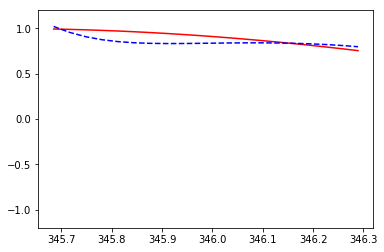

   [[346.32115617 346.35298716 346.38481815 346.41664913 346.44848012
  346.48031111 346.5121421  346.54397309 346.57580408 346.60763507
  346.63946605 346.67129704 346.70312803 346.73495902 346.76679001
  346.798621   346.83045199 346.86228297 346.89411396 346.92594495]
 [346.95777594 346.98960693 347.02143792 347.05326891 347.08509989
  347.11693088 347.14876187 347.18059286 347.21242385 347.24425484
  347.27608583 347.30791682 347.3397478  347.37157879 347.40340978
  347.43524077 347.46707176 347.49890275 347.53073374 347.56256472]
 [347.59439571 347.6262267  347.65805769 347.68988868 347.72171967
  347.75355066 347.78538164 347.81721263 347.84904362 347.88087461
  347.9127056  347.94453659 347.97636758 348.00819856 348.04002955
  348.07186054 348.10369153 348.13552252 348.16735351 348.1991845 ]
 [348.23101549 348.26284647 348.29467746 348.32650845 348.35833944
  348.39017043 348.42200142 348.45383241 348.48566339 348.51749438
  348.54932537 348.58115636 348.61298735 348.64481834 34

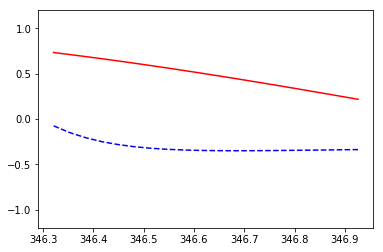

   [[346.95777594 346.98960693 347.02143792 347.05326891 347.08509989
  347.11693088 347.14876187 347.18059286 347.21242385 347.24425484
  347.27608583 347.30791682 347.3397478  347.37157879 347.40340978
  347.43524077 347.46707176 347.49890275 347.53073374 347.56256472]
 [347.59439571 347.6262267  347.65805769 347.68988868 347.72171967
  347.75355066 347.78538164 347.81721263 347.84904362 347.88087461
  347.9127056  347.94453659 347.97636758 348.00819856 348.04002955
  348.07186054 348.10369153 348.13552252 348.16735351 348.1991845 ]
 [348.23101549 348.26284647 348.29467746 348.32650845 348.35833944
  348.39017043 348.42200142 348.45383241 348.48566339 348.51749438
  348.54932537 348.58115636 348.61298735 348.64481834 348.67664933
  348.70848031 348.7403113  348.77214229 348.80397328 348.83580427]
 [348.86763526 348.89946625 348.93129723 348.96312822 348.99495921
  349.0267902  349.05862119 349.09045218 349.12228317 349.15411416
  349.18594514 349.21777613 349.24960712 349.28143811 34

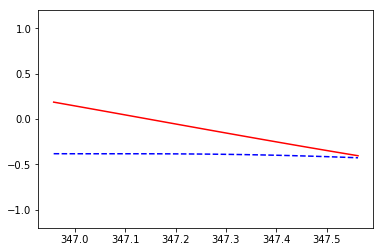

   [[347.59439571 347.6262267  347.65805769 347.68988868 347.72171967
  347.75355066 347.78538164 347.81721263 347.84904362 347.88087461
  347.9127056  347.94453659 347.97636758 348.00819856 348.04002955
  348.07186054 348.10369153 348.13552252 348.16735351 348.1991845 ]
 [348.23101549 348.26284647 348.29467746 348.32650845 348.35833944
  348.39017043 348.42200142 348.45383241 348.48566339 348.51749438
  348.54932537 348.58115636 348.61298735 348.64481834 348.67664933
  348.70848031 348.7403113  348.77214229 348.80397328 348.83580427]
 [348.86763526 348.89946625 348.93129723 348.96312822 348.99495921
  349.0267902  349.05862119 349.09045218 349.12228317 349.15411416
  349.18594514 349.21777613 349.24960712 349.28143811 349.3132691
  349.34510009 349.37693108 349.40876206 349.44059305 349.47242404]
 [349.50425503 349.53608602 349.56791701 349.599748   349.63157898
  349.66340997 349.69524096 349.72707195 349.75890294 349.79073393
  349.82256492 349.8543959  349.88622689 349.91805788 349

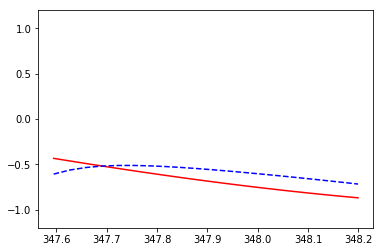

   [[348.23101549 348.26284647 348.29467746 348.32650845 348.35833944
  348.39017043 348.42200142 348.45383241 348.48566339 348.51749438
  348.54932537 348.58115636 348.61298735 348.64481834 348.67664933
  348.70848031 348.7403113  348.77214229 348.80397328 348.83580427]
 [348.86763526 348.89946625 348.93129723 348.96312822 348.99495921
  349.0267902  349.05862119 349.09045218 349.12228317 349.15411416
  349.18594514 349.21777613 349.24960712 349.28143811 349.3132691
  349.34510009 349.37693108 349.40876206 349.44059305 349.47242404]
 [349.50425503 349.53608602 349.56791701 349.599748   349.63157898
  349.66340997 349.69524096 349.72707195 349.75890294 349.79073393
  349.82256492 349.8543959  349.88622689 349.91805788 349.94988887
  349.98171986 350.01355085 350.04538184 350.07721282 350.10904381]
 [350.1408748  350.17270579 350.20453678 350.23636777 350.26819876
  350.30002975 350.33186073 350.36369172 350.39552271 350.4273537
  350.45918469 350.49101568 350.52284667 350.55467765 350.

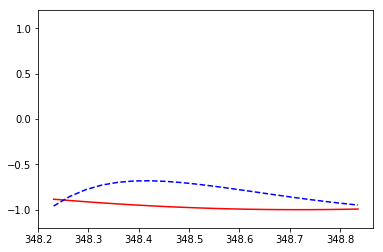

   [[348.86763526 348.89946625 348.93129723 348.96312822 348.99495921
  349.0267902  349.05862119 349.09045218 349.12228317 349.15411416
  349.18594514 349.21777613 349.24960712 349.28143811 349.3132691
  349.34510009 349.37693108 349.40876206 349.44059305 349.47242404]
 [349.50425503 349.53608602 349.56791701 349.599748   349.63157898
  349.66340997 349.69524096 349.72707195 349.75890294 349.79073393
  349.82256492 349.8543959  349.88622689 349.91805788 349.94988887
  349.98171986 350.01355085 350.04538184 350.07721282 350.10904381]
 [350.1408748  350.17270579 350.20453678 350.23636777 350.26819876
  350.30002975 350.33186073 350.36369172 350.39552271 350.4273537
  350.45918469 350.49101568 350.52284667 350.55467765 350.58650864
  350.61833963 350.65017062 350.68200161 350.7138326  350.74566359]
 [350.77749457 350.80932556 350.84115655 350.87298754 350.90481853
  350.93664952 350.96848051 351.00031149 351.03214248 351.06397347
  351.09580446 351.12763545 351.15946644 351.19129743 351.

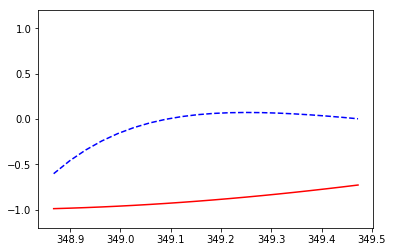

   [[349.50425503 349.53608602 349.56791701 349.599748   349.63157898
  349.66340997 349.69524096 349.72707195 349.75890294 349.79073393
  349.82256492 349.8543959  349.88622689 349.91805788 349.94988887
  349.98171986 350.01355085 350.04538184 350.07721282 350.10904381]
 [350.1408748  350.17270579 350.20453678 350.23636777 350.26819876
  350.30002975 350.33186073 350.36369172 350.39552271 350.4273537
  350.45918469 350.49101568 350.52284667 350.55467765 350.58650864
  350.61833963 350.65017062 350.68200161 350.7138326  350.74566359]
 [350.77749457 350.80932556 350.84115655 350.87298754 350.90481853
  350.93664952 350.96848051 351.00031149 351.03214248 351.06397347
  351.09580446 351.12763545 351.15946644 351.19129743 351.22312842
  351.2549594  351.28679039 351.31862138 351.35045237 351.38228336]
 [351.41411435 351.44594534 351.47777632 351.50960731 351.5414383
  351.57326929 351.60510028 351.63693127 351.66876226 351.70059324
  351.73242423 351.76425522 351.79608621 351.8279172  351.

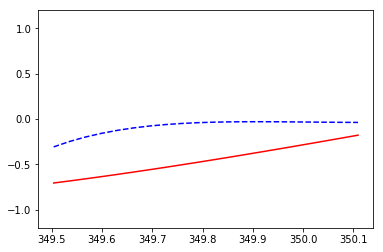

   [[350.1408748  350.17270579 350.20453678 350.23636777 350.26819876
  350.30002975 350.33186073 350.36369172 350.39552271 350.4273537
  350.45918469 350.49101568 350.52284667 350.55467765 350.58650864
  350.61833963 350.65017062 350.68200161 350.7138326  350.74566359]
 [350.77749457 350.80932556 350.84115655 350.87298754 350.90481853
  350.93664952 350.96848051 351.00031149 351.03214248 351.06397347
  351.09580446 351.12763545 351.15946644 351.19129743 351.22312842
  351.2549594  351.28679039 351.31862138 351.35045237 351.38228336]
 [351.41411435 351.44594534 351.47777632 351.50960731 351.5414383
  351.57326929 351.60510028 351.63693127 351.66876226 351.70059324
  351.73242423 351.76425522 351.79608621 351.8279172  351.85974819
  351.89157918 351.92341016 351.95524115 351.98707214 352.01890313]
 [352.05073412 352.08256511 352.1143961  352.14622709 352.17805807
  352.20988906 352.24172005 352.27355104 352.30538203 352.33721302
  352.36904401 352.40087499 352.43270598 352.46453697 352.

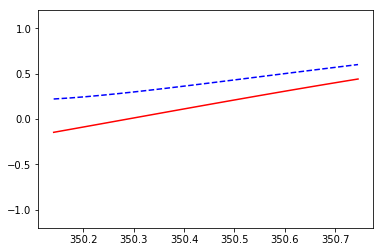

   [[350.77749457 350.80932556 350.84115655 350.87298754 350.90481853
  350.93664952 350.96848051 351.00031149 351.03214248 351.06397347
  351.09580446 351.12763545 351.15946644 351.19129743 351.22312842
  351.2549594  351.28679039 351.31862138 351.35045237 351.38228336]
 [351.41411435 351.44594534 351.47777632 351.50960731 351.5414383
  351.57326929 351.60510028 351.63693127 351.66876226 351.70059324
  351.73242423 351.76425522 351.79608621 351.8279172  351.85974819
  351.89157918 351.92341016 351.95524115 351.98707214 352.01890313]
 [352.05073412 352.08256511 352.1143961  352.14622709 352.17805807
  352.20988906 352.24172005 352.27355104 352.30538203 352.33721302
  352.36904401 352.40087499 352.43270598 352.46453697 352.49636796
  352.52819895 352.56002994 352.59186093 352.62369191 352.6555229 ]
 [352.68735389 352.71918488 352.75101587 352.78284686 352.81467785
  352.84650883 352.87833982 352.91017081 352.9420018  352.97383279
  353.00566378 353.03749477 353.06932576 353.10115674 353

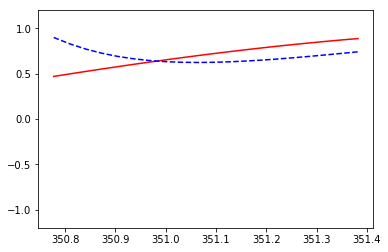

   [[351.41411435 351.44594534 351.47777632 351.50960731 351.5414383
  351.57326929 351.60510028 351.63693127 351.66876226 351.70059324
  351.73242423 351.76425522 351.79608621 351.8279172  351.85974819
  351.89157918 351.92341016 351.95524115 351.98707214 352.01890313]
 [352.05073412 352.08256511 352.1143961  352.14622709 352.17805807
  352.20988906 352.24172005 352.27355104 352.30538203 352.33721302
  352.36904401 352.40087499 352.43270598 352.46453697 352.49636796
  352.52819895 352.56002994 352.59186093 352.62369191 352.6555229 ]
 [352.68735389 352.71918488 352.75101587 352.78284686 352.81467785
  352.84650883 352.87833982 352.91017081 352.9420018  352.97383279
  353.00566378 353.03749477 353.06932576 353.10115674 353.13298773
  353.16481872 353.19664971 353.2284807  353.26031169 353.29214268]
 [353.32397366 353.35580465 353.38763564 353.41946663 353.45129762
  353.48312861 353.5149596  353.54679058 353.57862157 353.61045256
  353.64228355 353.67411454 353.70594553 353.73777652 353

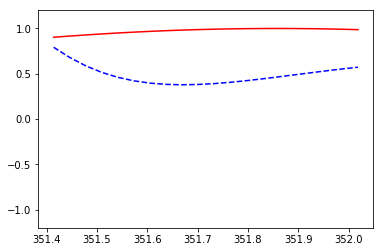

   0.07248094
   [[352.05073412 352.08256511 352.1143961  352.14622709 352.17805807
  352.20988906 352.24172005 352.27355104 352.30538203 352.33721302
  352.36904401 352.40087499 352.43270598 352.46453697 352.49636796
  352.52819895 352.56002994 352.59186093 352.62369191 352.6555229 ]
 [352.68735389 352.71918488 352.75101587 352.78284686 352.81467785
  352.84650883 352.87833982 352.91017081 352.9420018  352.97383279
  353.00566378 353.03749477 353.06932576 353.10115674 353.13298773
  353.16481872 353.19664971 353.2284807  353.26031169 353.29214268]
 [353.32397366 353.35580465 353.38763564 353.41946663 353.45129762
  353.48312861 353.5149596  353.54679058 353.57862157 353.61045256
  353.64228355 353.67411454 353.70594553 353.73777652 353.7696075
  353.80143849 353.83326948 353.86510047 353.89693146 353.92876245]
 [353.96059344 353.99242442 354.02425541 354.0560864  354.08791739
  354.11974838 354.15157937 354.18341036 354.21524135 354.24707233
  354.27890332 354.31073431 354.3425653  35

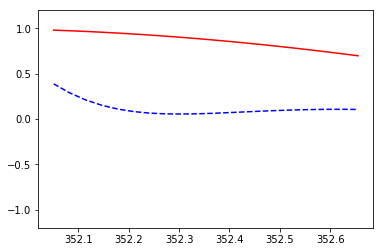

   [[352.68735389 352.71918488 352.75101587 352.78284686 352.81467785
  352.84650883 352.87833982 352.91017081 352.9420018  352.97383279
  353.00566378 353.03749477 353.06932576 353.10115674 353.13298773
  353.16481872 353.19664971 353.2284807  353.26031169 353.29214268]
 [353.32397366 353.35580465 353.38763564 353.41946663 353.45129762
  353.48312861 353.5149596  353.54679058 353.57862157 353.61045256
  353.64228355 353.67411454 353.70594553 353.73777652 353.7696075
  353.80143849 353.83326948 353.86510047 353.89693146 353.92876245]
 [353.96059344 353.99242442 354.02425541 354.0560864  354.08791739
  354.11974838 354.15157937 354.18341036 354.21524135 354.24707233
  354.27890332 354.31073431 354.3425653  354.37439629 354.40622728
  354.43805827 354.46988925 354.50172024 354.53355123 354.56538222]
 [354.59721321 354.6290442  354.66087519 354.69270617 354.72453716
  354.75636815 354.78819914 354.82003013 354.85186112 354.88369211
  354.91552309 354.94735408 354.97918507 355.01101606 355

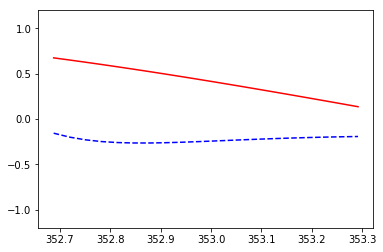

   [[353.32397366 353.35580465 353.38763564 353.41946663 353.45129762
  353.48312861 353.5149596  353.54679058 353.57862157 353.61045256
  353.64228355 353.67411454 353.70594553 353.73777652 353.7696075
  353.80143849 353.83326948 353.86510047 353.89693146 353.92876245]
 [353.96059344 353.99242442 354.02425541 354.0560864  354.08791739
  354.11974838 354.15157937 354.18341036 354.21524135 354.24707233
  354.27890332 354.31073431 354.3425653  354.37439629 354.40622728
  354.43805827 354.46988925 354.50172024 354.53355123 354.56538222]
 [354.59721321 354.6290442  354.66087519 354.69270617 354.72453716
  354.75636815 354.78819914 354.82003013 354.85186112 354.88369211
  354.91552309 354.94735408 354.97918507 355.01101606 355.04284705
  355.07467804 355.10650903 355.13834002 355.170171   355.20200199]
 [355.23383298 355.26566397 355.29749496 355.32932595 355.36115694
  355.39298792 355.42481891 355.4566499  355.48848089 355.52031188
  355.55214287 355.58397386 355.61580484 355.64763583 355

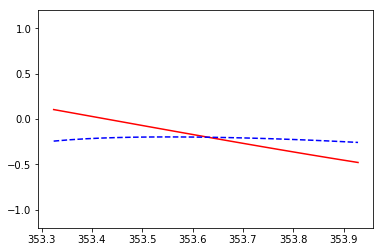

   [[353.96059344 353.99242442 354.02425541 354.0560864  354.08791739
  354.11974838 354.15157937 354.18341036 354.21524135 354.24707233
  354.27890332 354.31073431 354.3425653  354.37439629 354.40622728
  354.43805827 354.46988925 354.50172024 354.53355123 354.56538222]
 [354.59721321 354.6290442  354.66087519 354.69270617 354.72453716
  354.75636815 354.78819914 354.82003013 354.85186112 354.88369211
  354.91552309 354.94735408 354.97918507 355.01101606 355.04284705
  355.07467804 355.10650903 355.13834002 355.170171   355.20200199]
 [355.23383298 355.26566397 355.29749496 355.32932595 355.36115694
  355.39298792 355.42481891 355.4566499  355.48848089 355.52031188
  355.55214287 355.58397386 355.61580484 355.64763583 355.67946682
  355.71129781 355.7431288  355.77495979 355.80679078 355.83862176]
 [355.87045275 355.90228374 355.93411473 355.96594572 355.99777671
  356.0296077  356.06143869 356.09326967 356.12510066 356.15693165
  356.18876264 356.22059363 356.25242462 356.28425561 35

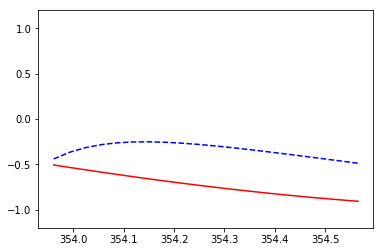

   [[354.59721321 354.6290442  354.66087519 354.69270617 354.72453716
  354.75636815 354.78819914 354.82003013 354.85186112 354.88369211
  354.91552309 354.94735408 354.97918507 355.01101606 355.04284705
  355.07467804 355.10650903 355.13834002 355.170171   355.20200199]
 [355.23383298 355.26566397 355.29749496 355.32932595 355.36115694
  355.39298792 355.42481891 355.4566499  355.48848089 355.52031188
  355.55214287 355.58397386 355.61580484 355.64763583 355.67946682
  355.71129781 355.7431288  355.77495979 355.80679078 355.83862176]
 [355.87045275 355.90228374 355.93411473 355.96594572 355.99777671
  356.0296077  356.06143869 356.09326967 356.12510066 356.15693165
  356.18876264 356.22059363 356.25242462 356.28425561 356.31608659
  356.34791758 356.37974857 356.41157956 356.44341055 356.47524154]
 [356.50707253 356.53890351 356.5707345  356.60256549 356.63439648
  356.66622747 356.69805846 356.72988945 356.76172043 356.79355142
  356.82538241 356.8572134  356.88904439 356.92087538 35

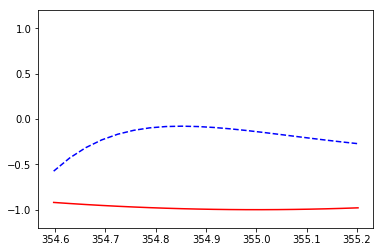

   [[355.23383298 355.26566397 355.29749496 355.32932595 355.36115694
  355.39298792 355.42481891 355.4566499  355.48848089 355.52031188
  355.55214287 355.58397386 355.61580484 355.64763583 355.67946682
  355.71129781 355.7431288  355.77495979 355.80679078 355.83862176]
 [355.87045275 355.90228374 355.93411473 355.96594572 355.99777671
  356.0296077  356.06143869 356.09326967 356.12510066 356.15693165
  356.18876264 356.22059363 356.25242462 356.28425561 356.31608659
  356.34791758 356.37974857 356.41157956 356.44341055 356.47524154]
 [356.50707253 356.53890351 356.5707345  356.60256549 356.63439648
  356.66622747 356.69805846 356.72988945 356.76172043 356.79355142
  356.82538241 356.8572134  356.88904439 356.92087538 356.95270637
  356.98453736 357.01636834 357.04819933 357.08003032 357.11186131]
 [357.1436923  357.17552329 357.20735428 357.23918526 357.27101625
  357.30284724 357.33467823 357.36650922 357.39834021 357.4301712
  357.46200218 357.49383317 357.52566416 357.55749515 357

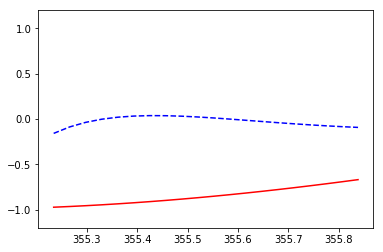

   [[355.87045275 355.90228374 355.93411473 355.96594572 355.99777671
  356.0296077  356.06143869 356.09326967 356.12510066 356.15693165
  356.18876264 356.22059363 356.25242462 356.28425561 356.31608659
  356.34791758 356.37974857 356.41157956 356.44341055 356.47524154]
 [356.50707253 356.53890351 356.5707345  356.60256549 356.63439648
  356.66622747 356.69805846 356.72988945 356.76172043 356.79355142
  356.82538241 356.8572134  356.88904439 356.92087538 356.95270637
  356.98453736 357.01636834 357.04819933 357.08003032 357.11186131]
 [357.1436923  357.17552329 357.20735428 357.23918526 357.27101625
  357.30284724 357.33467823 357.36650922 357.39834021 357.4301712
  357.46200218 357.49383317 357.52566416 357.55749515 357.58932614
  357.62115713 357.65298812 357.6848191  357.71665009 357.74848108]
 [357.78031207 357.81214306 357.84397405 357.87580504 357.90763603
  357.93946701 357.971298   358.00312899 358.03495998 358.06679097
  358.09862196 358.13045295 358.16228393 358.19411492 358

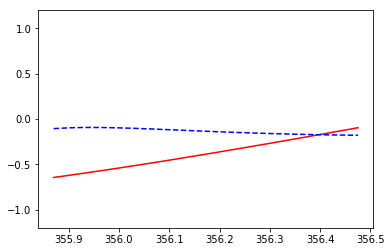

   [[356.50707253 356.53890351 356.5707345  356.60256549 356.63439648
  356.66622747 356.69805846 356.72988945 356.76172043 356.79355142
  356.82538241 356.8572134  356.88904439 356.92087538 356.95270637
  356.98453736 357.01636834 357.04819933 357.08003032 357.11186131]
 [357.1436923  357.17552329 357.20735428 357.23918526 357.27101625
  357.30284724 357.33467823 357.36650922 357.39834021 357.4301712
  357.46200218 357.49383317 357.52566416 357.55749515 357.58932614
  357.62115713 357.65298812 357.6848191  357.71665009 357.74848108]
 [357.78031207 357.81214306 357.84397405 357.87580504 357.90763603
  357.93946701 357.971298   358.00312899 358.03495998 358.06679097
  358.09862196 358.13045295 358.16228393 358.19411492 358.22594591
  358.2577769  358.28960789 358.32143888 358.35326987 358.38510085]
 [358.41693184 358.44876283 358.48059382 358.51242481 358.5442558
  358.57608679 358.60791777 358.63974876 358.67157975 358.70341074
  358.73524173 358.76707272 358.79890371 358.83073469 358.

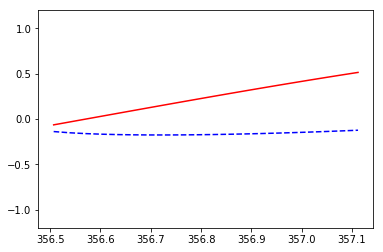

   [[357.1436923  357.17552329 357.20735428 357.23918526 357.27101625
  357.30284724 357.33467823 357.36650922 357.39834021 357.4301712
  357.46200218 357.49383317 357.52566416 357.55749515 357.58932614
  357.62115713 357.65298812 357.6848191  357.71665009 357.74848108]
 [357.78031207 357.81214306 357.84397405 357.87580504 357.90763603
  357.93946701 357.971298   358.00312899 358.03495998 358.06679097
  358.09862196 358.13045295 358.16228393 358.19411492 358.22594591
  358.2577769  358.28960789 358.32143888 358.35326987 358.38510085]
 [358.41693184 358.44876283 358.48059382 358.51242481 358.5442558
  358.57608679 358.60791777 358.63974876 358.67157975 358.70341074
  358.73524173 358.76707272 358.79890371 358.83073469 358.86256568
  358.89439667 358.92622766 358.95805865 358.98988964 359.02172063]
 [359.05355162 359.0853826  359.11721359 359.14904458 359.18087557
  359.21270656 359.24453755 359.27636854 359.30819952 359.34003051
  359.3718615  359.40369249 359.43552348 359.46735447 359.

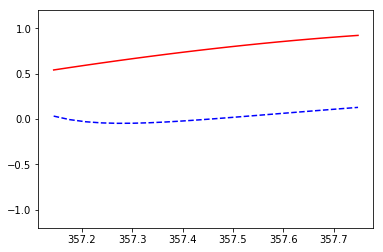

   [[357.78031207 357.81214306 357.84397405 357.87580504 357.90763603
  357.93946701 357.971298   358.00312899 358.03495998 358.06679097
  358.09862196 358.13045295 358.16228393 358.19411492 358.22594591
  358.2577769  358.28960789 358.32143888 358.35326987 358.38510085]
 [358.41693184 358.44876283 358.48059382 358.51242481 358.5442558
  358.57608679 358.60791777 358.63974876 358.67157975 358.70341074
  358.73524173 358.76707272 358.79890371 358.83073469 358.86256568
  358.89439667 358.92622766 358.95805865 358.98988964 359.02172063]
 [359.05355162 359.0853826  359.11721359 359.14904458 359.18087557
  359.21270656 359.24453755 359.27636854 359.30819952 359.34003051
  359.3718615  359.40369249 359.43552348 359.46735447 359.49918546
  359.53101644 359.56284743 359.59467842 359.62650941 359.6583404 ]
 [359.69017139 359.72200238 359.75383336 359.78566435 359.81749534
  359.84932633 359.88115732 359.91298831 359.9448193  359.97665029
  360.00848127 360.04031226 360.07214325 360.10397424 360

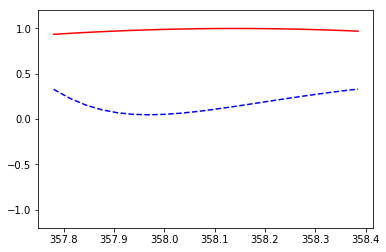

   0.1789027
   [[358.41693184 358.44876283 358.48059382 358.51242481 358.5442558
  358.57608679 358.60791777 358.63974876 358.67157975 358.70341074
  358.73524173 358.76707272 358.79890371 358.83073469 358.86256568
  358.89439667 358.92622766 358.95805865 358.98988964 359.02172063]
 [359.05355162 359.0853826  359.11721359 359.14904458 359.18087557
  359.21270656 359.24453755 359.27636854 359.30819952 359.34003051
  359.3718615  359.40369249 359.43552348 359.46735447 359.49918546
  359.53101644 359.56284743 359.59467842 359.62650941 359.6583404 ]
 [359.69017139 359.72200238 359.75383336 359.78566435 359.81749534
  359.84932633 359.88115732 359.91298831 359.9448193  359.97665029
  360.00848127 360.04031226 360.07214325 360.10397424 360.13580523
  360.16763622 360.19946721 360.23129819 360.26312918 360.29496017]
 [360.32679116 360.35862215 360.39045314 360.42228413 360.45411511
  360.4859461  360.51777709 360.54960808 360.58143907 360.61327006
  360.64510105 360.67693203 360.70876302 360

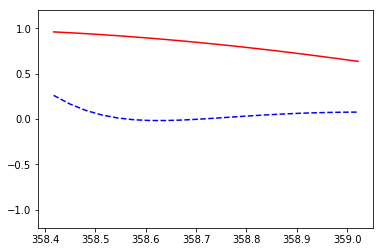

   [[359.05355162 359.0853826  359.11721359 359.14904458 359.18087557
  359.21270656 359.24453755 359.27636854 359.30819952 359.34003051
  359.3718615  359.40369249 359.43552348 359.46735447 359.49918546
  359.53101644 359.56284743 359.59467842 359.62650941 359.6583404 ]
 [359.69017139 359.72200238 359.75383336 359.78566435 359.81749534
  359.84932633 359.88115732 359.91298831 359.9448193  359.97665029
  360.00848127 360.04031226 360.07214325 360.10397424 360.13580523
  360.16763622 360.19946721 360.23129819 360.26312918 360.29496017]
 [360.32679116 360.35862215 360.39045314 360.42228413 360.45411511
  360.4859461  360.51777709 360.54960808 360.58143907 360.61327006
  360.64510105 360.67693203 360.70876302 360.74059401 360.772425
  360.80425599 360.83608698 360.86791797 360.89974896 360.93157994]
 [360.96341093 360.99524192 361.02707291 361.0589039  361.09073489
  361.12256588 361.15439686 361.18622785 361.21805884 361.24988983
  361.28172082 361.31355181 361.3453828  361.37721378 361.

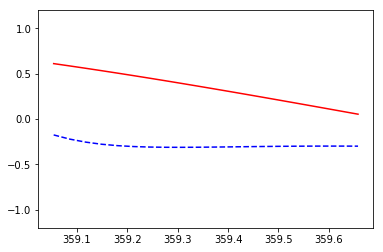

   [[359.69017139 359.72200238 359.75383336 359.78566435 359.81749534
  359.84932633 359.88115732 359.91298831 359.9448193  359.97665029
  360.00848127 360.04031226 360.07214325 360.10397424 360.13580523
  360.16763622 360.19946721 360.23129819 360.26312918 360.29496017]
 [360.32679116 360.35862215 360.39045314 360.42228413 360.45411511
  360.4859461  360.51777709 360.54960808 360.58143907 360.61327006
  360.64510105 360.67693203 360.70876302 360.74059401 360.772425
  360.80425599 360.83608698 360.86791797 360.89974896 360.93157994]
 [360.96341093 360.99524192 361.02707291 361.0589039  361.09073489
  361.12256588 361.15439686 361.18622785 361.21805884 361.24988983
  361.28172082 361.31355181 361.3453828  361.37721378 361.40904477
  361.44087576 361.47270675 361.50453774 361.53636873 361.56819972]
 [361.6000307  361.63186169 361.66369268 361.69552367 361.72735466
  361.75918565 361.79101664 361.82284763 361.85467861 361.8865096
  361.91834059 361.95017158 361.98200257 362.01383356 362.0

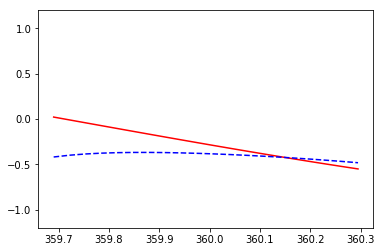

   [[360.32679116 360.35862215 360.39045314 360.42228413 360.45411511
  360.4859461  360.51777709 360.54960808 360.58143907 360.61327006
  360.64510105 360.67693203 360.70876302 360.74059401 360.772425
  360.80425599 360.83608698 360.86791797 360.89974896 360.93157994]
 [360.96341093 360.99524192 361.02707291 361.0589039  361.09073489
  361.12256588 361.15439686 361.18622785 361.21805884 361.24988983
  361.28172082 361.31355181 361.3453828  361.37721378 361.40904477
  361.44087576 361.47270675 361.50453774 361.53636873 361.56819972]
 [361.6000307  361.63186169 361.66369268 361.69552367 361.72735466
  361.75918565 361.79101664 361.82284763 361.85467861 361.8865096
  361.91834059 361.95017158 361.98200257 362.01383356 362.04566455
  362.07749553 362.10932652 362.14115751 362.1729885  362.20481949]
 [362.23665048 362.26848147 362.30031245 362.33214344 362.36397443
  362.39580542 362.42763641 362.4594674  362.49129839 362.52312937
  362.55496036 362.58679135 362.61862234 362.65045333 362.6

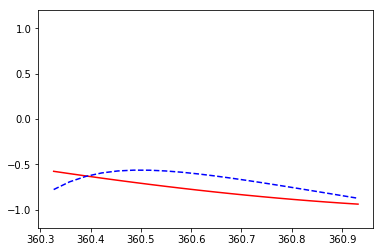

   [[360.96341093 360.99524192 361.02707291 361.0589039  361.09073489
  361.12256588 361.15439686 361.18622785 361.21805884 361.24988983
  361.28172082 361.31355181 361.3453828  361.37721378 361.40904477
  361.44087576 361.47270675 361.50453774 361.53636873 361.56819972]
 [361.6000307  361.63186169 361.66369268 361.69552367 361.72735466
  361.75918565 361.79101664 361.82284763 361.85467861 361.8865096
  361.91834059 361.95017158 361.98200257 362.01383356 362.04566455
  362.07749553 362.10932652 362.14115751 362.1729885  362.20481949]
 [362.23665048 362.26848147 362.30031245 362.33214344 362.36397443
  362.39580542 362.42763641 362.4594674  362.49129839 362.52312937
  362.55496036 362.58679135 362.61862234 362.65045333 362.68228432
  362.71411531 362.7459463  362.77777728 362.80960827 362.84143926]
 [362.87327025 362.90510124 362.93693223 362.96876322 363.0005942
  363.03242519 363.06425618 363.09608717 363.12791816 363.15974915
  363.19158014 363.22341112 363.25524211 363.2870731  363.

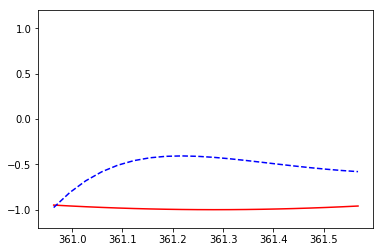

   [[361.6000307  361.63186169 361.66369268 361.69552367 361.72735466
  361.75918565 361.79101664 361.82284763 361.85467861 361.8865096
  361.91834059 361.95017158 361.98200257 362.01383356 362.04566455
  362.07749553 362.10932652 362.14115751 362.1729885  362.20481949]
 [362.23665048 362.26848147 362.30031245 362.33214344 362.36397443
  362.39580542 362.42763641 362.4594674  362.49129839 362.52312937
  362.55496036 362.58679135 362.61862234 362.65045333 362.68228432
  362.71411531 362.7459463  362.77777728 362.80960827 362.84143926]
 [362.87327025 362.90510124 362.93693223 362.96876322 363.0005942
  363.03242519 363.06425618 363.09608717 363.12791816 363.15974915
  363.19158014 363.22341112 363.25524211 363.2870731  363.31890409
  363.35073508 363.38256607 363.41439706 363.44622804 363.47805903]
 [363.50989002 363.54172101 363.573552   363.60538299 363.63721398
  363.66904496 363.70087595 363.73270694 363.76453793 363.79636892
  363.82819991 363.8600309  363.89186189 363.92369287 363.

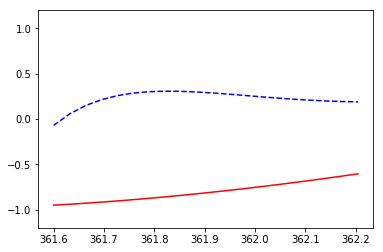

   [[362.23665048 362.26848147 362.30031245 362.33214344 362.36397443
  362.39580542 362.42763641 362.4594674  362.49129839 362.52312937
  362.55496036 362.58679135 362.61862234 362.65045333 362.68228432
  362.71411531 362.7459463  362.77777728 362.80960827 362.84143926]
 [362.87327025 362.90510124 362.93693223 362.96876322 363.0005942
  363.03242519 363.06425618 363.09608717 363.12791816 363.15974915
  363.19158014 363.22341112 363.25524211 363.2870731  363.31890409
  363.35073508 363.38256607 363.41439706 363.44622804 363.47805903]
 [363.50989002 363.54172101 363.573552   363.60538299 363.63721398
  363.66904496 363.70087595 363.73270694 363.76453793 363.79636892
  363.82819991 363.8600309  363.89186189 363.92369287 363.95552386
  363.98735485 364.01918584 364.05101683 364.08284782 364.11467881]
 [364.14650979 364.17834078 364.21017177 364.24200276 364.27383375
  364.30566474 364.33749573 364.36932671 364.4011577  364.43298869
  364.46481968 364.49665067 364.52848166 364.56031265 364

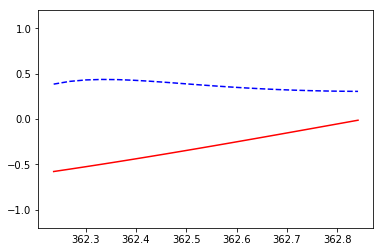

   [[362.87327025 362.90510124 362.93693223 362.96876322 363.0005942
  363.03242519 363.06425618 363.09608717 363.12791816 363.15974915
  363.19158014 363.22341112 363.25524211 363.2870731  363.31890409
  363.35073508 363.38256607 363.41439706 363.44622804 363.47805903]
 [363.50989002 363.54172101 363.573552   363.60538299 363.63721398
  363.66904496 363.70087595 363.73270694 363.76453793 363.79636892
  363.82819991 363.8600309  363.89186189 363.92369287 363.95552386
  363.98735485 364.01918584 364.05101683 364.08284782 364.11467881]
 [364.14650979 364.17834078 364.21017177 364.24200276 364.27383375
  364.30566474 364.33749573 364.36932671 364.4011577  364.43298869
  364.46481968 364.49665067 364.52848166 364.56031265 364.59214363
  364.62397462 364.65580561 364.6876366  364.71946759 364.75129858]
 [364.78312957 364.81496056 364.84679154 364.87862253 364.91045352
  364.94228451 364.9741155  365.00594649 365.03777748 365.06960846
  365.10143945 365.13327044 365.16510143 365.19693242 365

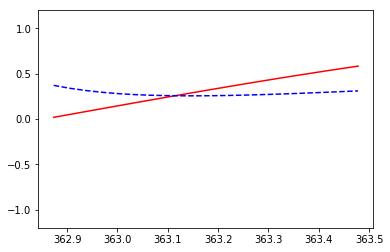

   [[363.50989002 363.54172101 363.573552   363.60538299 363.63721398
  363.66904496 363.70087595 363.73270694 363.76453793 363.79636892
  363.82819991 363.8600309  363.89186189 363.92369287 363.95552386
  363.98735485 364.01918584 364.05101683 364.08284782 364.11467881]
 [364.14650979 364.17834078 364.21017177 364.24200276 364.27383375
  364.30566474 364.33749573 364.36932671 364.4011577  364.43298869
  364.46481968 364.49665067 364.52848166 364.56031265 364.59214363
  364.62397462 364.65580561 364.6876366  364.71946759 364.75129858]
 [364.78312957 364.81496056 364.84679154 364.87862253 364.91045352
  364.94228451 364.9741155  365.00594649 365.03777748 365.06960846
  365.10143945 365.13327044 365.16510143 365.19693242 365.22876341
  365.2605944  365.29242538 365.32425637 365.35608736 365.38791835]
 [365.41974934 365.45158033 365.48341132 365.5152423  365.54707329
  365.57890428 365.61073527 365.64256626 365.67439725 365.70622824
  365.73805923 365.76989021 365.8017212  365.83355219 36

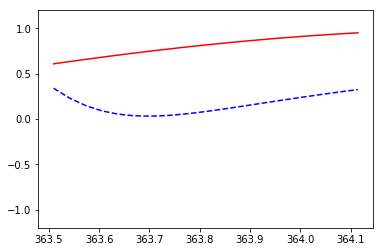

   [[364.14650979 364.17834078 364.21017177 364.24200276 364.27383375
  364.30566474 364.33749573 364.36932671 364.4011577  364.43298869
  364.46481968 364.49665067 364.52848166 364.56031265 364.59214363
  364.62397462 364.65580561 364.6876366  364.71946759 364.75129858]
 [364.78312957 364.81496056 364.84679154 364.87862253 364.91045352
  364.94228451 364.9741155  365.00594649 365.03777748 365.06960846
  365.10143945 365.13327044 365.16510143 365.19693242 365.22876341
  365.2605944  365.29242538 365.32425637 365.35608736 365.38791835]
 [365.41974934 365.45158033 365.48341132 365.5152423  365.54707329
  365.57890428 365.61073527 365.64256626 365.67439725 365.70622824
  365.73805923 365.76989021 365.8017212  365.83355219 365.86538318
  365.89721417 365.92904516 365.96087615 365.99270713 366.02453812]
 [366.05636911 366.0882001  366.12003109 366.15186208 366.18369307
  366.21552405 366.24735504 366.27918603 366.31101702 366.34284801
  366.374679   366.40650999 366.43834097 366.47017196 36

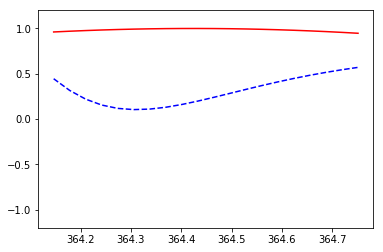

   0.05929455
   [[364.78312957 364.81496056 364.84679154 364.87862253 364.91045352
  364.94228451 364.9741155  365.00594649 365.03777748 365.06960846
  365.10143945 365.13327044 365.16510143 365.19693242 365.22876341
  365.2605944  365.29242538 365.32425637 365.35608736 365.38791835]
 [365.41974934 365.45158033 365.48341132 365.5152423  365.54707329
  365.57890428 365.61073527 365.64256626 365.67439725 365.70622824
  365.73805923 365.76989021 365.8017212  365.83355219 365.86538318
  365.89721417 365.92904516 365.96087615 365.99270713 366.02453812]
 [366.05636911 366.0882001  366.12003109 366.15186208 366.18369307
  366.21552405 366.24735504 366.27918603 366.31101702 366.34284801
  366.374679   366.40650999 366.43834097 366.47017196 366.50200295
  366.53383394 366.56566493 366.59749592 366.62932691 366.6611579 ]
 [366.69298888 366.72481987 366.75665086 366.78848185 366.82031284
  366.85214383 366.88397482 366.9158058  366.94763679 366.97946778
  367.01129877 367.04312976 367.07496075 3

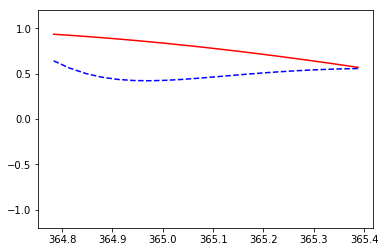

   [[365.41974934 365.45158033 365.48341132 365.5152423  365.54707329
  365.57890428 365.61073527 365.64256626 365.67439725 365.70622824
  365.73805923 365.76989021 365.8017212  365.83355219 365.86538318
  365.89721417 365.92904516 365.96087615 365.99270713 366.02453812]
 [366.05636911 366.0882001  366.12003109 366.15186208 366.18369307
  366.21552405 366.24735504 366.27918603 366.31101702 366.34284801
  366.374679   366.40650999 366.43834097 366.47017196 366.50200295
  366.53383394 366.56566493 366.59749592 366.62932691 366.6611579 ]
 [366.69298888 366.72481987 366.75665086 366.78848185 366.82031284
  366.85214383 366.88397482 366.9158058  366.94763679 366.97946778
  367.01129877 367.04312976 367.07496075 367.10679174 367.13862272
  367.17045371 367.2022847  367.23411569 367.26594668 367.29777767]
 [367.32960866 367.36143964 367.39327063 367.42510162 367.45693261
  367.4887636  367.52059459 367.55242558 367.58425657 367.61608755
  367.64791854 367.67974953 367.71158052 367.74341151 36

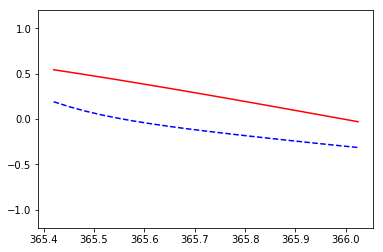

   [[366.05636911 366.0882001  366.12003109 366.15186208 366.18369307
  366.21552405 366.24735504 366.27918603 366.31101702 366.34284801
  366.374679   366.40650999 366.43834097 366.47017196 366.50200295
  366.53383394 366.56566493 366.59749592 366.62932691 366.6611579 ]
 [366.69298888 366.72481987 366.75665086 366.78848185 366.82031284
  366.85214383 366.88397482 366.9158058  366.94763679 366.97946778
  367.01129877 367.04312976 367.07496075 367.10679174 367.13862272
  367.17045371 367.2022847  367.23411569 367.26594668 367.29777767]
 [367.32960866 367.36143964 367.39327063 367.42510162 367.45693261
  367.4887636  367.52059459 367.55242558 367.58425657 367.61608755
  367.64791854 367.67974953 367.71158052 367.74341151 367.7752425
  367.80707349 367.83890447 367.87073546 367.90256645 367.93439744]
 [367.96622843 367.99805942 368.02989041 368.06172139 368.09355238
  368.12538337 368.15721436 368.18904535 368.22087634 368.25270733
  368.28453831 368.3163693  368.34820029 368.38003128 368

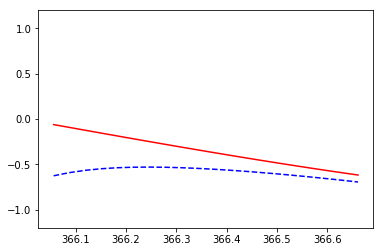

   [[366.69298888 366.72481987 366.75665086 366.78848185 366.82031284
  366.85214383 366.88397482 366.9158058  366.94763679 366.97946778
  367.01129877 367.04312976 367.07496075 367.10679174 367.13862272
  367.17045371 367.2022847  367.23411569 367.26594668 367.29777767]
 [367.32960866 367.36143964 367.39327063 367.42510162 367.45693261
  367.4887636  367.52059459 367.55242558 367.58425657 367.61608755
  367.64791854 367.67974953 367.71158052 367.74341151 367.7752425
  367.80707349 367.83890447 367.87073546 367.90256645 367.93439744]
 [367.96622843 367.99805942 368.02989041 368.06172139 368.09355238
  368.12538337 368.15721436 368.18904535 368.22087634 368.25270733
  368.28453831 368.3163693  368.34820029 368.38003128 368.41186227
  368.44369326 368.47552425 368.50735523 368.53918622 368.57101721]
 [368.6028482  368.63467919 368.66651018 368.69834117 368.73017216
  368.76200314 368.79383413 368.82566512 368.85749611 368.8893271
  368.92115809 368.95298908 368.98482006 369.01665105 369.

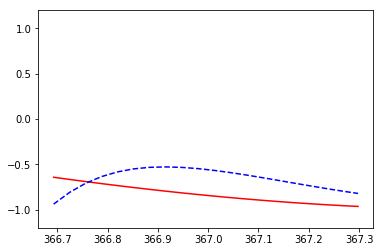

   [[367.32960866 367.36143964 367.39327063 367.42510162 367.45693261
  367.4887636  367.52059459 367.55242558 367.58425657 367.61608755
  367.64791854 367.67974953 367.71158052 367.74341151 367.7752425
  367.80707349 367.83890447 367.87073546 367.90256645 367.93439744]
 [367.96622843 367.99805942 368.02989041 368.06172139 368.09355238
  368.12538337 368.15721436 368.18904535 368.22087634 368.25270733
  368.28453831 368.3163693  368.34820029 368.38003128 368.41186227
  368.44369326 368.47552425 368.50735523 368.53918622 368.57101721]
 [368.6028482  368.63467919 368.66651018 368.69834117 368.73017216
  368.76200314 368.79383413 368.82566512 368.85749611 368.8893271
  368.92115809 368.95298908 368.98482006 369.01665105 369.04848204
  369.08031303 369.11214402 369.14397501 369.175806   369.20763698]
 [369.23946797 369.27129896 369.30312995 369.33496094 369.36679193
  369.39862292 369.4304539  369.46228489 369.49411588 369.52594687
  369.55777786 369.58960885 369.62143984 369.65327083 369.

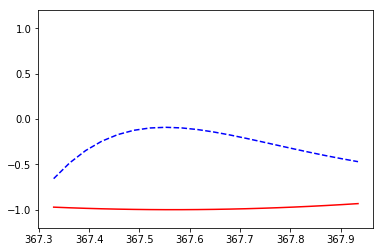

   [[367.96622843 367.99805942 368.02989041 368.06172139 368.09355238
  368.12538337 368.15721436 368.18904535 368.22087634 368.25270733
  368.28453831 368.3163693  368.34820029 368.38003128 368.41186227
  368.44369326 368.47552425 368.50735523 368.53918622 368.57101721]
 [368.6028482  368.63467919 368.66651018 368.69834117 368.73017216
  368.76200314 368.79383413 368.82566512 368.85749611 368.8893271
  368.92115809 368.95298908 368.98482006 369.01665105 369.04848204
  369.08031303 369.11214402 369.14397501 369.175806   369.20763698]
 [369.23946797 369.27129896 369.30312995 369.33496094 369.36679193
  369.39862292 369.4304539  369.46228489 369.49411588 369.52594687
  369.55777786 369.58960885 369.62143984 369.65327083 369.68510181
  369.7169328  369.74876379 369.78059478 369.81242577 369.84425676]
 [369.87608775 369.90791873 369.93974972 369.97158071 370.0034117
  370.03524269 370.06707368 370.09890467 370.13073565 370.16256664
  370.19439763 370.22622862 370.25805961 370.2898906  370.

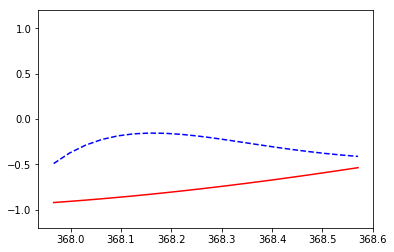

   [[368.6028482  368.63467919 368.66651018 368.69834117 368.73017216
  368.76200314 368.79383413 368.82566512 368.85749611 368.8893271
  368.92115809 368.95298908 368.98482006 369.01665105 369.04848204
  369.08031303 369.11214402 369.14397501 369.175806   369.20763698]
 [369.23946797 369.27129896 369.30312995 369.33496094 369.36679193
  369.39862292 369.4304539  369.46228489 369.49411588 369.52594687
  369.55777786 369.58960885 369.62143984 369.65327083 369.68510181
  369.7169328  369.74876379 369.78059478 369.81242577 369.84425676]
 [369.87608775 369.90791873 369.93974972 369.97158071 370.0034117
  370.03524269 370.06707368 370.09890467 370.13073565 370.16256664
  370.19439763 370.22622862 370.25805961 370.2898906  370.32172159
  370.35355257 370.38538356 370.41721455 370.44904554 370.48087653]
 [370.51270752 370.54453851 370.5763695  370.60820048 370.64003147
  370.67186246 370.70369345 370.73552444 370.76735543 370.79918642
  370.8310174  370.86284839 370.89467938 370.92651037 370.

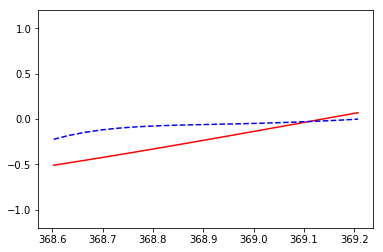

   [[369.23946797 369.27129896 369.30312995 369.33496094 369.36679193
  369.39862292 369.4304539  369.46228489 369.49411588 369.52594687
  369.55777786 369.58960885 369.62143984 369.65327083 369.68510181
  369.7169328  369.74876379 369.78059478 369.81242577 369.84425676]
 [369.87608775 369.90791873 369.93974972 369.97158071 370.0034117
  370.03524269 370.06707368 370.09890467 370.13073565 370.16256664
  370.19439763 370.22622862 370.25805961 370.2898906  370.32172159
  370.35355257 370.38538356 370.41721455 370.44904554 370.48087653]
 [370.51270752 370.54453851 370.5763695  370.60820048 370.64003147
  370.67186246 370.70369345 370.73552444 370.76735543 370.79918642
  370.8310174  370.86284839 370.89467938 370.92651037 370.95834136
  370.99017235 371.02200334 371.05383432 371.08566531 371.1174963 ]
 [371.14932729 371.18115828 371.21298927 371.24482026 371.27665124
  371.30848223 371.34031322 371.37214421 371.4039752  371.43580619
  371.46763718 371.49946817 371.53129915 371.56313014 371

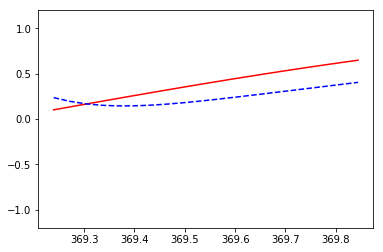

   [[369.87608775 369.90791873 369.93974972 369.97158071 370.0034117
  370.03524269 370.06707368 370.09890467 370.13073565 370.16256664
  370.19439763 370.22622862 370.25805961 370.2898906  370.32172159
  370.35355257 370.38538356 370.41721455 370.44904554 370.48087653]
 [370.51270752 370.54453851 370.5763695  370.60820048 370.64003147
  370.67186246 370.70369345 370.73552444 370.76735543 370.79918642
  370.8310174  370.86284839 370.89467938 370.92651037 370.95834136
  370.99017235 371.02200334 371.05383432 371.08566531 371.1174963 ]
 [371.14932729 371.18115828 371.21298927 371.24482026 371.27665124
  371.30848223 371.34031322 371.37214421 371.4039752  371.43580619
  371.46763718 371.49946817 371.53129915 371.56313014 371.59496113
  371.62679212 371.65862311 371.6904541  371.72228509 371.75411607]
 [371.78594706 371.81777805 371.84960904 371.88144003 371.91327102
  371.94510201 371.97693299 372.00876398 372.04059497 372.07242596
  372.10425695 372.13608794 372.16791893 372.19974991 372

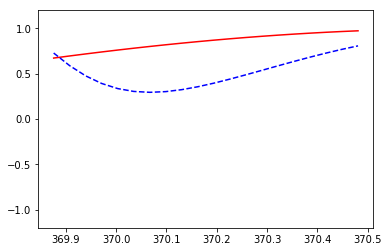

   [[370.51270752 370.54453851 370.5763695  370.60820048 370.64003147
  370.67186246 370.70369345 370.73552444 370.76735543 370.79918642
  370.8310174  370.86284839 370.89467938 370.92651037 370.95834136
  370.99017235 371.02200334 371.05383432 371.08566531 371.1174963 ]
 [371.14932729 371.18115828 371.21298927 371.24482026 371.27665124
  371.30848223 371.34031322 371.37214421 371.4039752  371.43580619
  371.46763718 371.49946817 371.53129915 371.56313014 371.59496113
  371.62679212 371.65862311 371.6904541  371.72228509 371.75411607]
 [371.78594706 371.81777805 371.84960904 371.88144003 371.91327102
  371.94510201 371.97693299 372.00876398 372.04059497 372.07242596
  372.10425695 372.13608794 372.16791893 372.19974991 372.2315809
  372.26341189 372.29524288 372.32707387 372.35890486 372.39073585]
 [372.42256684 372.45439782 372.48622881 372.5180598  372.54989079
  372.58172178 372.61355277 372.64538376 372.67721474 372.70904573
  372.74087672 372.77270771 372.8045387  372.83636969 372

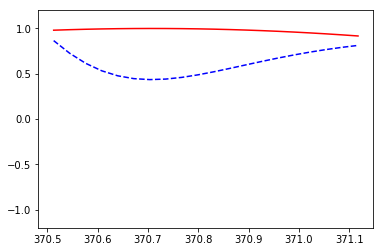

   0.04336509
   [[371.14932729 371.18115828 371.21298927 371.24482026 371.27665124
  371.30848223 371.34031322 371.37214421 371.4039752  371.43580619
  371.46763718 371.49946817 371.53129915 371.56313014 371.59496113
  371.62679212 371.65862311 371.6904541  371.72228509 371.75411607]
 [371.78594706 371.81777805 371.84960904 371.88144003 371.91327102
  371.94510201 371.97693299 372.00876398 372.04059497 372.07242596
  372.10425695 372.13608794 372.16791893 372.19974991 372.2315809
  372.26341189 372.29524288 372.32707387 372.35890486 372.39073585]
 [372.42256684 372.45439782 372.48622881 372.5180598  372.54989079
  372.58172178 372.61355277 372.64538376 372.67721474 372.70904573
  372.74087672 372.77270771 372.8045387  372.83636969 372.86820068
  372.90003166 372.93186265 372.96369364 372.99552463 373.02735562]
 [373.05918661 373.0910176  373.12284858 373.15467957 373.18651056
  373.21834155 373.25017254 373.28200353 373.31383452 373.3456655
  373.37749649 373.40932748 373.44115847 373

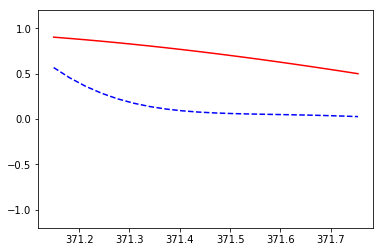

   [[371.78594706 371.81777805 371.84960904 371.88144003 371.91327102
  371.94510201 371.97693299 372.00876398 372.04059497 372.07242596
  372.10425695 372.13608794 372.16791893 372.19974991 372.2315809
  372.26341189 372.29524288 372.32707387 372.35890486 372.39073585]
 [372.42256684 372.45439782 372.48622881 372.5180598  372.54989079
  372.58172178 372.61355277 372.64538376 372.67721474 372.70904573
  372.74087672 372.77270771 372.8045387  372.83636969 372.86820068
  372.90003166 372.93186265 372.96369364 372.99552463 373.02735562]
 [373.05918661 373.0910176  373.12284858 373.15467957 373.18651056
  373.21834155 373.25017254 373.28200353 373.31383452 373.3456655
  373.37749649 373.40932748 373.44115847 373.47298946 373.50482045
  373.53665144 373.56848243 373.60031341 373.6321444  373.66397539]
 [373.69580638 373.72763737 373.75946836 373.79129935 373.82313033
  373.85496132 373.88679231 373.9186233  373.95045429 373.98228528
  374.01411627 374.04594725 374.07777824 374.10960923 374.

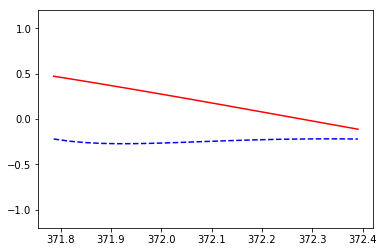

   [[372.42256684 372.45439782 372.48622881 372.5180598  372.54989079
  372.58172178 372.61355277 372.64538376 372.67721474 372.70904573
  372.74087672 372.77270771 372.8045387  372.83636969 372.86820068
  372.90003166 372.93186265 372.96369364 372.99552463 373.02735562]
 [373.05918661 373.0910176  373.12284858 373.15467957 373.18651056
  373.21834155 373.25017254 373.28200353 373.31383452 373.3456655
  373.37749649 373.40932748 373.44115847 373.47298946 373.50482045
  373.53665144 373.56848243 373.60031341 373.6321444  373.66397539]
 [373.69580638 373.72763737 373.75946836 373.79129935 373.82313033
  373.85496132 373.88679231 373.9186233  373.95045429 373.98228528
  374.01411627 374.04594725 374.07777824 374.10960923 374.14144022
  374.17327121 374.2051022  374.23693319 374.26876417 374.30059516]
 [374.33242615 374.36425714 374.39608813 374.42791912 374.45975011
  374.4915811  374.52341208 374.55524307 374.58707406 374.61890505
  374.65073604 374.68256703 374.71439802 374.746229   374

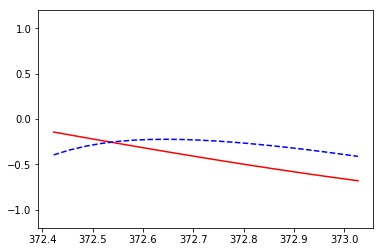

   [[373.05918661 373.0910176  373.12284858 373.15467957 373.18651056
  373.21834155 373.25017254 373.28200353 373.31383452 373.3456655
  373.37749649 373.40932748 373.44115847 373.47298946 373.50482045
  373.53665144 373.56848243 373.60031341 373.6321444  373.66397539]
 [373.69580638 373.72763737 373.75946836 373.79129935 373.82313033
  373.85496132 373.88679231 373.9186233  373.95045429 373.98228528
  374.01411627 374.04594725 374.07777824 374.10960923 374.14144022
  374.17327121 374.2051022  374.23693319 374.26876417 374.30059516]
 [374.33242615 374.36425714 374.39608813 374.42791912 374.45975011
  374.4915811  374.52341208 374.55524307 374.58707406 374.61890505
  374.65073604 374.68256703 374.71439802 374.746229   374.77805999
  374.80989098 374.84172197 374.87355296 374.90538395 374.93721494]
 [374.96904592 375.00087691 375.0327079  375.06453889 375.09636988
  375.12820087 375.16003186 375.19186284 375.22369383 375.25552482
  375.28735581 375.3191868  375.35101779 375.38284878 375

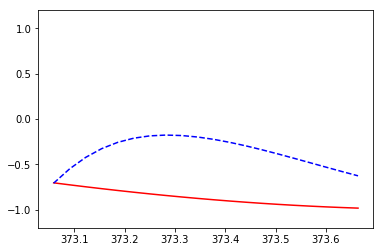

   [[373.69580638 373.72763737 373.75946836 373.79129935 373.82313033
  373.85496132 373.88679231 373.9186233  373.95045429 373.98228528
  374.01411627 374.04594725 374.07777824 374.10960923 374.14144022
  374.17327121 374.2051022  374.23693319 374.26876417 374.30059516]
 [374.33242615 374.36425714 374.39608813 374.42791912 374.45975011
  374.4915811  374.52341208 374.55524307 374.58707406 374.61890505
  374.65073604 374.68256703 374.71439802 374.746229   374.77805999
  374.80989098 374.84172197 374.87355296 374.90538395 374.93721494]
 [374.96904592 375.00087691 375.0327079  375.06453889 375.09636988
  375.12820087 375.16003186 375.19186284 375.22369383 375.25552482
  375.28735581 375.3191868  375.35101779 375.38284878 375.41467977
  375.44651075 375.47834174 375.51017273 375.54200372 375.57383471]
 [375.6056657  375.63749669 375.66932767 375.70115866 375.73298965
  375.76482064 375.79665163 375.82848262 375.86031361 375.89214459
  375.92397558 375.95580657 375.98763756 376.01946855 37

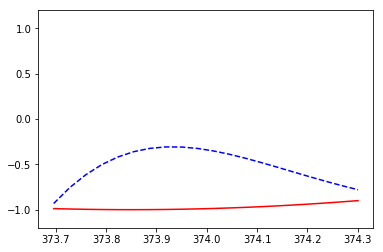

   [[374.33242615 374.36425714 374.39608813 374.42791912 374.45975011
  374.4915811  374.52341208 374.55524307 374.58707406 374.61890505
  374.65073604 374.68256703 374.71439802 374.746229   374.77805999
  374.80989098 374.84172197 374.87355296 374.90538395 374.93721494]
 [374.96904592 375.00087691 375.0327079  375.06453889 375.09636988
  375.12820087 375.16003186 375.19186284 375.22369383 375.25552482
  375.28735581 375.3191868  375.35101779 375.38284878 375.41467977
  375.44651075 375.47834174 375.51017273 375.54200372 375.57383471]
 [375.6056657  375.63749669 375.66932767 375.70115866 375.73298965
  375.76482064 375.79665163 375.82848262 375.86031361 375.89214459
  375.92397558 375.95580657 375.98763756 376.01946855 376.05129954
  376.08313053 376.11496151 376.1467925  376.17862349 376.21045448]
 [376.24228547 376.27411646 376.30594745 376.33777844 376.36960942
  376.40144041 376.4332714  376.46510239 376.49693338 376.52876437
  376.56059536 376.59242634 376.62425733 376.65608832 37

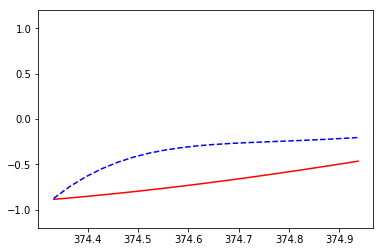

   [[374.96904592 375.00087691 375.0327079  375.06453889 375.09636988
  375.12820087 375.16003186 375.19186284 375.22369383 375.25552482
  375.28735581 375.3191868  375.35101779 375.38284878 375.41467977
  375.44651075 375.47834174 375.51017273 375.54200372 375.57383471]
 [375.6056657  375.63749669 375.66932767 375.70115866 375.73298965
  375.76482064 375.79665163 375.82848262 375.86031361 375.89214459
  375.92397558 375.95580657 375.98763756 376.01946855 376.05129954
  376.08313053 376.11496151 376.1467925  376.17862349 376.21045448]
 [376.24228547 376.27411646 376.30594745 376.33777844 376.36960942
  376.40144041 376.4332714  376.46510239 376.49693338 376.52876437
  376.56059536 376.59242634 376.62425733 376.65608832 376.68791931
  376.7197503  376.75158129 376.78341228 376.81524326 376.84707425]
 [376.87890524 376.91073623 376.94256722 376.97439821 377.0062292
  377.03806018 377.06989117 377.10172216 377.13355315 377.16538414
  377.19721513 377.22904612 377.26087711 377.29270809 377

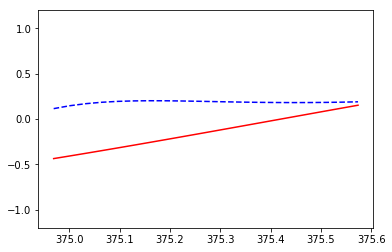

   [[375.6056657  375.63749669 375.66932767 375.70115866 375.73298965
  375.76482064 375.79665163 375.82848262 375.86031361 375.89214459
  375.92397558 375.95580657 375.98763756 376.01946855 376.05129954
  376.08313053 376.11496151 376.1467925  376.17862349 376.21045448]
 [376.24228547 376.27411646 376.30594745 376.33777844 376.36960942
  376.40144041 376.4332714  376.46510239 376.49693338 376.52876437
  376.56059536 376.59242634 376.62425733 376.65608832 376.68791931
  376.7197503  376.75158129 376.78341228 376.81524326 376.84707425]
 [376.87890524 376.91073623 376.94256722 376.97439821 377.0062292
  377.03806018 377.06989117 377.10172216 377.13355315 377.16538414
  377.19721513 377.22904612 377.26087711 377.29270809 377.32453908
  377.35637007 377.38820106 377.42003205 377.45186304 377.48369403]
 [377.51552501 377.547356   377.57918699 377.61101798 377.64284897
  377.67467996 377.70651095 377.73834193 377.77017292 377.80200391
  377.8338349  377.86566589 377.89749688 377.92932787 377

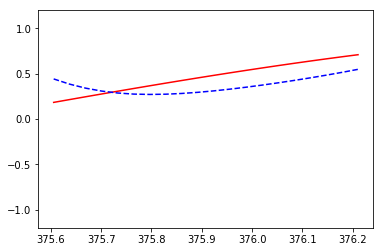

   [[376.24228547 376.27411646 376.30594745 376.33777844 376.36960942
  376.40144041 376.4332714  376.46510239 376.49693338 376.52876437
  376.56059536 376.59242634 376.62425733 376.65608832 376.68791931
  376.7197503  376.75158129 376.78341228 376.81524326 376.84707425]
 [376.87890524 376.91073623 376.94256722 376.97439821 377.0062292
  377.03806018 377.06989117 377.10172216 377.13355315 377.16538414
  377.19721513 377.22904612 377.26087711 377.29270809 377.32453908
  377.35637007 377.38820106 377.42003205 377.45186304 377.48369403]
 [377.51552501 377.547356   377.57918699 377.61101798 377.64284897
  377.67467996 377.70651095 377.73834193 377.77017292 377.80200391
  377.8338349  377.86566589 377.89749688 377.92932787 377.96115885
  377.99298984 378.02482083 378.05665182 378.08848281 378.1203138 ]
 [378.15214479 378.18397577 378.21580676 378.24763775 378.27946874
  378.31129973 378.34313072 378.37496171 378.4067927  378.43862368
  378.47045467 378.50228566 378.53411665 378.56594764 378

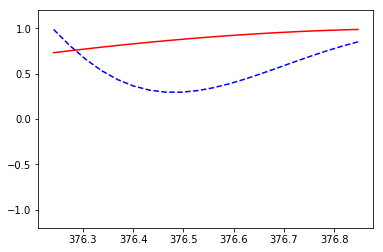

   [[376.87890524 376.91073623 376.94256722 376.97439821 377.0062292
  377.03806018 377.06989117 377.10172216 377.13355315 377.16538414
  377.19721513 377.22904612 377.26087711 377.29270809 377.32453908
  377.35637007 377.38820106 377.42003205 377.45186304 377.48369403]
 [377.51552501 377.547356   377.57918699 377.61101798 377.64284897
  377.67467996 377.70651095 377.73834193 377.77017292 377.80200391
  377.8338349  377.86566589 377.89749688 377.92932787 377.96115885
  377.99298984 378.02482083 378.05665182 378.08848281 378.1203138 ]
 [378.15214479 378.18397577 378.21580676 378.24763775 378.27946874
  378.31129973 378.34313072 378.37496171 378.4067927  378.43862368
  378.47045467 378.50228566 378.53411665 378.56594764 378.59777863
  378.62960962 378.6614406  378.69327159 378.72510258 378.75693357]
 [378.78876456 378.82059555 378.85242654 378.88425752 378.91608851
  378.9479195  378.97975049 379.01158148 379.04341247 379.07524346
  379.10707444 379.13890543 379.17073642 379.20256741 379

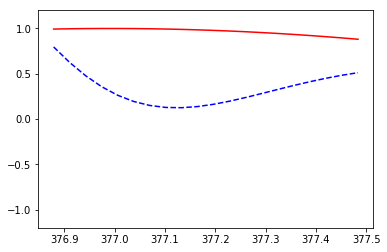

   0.05003642
   [[377.51552501 377.547356   377.57918699 377.61101798 377.64284897
  377.67467996 377.70651095 377.73834193 377.77017292 377.80200391
  377.8338349  377.86566589 377.89749688 377.92932787 377.96115885
  377.99298984 378.02482083 378.05665182 378.08848281 378.1203138 ]
 [378.15214479 378.18397577 378.21580676 378.24763775 378.27946874
  378.31129973 378.34313072 378.37496171 378.4067927  378.43862368
  378.47045467 378.50228566 378.53411665 378.56594764 378.59777863
  378.62960962 378.6614406  378.69327159 378.72510258 378.75693357]
 [378.78876456 378.82059555 378.85242654 378.88425752 378.91608851
  378.9479195  378.97975049 379.01158148 379.04341247 379.07524346
  379.10707444 379.13890543 379.17073642 379.20256741 379.2343984
  379.26622939 379.29806038 379.32989137 379.36172235 379.39355334]
 [379.42538433 379.45721532 379.48904631 379.5208773  379.55270829
  379.58453927 379.61637026 379.64820125 379.68003224 379.71186323
  379.74369422 379.77552521 379.80735619 37

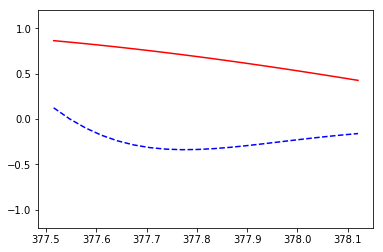

   [[378.15214479 378.18397577 378.21580676 378.24763775 378.27946874
  378.31129973 378.34313072 378.37496171 378.4067927  378.43862368
  378.47045467 378.50228566 378.53411665 378.56594764 378.59777863
  378.62960962 378.6614406  378.69327159 378.72510258 378.75693357]
 [378.78876456 378.82059555 378.85242654 378.88425752 378.91608851
  378.9479195  378.97975049 379.01158148 379.04341247 379.07524346
  379.10707444 379.13890543 379.17073642 379.20256741 379.2343984
  379.26622939 379.29806038 379.32989137 379.36172235 379.39355334]
 [379.42538433 379.45721532 379.48904631 379.5208773  379.55270829
  379.58453927 379.61637026 379.64820125 379.68003224 379.71186323
  379.74369422 379.77552521 379.80735619 379.83918718 379.87101817
  379.90284916 379.93468015 379.96651114 379.99834213 380.03017311]
 [380.0620041  380.09383509 380.12566608 380.15749707 380.18932806
  380.22115905 380.25299004 380.28482102 380.31665201 380.348483
  380.38031399 380.41214498 380.44397597 380.47580696 380.5

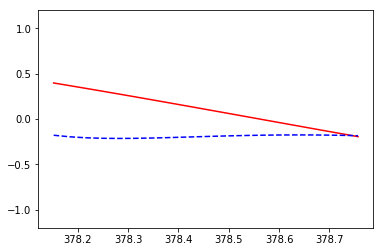

   [[378.78876456 378.82059555 378.85242654 378.88425752 378.91608851
  378.9479195  378.97975049 379.01158148 379.04341247 379.07524346
  379.10707444 379.13890543 379.17073642 379.20256741 379.2343984
  379.26622939 379.29806038 379.32989137 379.36172235 379.39355334]
 [379.42538433 379.45721532 379.48904631 379.5208773  379.55270829
  379.58453927 379.61637026 379.64820125 379.68003224 379.71186323
  379.74369422 379.77552521 379.80735619 379.83918718 379.87101817
  379.90284916 379.93468015 379.96651114 379.99834213 380.03017311]
 [380.0620041  380.09383509 380.12566608 380.15749707 380.18932806
  380.22115905 380.25299004 380.28482102 380.31665201 380.348483
  380.38031399 380.41214498 380.44397597 380.47580696 380.50763794
  380.53946893 380.57129992 380.60313091 380.6349619  380.66679289]
 [380.69862388 380.73045486 380.76228585 380.79411684 380.82594783
  380.85777882 380.88960981 380.9214408  380.95327178 380.98510277
  381.01693376 381.04876475 381.08059574 381.11242673 381.1

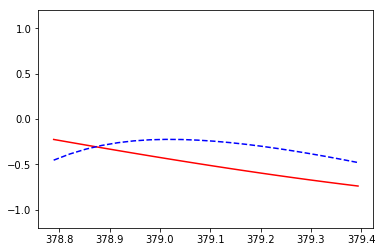

   [[379.42538433 379.45721532 379.48904631 379.5208773  379.55270829
  379.58453927 379.61637026 379.64820125 379.68003224 379.71186323
  379.74369422 379.77552521 379.80735619 379.83918718 379.87101817
  379.90284916 379.93468015 379.96651114 379.99834213 380.03017311]
 [380.0620041  380.09383509 380.12566608 380.15749707 380.18932806
  380.22115905 380.25299004 380.28482102 380.31665201 380.348483
  380.38031399 380.41214498 380.44397597 380.47580696 380.50763794
  380.53946893 380.57129992 380.60313091 380.6349619  380.66679289]
 [380.69862388 380.73045486 380.76228585 380.79411684 380.82594783
  380.85777882 380.88960981 380.9214408  380.95327178 380.98510277
  381.01693376 381.04876475 381.08059574 381.11242673 381.14425772
  381.17608871 381.20791969 381.23975068 381.27158167 381.30341266]
 [381.33524365 381.36707464 381.39890563 381.43073661 381.4625676
  381.49439859 381.52622958 381.55806057 381.58989156 381.62172255
  381.65355353 381.68538452 381.71721551 381.7490465  381.7

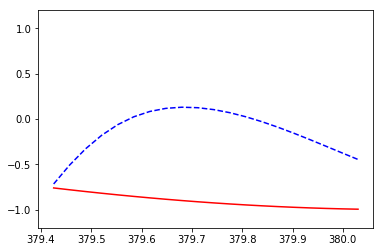

   [[380.0620041  380.09383509 380.12566608 380.15749707 380.18932806
  380.22115905 380.25299004 380.28482102 380.31665201 380.348483
  380.38031399 380.41214498 380.44397597 380.47580696 380.50763794
  380.53946893 380.57129992 380.60313091 380.6349619  380.66679289]
 [380.69862388 380.73045486 380.76228585 380.79411684 380.82594783
  380.85777882 380.88960981 380.9214408  380.95327178 380.98510277
  381.01693376 381.04876475 381.08059574 381.11242673 381.14425772
  381.17608871 381.20791969 381.23975068 381.27158167 381.30341266]
 [381.33524365 381.36707464 381.39890563 381.43073661 381.4625676
  381.49439859 381.52622958 381.55806057 381.58989156 381.62172255
  381.65355353 381.68538452 381.71721551 381.7490465  381.78087749
  381.81270848 381.84453947 381.87637045 381.90820144 381.94003243]
 [381.97186342 382.00369441 382.0355254  382.06735639 382.09918738
  382.13101836 382.16284935 382.19468034 382.22651133 382.25834232
  382.29017331 382.3220043  382.35383528 382.38566627 382.4

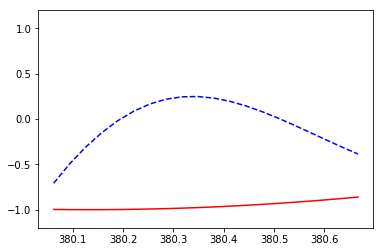

   [[380.69862388 380.73045486 380.76228585 380.79411684 380.82594783
  380.85777882 380.88960981 380.9214408  380.95327178 380.98510277
  381.01693376 381.04876475 381.08059574 381.11242673 381.14425772
  381.17608871 381.20791969 381.23975068 381.27158167 381.30341266]
 [381.33524365 381.36707464 381.39890563 381.43073661 381.4625676
  381.49439859 381.52622958 381.55806057 381.58989156 381.62172255
  381.65355353 381.68538452 381.71721551 381.7490465  381.78087749
  381.81270848 381.84453947 381.87637045 381.90820144 381.94003243]
 [381.97186342 382.00369441 382.0355254  382.06735639 382.09918738
  382.13101836 382.16284935 382.19468034 382.22651133 382.25834232
  382.29017331 382.3220043  382.35383528 382.38566627 382.41749726
  382.44932825 382.48115924 382.51299023 382.54482122 382.5766522 ]
 [382.60848319 382.64031418 382.67214517 382.70397616 382.73580715
  382.76763814 382.79946912 382.83130011 382.8631311  382.89496209
  382.92679308 382.95862407 382.99045506 383.02228604 383

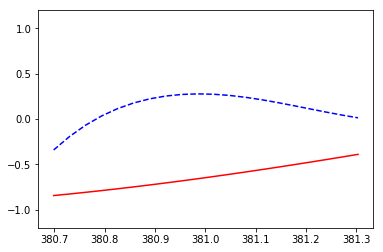

   [[381.33524365 381.36707464 381.39890563 381.43073661 381.4625676
  381.49439859 381.52622958 381.55806057 381.58989156 381.62172255
  381.65355353 381.68538452 381.71721551 381.7490465  381.78087749
  381.81270848 381.84453947 381.87637045 381.90820144 381.94003243]
 [381.97186342 382.00369441 382.0355254  382.06735639 382.09918738
  382.13101836 382.16284935 382.19468034 382.22651133 382.25834232
  382.29017331 382.3220043  382.35383528 382.38566627 382.41749726
  382.44932825 382.48115924 382.51299023 382.54482122 382.5766522 ]
 [382.60848319 382.64031418 382.67214517 382.70397616 382.73580715
  382.76763814 382.79946912 382.83130011 382.8631311  382.89496209
  382.92679308 382.95862407 382.99045506 383.02228604 383.05411703
  383.08594802 383.11777901 383.14961    383.18144099 383.21327198]
 [383.24510297 383.27693395 383.30876494 383.34059593 383.37242692
  383.40425791 383.4360889  383.46791989 383.49975087 383.53158186
  383.56341285 383.59524384 383.62707483 383.65890582 383

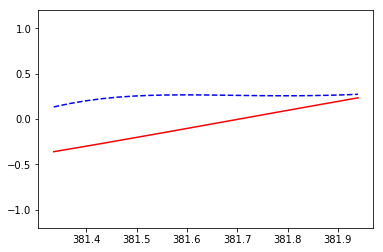

   [[381.97186342 382.00369441 382.0355254  382.06735639 382.09918738
  382.13101836 382.16284935 382.19468034 382.22651133 382.25834232
  382.29017331 382.3220043  382.35383528 382.38566627 382.41749726
  382.44932825 382.48115924 382.51299023 382.54482122 382.5766522 ]
 [382.60848319 382.64031418 382.67214517 382.70397616 382.73580715
  382.76763814 382.79946912 382.83130011 382.8631311  382.89496209
  382.92679308 382.95862407 382.99045506 383.02228604 383.05411703
  383.08594802 383.11777901 383.14961    383.18144099 383.21327198]
 [383.24510297 383.27693395 383.30876494 383.34059593 383.37242692
  383.40425791 383.4360889  383.46791989 383.49975087 383.53158186
  383.56341285 383.59524384 383.62707483 383.65890582 383.69073681
  383.72256779 383.75439878 383.78622977 383.81806076 383.84989175]
 [383.88172274 383.91355373 383.94538471 383.9772157  384.00904669
  384.04087768 384.07270867 384.10453966 384.13637065 384.16820164
  384.20003262 384.23186361 384.2636946  384.29552559 38

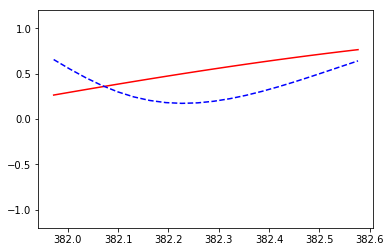

   [[382.60848319 382.64031418 382.67214517 382.70397616 382.73580715
  382.76763814 382.79946912 382.83130011 382.8631311  382.89496209
  382.92679308 382.95862407 382.99045506 383.02228604 383.05411703
  383.08594802 383.11777901 383.14961    383.18144099 383.21327198]
 [383.24510297 383.27693395 383.30876494 383.34059593 383.37242692
  383.40425791 383.4360889  383.46791989 383.49975087 383.53158186
  383.56341285 383.59524384 383.62707483 383.65890582 383.69073681
  383.72256779 383.75439878 383.78622977 383.81806076 383.84989175]
 [383.88172274 383.91355373 383.94538471 383.9772157  384.00904669
  384.04087768 384.07270867 384.10453966 384.13637065 384.16820164
  384.20003262 384.23186361 384.2636946  384.29552559 384.32735658
  384.35918757 384.39101856 384.42284954 384.45468053 384.48651152]
 [384.51834251 384.5501735  384.58200449 384.61383548 384.64566646
  384.67749745 384.70932844 384.74115943 384.77299042 384.80482141
  384.8366524  384.86848338 384.90031437 384.93214536 38

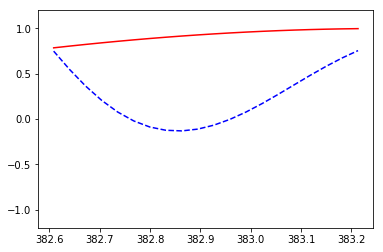

   [[383.24510297 383.27693395 383.30876494 383.34059593 383.37242692
  383.40425791 383.4360889  383.46791989 383.49975087 383.53158186
  383.56341285 383.59524384 383.62707483 383.65890582 383.69073681
  383.72256779 383.75439878 383.78622977 383.81806076 383.84989175]
 [383.88172274 383.91355373 383.94538471 383.9772157  384.00904669
  384.04087768 384.07270867 384.10453966 384.13637065 384.16820164
  384.20003262 384.23186361 384.2636946  384.29552559 384.32735658
  384.35918757 384.39101856 384.42284954 384.45468053 384.48651152]
 [384.51834251 384.5501735  384.58200449 384.61383548 384.64566646
  384.67749745 384.70932844 384.74115943 384.77299042 384.80482141
  384.8366524  384.86848338 384.90031437 384.93214536 384.96397635
  384.99580734 385.02763833 385.05946932 385.09130031 385.12313129]
 [385.15496228 385.18679327 385.21862426 385.25045525 385.28228624
  385.31411723 385.34594821 385.3777792  385.40961019 385.44144118
  385.47327217 385.50510316 385.53693415 385.56876513 38

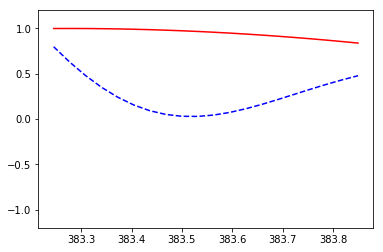

   0.026614306
   [[383.88172274 383.91355373 383.94538471 383.9772157  384.00904669
  384.04087768 384.07270867 384.10453966 384.13637065 384.16820164
  384.20003262 384.23186361 384.2636946  384.29552559 384.32735658
  384.35918757 384.39101856 384.42284954 384.45468053 384.48651152]
 [384.51834251 384.5501735  384.58200449 384.61383548 384.64566646
  384.67749745 384.70932844 384.74115943 384.77299042 384.80482141
  384.8366524  384.86848338 384.90031437 384.93214536 384.96397635
  384.99580734 385.02763833 385.05946932 385.09130031 385.12313129]
 [385.15496228 385.18679327 385.21862426 385.25045525 385.28228624
  385.31411723 385.34594821 385.3777792  385.40961019 385.44144118
  385.47327217 385.50510316 385.53693415 385.56876513 385.60059612
  385.63242711 385.6642581  385.69608909 385.72792008 385.75975107]
 [385.79158205 385.82341304 385.85524403 385.88707502 385.91890601
  385.950737   385.98256799 386.01439898 386.04622996 386.07806095
  386.10989194 386.14172293 386.17355392 

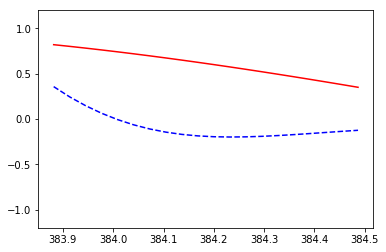

   [[384.51834251 384.5501735  384.58200449 384.61383548 384.64566646
  384.67749745 384.70932844 384.74115943 384.77299042 384.80482141
  384.8366524  384.86848338 384.90031437 384.93214536 384.96397635
  384.99580734 385.02763833 385.05946932 385.09130031 385.12313129]
 [385.15496228 385.18679327 385.21862426 385.25045525 385.28228624
  385.31411723 385.34594821 385.3777792  385.40961019 385.44144118
  385.47327217 385.50510316 385.53693415 385.56876513 385.60059612
  385.63242711 385.6642581  385.69608909 385.72792008 385.75975107]
 [385.79158205 385.82341304 385.85524403 385.88707502 385.91890601
  385.950737   385.98256799 386.01439898 386.04622996 386.07806095
  386.10989194 386.14172293 386.17355392 386.20538491 386.2372159
  386.26904688 386.30087787 386.33270886 386.36453985 386.39637084]
 [386.42820183 386.46003282 386.4918638  386.52369479 386.55552578
  386.58735677 386.61918776 386.65101875 386.68284974 386.71468072
  386.74651171 386.7783427  386.81017369 386.84200468 386

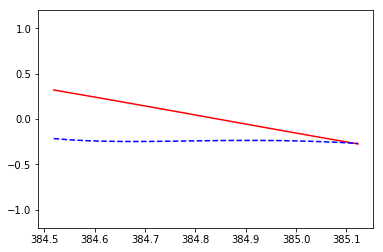

   [[385.15496228 385.18679327 385.21862426 385.25045525 385.28228624
  385.31411723 385.34594821 385.3777792  385.40961019 385.44144118
  385.47327217 385.50510316 385.53693415 385.56876513 385.60059612
  385.63242711 385.6642581  385.69608909 385.72792008 385.75975107]
 [385.79158205 385.82341304 385.85524403 385.88707502 385.91890601
  385.950737   385.98256799 386.01439898 386.04622996 386.07806095
  386.10989194 386.14172293 386.17355392 386.20538491 386.2372159
  386.26904688 386.30087787 386.33270886 386.36453985 386.39637084]
 [386.42820183 386.46003282 386.4918638  386.52369479 386.55552578
  386.58735677 386.61918776 386.65101875 386.68284974 386.71468072
  386.74651171 386.7783427  386.81017369 386.84200468 386.87383567
  386.90566666 386.93749765 386.96932863 387.00115962 387.03299061]
 [387.0648216  387.09665259 387.12848358 387.16031457 387.19214555
  387.22397654 387.25580753 387.28763852 387.31946951 387.3513005
  387.38313149 387.41496247 387.44679346 387.47862445 387.

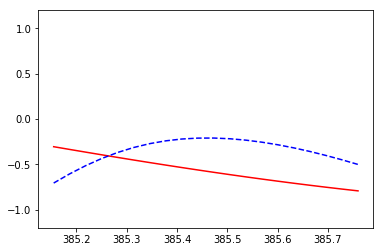

   [[385.79158205 385.82341304 385.85524403 385.88707502 385.91890601
  385.950737   385.98256799 386.01439898 386.04622996 386.07806095
  386.10989194 386.14172293 386.17355392 386.20538491 386.2372159
  386.26904688 386.30087787 386.33270886 386.36453985 386.39637084]
 [386.42820183 386.46003282 386.4918638  386.52369479 386.55552578
  386.58735677 386.61918776 386.65101875 386.68284974 386.71468072
  386.74651171 386.7783427  386.81017369 386.84200468 386.87383567
  386.90566666 386.93749765 386.96932863 387.00115962 387.03299061]
 [387.0648216  387.09665259 387.12848358 387.16031457 387.19214555
  387.22397654 387.25580753 387.28763852 387.31946951 387.3513005
  387.38313149 387.41496247 387.44679346 387.47862445 387.51045544
  387.54228643 387.57411742 387.60594841 387.63777939 387.66961038]
 [387.70144137 387.73327236 387.76510335 387.79693434 387.82876533
  387.86059631 387.8924273  387.92425829 387.95608928 387.98792027
  388.01975126 388.05158225 388.08341324 388.11524422 388.

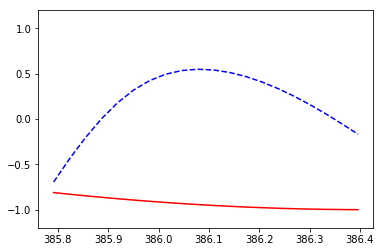

   [[386.42820183 386.46003282 386.4918638  386.52369479 386.55552578
  386.58735677 386.61918776 386.65101875 386.68284974 386.71468072
  386.74651171 386.7783427  386.81017369 386.84200468 386.87383567
  386.90566666 386.93749765 386.96932863 387.00115962 387.03299061]
 [387.0648216  387.09665259 387.12848358 387.16031457 387.19214555
  387.22397654 387.25580753 387.28763852 387.31946951 387.3513005
  387.38313149 387.41496247 387.44679346 387.47862445 387.51045544
  387.54228643 387.57411742 387.60594841 387.63777939 387.66961038]
 [387.70144137 387.73327236 387.76510335 387.79693434 387.82876533
  387.86059631 387.8924273  387.92425829 387.95608928 387.98792027
  388.01975126 388.05158225 388.08341324 388.11524422 388.14707521
  388.1789062  388.21073719 388.24256818 388.27439917 388.30623016]
 [388.33806114 388.36989213 388.40172312 388.43355411 388.4653851
  388.49721609 388.52904708 388.56087806 388.59270905 388.62454004
  388.65637103 388.68820202 388.72003301 388.751864   388.

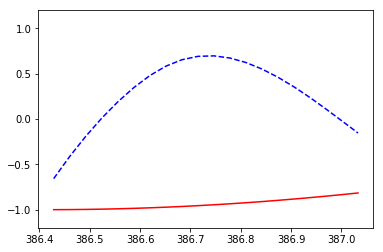

   [[387.0648216  387.09665259 387.12848358 387.16031457 387.19214555
  387.22397654 387.25580753 387.28763852 387.31946951 387.3513005
  387.38313149 387.41496247 387.44679346 387.47862445 387.51045544
  387.54228643 387.57411742 387.60594841 387.63777939 387.66961038]
 [387.70144137 387.73327236 387.76510335 387.79693434 387.82876533
  387.86059631 387.8924273  387.92425829 387.95608928 387.98792027
  388.01975126 388.05158225 388.08341324 388.11524422 388.14707521
  388.1789062  388.21073719 388.24256818 388.27439917 388.30623016]
 [388.33806114 388.36989213 388.40172312 388.43355411 388.4653851
  388.49721609 388.52904708 388.56087806 388.59270905 388.62454004
  388.65637103 388.68820202 388.72003301 388.751864   388.78369498
  388.81552597 388.84735696 388.87918795 388.91101894 388.94284993]
 [388.97468092 389.00651191 389.03834289 389.07017388 389.10200487
  389.13383586 389.16566685 389.19749784 389.22932883 389.26115981
  389.2929908  389.32482179 389.35665278 389.38848377 389.

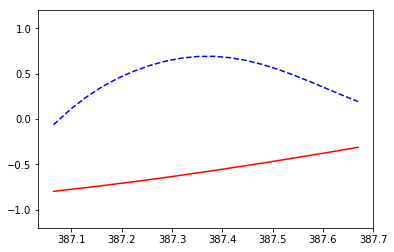

   [[387.70144137 387.73327236 387.76510335 387.79693434 387.82876533
  387.86059631 387.8924273  387.92425829 387.95608928 387.98792027
  388.01975126 388.05158225 388.08341324 388.11524422 388.14707521
  388.1789062  388.21073719 388.24256818 388.27439917 388.30623016]
 [388.33806114 388.36989213 388.40172312 388.43355411 388.4653851
  388.49721609 388.52904708 388.56087806 388.59270905 388.62454004
  388.65637103 388.68820202 388.72003301 388.751864   388.78369498
  388.81552597 388.84735696 388.87918795 388.91101894 388.94284993]
 [388.97468092 389.00651191 389.03834289 389.07017388 389.10200487
  389.13383586 389.16566685 389.19749784 389.22932883 389.26115981
  389.2929908  389.32482179 389.35665278 389.38848377 389.42031476
  389.45214575 389.48397673 389.51580772 389.54763871 389.5794697 ]
 [389.61130069 389.64313168 389.67496267 389.70679365 389.73862464
  389.77045563 389.80228662 389.83411761 389.8659486  389.89777959
  389.92961058 389.96144156 389.99327255 390.02510354 390

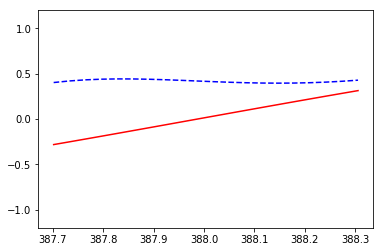

   [[388.33806114 388.36989213 388.40172312 388.43355411 388.4653851
  388.49721609 388.52904708 388.56087806 388.59270905 388.62454004
  388.65637103 388.68820202 388.72003301 388.751864   388.78369498
  388.81552597 388.84735696 388.87918795 388.91101894 388.94284993]
 [388.97468092 389.00651191 389.03834289 389.07017388 389.10200487
  389.13383586 389.16566685 389.19749784 389.22932883 389.26115981
  389.2929908  389.32482179 389.35665278 389.38848377 389.42031476
  389.45214575 389.48397673 389.51580772 389.54763871 389.5794697 ]
 [389.61130069 389.64313168 389.67496267 389.70679365 389.73862464
  389.77045563 389.80228662 389.83411761 389.8659486  389.89777959
  389.92961058 389.96144156 389.99327255 390.02510354 390.05693453
  390.08876552 390.12059651 390.1524275  390.18425848 390.21608947]
 [390.24792046 390.27975145 390.31158244 390.34341343 390.37524442
  390.4070754  390.43890639 390.47073738 390.50256837 390.53439936
  390.56623035 390.59806134 390.62989232 390.66172331 390

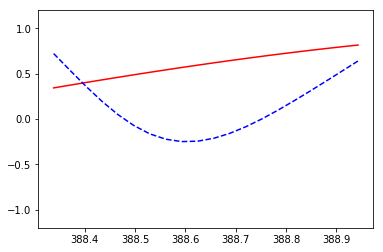

   [[388.97468092 389.00651191 389.03834289 389.07017388 389.10200487
  389.13383586 389.16566685 389.19749784 389.22932883 389.26115981
  389.2929908  389.32482179 389.35665278 389.38848377 389.42031476
  389.45214575 389.48397673 389.51580772 389.54763871 389.5794697 ]
 [389.61130069 389.64313168 389.67496267 389.70679365 389.73862464
  389.77045563 389.80228662 389.83411761 389.8659486  389.89777959
  389.92961058 389.96144156 389.99327255 390.02510354 390.05693453
  390.08876552 390.12059651 390.1524275  390.18425848 390.21608947]
 [390.24792046 390.27975145 390.31158244 390.34341343 390.37524442
  390.4070754  390.43890639 390.47073738 390.50256837 390.53439936
  390.56623035 390.59806134 390.62989232 390.66172331 390.6935543
  390.72538529 390.75721628 390.78904727 390.82087826 390.85270925]
 [390.88454023 390.91637122 390.94820221 390.9800332  391.01186419
  391.04369518 391.07552617 391.10735715 391.13918814 391.17101913
  391.20285012 391.23468111 391.2665121  391.29834309 391

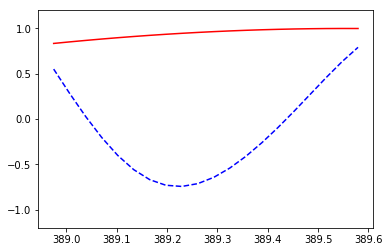

   [[389.61130069 389.64313168 389.67496267 389.70679365 389.73862464
  389.77045563 389.80228662 389.83411761 389.8659486  389.89777959
  389.92961058 389.96144156 389.99327255 390.02510354 390.05693453
  390.08876552 390.12059651 390.1524275  390.18425848 390.21608947]
 [390.24792046 390.27975145 390.31158244 390.34341343 390.37524442
  390.4070754  390.43890639 390.47073738 390.50256837 390.53439936
  390.56623035 390.59806134 390.62989232 390.66172331 390.6935543
  390.72538529 390.75721628 390.78904727 390.82087826 390.85270925]
 [390.88454023 390.91637122 390.94820221 390.9800332  391.01186419
  391.04369518 391.07552617 391.10735715 391.13918814 391.17101913
  391.20285012 391.23468111 391.2665121  391.29834309 391.33017407
  391.36200506 391.39383605 391.42566704 391.45749803 391.48932902]
 [391.52116001 391.55299099 391.58482198 391.61665297 391.64848396
  391.68031495 391.71214594 391.74397693 391.77580792 391.8076389
  391.83946989 391.87130088 391.90313187 391.93496286 391.

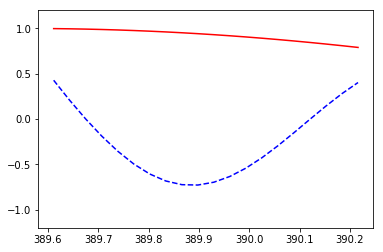

   0.021908062
   [[390.24792046 390.27975145 390.31158244 390.34341343 390.37524442
  390.4070754  390.43890639 390.47073738 390.50256837 390.53439936
  390.56623035 390.59806134 390.62989232 390.66172331 390.6935543
  390.72538529 390.75721628 390.78904727 390.82087826 390.85270925]
 [390.88454023 390.91637122 390.94820221 390.9800332  391.01186419
  391.04369518 391.07552617 391.10735715 391.13918814 391.17101913
  391.20285012 391.23468111 391.2665121  391.29834309 391.33017407
  391.36200506 391.39383605 391.42566704 391.45749803 391.48932902]
 [391.52116001 391.55299099 391.58482198 391.61665297 391.64848396
  391.68031495 391.71214594 391.74397693 391.77580792 391.8076389
  391.83946989 391.87130088 391.90313187 391.93496286 391.96679385
  391.99862484 392.03045582 392.06228681 392.0941178  392.12594879]
 [392.15777978 392.18961077 392.22144176 392.25327274 392.28510373
  392.31693472 392.34876571 392.3805967  392.41242769 392.44425868
  392.47608966 392.50792065 392.53975164 39

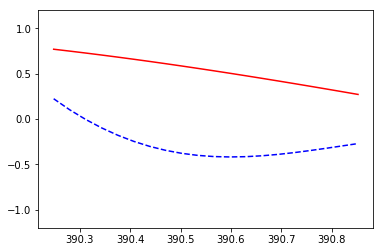

   [[390.88454023 390.91637122 390.94820221 390.9800332  391.01186419
  391.04369518 391.07552617 391.10735715 391.13918814 391.17101913
  391.20285012 391.23468111 391.2665121  391.29834309 391.33017407
  391.36200506 391.39383605 391.42566704 391.45749803 391.48932902]
 [391.52116001 391.55299099 391.58482198 391.61665297 391.64848396
  391.68031495 391.71214594 391.74397693 391.77580792 391.8076389
  391.83946989 391.87130088 391.90313187 391.93496286 391.96679385
  391.99862484 392.03045582 392.06228681 392.0941178  392.12594879]
 [392.15777978 392.18961077 392.22144176 392.25327274 392.28510373
  392.31693472 392.34876571 392.3805967  392.41242769 392.44425868
  392.47608966 392.50792065 392.53975164 392.57158263 392.60341362
  392.63524461 392.6670756  392.69890658 392.73073757 392.76256856]
 [392.79439955 392.82623054 392.85806153 392.88989252 392.92172351
  392.95355449 392.98538548 393.01721647 393.04904746 393.08087845
  393.11270944 393.14454043 393.17637141 393.2082024  393

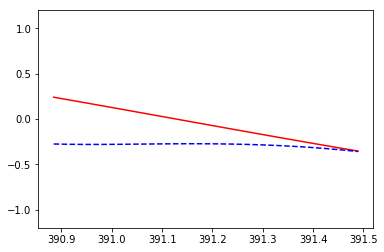

   [[391.52116001 391.55299099 391.58482198 391.61665297 391.64848396
  391.68031495 391.71214594 391.74397693 391.77580792 391.8076389
  391.83946989 391.87130088 391.90313187 391.93496286 391.96679385
  391.99862484 392.03045582 392.06228681 392.0941178  392.12594879]
 [392.15777978 392.18961077 392.22144176 392.25327274 392.28510373
  392.31693472 392.34876571 392.3805967  392.41242769 392.44425868
  392.47608966 392.50792065 392.53975164 392.57158263 392.60341362
  392.63524461 392.6670756  392.69890658 392.73073757 392.76256856]
 [392.79439955 392.82623054 392.85806153 392.88989252 392.92172351
  392.95355449 392.98538548 393.01721647 393.04904746 393.08087845
  393.11270944 393.14454043 393.17637141 393.2082024  393.24003339
  393.27186438 393.30369537 393.33552636 393.36735735 393.39918833]
 [393.43101932 393.46285031 393.4946813  393.52651229 393.55834328
  393.59017427 393.62200525 393.65383624 393.68566723 393.71749822
  393.74932921 393.7811602  393.81299119 393.84482218 393

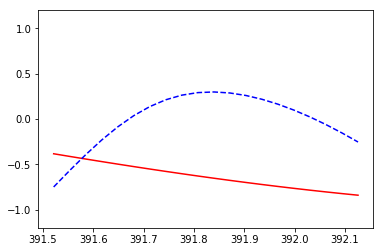

   [[392.15777978 392.18961077 392.22144176 392.25327274 392.28510373
  392.31693472 392.34876571 392.3805967  392.41242769 392.44425868
  392.47608966 392.50792065 392.53975164 392.57158263 392.60341362
  392.63524461 392.6670756  392.69890658 392.73073757 392.76256856]
 [392.79439955 392.82623054 392.85806153 392.88989252 392.92172351
  392.95355449 392.98538548 393.01721647 393.04904746 393.08087845
  393.11270944 393.14454043 393.17637141 393.2082024  393.24003339
  393.27186438 393.30369537 393.33552636 393.36735735 393.39918833]
 [393.43101932 393.46285031 393.4946813  393.52651229 393.55834328
  393.59017427 393.62200525 393.65383624 393.68566723 393.71749822
  393.74932921 393.7811602  393.81299119 393.84482218 393.87665316
  393.90848415 393.94031514 393.97214613 394.00397712 394.03580811]
 [394.0676391  394.09947008 394.13130107 394.16313206 394.19496305
  394.22679404 394.25862503 394.29045602 394.322287   394.35411799
  394.38594898 394.41777997 394.44961096 394.48144195 39

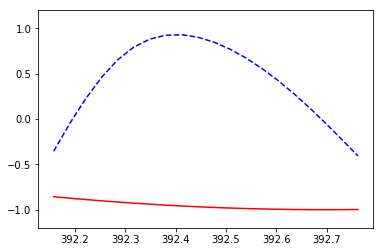

   [[392.79439955 392.82623054 392.85806153 392.88989252 392.92172351
  392.95355449 392.98538548 393.01721647 393.04904746 393.08087845
  393.11270944 393.14454043 393.17637141 393.2082024  393.24003339
  393.27186438 393.30369537 393.33552636 393.36735735 393.39918833]
 [393.43101932 393.46285031 393.4946813  393.52651229 393.55834328
  393.59017427 393.62200525 393.65383624 393.68566723 393.71749822
  393.74932921 393.7811602  393.81299119 393.84482218 393.87665316
  393.90848415 393.94031514 393.97214613 394.00397712 394.03580811]
 [394.0676391  394.09947008 394.13130107 394.16313206 394.19496305
  394.22679404 394.25862503 394.29045602 394.322287   394.35411799
  394.38594898 394.41777997 394.44961096 394.48144195 394.51327294
  394.54510392 394.57693491 394.6087659  394.64059689 394.67242788]
 [394.70425887 394.73608986 394.76792085 394.79975183 394.83158282
  394.86341381 394.8952448  394.92707579 394.95890678 394.99073777
  395.02256875 395.05439974 395.08623073 395.11806172 39

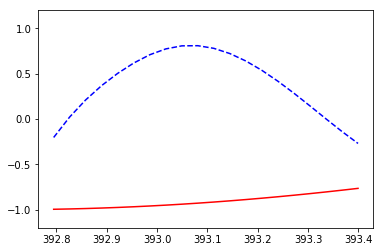

   [[393.43101932 393.46285031 393.4946813  393.52651229 393.55834328
  393.59017427 393.62200525 393.65383624 393.68566723 393.71749822
  393.74932921 393.7811602  393.81299119 393.84482218 393.87665316
  393.90848415 393.94031514 393.97214613 394.00397712 394.03580811]
 [394.0676391  394.09947008 394.13130107 394.16313206 394.19496305
  394.22679404 394.25862503 394.29045602 394.322287   394.35411799
  394.38594898 394.41777997 394.44961096 394.48144195 394.51327294
  394.54510392 394.57693491 394.6087659  394.64059689 394.67242788]
 [394.70425887 394.73608986 394.76792085 394.79975183 394.83158282
  394.86341381 394.8952448  394.92707579 394.95890678 394.99073777
  395.02256875 395.05439974 395.08623073 395.11806172 395.14989271
  395.1817237  395.21355469 395.24538567 395.27721666 395.30904765]
 [395.34087864 395.37270963 395.40454062 395.43637161 395.46820259
  395.50003358 395.53186457 395.56369556 395.59552655 395.62735754
  395.65918853 395.69101952 395.7228505  395.75468149 39

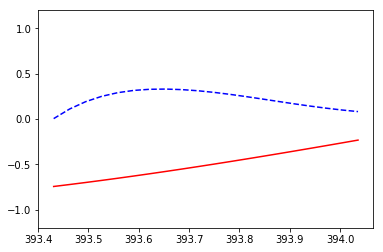

   [[394.0676391  394.09947008 394.13130107 394.16313206 394.19496305
  394.22679404 394.25862503 394.29045602 394.322287   394.35411799
  394.38594898 394.41777997 394.44961096 394.48144195 394.51327294
  394.54510392 394.57693491 394.6087659  394.64059689 394.67242788]
 [394.70425887 394.73608986 394.76792085 394.79975183 394.83158282
  394.86341381 394.8952448  394.92707579 394.95890678 394.99073777
  395.02256875 395.05439974 395.08623073 395.11806172 395.14989271
  395.1817237  395.21355469 395.24538567 395.27721666 395.30904765]
 [395.34087864 395.37270963 395.40454062 395.43637161 395.46820259
  395.50003358 395.53186457 395.56369556 395.59552655 395.62735754
  395.65918853 395.69101952 395.7228505  395.75468149 395.78651248
  395.81834347 395.85017446 395.88200545 395.91383644 395.94566742]
 [395.97749841 396.0093294  396.04116039 396.07299138 396.10482237
  396.13665336 396.16848434 396.20031533 396.23214632 396.26397731
  396.2958083  396.32763929 396.35947028 396.39130126 39

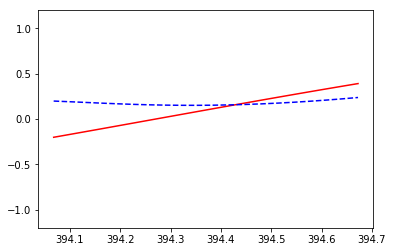

   [[394.70425887 394.73608986 394.76792085 394.79975183 394.83158282
  394.86341381 394.8952448  394.92707579 394.95890678 394.99073777
  395.02256875 395.05439974 395.08623073 395.11806172 395.14989271
  395.1817237  395.21355469 395.24538567 395.27721666 395.30904765]
 [395.34087864 395.37270963 395.40454062 395.43637161 395.46820259
  395.50003358 395.53186457 395.56369556 395.59552655 395.62735754
  395.65918853 395.69101952 395.7228505  395.75468149 395.78651248
  395.81834347 395.85017446 395.88200545 395.91383644 395.94566742]
 [395.97749841 396.0093294  396.04116039 396.07299138 396.10482237
  396.13665336 396.16848434 396.20031533 396.23214632 396.26397731
  396.2958083  396.32763929 396.35947028 396.39130126 396.42313225
  396.45496324 396.48679423 396.51862522 396.55045621 396.5822872 ]
 [396.61411819 396.64594917 396.67778016 396.70961115 396.74144214
  396.77327313 396.80510412 396.83693511 396.86876609 396.90059708
  396.93242807 396.96425906 396.99609005 397.02792104 39

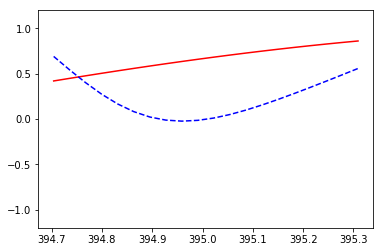

   [[395.34087864 395.37270963 395.40454062 395.43637161 395.46820259
  395.50003358 395.53186457 395.56369556 395.59552655 395.62735754
  395.65918853 395.69101952 395.7228505  395.75468149 395.78651248
  395.81834347 395.85017446 395.88200545 395.91383644 395.94566742]
 [395.97749841 396.0093294  396.04116039 396.07299138 396.10482237
  396.13665336 396.16848434 396.20031533 396.23214632 396.26397731
  396.2958083  396.32763929 396.35947028 396.39130126 396.42313225
  396.45496324 396.48679423 396.51862522 396.55045621 396.5822872 ]
 [396.61411819 396.64594917 396.67778016 396.70961115 396.74144214
  396.77327313 396.80510412 396.83693511 396.86876609 396.90059708
  396.93242807 396.96425906 396.99609005 397.02792104 397.05975203
  397.09158301 397.123414   397.15524499 397.18707598 397.21890697]
 [397.25073796 397.28256895 397.31439993 397.34623092 397.37806191
  397.4098929  397.44172389 397.47355488 397.50538587 397.53721685
  397.56904784 397.60087883 397.63270982 397.66454081 39

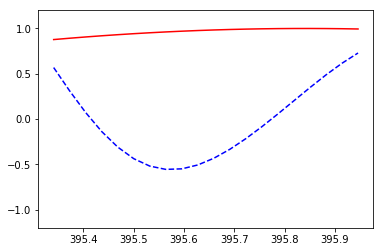

   [[395.97749841 396.0093294  396.04116039 396.07299138 396.10482237
  396.13665336 396.16848434 396.20031533 396.23214632 396.26397731
  396.2958083  396.32763929 396.35947028 396.39130126 396.42313225
  396.45496324 396.48679423 396.51862522 396.55045621 396.5822872 ]
 [396.61411819 396.64594917 396.67778016 396.70961115 396.74144214
  396.77327313 396.80510412 396.83693511 396.86876609 396.90059708
  396.93242807 396.96425906 396.99609005 397.02792104 397.05975203
  397.09158301 397.123414   397.15524499 397.18707598 397.21890697]
 [397.25073796 397.28256895 397.31439993 397.34623092 397.37806191
  397.4098929  397.44172389 397.47355488 397.50538587 397.53721685
  397.56904784 397.60087883 397.63270982 397.66454081 397.6963718
  397.72820279 397.76003378 397.79186476 397.82369575 397.85552674]
 [397.88735773 397.91918872 397.95101971 397.9828507  398.01468168
  398.04651267 398.07834366 398.11017465 398.14200564 398.17383663
  398.20566762 398.2374986  398.26932959 398.30116058 398

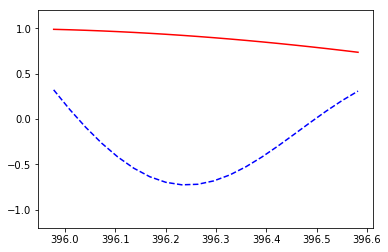

   0.02242997
   [[396.61411819 396.64594917 396.67778016 396.70961115 396.74144214
  396.77327313 396.80510412 396.83693511 396.86876609 396.90059708
  396.93242807 396.96425906 396.99609005 397.02792104 397.05975203
  397.09158301 397.123414   397.15524499 397.18707598 397.21890697]
 [397.25073796 397.28256895 397.31439993 397.34623092 397.37806191
  397.4098929  397.44172389 397.47355488 397.50538587 397.53721685
  397.56904784 397.60087883 397.63270982 397.66454081 397.6963718
  397.72820279 397.76003378 397.79186476 397.82369575 397.85552674]
 [397.88735773 397.91918872 397.95101971 397.9828507  398.01468168
  398.04651267 398.07834366 398.11017465 398.14200564 398.17383663
  398.20566762 398.2374986  398.26932959 398.30116058 398.33299157
  398.36482256 398.39665355 398.42848454 398.46031552 398.49214651]
 [398.5239775  398.55580849 398.58763948 398.61947047 398.65130146
  398.68313245 398.71496343 398.74679442 398.77862541 398.8104564
  398.84228739 398.87411838 398.90594937 398

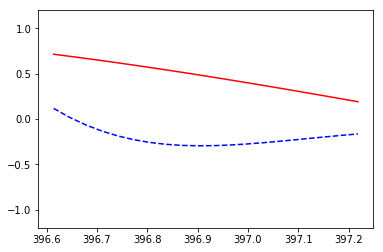

   [[397.25073796 397.28256895 397.31439993 397.34623092 397.37806191
  397.4098929  397.44172389 397.47355488 397.50538587 397.53721685
  397.56904784 397.60087883 397.63270982 397.66454081 397.6963718
  397.72820279 397.76003378 397.79186476 397.82369575 397.85552674]
 [397.88735773 397.91918872 397.95101971 397.9828507  398.01468168
  398.04651267 398.07834366 398.11017465 398.14200564 398.17383663
  398.20566762 398.2374986  398.26932959 398.30116058 398.33299157
  398.36482256 398.39665355 398.42848454 398.46031552 398.49214651]
 [398.5239775  398.55580849 398.58763948 398.61947047 398.65130146
  398.68313245 398.71496343 398.74679442 398.77862541 398.8104564
  398.84228739 398.87411838 398.90594937 398.93778035 398.96961134
  399.00144233 399.03327332 399.06510431 399.0969353  399.12876629]
 [399.16059727 399.19242826 399.22425925 399.25609024 399.28792123
  399.31975222 399.35158321 399.38341419 399.41524518 399.44707617
  399.47890716 399.51073815 399.54256914 399.57440013 399.

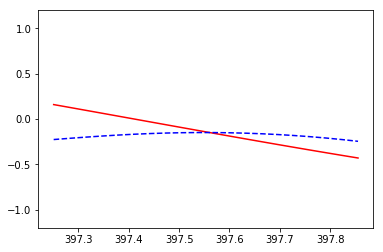

   [[397.88735773 397.91918872 397.95101971 397.9828507  398.01468168
  398.04651267 398.07834366 398.11017465 398.14200564 398.17383663
  398.20566762 398.2374986  398.26932959 398.30116058 398.33299157
  398.36482256 398.39665355 398.42848454 398.46031552 398.49214651]
 [398.5239775  398.55580849 398.58763948 398.61947047 398.65130146
  398.68313245 398.71496343 398.74679442 398.77862541 398.8104564
  398.84228739 398.87411838 398.90594937 398.93778035 398.96961134
  399.00144233 399.03327332 399.06510431 399.0969353  399.12876629]
 [399.16059727 399.19242826 399.22425925 399.25609024 399.28792123
  399.31975222 399.35158321 399.38341419 399.41524518 399.44707617
  399.47890716 399.51073815 399.54256914 399.57440013 399.60623112
  399.6380621  399.66989309 399.70172408 399.73355507 399.76538606]
 [399.79721705 399.82904804 399.86087902 399.89271001 399.924541
  399.95637199 399.98820298 400.02003397 400.05186496 400.08369594
  400.11552693 400.14735792 400.17918891 400.2110199  400.2

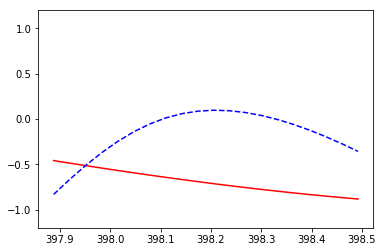

   [[398.5239775  398.55580849 398.58763948 398.61947047 398.65130146
  398.68313245 398.71496343 398.74679442 398.77862541 398.8104564
  398.84228739 398.87411838 398.90594937 398.93778035 398.96961134
  399.00144233 399.03327332 399.06510431 399.0969353  399.12876629]
 [399.16059727 399.19242826 399.22425925 399.25609024 399.28792123
  399.31975222 399.35158321 399.38341419 399.41524518 399.44707617
  399.47890716 399.51073815 399.54256914 399.57440013 399.60623112
  399.6380621  399.66989309 399.70172408 399.73355507 399.76538606]
 [399.79721705 399.82904804 399.86087902 399.89271001 399.924541
  399.95637199 399.98820298 400.02003397 400.05186496 400.08369594
  400.11552693 400.14735792 400.17918891 400.2110199  400.24285089
  400.27468188 400.30651286 400.33834385 400.37017484 400.40200583]
 [400.43383682 400.46566781 400.4974988  400.52932979 400.56116077
  400.59299176 400.62482275 400.65665374 400.68848473 400.72031572
  400.75214671 400.78397769 400.81580868 400.84763967 400.8

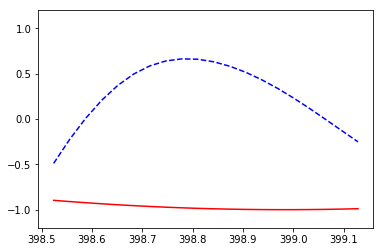

   [[399.16059727 399.19242826 399.22425925 399.25609024 399.28792123
  399.31975222 399.35158321 399.38341419 399.41524518 399.44707617
  399.47890716 399.51073815 399.54256914 399.57440013 399.60623112
  399.6380621  399.66989309 399.70172408 399.73355507 399.76538606]
 [399.79721705 399.82904804 399.86087902 399.89271001 399.924541
  399.95637199 399.98820298 400.02003397 400.05186496 400.08369594
  400.11552693 400.14735792 400.17918891 400.2110199  400.24285089
  400.27468188 400.30651286 400.33834385 400.37017484 400.40200583]
 [400.43383682 400.46566781 400.4974988  400.52932979 400.56116077
  400.59299176 400.62482275 400.65665374 400.68848473 400.72031572
  400.75214671 400.78397769 400.81580868 400.84763967 400.87947066
  400.91130165 400.94313264 400.97496363 401.00679461 401.0386256 ]
 [401.07045659 401.10228758 401.13411857 401.16594956 401.19778055
  401.22961153 401.26144252 401.29327351 401.3251045  401.35693549
  401.38876648 401.42059747 401.45242845 401.48425944 401.

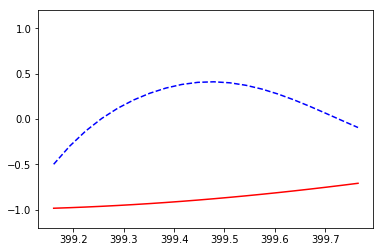

   [[399.79721705 399.82904804 399.86087902 399.89271001 399.924541
  399.95637199 399.98820298 400.02003397 400.05186496 400.08369594
  400.11552693 400.14735792 400.17918891 400.2110199  400.24285089
  400.27468188 400.30651286 400.33834385 400.37017484 400.40200583]
 [400.43383682 400.46566781 400.4974988  400.52932979 400.56116077
  400.59299176 400.62482275 400.65665374 400.68848473 400.72031572
  400.75214671 400.78397769 400.81580868 400.84763967 400.87947066
  400.91130165 400.94313264 400.97496363 401.00679461 401.0386256 ]
 [401.07045659 401.10228758 401.13411857 401.16594956 401.19778055
  401.22961153 401.26144252 401.29327351 401.3251045  401.35693549
  401.38876648 401.42059747 401.45242845 401.48425944 401.51609043
  401.54792142 401.57975241 401.6115834  401.64341439 401.67524538]
 [401.70707636 401.73890735 401.77073834 401.80256933 401.83440032
  401.86623131 401.8980623  401.92989328 401.96172427 401.99355526
  402.02538625 402.05721724 402.08904823 402.12087922 402.

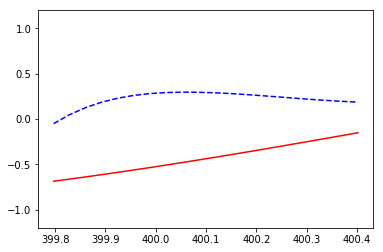

   [[400.43383682 400.46566781 400.4974988  400.52932979 400.56116077
  400.59299176 400.62482275 400.65665374 400.68848473 400.72031572
  400.75214671 400.78397769 400.81580868 400.84763967 400.87947066
  400.91130165 400.94313264 400.97496363 401.00679461 401.0386256 ]
 [401.07045659 401.10228758 401.13411857 401.16594956 401.19778055
  401.22961153 401.26144252 401.29327351 401.3251045  401.35693549
  401.38876648 401.42059747 401.45242845 401.48425944 401.51609043
  401.54792142 401.57975241 401.6115834  401.64341439 401.67524538]
 [401.70707636 401.73890735 401.77073834 401.80256933 401.83440032
  401.86623131 401.8980623  401.92989328 401.96172427 401.99355526
  402.02538625 402.05721724 402.08904823 402.12087922 402.1527102
  402.18454119 402.21637218 402.24820317 402.28003416 402.31186515]
 [402.34369614 402.37552712 402.40735811 402.4391891  402.47102009
  402.50285108 402.53468207 402.56651306 402.59834405 402.63017503
  402.66200602 402.69383701 402.725668   402.75749899 402

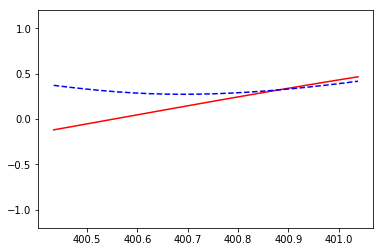

   [[401.07045659 401.10228758 401.13411857 401.16594956 401.19778055
  401.22961153 401.26144252 401.29327351 401.3251045  401.35693549
  401.38876648 401.42059747 401.45242845 401.48425944 401.51609043
  401.54792142 401.57975241 401.6115834  401.64341439 401.67524538]
 [401.70707636 401.73890735 401.77073834 401.80256933 401.83440032
  401.86623131 401.8980623  401.92989328 401.96172427 401.99355526
  402.02538625 402.05721724 402.08904823 402.12087922 402.1527102
  402.18454119 402.21637218 402.24820317 402.28003416 402.31186515]
 [402.34369614 402.37552712 402.40735811 402.4391891  402.47102009
  402.50285108 402.53468207 402.56651306 402.59834405 402.63017503
  402.66200602 402.69383701 402.725668   402.75749899 402.78932998
  402.82116097 402.85299195 402.88482294 402.91665393 402.94848492]
 [402.98031591 403.0121469  403.04397789 403.07580887 403.10763986
  403.13947085 403.17130184 403.20313283 403.23496382 403.26679481
  403.29862579 403.33045678 403.36228777 403.39411876 403

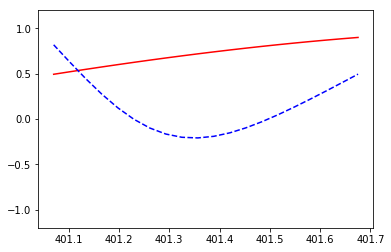

   [[401.70707636 401.73890735 401.77073834 401.80256933 401.83440032
  401.86623131 401.8980623  401.92989328 401.96172427 401.99355526
  402.02538625 402.05721724 402.08904823 402.12087922 402.1527102
  402.18454119 402.21637218 402.24820317 402.28003416 402.31186515]
 [402.34369614 402.37552712 402.40735811 402.4391891  402.47102009
  402.50285108 402.53468207 402.56651306 402.59834405 402.63017503
  402.66200602 402.69383701 402.725668   402.75749899 402.78932998
  402.82116097 402.85299195 402.88482294 402.91665393 402.94848492]
 [402.98031591 403.0121469  403.04397789 403.07580887 403.10763986
  403.13947085 403.17130184 403.20313283 403.23496382 403.26679481
  403.29862579 403.33045678 403.36228777 403.39411876 403.42594975
  403.45778074 403.48961173 403.52144272 403.5532737  403.58510469]
 [403.61693568 403.64876667 403.68059766 403.71242865 403.74425964
  403.77609062 403.80792161 403.8397526  403.87158359 403.90341458
  403.93524557 403.96707656 403.99890754 404.03073853 404

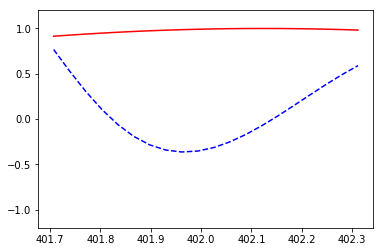

   [[402.34369614 402.37552712 402.40735811 402.4391891  402.47102009
  402.50285108 402.53468207 402.56651306 402.59834405 402.63017503
  402.66200602 402.69383701 402.725668   402.75749899 402.78932998
  402.82116097 402.85299195 402.88482294 402.91665393 402.94848492]
 [402.98031591 403.0121469  403.04397789 403.07580887 403.10763986
  403.13947085 403.17130184 403.20313283 403.23496382 403.26679481
  403.29862579 403.33045678 403.36228777 403.39411876 403.42594975
  403.45778074 403.48961173 403.52144272 403.5532737  403.58510469]
 [403.61693568 403.64876667 403.68059766 403.71242865 403.74425964
  403.77609062 403.80792161 403.8397526  403.87158359 403.90341458
  403.93524557 403.96707656 403.99890754 404.03073853 404.06256952
  404.09440051 404.1262315  404.15806249 404.18989348 404.22172446]
 [404.25355545 404.28538644 404.31721743 404.34904842 404.38087941
  404.4127104  404.44454139 404.47637237 404.50820336 404.54003435
  404.57186534 404.60369633 404.63552732 404.66735831 40

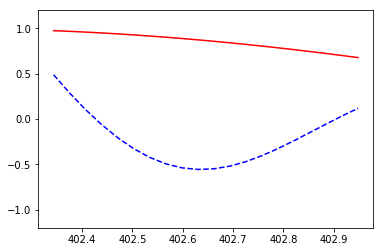

   0.025511472
   [[402.98031591 403.0121469  403.04397789 403.07580887 403.10763986
  403.13947085 403.17130184 403.20313283 403.23496382 403.26679481
  403.29862579 403.33045678 403.36228777 403.39411876 403.42594975
  403.45778074 403.48961173 403.52144272 403.5532737  403.58510469]
 [403.61693568 403.64876667 403.68059766 403.71242865 403.74425964
  403.77609062 403.80792161 403.8397526  403.87158359 403.90341458
  403.93524557 403.96707656 403.99890754 404.03073853 404.06256952
  404.09440051 404.1262315  404.15806249 404.18989348 404.22172446]
 [404.25355545 404.28538644 404.31721743 404.34904842 404.38087941
  404.4127104  404.44454139 404.47637237 404.50820336 404.54003435
  404.57186534 404.60369633 404.63552732 404.66735831 404.69918929
  404.73102028 404.76285127 404.79468226 404.82651325 404.85834424]
 [404.89017523 404.92200621 404.9538372  404.98566819 405.01749918
  405.04933017 405.08116116 405.11299215 405.14482313 405.17665412
  405.20848511 405.2403161  405.27214709 

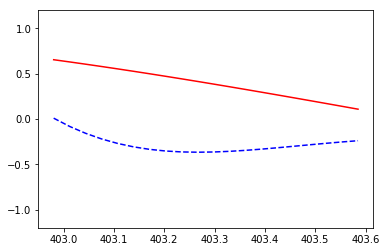

   [[403.61693568 403.64876667 403.68059766 403.71242865 403.74425964
  403.77609062 403.80792161 403.8397526  403.87158359 403.90341458
  403.93524557 403.96707656 403.99890754 404.03073853 404.06256952
  404.09440051 404.1262315  404.15806249 404.18989348 404.22172446]
 [404.25355545 404.28538644 404.31721743 404.34904842 404.38087941
  404.4127104  404.44454139 404.47637237 404.50820336 404.54003435
  404.57186534 404.60369633 404.63552732 404.66735831 404.69918929
  404.73102028 404.76285127 404.79468226 404.82651325 404.85834424]
 [404.89017523 404.92200621 404.9538372  404.98566819 405.01749918
  405.04933017 405.08116116 405.11299215 405.14482313 405.17665412
  405.20848511 405.2403161  405.27214709 405.30397808 405.33580907
  405.36764006 405.39947104 405.43130203 405.46313302 405.49496401]
 [405.526795   405.55862599 405.59045698 405.62228796 405.65411895
  405.68594994 405.71778093 405.74961192 405.78144291 405.8132739
  405.84510488 405.87693587 405.90876686 405.94059785 405

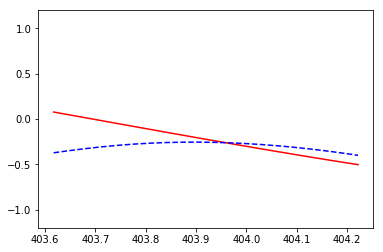

   [[404.25355545 404.28538644 404.31721743 404.34904842 404.38087941
  404.4127104  404.44454139 404.47637237 404.50820336 404.54003435
  404.57186534 404.60369633 404.63552732 404.66735831 404.69918929
  404.73102028 404.76285127 404.79468226 404.82651325 404.85834424]
 [404.89017523 404.92200621 404.9538372  404.98566819 405.01749918
  405.04933017 405.08116116 405.11299215 405.14482313 405.17665412
  405.20848511 405.2403161  405.27214709 405.30397808 405.33580907
  405.36764006 405.39947104 405.43130203 405.46313302 405.49496401]
 [405.526795   405.55862599 405.59045698 405.62228796 405.65411895
  405.68594994 405.71778093 405.74961192 405.78144291 405.8132739
  405.84510488 405.87693587 405.90876686 405.94059785 405.97242884
  406.00425983 406.03609082 406.0679218  406.09975279 406.13158378]
 [406.16341477 406.19524576 406.22707675 406.25890774 406.29073872
  406.32256971 406.3544007  406.38623169 406.41806268 406.44989367
  406.48172466 406.51355565 406.54538663 406.57721762 406

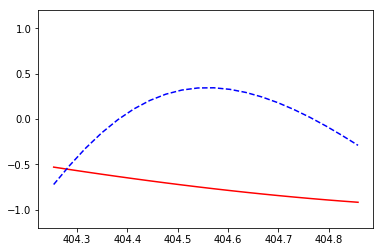

   [[404.89017523 404.92200621 404.9538372  404.98566819 405.01749918
  405.04933017 405.08116116 405.11299215 405.14482313 405.17665412
  405.20848511 405.2403161  405.27214709 405.30397808 405.33580907
  405.36764006 405.39947104 405.43130203 405.46313302 405.49496401]
 [405.526795   405.55862599 405.59045698 405.62228796 405.65411895
  405.68594994 405.71778093 405.74961192 405.78144291 405.8132739
  405.84510488 405.87693587 405.90876686 405.94059785 405.97242884
  406.00425983 406.03609082 406.0679218  406.09975279 406.13158378]
 [406.16341477 406.19524576 406.22707675 406.25890774 406.29073872
  406.32256971 406.3544007  406.38623169 406.41806268 406.44989367
  406.48172466 406.51355565 406.54538663 406.57721762 406.60904861
  406.6408796  406.67271059 406.70454158 406.73637257 406.76820355]
 [406.80003454 406.83186553 406.86369652 406.89552751 406.9273585
  406.95918949 406.99102047 407.02285146 407.05468245 407.08651344
  407.11834443 407.15017542 407.18200641 407.21383739 407.

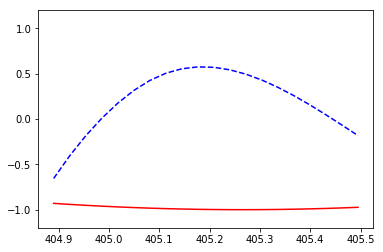

   [[405.526795   405.55862599 405.59045698 405.62228796 405.65411895
  405.68594994 405.71778093 405.74961192 405.78144291 405.8132739
  405.84510488 405.87693587 405.90876686 405.94059785 405.97242884
  406.00425983 406.03609082 406.0679218  406.09975279 406.13158378]
 [406.16341477 406.19524576 406.22707675 406.25890774 406.29073872
  406.32256971 406.3544007  406.38623169 406.41806268 406.44989367
  406.48172466 406.51355565 406.54538663 406.57721762 406.60904861
  406.6408796  406.67271059 406.70454158 406.73637257 406.76820355]
 [406.80003454 406.83186553 406.86369652 406.89552751 406.9273585
  406.95918949 406.99102047 407.02285146 407.05468245 407.08651344
  407.11834443 407.15017542 407.18200641 407.21383739 407.24566838
  407.27749937 407.30933036 407.34116135 407.37299234 407.40482333]
 [407.43665432 407.4684853  407.50031629 407.53214728 407.56397827
  407.59580926 407.62764025 407.65947124 407.69130222 407.72313321
  407.7549642  407.78679519 407.81862618 407.85045717 407.

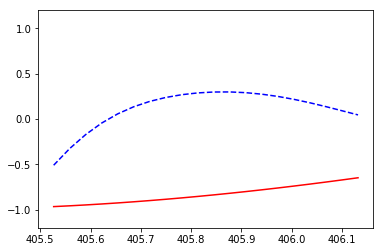

   [[406.16341477 406.19524576 406.22707675 406.25890774 406.29073872
  406.32256971 406.3544007  406.38623169 406.41806268 406.44989367
  406.48172466 406.51355565 406.54538663 406.57721762 406.60904861
  406.6408796  406.67271059 406.70454158 406.73637257 406.76820355]
 [406.80003454 406.83186553 406.86369652 406.89552751 406.9273585
  406.95918949 406.99102047 407.02285146 407.05468245 407.08651344
  407.11834443 407.15017542 407.18200641 407.21383739 407.24566838
  407.27749937 407.30933036 407.34116135 407.37299234 407.40482333]
 [407.43665432 407.4684853  407.50031629 407.53214728 407.56397827
  407.59580926 407.62764025 407.65947124 407.69130222 407.72313321
  407.7549642  407.78679519 407.81862618 407.85045717 407.88228816
  407.91411914 407.94595013 407.97778112 408.00961211 408.0414431 ]
 [408.07327409 408.10510508 408.13693606 408.16876705 408.20059804
  408.23242903 408.26426002 408.29609101 408.327922   408.35975299
  408.39158397 408.42341496 408.45524595 408.48707694 408

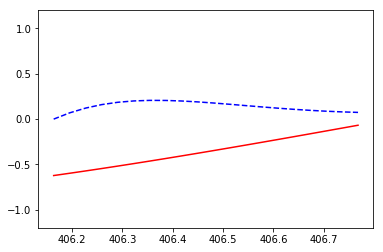

   [[406.80003454 406.83186553 406.86369652 406.89552751 406.9273585
  406.95918949 406.99102047 407.02285146 407.05468245 407.08651344
  407.11834443 407.15017542 407.18200641 407.21383739 407.24566838
  407.27749937 407.30933036 407.34116135 407.37299234 407.40482333]
 [407.43665432 407.4684853  407.50031629 407.53214728 407.56397827
  407.59580926 407.62764025 407.65947124 407.69130222 407.72313321
  407.7549642  407.78679519 407.81862618 407.85045717 407.88228816
  407.91411914 407.94595013 407.97778112 408.00961211 408.0414431 ]
 [408.07327409 408.10510508 408.13693606 408.16876705 408.20059804
  408.23242903 408.26426002 408.29609101 408.327922   408.35975299
  408.39158397 408.42341496 408.45524595 408.48707694 408.51890793
  408.55073892 408.58256991 408.61440089 408.64623188 408.67806287]
 [408.70989386 408.74172485 408.77355584 408.80538683 408.83721781
  408.8690488  408.90087979 408.93271078 408.96454177 408.99637276
  409.02820375 409.06003473 409.09186572 409.12369671 409

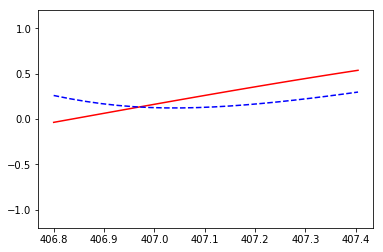

   [[407.43665432 407.4684853  407.50031629 407.53214728 407.56397827
  407.59580926 407.62764025 407.65947124 407.69130222 407.72313321
  407.7549642  407.78679519 407.81862618 407.85045717 407.88228816
  407.91411914 407.94595013 407.97778112 408.00961211 408.0414431 ]
 [408.07327409 408.10510508 408.13693606 408.16876705 408.20059804
  408.23242903 408.26426002 408.29609101 408.327922   408.35975299
  408.39158397 408.42341496 408.45524595 408.48707694 408.51890793
  408.55073892 408.58256991 408.61440089 408.64623188 408.67806287]
 [408.70989386 408.74172485 408.77355584 408.80538683 408.83721781
  408.8690488  408.90087979 408.93271078 408.96454177 408.99637276
  409.02820375 409.06003473 409.09186572 409.12369671 409.1555277
  409.18735869 409.21918968 409.25102067 409.28285166 409.31468264]
 [409.34651363 409.37834462 409.41017561 409.4420066  409.47383759
  409.50566858 409.53749956 409.56933055 409.60116154 409.63299253
  409.66482352 409.69665451 409.7284855  409.76031648 409

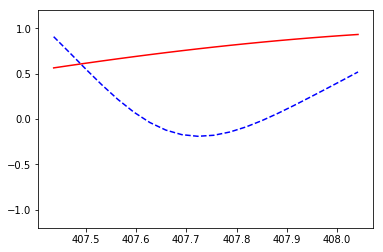

   [[408.07327409 408.10510508 408.13693606 408.16876705 408.20059804
  408.23242903 408.26426002 408.29609101 408.327922   408.35975299
  408.39158397 408.42341496 408.45524595 408.48707694 408.51890793
  408.55073892 408.58256991 408.61440089 408.64623188 408.67806287]
 [408.70989386 408.74172485 408.77355584 408.80538683 408.83721781
  408.8690488  408.90087979 408.93271078 408.96454177 408.99637276
  409.02820375 409.06003473 409.09186572 409.12369671 409.1555277
  409.18735869 409.21918968 409.25102067 409.28285166 409.31468264]
 [409.34651363 409.37834462 409.41017561 409.4420066  409.47383759
  409.50566858 409.53749956 409.56933055 409.60116154 409.63299253
  409.66482352 409.69665451 409.7284855  409.76031648 409.79214747
  409.82397846 409.85580945 409.88764044 409.91947143 409.95130242]
 [409.9831334  410.01496439 410.04679538 410.07862637 410.11045736
  410.14228835 410.17411934 410.20595033 410.23778131 410.2696123
  410.30144329 410.33327428 410.36510527 410.39693626 410.

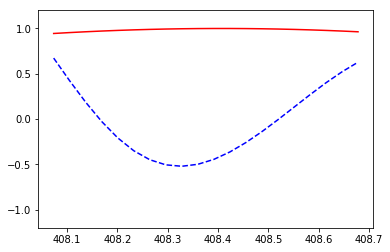

   [[408.70989386 408.74172485 408.77355584 408.80538683 408.83721781
  408.8690488  408.90087979 408.93271078 408.96454177 408.99637276
  409.02820375 409.06003473 409.09186572 409.12369671 409.1555277
  409.18735869 409.21918968 409.25102067 409.28285166 409.31468264]
 [409.34651363 409.37834462 409.41017561 409.4420066  409.47383759
  409.50566858 409.53749956 409.56933055 409.60116154 409.63299253
  409.66482352 409.69665451 409.7284855  409.76031648 409.79214747
  409.82397846 409.85580945 409.88764044 409.91947143 409.95130242]
 [409.9831334  410.01496439 410.04679538 410.07862637 410.11045736
  410.14228835 410.17411934 410.20595033 410.23778131 410.2696123
  410.30144329 410.33327428 410.36510527 410.39693626 410.42876725
  410.46059823 410.49242922 410.52426021 410.5560912  410.58792219]
 [410.61975318 410.65158417 410.68341515 410.71524614 410.74707713
  410.77890812 410.81073911 410.8425701  410.87440109 410.90623207
  410.93806306 410.96989405 411.00172504 411.03355603 411.

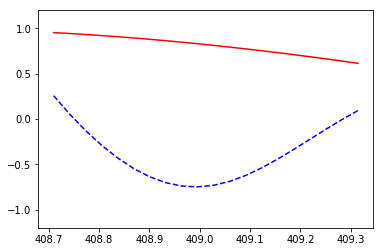

   0.023013739
   [[409.34651363 409.37834462 409.41017561 409.4420066  409.47383759
  409.50566858 409.53749956 409.56933055 409.60116154 409.63299253
  409.66482352 409.69665451 409.7284855  409.76031648 409.79214747
  409.82397846 409.85580945 409.88764044 409.91947143 409.95130242]
 [409.9831334  410.01496439 410.04679538 410.07862637 410.11045736
  410.14228835 410.17411934 410.20595033 410.23778131 410.2696123
  410.30144329 410.33327428 410.36510527 410.39693626 410.42876725
  410.46059823 410.49242922 410.52426021 410.5560912  410.58792219]
 [410.61975318 410.65158417 410.68341515 410.71524614 410.74707713
  410.77890812 410.81073911 410.8425701  410.87440109 410.90623207
  410.93806306 410.96989405 411.00172504 411.03355603 411.06538702
  411.09721801 411.12904899 411.16087998 411.19271097 411.22454196]
 [411.25637295 411.28820394 411.32003493 411.35186592 411.3836969
  411.41552789 411.44735888 411.47918987 411.51102086 411.54285185
  411.57468284 411.60651382 411.63834481 41

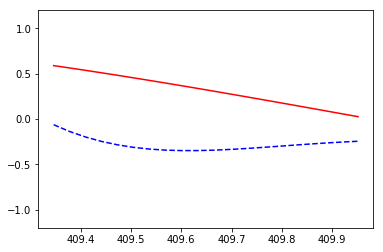

   [[409.9831334  410.01496439 410.04679538 410.07862637 410.11045736
  410.14228835 410.17411934 410.20595033 410.23778131 410.2696123
  410.30144329 410.33327428 410.36510527 410.39693626 410.42876725
  410.46059823 410.49242922 410.52426021 410.5560912  410.58792219]
 [410.61975318 410.65158417 410.68341515 410.71524614 410.74707713
  410.77890812 410.81073911 410.8425701  410.87440109 410.90623207
  410.93806306 410.96989405 411.00172504 411.03355603 411.06538702
  411.09721801 411.12904899 411.16087998 411.19271097 411.22454196]
 [411.25637295 411.28820394 411.32003493 411.35186592 411.3836969
  411.41552789 411.44735888 411.47918987 411.51102086 411.54285185
  411.57468284 411.60651382 411.63834481 411.6701758  411.70200679
  411.73383778 411.76566877 411.79749976 411.82933074 411.86116173]
 [411.89299272 411.92482371 411.9566547  411.98848569 412.02031668
  412.05214766 412.08397865 412.11580964 412.14764063 412.17947162
  412.21130261 412.2431336  412.27496459 412.30679557 412.

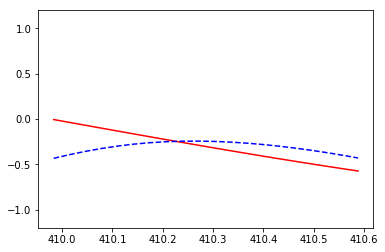

   [[410.61975318 410.65158417 410.68341515 410.71524614 410.74707713
  410.77890812 410.81073911 410.8425701  410.87440109 410.90623207
  410.93806306 410.96989405 411.00172504 411.03355603 411.06538702
  411.09721801 411.12904899 411.16087998 411.19271097 411.22454196]
 [411.25637295 411.28820394 411.32003493 411.35186592 411.3836969
  411.41552789 411.44735888 411.47918987 411.51102086 411.54285185
  411.57468284 411.60651382 411.63834481 411.6701758  411.70200679
  411.73383778 411.76566877 411.79749976 411.82933074 411.86116173]
 [411.89299272 411.92482371 411.9566547  411.98848569 412.02031668
  412.05214766 412.08397865 412.11580964 412.14764063 412.17947162
  412.21130261 412.2431336  412.27496459 412.30679557 412.33862656
  412.37045755 412.40228854 412.43411953 412.46595052 412.49778151]
 [412.52961249 412.56144348 412.59327447 412.62510546 412.65693645
  412.68876744 412.72059843 412.75242941 412.7842604  412.81609139
  412.84792238 412.87975337 412.91158436 412.94341535 412

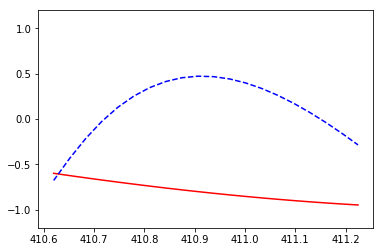

   [[411.25637295 411.28820394 411.32003493 411.35186592 411.3836969
  411.41552789 411.44735888 411.47918987 411.51102086 411.54285185
  411.57468284 411.60651382 411.63834481 411.6701758  411.70200679
  411.73383778 411.76566877 411.79749976 411.82933074 411.86116173]
 [411.89299272 411.92482371 411.9566547  411.98848569 412.02031668
  412.05214766 412.08397865 412.11580964 412.14764063 412.17947162
  412.21130261 412.2431336  412.27496459 412.30679557 412.33862656
  412.37045755 412.40228854 412.43411953 412.46595052 412.49778151]
 [412.52961249 412.56144348 412.59327447 412.62510546 412.65693645
  412.68876744 412.72059843 412.75242941 412.7842604  412.81609139
  412.84792238 412.87975337 412.91158436 412.94341535 412.97524633
  413.00707732 413.03890831 413.0707393  413.10257029 413.13440128]
 [413.16623227 413.19806326 413.22989424 413.26172523 413.29355622
  413.32538721 413.3572182  413.38904919 413.42088018 413.45271116
  413.48454215 413.51637314 413.54820413 413.58003512 413

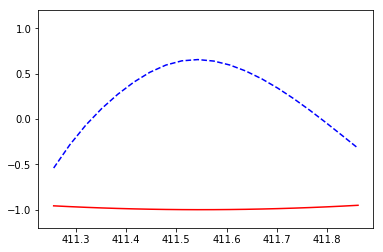

   [[411.89299272 411.92482371 411.9566547  411.98848569 412.02031668
  412.05214766 412.08397865 412.11580964 412.14764063 412.17947162
  412.21130261 412.2431336  412.27496459 412.30679557 412.33862656
  412.37045755 412.40228854 412.43411953 412.46595052 412.49778151]
 [412.52961249 412.56144348 412.59327447 412.62510546 412.65693645
  412.68876744 412.72059843 412.75242941 412.7842604  412.81609139
  412.84792238 412.87975337 412.91158436 412.94341535 412.97524633
  413.00707732 413.03890831 413.0707393  413.10257029 413.13440128]
 [413.16623227 413.19806326 413.22989424 413.26172523 413.29355622
  413.32538721 413.3572182  413.38904919 413.42088018 413.45271116
  413.48454215 413.51637314 413.54820413 413.58003512 413.61186611
  413.6436971  413.67552808 413.70735907 413.73919006 413.77102105]
 [413.80285204 413.83468303 413.86651402 413.898345   413.93017599
  413.96200698 413.99383797 414.02566896 414.05749995 414.08933094
  414.12116193 414.15299291 414.1848239  414.21665489 41

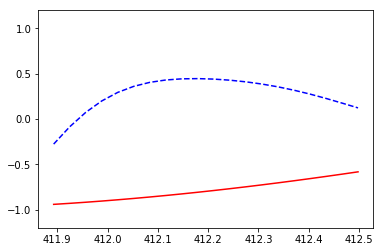

   [[412.52961249 412.56144348 412.59327447 412.62510546 412.65693645
  412.68876744 412.72059843 412.75242941 412.7842604  412.81609139
  412.84792238 412.87975337 412.91158436 412.94341535 412.97524633
  413.00707732 413.03890831 413.0707393  413.10257029 413.13440128]
 [413.16623227 413.19806326 413.22989424 413.26172523 413.29355622
  413.32538721 413.3572182  413.38904919 413.42088018 413.45271116
  413.48454215 413.51637314 413.54820413 413.58003512 413.61186611
  413.6436971  413.67552808 413.70735907 413.73919006 413.77102105]
 [413.80285204 413.83468303 413.86651402 413.898345   413.93017599
  413.96200698 413.99383797 414.02566896 414.05749995 414.08933094
  414.12116193 414.15299291 414.1848239  414.21665489 414.24848588
  414.28031687 414.31214786 414.34397885 414.37580983 414.40764082]
 [414.43947181 414.4713028  414.50313379 414.53496478 414.56679577
  414.59862675 414.63045774 414.66228873 414.69411972 414.72595071
  414.7577817  414.78961269 414.82144367 414.85327466 41

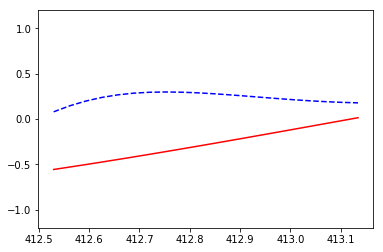

   [[413.16623227 413.19806326 413.22989424 413.26172523 413.29355622
  413.32538721 413.3572182  413.38904919 413.42088018 413.45271116
  413.48454215 413.51637314 413.54820413 413.58003512 413.61186611
  413.6436971  413.67552808 413.70735907 413.73919006 413.77102105]
 [413.80285204 413.83468303 413.86651402 413.898345   413.93017599
  413.96200698 413.99383797 414.02566896 414.05749995 414.08933094
  414.12116193 414.15299291 414.1848239  414.21665489 414.24848588
  414.28031687 414.31214786 414.34397885 414.37580983 414.40764082]
 [414.43947181 414.4713028  414.50313379 414.53496478 414.56679577
  414.59862675 414.63045774 414.66228873 414.69411972 414.72595071
  414.7577817  414.78961269 414.82144367 414.85327466 414.88510565
  414.91693664 414.94876763 414.98059862 415.01242961 415.0442606 ]
 [415.07609158 415.10792257 415.13975356 415.17158455 415.20341554
  415.23524653 415.26707752 415.2989085  415.33073949 415.36257048
  415.39440147 415.42623246 415.45806345 415.48989444 41

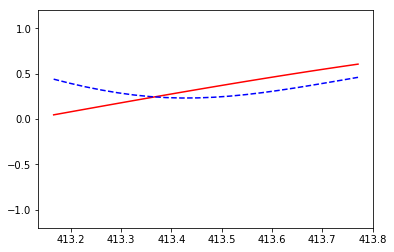

   [[413.80285204 413.83468303 413.86651402 413.898345   413.93017599
  413.96200698 413.99383797 414.02566896 414.05749995 414.08933094
  414.12116193 414.15299291 414.1848239  414.21665489 414.24848588
  414.28031687 414.31214786 414.34397885 414.37580983 414.40764082]
 [414.43947181 414.4713028  414.50313379 414.53496478 414.56679577
  414.59862675 414.63045774 414.66228873 414.69411972 414.72595071
  414.7577817  414.78961269 414.82144367 414.85327466 414.88510565
  414.91693664 414.94876763 414.98059862 415.01242961 415.0442606 ]
 [415.07609158 415.10792257 415.13975356 415.17158455 415.20341554
  415.23524653 415.26707752 415.2989085  415.33073949 415.36257048
  415.39440147 415.42623246 415.45806345 415.48989444 415.52172542
  415.55355641 415.5853874  415.61721839 415.64904938 415.68088037]
 [415.71271136 415.74454234 415.77637333 415.80820432 415.84003531
  415.8718663  415.90369729 415.93552828 415.96735926 415.99919025
  416.03102124 416.06285223 416.09468322 416.12651421 41

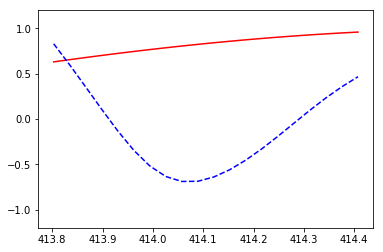

   [[414.43947181 414.4713028  414.50313379 414.53496478 414.56679577
  414.59862675 414.63045774 414.66228873 414.69411972 414.72595071
  414.7577817  414.78961269 414.82144367 414.85327466 414.88510565
  414.91693664 414.94876763 414.98059862 415.01242961 415.0442606 ]
 [415.07609158 415.10792257 415.13975356 415.17158455 415.20341554
  415.23524653 415.26707752 415.2989085  415.33073949 415.36257048
  415.39440147 415.42623246 415.45806345 415.48989444 415.52172542
  415.55355641 415.5853874  415.61721839 415.64904938 415.68088037]
 [415.71271136 415.74454234 415.77637333 415.80820432 415.84003531
  415.8718663  415.90369729 415.93552828 415.96735926 415.99919025
  416.03102124 416.06285223 416.09468322 416.12651421 416.1583452
  416.19017619 416.22200717 416.25383816 416.28566915 416.31750014]
 [416.34933113 416.38116212 416.41299311 416.44482409 416.47665508
  416.50848607 416.54031706 416.57214805 416.60397904 416.63581003
  416.66764101 416.699472   416.73130299 416.76313398 416

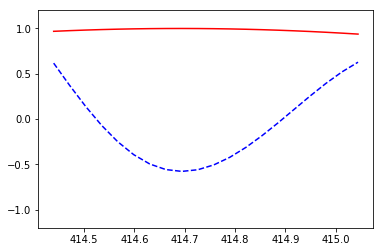

   [[415.07609158 415.10792257 415.13975356 415.17158455 415.20341554
  415.23524653 415.26707752 415.2989085  415.33073949 415.36257048
  415.39440147 415.42623246 415.45806345 415.48989444 415.52172542
  415.55355641 415.5853874  415.61721839 415.64904938 415.68088037]
 [415.71271136 415.74454234 415.77637333 415.80820432 415.84003531
  415.8718663  415.90369729 415.93552828 415.96735926 415.99919025
  416.03102124 416.06285223 416.09468322 416.12651421 416.1583452
  416.19017619 416.22200717 416.25383816 416.28566915 416.31750014]
 [416.34933113 416.38116212 416.41299311 416.44482409 416.47665508
  416.50848607 416.54031706 416.57214805 416.60397904 416.63581003
  416.66764101 416.699472   416.73130299 416.76313398 416.79496497
  416.82679596 416.85862695 416.89045793 416.92228892 416.95411991]
 [416.9859509  417.01778189 417.04961288 417.08144387 417.11327486
  417.14510584 417.17693683 417.20876782 417.24059881 417.2724298
  417.30426079 417.33609178 417.36792276 417.39975375 417.

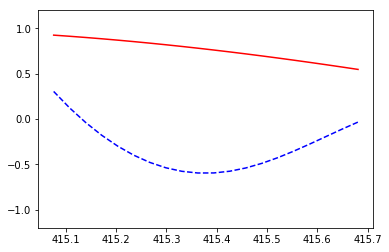

   0.02867506
   [[415.71271136 415.74454234 415.77637333 415.80820432 415.84003531
  415.8718663  415.90369729 415.93552828 415.96735926 415.99919025
  416.03102124 416.06285223 416.09468322 416.12651421 416.1583452
  416.19017619 416.22200717 416.25383816 416.28566915 416.31750014]
 [416.34933113 416.38116212 416.41299311 416.44482409 416.47665508
  416.50848607 416.54031706 416.57214805 416.60397904 416.63581003
  416.66764101 416.699472   416.73130299 416.76313398 416.79496497
  416.82679596 416.85862695 416.89045793 416.92228892 416.95411991]
 [416.9859509  417.01778189 417.04961288 417.08144387 417.11327486
  417.14510584 417.17693683 417.20876782 417.24059881 417.2724298
  417.30426079 417.33609178 417.36792276 417.39975375 417.43158474
  417.46341573 417.49524672 417.52707771 417.5589087  417.59073968]
 [417.62257067 417.65440166 417.68623265 417.71806364 417.74989463
  417.78172562 417.8135566  417.84538759 417.87721858 417.90904957
  417.94088056 417.97271155 418.00454254 418

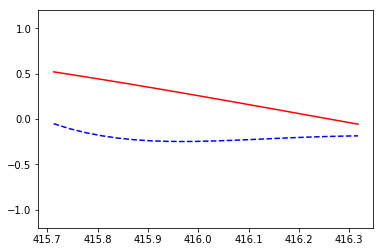

   [[416.34933113 416.38116212 416.41299311 416.44482409 416.47665508
  416.50848607 416.54031706 416.57214805 416.60397904 416.63581003
  416.66764101 416.699472   416.73130299 416.76313398 416.79496497
  416.82679596 416.85862695 416.89045793 416.92228892 416.95411991]
 [416.9859509  417.01778189 417.04961288 417.08144387 417.11327486
  417.14510584 417.17693683 417.20876782 417.24059881 417.2724298
  417.30426079 417.33609178 417.36792276 417.39975375 417.43158474
  417.46341573 417.49524672 417.52707771 417.5589087  417.59073968]
 [417.62257067 417.65440166 417.68623265 417.71806364 417.74989463
  417.78172562 417.8135566  417.84538759 417.87721858 417.90904957
  417.94088056 417.97271155 418.00454254 418.03637353 418.06820451
  418.1000355  418.13186649 418.16369748 418.19552847 418.22735946]
 [418.25919045 418.29102143 418.32285242 418.35468341 418.3865144
  418.41834539 418.45017638 418.48200737 418.51383835 418.54566934
  418.57750033 418.60933132 418.64116231 418.6729933  418.

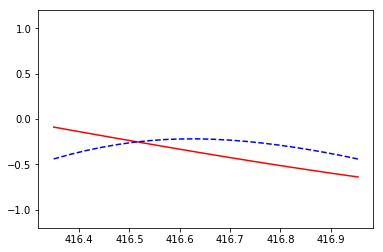

   [[416.9859509  417.01778189 417.04961288 417.08144387 417.11327486
  417.14510584 417.17693683 417.20876782 417.24059881 417.2724298
  417.30426079 417.33609178 417.36792276 417.39975375 417.43158474
  417.46341573 417.49524672 417.52707771 417.5589087  417.59073968]
 [417.62257067 417.65440166 417.68623265 417.71806364 417.74989463
  417.78172562 417.8135566  417.84538759 417.87721858 417.90904957
  417.94088056 417.97271155 418.00454254 418.03637353 418.06820451
  418.1000355  418.13186649 418.16369748 418.19552847 418.22735946]
 [418.25919045 418.29102143 418.32285242 418.35468341 418.3865144
  418.41834539 418.45017638 418.48200737 418.51383835 418.54566934
  418.57750033 418.60933132 418.64116231 418.6729933  418.70482429
  418.73665527 418.76848626 418.80031725 418.83214824 418.86397923]
 [418.89581022 418.92764121 418.9594722  418.99130318 419.02313417
  419.05496516 419.08679615 419.11862714 419.15045813 419.18228912
  419.2141201  419.24595109 419.27778208 419.30961307 419.

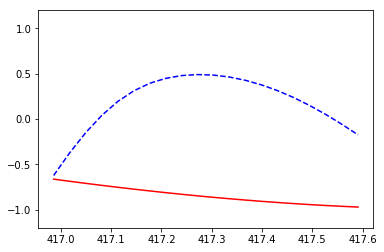

   [[417.62257067 417.65440166 417.68623265 417.71806364 417.74989463
  417.78172562 417.8135566  417.84538759 417.87721858 417.90904957
  417.94088056 417.97271155 418.00454254 418.03637353 418.06820451
  418.1000355  418.13186649 418.16369748 418.19552847 418.22735946]
 [418.25919045 418.29102143 418.32285242 418.35468341 418.3865144
  418.41834539 418.45017638 418.48200737 418.51383835 418.54566934
  418.57750033 418.60933132 418.64116231 418.6729933  418.70482429
  418.73665527 418.76848626 418.80031725 418.83214824 418.86397923]
 [418.89581022 418.92764121 418.9594722  418.99130318 419.02313417
  419.05496516 419.08679615 419.11862714 419.15045813 419.18228912
  419.2141201  419.24595109 419.27778208 419.30961307 419.34144406
  419.37327505 419.40510604 419.43693702 419.46876801 419.500599  ]
 [419.53242999 419.56426098 419.59609197 419.62792296 419.65975394
  419.69158493 419.72341592 419.75524691 419.7870779  419.81890889
  419.85073988 419.88257087 419.91440185 419.94623284 419

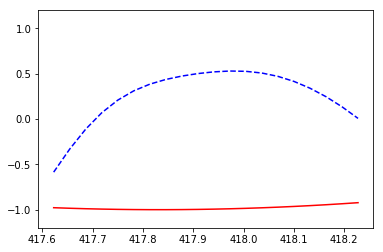

   [[418.25919045 418.29102143 418.32285242 418.35468341 418.3865144
  418.41834539 418.45017638 418.48200737 418.51383835 418.54566934
  418.57750033 418.60933132 418.64116231 418.6729933  418.70482429
  418.73665527 418.76848626 418.80031725 418.83214824 418.86397923]
 [418.89581022 418.92764121 418.9594722  418.99130318 419.02313417
  419.05496516 419.08679615 419.11862714 419.15045813 419.18228912
  419.2141201  419.24595109 419.27778208 419.30961307 419.34144406
  419.37327505 419.40510604 419.43693702 419.46876801 419.500599  ]
 [419.53242999 419.56426098 419.59609197 419.62792296 419.65975394
  419.69158493 419.72341592 419.75524691 419.7870779  419.81890889
  419.85073988 419.88257087 419.91440185 419.94623284 419.97806383
  420.00989482 420.04172581 420.0735568  420.10538779 420.13721877]
 [420.16904976 420.20088075 420.23271174 420.26454273 420.29637372
  420.32820471 420.36003569 420.39186668 420.42369767 420.45552866
  420.48735965 420.51919064 420.55102163 420.58285261 420

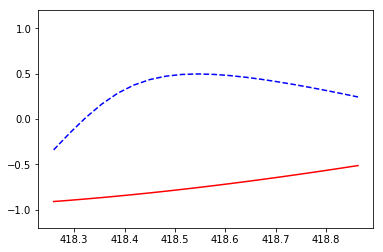

   [[418.89581022 418.92764121 418.9594722  418.99130318 419.02313417
  419.05496516 419.08679615 419.11862714 419.15045813 419.18228912
  419.2141201  419.24595109 419.27778208 419.30961307 419.34144406
  419.37327505 419.40510604 419.43693702 419.46876801 419.500599  ]
 [419.53242999 419.56426098 419.59609197 419.62792296 419.65975394
  419.69158493 419.72341592 419.75524691 419.7870779  419.81890889
  419.85073988 419.88257087 419.91440185 419.94623284 419.97806383
  420.00989482 420.04172581 420.0735568  420.10538779 420.13721877]
 [420.16904976 420.20088075 420.23271174 420.26454273 420.29637372
  420.32820471 420.36003569 420.39186668 420.42369767 420.45552866
  420.48735965 420.51919064 420.55102163 420.58285261 420.6146836
  420.64651459 420.67834558 420.71017657 420.74200756 420.77383855]
 [420.80566953 420.83750052 420.86933151 420.9011625  420.93299349
  420.96482448 420.99665547 421.02848646 421.06031744 421.09214843
  421.12397942 421.15581041 421.1876414  421.21947239 421

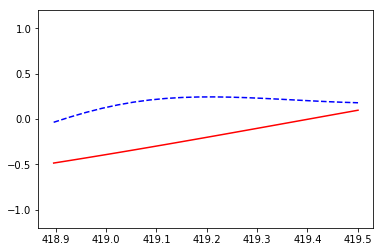

   [[419.53242999 419.56426098 419.59609197 419.62792296 419.65975394
  419.69158493 419.72341592 419.75524691 419.7870779  419.81890889
  419.85073988 419.88257087 419.91440185 419.94623284 419.97806383
  420.00989482 420.04172581 420.0735568  420.10538779 420.13721877]
 [420.16904976 420.20088075 420.23271174 420.26454273 420.29637372
  420.32820471 420.36003569 420.39186668 420.42369767 420.45552866
  420.48735965 420.51919064 420.55102163 420.58285261 420.6146836
  420.64651459 420.67834558 420.71017657 420.74200756 420.77383855]
 [420.80566953 420.83750052 420.86933151 420.9011625  420.93299349
  420.96482448 420.99665547 421.02848646 421.06031744 421.09214843
  421.12397942 421.15581041 421.1876414  421.21947239 421.25130338
  421.28313436 421.31496535 421.34679634 421.37862733 421.41045832]
 [421.44228931 421.4741203  421.50595128 421.53778227 421.56961326
  421.60144425 421.63327524 421.66510623 421.69693722 421.7287682
  421.76059919 421.79243018 421.82426117 421.85609216 421.

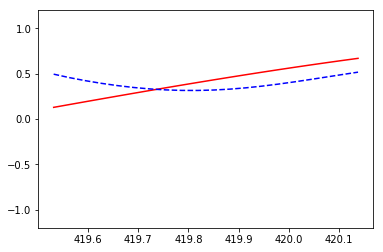

   [[420.16904976 420.20088075 420.23271174 420.26454273 420.29637372
  420.32820471 420.36003569 420.39186668 420.42369767 420.45552866
  420.48735965 420.51919064 420.55102163 420.58285261 420.6146836
  420.64651459 420.67834558 420.71017657 420.74200756 420.77383855]
 [420.80566953 420.83750052 420.86933151 420.9011625  420.93299349
  420.96482448 420.99665547 421.02848646 421.06031744 421.09214843
  421.12397942 421.15581041 421.1876414  421.21947239 421.25130338
  421.28313436 421.31496535 421.34679634 421.37862733 421.41045832]
 [421.44228931 421.4741203  421.50595128 421.53778227 421.56961326
  421.60144425 421.63327524 421.66510623 421.69693722 421.7287682
  421.76059919 421.79243018 421.82426117 421.85609216 421.88792315
  421.91975414 421.95158513 421.98341611 422.0152471  422.04707809]
 [422.07890908 422.11074007 422.14257106 422.17440205 422.20623303
  422.23806402 422.26989501 422.301726   422.33355699 422.36538798
  422.39721897 422.42904995 422.46088094 422.49271193 422.

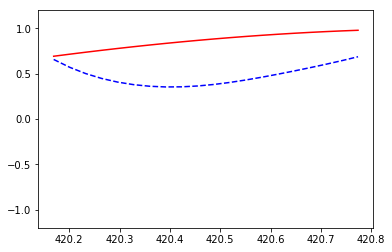

   [[420.80566953 420.83750052 420.86933151 420.9011625  420.93299349
  420.96482448 420.99665547 421.02848646 421.06031744 421.09214843
  421.12397942 421.15581041 421.1876414  421.21947239 421.25130338
  421.28313436 421.31496535 421.34679634 421.37862733 421.41045832]
 [421.44228931 421.4741203  421.50595128 421.53778227 421.56961326
  421.60144425 421.63327524 421.66510623 421.69693722 421.7287682
  421.76059919 421.79243018 421.82426117 421.85609216 421.88792315
  421.91975414 421.95158513 421.98341611 422.0152471  422.04707809]
 [422.07890908 422.11074007 422.14257106 422.17440205 422.20623303
  422.23806402 422.26989501 422.301726   422.33355699 422.36538798
  422.39721897 422.42904995 422.46088094 422.49271193 422.52454292
  422.55637391 422.5882049  422.62003589 422.65186687 422.68369786]
 [422.71552885 422.74735984 422.77919083 422.81102182 422.84285281
  422.8746838  422.90651478 422.93834577 422.97017676 423.00200775
  423.03383874 423.06566973 423.09750072 423.1293317  423

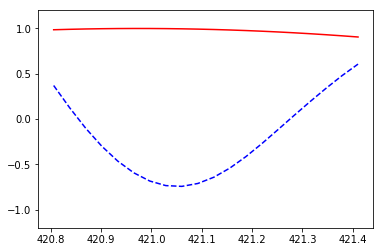

   [[421.44228931 421.4741203  421.50595128 421.53778227 421.56961326
  421.60144425 421.63327524 421.66510623 421.69693722 421.7287682
  421.76059919 421.79243018 421.82426117 421.85609216 421.88792315
  421.91975414 421.95158513 421.98341611 422.0152471  422.04707809]
 [422.07890908 422.11074007 422.14257106 422.17440205 422.20623303
  422.23806402 422.26989501 422.301726   422.33355699 422.36538798
  422.39721897 422.42904995 422.46088094 422.49271193 422.52454292
  422.55637391 422.5882049  422.62003589 422.65186687 422.68369786]
 [422.71552885 422.74735984 422.77919083 422.81102182 422.84285281
  422.8746838  422.90651478 422.93834577 422.97017676 423.00200775
  423.03383874 423.06566973 423.09750072 423.1293317  423.16116269
  423.19299368 423.22482467 423.25665566 423.28848665 423.32031764]
 [423.35214862 423.38397961 423.4158106  423.44764159 423.47947258
  423.51130357 423.54313456 423.57496554 423.60679653 423.63862752
  423.67045851 423.7022895  423.73412049 423.76595148 423

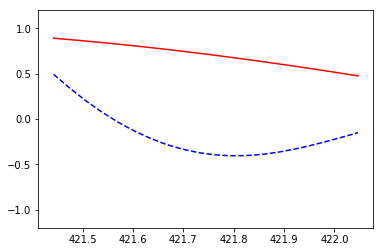

   0.05022632
   [[422.07890908 422.11074007 422.14257106 422.17440205 422.20623303
  422.23806402 422.26989501 422.301726   422.33355699 422.36538798
  422.39721897 422.42904995 422.46088094 422.49271193 422.52454292
  422.55637391 422.5882049  422.62003589 422.65186687 422.68369786]
 [422.71552885 422.74735984 422.77919083 422.81102182 422.84285281
  422.8746838  422.90651478 422.93834577 422.97017676 423.00200775
  423.03383874 423.06566973 423.09750072 423.1293317  423.16116269
  423.19299368 423.22482467 423.25665566 423.28848665 423.32031764]
 [423.35214862 423.38397961 423.4158106  423.44764159 423.47947258
  423.51130357 423.54313456 423.57496554 423.60679653 423.63862752
  423.67045851 423.7022895  423.73412049 423.76595148 423.79778247
  423.82961345 423.86144444 423.89327543 423.92510642 423.95693741]
 [423.9887684  424.02059939 424.05243037 424.08426136 424.11609235
  424.14792334 424.17975433 424.21158532 424.24341631 424.27524729
  424.30707828 424.33890927 424.37074026 4

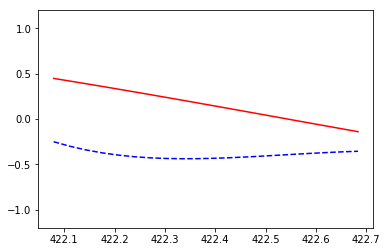

   [[422.71552885 422.74735984 422.77919083 422.81102182 422.84285281
  422.8746838  422.90651478 422.93834577 422.97017676 423.00200775
  423.03383874 423.06566973 423.09750072 423.1293317  423.16116269
  423.19299368 423.22482467 423.25665566 423.28848665 423.32031764]
 [423.35214862 423.38397961 423.4158106  423.44764159 423.47947258
  423.51130357 423.54313456 423.57496554 423.60679653 423.63862752
  423.67045851 423.7022895  423.73412049 423.76595148 423.79778247
  423.82961345 423.86144444 423.89327543 423.92510642 423.95693741]
 [423.9887684  424.02059939 424.05243037 424.08426136 424.11609235
  424.14792334 424.17975433 424.21158532 424.24341631 424.27524729
  424.30707828 424.33890927 424.37074026 424.40257125 424.43440224
  424.46623323 424.49806421 424.5298952  424.56172619 424.59355718]
 [424.62538817 424.65721916 424.68905015 424.72088114 424.75271212
  424.78454311 424.8163741  424.84820509 424.88003608 424.91186707
  424.94369806 424.97552904 425.00736003 425.03919102 42

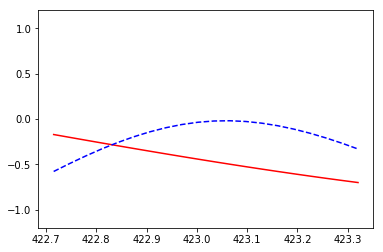

   [[423.35214862 423.38397961 423.4158106  423.44764159 423.47947258
  423.51130357 423.54313456 423.57496554 423.60679653 423.63862752
  423.67045851 423.7022895  423.73412049 423.76595148 423.79778247
  423.82961345 423.86144444 423.89327543 423.92510642 423.95693741]
 [423.9887684  424.02059939 424.05243037 424.08426136 424.11609235
  424.14792334 424.17975433 424.21158532 424.24341631 424.27524729
  424.30707828 424.33890927 424.37074026 424.40257125 424.43440224
  424.46623323 424.49806421 424.5298952  424.56172619 424.59355718]
 [424.62538817 424.65721916 424.68905015 424.72088114 424.75271212
  424.78454311 424.8163741  424.84820509 424.88003608 424.91186707
  424.94369806 424.97552904 425.00736003 425.03919102 425.07102201
  425.102853   425.13468399 425.16651498 425.19834596 425.23017695]
 [425.26200794 425.29383893 425.32566992 425.35750091 425.3893319
  425.42116288 425.45299387 425.48482486 425.51665585 425.54848684
  425.58031783 425.61214882 425.6439798  425.67581079 425

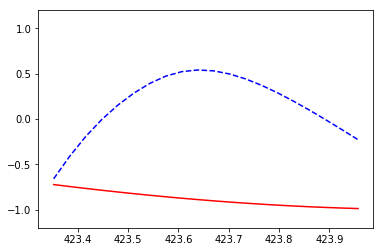

   [[423.9887684  424.02059939 424.05243037 424.08426136 424.11609235
  424.14792334 424.17975433 424.21158532 424.24341631 424.27524729
  424.30707828 424.33890927 424.37074026 424.40257125 424.43440224
  424.46623323 424.49806421 424.5298952  424.56172619 424.59355718]
 [424.62538817 424.65721916 424.68905015 424.72088114 424.75271212
  424.78454311 424.8163741  424.84820509 424.88003608 424.91186707
  424.94369806 424.97552904 425.00736003 425.03919102 425.07102201
  425.102853   425.13468399 425.16651498 425.19834596 425.23017695]
 [425.26200794 425.29383893 425.32566992 425.35750091 425.3893319
  425.42116288 425.45299387 425.48482486 425.51665585 425.54848684
  425.58031783 425.61214882 425.6439798  425.67581079 425.70764178
  425.73947277 425.77130376 425.80313475 425.83496574 425.86679673]
 [425.89862771 425.9304587  425.96228969 425.99412068 426.02595167
  426.05778266 426.08961365 426.12144463 426.15327562 426.18510661
  426.2169376  426.24876859 426.28059958 426.31243057 426

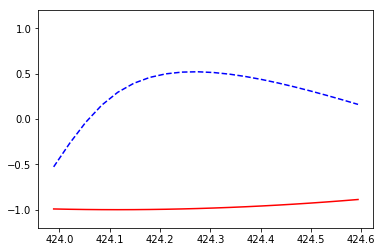

   [[424.62538817 424.65721916 424.68905015 424.72088114 424.75271212
  424.78454311 424.8163741  424.84820509 424.88003608 424.91186707
  424.94369806 424.97552904 425.00736003 425.03919102 425.07102201
  425.102853   425.13468399 425.16651498 425.19834596 425.23017695]
 [425.26200794 425.29383893 425.32566992 425.35750091 425.3893319
  425.42116288 425.45299387 425.48482486 425.51665585 425.54848684
  425.58031783 425.61214882 425.6439798  425.67581079 425.70764178
  425.73947277 425.77130376 425.80313475 425.83496574 425.86679673]
 [425.89862771 425.9304587  425.96228969 425.99412068 426.02595167
  426.05778266 426.08961365 426.12144463 426.15327562 426.18510661
  426.2169376  426.24876859 426.28059958 426.31243057 426.34426155
  426.37609254 426.40792353 426.43975452 426.47158551 426.5034165 ]
 [426.53524749 426.56707847 426.59890946 426.63074045 426.66257144
  426.69440243 426.72623342 426.75806441 426.7898954  426.82172638
  426.85355737 426.88538836 426.91721935 426.94905034 426

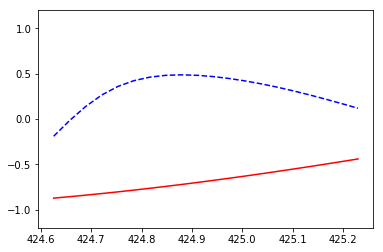

   [[425.26200794 425.29383893 425.32566992 425.35750091 425.3893319
  425.42116288 425.45299387 425.48482486 425.51665585 425.54848684
  425.58031783 425.61214882 425.6439798  425.67581079 425.70764178
  425.73947277 425.77130376 425.80313475 425.83496574 425.86679673]
 [425.89862771 425.9304587  425.96228969 425.99412068 426.02595167
  426.05778266 426.08961365 426.12144463 426.15327562 426.18510661
  426.2169376  426.24876859 426.28059958 426.31243057 426.34426155
  426.37609254 426.40792353 426.43975452 426.47158551 426.5034165 ]
 [426.53524749 426.56707847 426.59890946 426.63074045 426.66257144
  426.69440243 426.72623342 426.75806441 426.7898954  426.82172638
  426.85355737 426.88538836 426.91721935 426.94905034 426.98088133
  427.01271232 427.0445433  427.07637429 427.10820528 427.14003627]
 [427.17186726 427.20369825 427.23552924 427.26736022 427.29919121
  427.3310222  427.36285319 427.39468418 427.42651517 427.45834616
  427.49017714 427.52200813 427.55383912 427.58567011 427

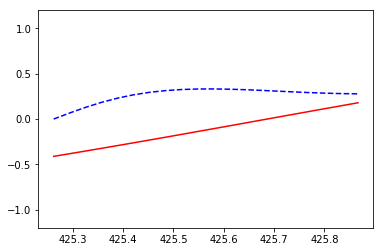

   [[425.89862771 425.9304587  425.96228969 425.99412068 426.02595167
  426.05778266 426.08961365 426.12144463 426.15327562 426.18510661
  426.2169376  426.24876859 426.28059958 426.31243057 426.34426155
  426.37609254 426.40792353 426.43975452 426.47158551 426.5034165 ]
 [426.53524749 426.56707847 426.59890946 426.63074045 426.66257144
  426.69440243 426.72623342 426.75806441 426.7898954  426.82172638
  426.85355737 426.88538836 426.91721935 426.94905034 426.98088133
  427.01271232 427.0445433  427.07637429 427.10820528 427.14003627]
 [427.17186726 427.20369825 427.23552924 427.26736022 427.29919121
  427.3310222  427.36285319 427.39468418 427.42651517 427.45834616
  427.49017714 427.52200813 427.55383912 427.58567011 427.6175011
  427.64933209 427.68116308 427.71299407 427.74482505 427.77665604]
 [427.80848703 427.84031802 427.87214901 427.90398    427.93581099
  427.96764197 427.99947296 428.03130395 428.06313494 428.09496593
  428.12679692 428.15862791 428.19045889 428.22228988 428

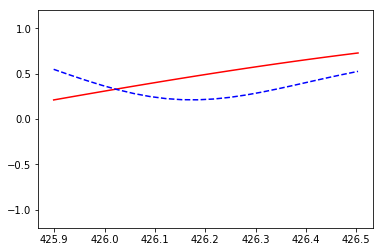

   [[426.53524749 426.56707847 426.59890946 426.63074045 426.66257144
  426.69440243 426.72623342 426.75806441 426.7898954  426.82172638
  426.85355737 426.88538836 426.91721935 426.94905034 426.98088133
  427.01271232 427.0445433  427.07637429 427.10820528 427.14003627]
 [427.17186726 427.20369825 427.23552924 427.26736022 427.29919121
  427.3310222  427.36285319 427.39468418 427.42651517 427.45834616
  427.49017714 427.52200813 427.55383912 427.58567011 427.6175011
  427.64933209 427.68116308 427.71299407 427.74482505 427.77665604]
 [427.80848703 427.84031802 427.87214901 427.90398    427.93581099
  427.96764197 427.99947296 428.03130395 428.06313494 428.09496593
  428.12679692 428.15862791 428.19045889 428.22228988 428.25412087
  428.28595186 428.31778285 428.34961384 428.38144483 428.41327581]
 [428.4451068  428.47693779 428.50876878 428.54059977 428.57243076
  428.60426175 428.63609274 428.66792372 428.69975471 428.7315857
  428.76341669 428.79524768 428.82707867 428.85890966 428.

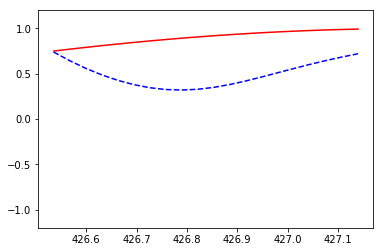

   [[427.17186726 427.20369825 427.23552924 427.26736022 427.29919121
  427.3310222  427.36285319 427.39468418 427.42651517 427.45834616
  427.49017714 427.52200813 427.55383912 427.58567011 427.6175011
  427.64933209 427.68116308 427.71299407 427.74482505 427.77665604]
 [427.80848703 427.84031802 427.87214901 427.90398    427.93581099
  427.96764197 427.99947296 428.03130395 428.06313494 428.09496593
  428.12679692 428.15862791 428.19045889 428.22228988 428.25412087
  428.28595186 428.31778285 428.34961384 428.38144483 428.41327581]
 [428.4451068  428.47693779 428.50876878 428.54059977 428.57243076
  428.60426175 428.63609274 428.66792372 428.69975471 428.7315857
  428.76341669 428.79524768 428.82707867 428.85890966 428.89074064
  428.92257163 428.95440262 428.98623361 429.0180646  429.04989559]
 [429.08172658 429.11355756 429.14538855 429.17721954 429.20905053
  429.24088152 429.27271251 429.3045435  429.33637448 429.36820547
  429.40003646 429.43186745 429.46369844 429.49552943 429.

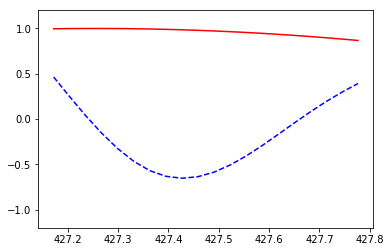

   [[427.80848703 427.84031802 427.87214901 427.90398    427.93581099
  427.96764197 427.99947296 428.03130395 428.06313494 428.09496593
  428.12679692 428.15862791 428.19045889 428.22228988 428.25412087
  428.28595186 428.31778285 428.34961384 428.38144483 428.41327581]
 [428.4451068  428.47693779 428.50876878 428.54059977 428.57243076
  428.60426175 428.63609274 428.66792372 428.69975471 428.7315857
  428.76341669 428.79524768 428.82707867 428.85890966 428.89074064
  428.92257163 428.95440262 428.98623361 429.0180646  429.04989559]
 [429.08172658 429.11355756 429.14538855 429.17721954 429.20905053
  429.24088152 429.27271251 429.3045435  429.33637448 429.36820547
  429.40003646 429.43186745 429.46369844 429.49552943 429.52736042
  429.55919141 429.59102239 429.62285338 429.65468437 429.68651536]
 [429.71834635 429.75017734 429.78200833 429.81383931 429.8456703
  429.87750129 429.90933228 429.94116327 429.97299426 430.00482525
  430.03665623 430.06848722 430.10031821 430.1321492  430.

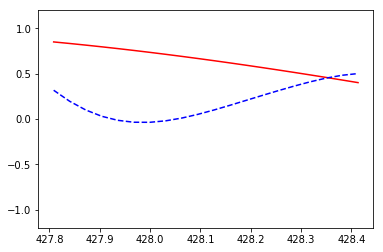

   0.04660869
   [[428.4451068  428.47693779 428.50876878 428.54059977 428.57243076
  428.60426175 428.63609274 428.66792372 428.69975471 428.7315857
  428.76341669 428.79524768 428.82707867 428.85890966 428.89074064
  428.92257163 428.95440262 428.98623361 429.0180646  429.04989559]
 [429.08172658 429.11355756 429.14538855 429.17721954 429.20905053
  429.24088152 429.27271251 429.3045435  429.33637448 429.36820547
  429.40003646 429.43186745 429.46369844 429.49552943 429.52736042
  429.55919141 429.59102239 429.62285338 429.65468437 429.68651536]
 [429.71834635 429.75017734 429.78200833 429.81383931 429.8456703
  429.87750129 429.90933228 429.94116327 429.97299426 430.00482525
  430.03665623 430.06848722 430.10031821 430.1321492  430.16398019
  430.19581118 430.22764217 430.25947315 430.29130414 430.32313513]
 [430.35496612 430.38679711 430.4186281  430.45045909 430.48229007
  430.51412106 430.54595205 430.57778304 430.60961403 430.64144502
  430.67327601 430.705107   430.73693798 430

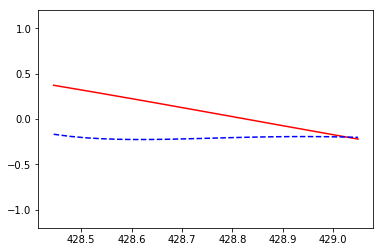

   [[429.08172658 429.11355756 429.14538855 429.17721954 429.20905053
  429.24088152 429.27271251 429.3045435  429.33637448 429.36820547
  429.40003646 429.43186745 429.46369844 429.49552943 429.52736042
  429.55919141 429.59102239 429.62285338 429.65468437 429.68651536]
 [429.71834635 429.75017734 429.78200833 429.81383931 429.8456703
  429.87750129 429.90933228 429.94116327 429.97299426 430.00482525
  430.03665623 430.06848722 430.10031821 430.1321492  430.16398019
  430.19581118 430.22764217 430.25947315 430.29130414 430.32313513]
 [430.35496612 430.38679711 430.4186281  430.45045909 430.48229007
  430.51412106 430.54595205 430.57778304 430.60961403 430.64144502
  430.67327601 430.705107   430.73693798 430.76876897 430.80059996
  430.83243095 430.86426194 430.89609293 430.92792392 430.9597549 ]
 [430.99158589 431.02341688 431.05524787 431.08707886 431.11890985
  431.15074084 431.18257182 431.21440281 431.2462338  431.27806479
  431.30989578 431.34172677 431.37355776 431.40538874 431

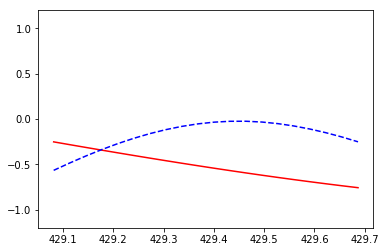

   [[429.71834635 429.75017734 429.78200833 429.81383931 429.8456703
  429.87750129 429.90933228 429.94116327 429.97299426 430.00482525
  430.03665623 430.06848722 430.10031821 430.1321492  430.16398019
  430.19581118 430.22764217 430.25947315 430.29130414 430.32313513]
 [430.35496612 430.38679711 430.4186281  430.45045909 430.48229007
  430.51412106 430.54595205 430.57778304 430.60961403 430.64144502
  430.67327601 430.705107   430.73693798 430.76876897 430.80059996
  430.83243095 430.86426194 430.89609293 430.92792392 430.9597549 ]
 [430.99158589 431.02341688 431.05524787 431.08707886 431.11890985
  431.15074084 431.18257182 431.21440281 431.2462338  431.27806479
  431.30989578 431.34172677 431.37355776 431.40538874 431.43721973
  431.46905072 431.50088171 431.5327127  431.56454369 431.59637468]
 [431.62820567 431.66003665 431.69186764 431.72369863 431.75552962
  431.78736061 431.8191916  431.85102259 431.88285357 431.91468456
  431.94651555 431.97834654 432.01017753 432.04200852 432

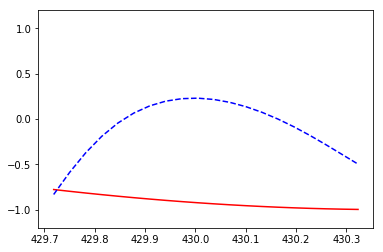

   [[430.35496612 430.38679711 430.4186281  430.45045909 430.48229007
  430.51412106 430.54595205 430.57778304 430.60961403 430.64144502
  430.67327601 430.705107   430.73693798 430.76876897 430.80059996
  430.83243095 430.86426194 430.89609293 430.92792392 430.9597549 ]
 [430.99158589 431.02341688 431.05524787 431.08707886 431.11890985
  431.15074084 431.18257182 431.21440281 431.2462338  431.27806479
  431.30989578 431.34172677 431.37355776 431.40538874 431.43721973
  431.46905072 431.50088171 431.5327127  431.56454369 431.59637468]
 [431.62820567 431.66003665 431.69186764 431.72369863 431.75552962
  431.78736061 431.8191916  431.85102259 431.88285357 431.91468456
  431.94651555 431.97834654 432.01017753 432.04200852 432.07383951
  432.10567049 432.13750148 432.16933247 432.20116346 432.23299445]
 [432.26482544 432.29665643 432.32848741 432.3603184  432.39214939
  432.42398038 432.45581137 432.48764236 432.51947335 432.55130434
  432.58313532 432.61496631 432.6467973  432.67862829 43

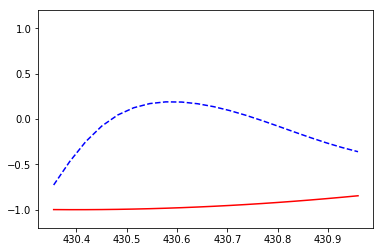

   [[430.99158589 431.02341688 431.05524787 431.08707886 431.11890985
  431.15074084 431.18257182 431.21440281 431.2462338  431.27806479
  431.30989578 431.34172677 431.37355776 431.40538874 431.43721973
  431.46905072 431.50088171 431.5327127  431.56454369 431.59637468]
 [431.62820567 431.66003665 431.69186764 431.72369863 431.75552962
  431.78736061 431.8191916  431.85102259 431.88285357 431.91468456
  431.94651555 431.97834654 432.01017753 432.04200852 432.07383951
  432.10567049 432.13750148 432.16933247 432.20116346 432.23299445]
 [432.26482544 432.29665643 432.32848741 432.3603184  432.39214939
  432.42398038 432.45581137 432.48764236 432.51947335 432.55130434
  432.58313532 432.61496631 432.6467973  432.67862829 432.71045928
  432.74229027 432.77412126 432.80595224 432.83778323 432.86961422]
 [432.90144521 432.9332762  432.96510719 432.99693818 433.02876916
  433.06060015 433.09243114 433.12426213 433.15609312 433.18792411
  433.2197551  433.25158608 433.28341707 433.31524806 43

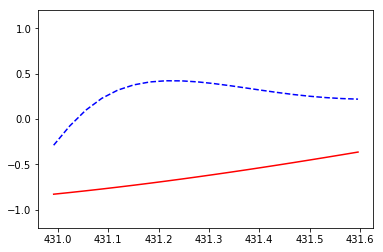

   [[431.62820567 431.66003665 431.69186764 431.72369863 431.75552962
  431.78736061 431.8191916  431.85102259 431.88285357 431.91468456
  431.94651555 431.97834654 432.01017753 432.04200852 432.07383951
  432.10567049 432.13750148 432.16933247 432.20116346 432.23299445]
 [432.26482544 432.29665643 432.32848741 432.3603184  432.39214939
  432.42398038 432.45581137 432.48764236 432.51947335 432.55130434
  432.58313532 432.61496631 432.6467973  432.67862829 432.71045928
  432.74229027 432.77412126 432.80595224 432.83778323 432.86961422]
 [432.90144521 432.9332762  432.96510719 432.99693818 433.02876916
  433.06060015 433.09243114 433.12426213 433.15609312 433.18792411
  433.2197551  433.25158608 433.28341707 433.31524806 433.34707905
  433.37891004 433.41074103 433.44257202 433.47440301 433.50623399]
 [433.53806498 433.56989597 433.60172696 433.63355795 433.66538894
  433.69721993 433.72905091 433.7608819  433.79271289 433.82454388
  433.85637487 433.88820586 433.92003685 433.95186783 43

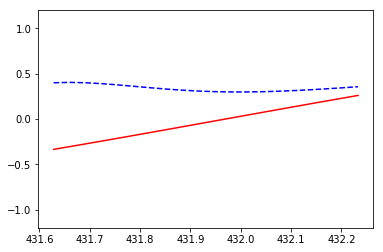

   [[432.26482544 432.29665643 432.32848741 432.3603184  432.39214939
  432.42398038 432.45581137 432.48764236 432.51947335 432.55130434
  432.58313532 432.61496631 432.6467973  432.67862829 432.71045928
  432.74229027 432.77412126 432.80595224 432.83778323 432.86961422]
 [432.90144521 432.9332762  432.96510719 432.99693818 433.02876916
  433.06060015 433.09243114 433.12426213 433.15609312 433.18792411
  433.2197551  433.25158608 433.28341707 433.31524806 433.34707905
  433.37891004 433.41074103 433.44257202 433.47440301 433.50623399]
 [433.53806498 433.56989597 433.60172696 433.63355795 433.66538894
  433.69721993 433.72905091 433.7608819  433.79271289 433.82454388
  433.85637487 433.88820586 433.92003685 433.95186783 433.98369882
  434.01552981 434.0473608  434.07919179 434.11102278 434.14285377]
 [434.17468475 434.20651574 434.23834673 434.27017772 434.30200871
  434.3338397  434.36567069 434.39750168 434.42933266 434.46116365
  434.49299464 434.52482563 434.55665662 434.58848761 43

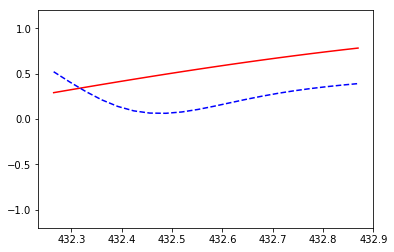

   [[432.90144521 432.9332762  432.96510719 432.99693818 433.02876916
  433.06060015 433.09243114 433.12426213 433.15609312 433.18792411
  433.2197551  433.25158608 433.28341707 433.31524806 433.34707905
  433.37891004 433.41074103 433.44257202 433.47440301 433.50623399]
 [433.53806498 433.56989597 433.60172696 433.63355795 433.66538894
  433.69721993 433.72905091 433.7608819  433.79271289 433.82454388
  433.85637487 433.88820586 433.92003685 433.95186783 433.98369882
  434.01552981 434.0473608  434.07919179 434.11102278 434.14285377]
 [434.17468475 434.20651574 434.23834673 434.27017772 434.30200871
  434.3338397  434.36567069 434.39750168 434.42933266 434.46116365
  434.49299464 434.52482563 434.55665662 434.58848761 434.6203186
  434.65214958 434.68398057 434.71581156 434.74764255 434.77947354]
 [434.81130453 434.84313552 434.8749665  434.90679749 434.93862848
  434.97045947 435.00229046 435.03412145 435.06595244 435.09778342
  435.12961441 435.1614454  435.19327639 435.22510738 435

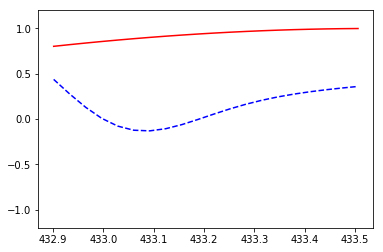

   [[433.53806498 433.56989597 433.60172696 433.63355795 433.66538894
  433.69721993 433.72905091 433.7608819  433.79271289 433.82454388
  433.85637487 433.88820586 433.92003685 433.95186783 433.98369882
  434.01552981 434.0473608  434.07919179 434.11102278 434.14285377]
 [434.17468475 434.20651574 434.23834673 434.27017772 434.30200871
  434.3338397  434.36567069 434.39750168 434.42933266 434.46116365
  434.49299464 434.52482563 434.55665662 434.58848761 434.6203186
  434.65214958 434.68398057 434.71581156 434.74764255 434.77947354]
 [434.81130453 434.84313552 434.8749665  434.90679749 434.93862848
  434.97045947 435.00229046 435.03412145 435.06595244 435.09778342
  435.12961441 435.1614454  435.19327639 435.22510738 435.25693837
  435.28876936 435.32060034 435.35243133 435.38426232 435.41609331]
 [435.4479243  435.47975529 435.51158628 435.54341727 435.57524825
  435.60707924 435.63891023 435.67074122 435.70257221 435.7344032
  435.76623419 435.79806517 435.82989616 435.86172715 435.

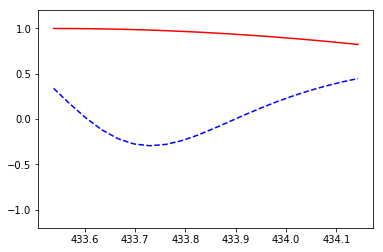

   [[434.17468475 434.20651574 434.23834673 434.27017772 434.30200871
  434.3338397  434.36567069 434.39750168 434.42933266 434.46116365
  434.49299464 434.52482563 434.55665662 434.58848761 434.6203186
  434.65214958 434.68398057 434.71581156 434.74764255 434.77947354]
 [434.81130453 434.84313552 434.8749665  434.90679749 434.93862848
  434.97045947 435.00229046 435.03412145 435.06595244 435.09778342
  435.12961441 435.1614454  435.19327639 435.22510738 435.25693837
  435.28876936 435.32060034 435.35243133 435.38426232 435.41609331]
 [435.4479243  435.47975529 435.51158628 435.54341727 435.57524825
  435.60707924 435.63891023 435.67074122 435.70257221 435.7344032
  435.76623419 435.79806517 435.82989616 435.86172715 435.89355814
  435.92538913 435.95722012 435.98905111 436.02088209 436.05271308]
 [436.08454407 436.11637506 436.14820605 436.18003704 436.21186803
  436.24369901 436.27553    436.30736099 436.33919198 436.37102297
  436.40285396 436.43468495 436.46651594 436.49834692 436.

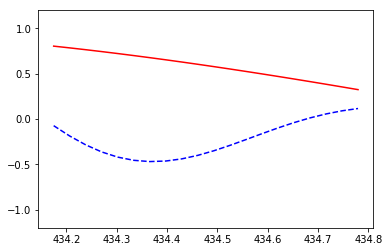

   0.06516825
   [[434.81130453 434.84313552 434.8749665  434.90679749 434.93862848
  434.97045947 435.00229046 435.03412145 435.06595244 435.09778342
  435.12961441 435.1614454  435.19327639 435.22510738 435.25693837
  435.28876936 435.32060034 435.35243133 435.38426232 435.41609331]
 [435.4479243  435.47975529 435.51158628 435.54341727 435.57524825
  435.60707924 435.63891023 435.67074122 435.70257221 435.7344032
  435.76623419 435.79806517 435.82989616 435.86172715 435.89355814
  435.92538913 435.95722012 435.98905111 436.02088209 436.05271308]
 [436.08454407 436.11637506 436.14820605 436.18003704 436.21186803
  436.24369901 436.27553    436.30736099 436.33919198 436.37102297
  436.40285396 436.43468495 436.46651594 436.49834692 436.53017791
  436.5620089  436.59383989 436.62567088 436.65750187 436.68933286]
 [436.72116384 436.75299483 436.78482582 436.81665681 436.8484878
  436.88031879 436.91214978 436.94398076 436.97581175 437.00764274
  437.03947373 437.07130472 437.10313571 437

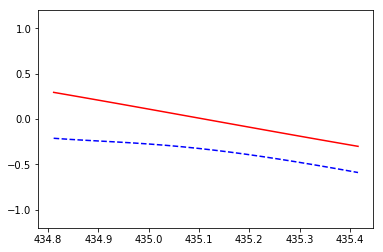

   [[435.4479243  435.47975529 435.51158628 435.54341727 435.57524825
  435.60707924 435.63891023 435.67074122 435.70257221 435.7344032
  435.76623419 435.79806517 435.82989616 435.86172715 435.89355814
  435.92538913 435.95722012 435.98905111 436.02088209 436.05271308]
 [436.08454407 436.11637506 436.14820605 436.18003704 436.21186803
  436.24369901 436.27553    436.30736099 436.33919198 436.37102297
  436.40285396 436.43468495 436.46651594 436.49834692 436.53017791
  436.5620089  436.59383989 436.62567088 436.65750187 436.68933286]
 [436.72116384 436.75299483 436.78482582 436.81665681 436.8484878
  436.88031879 436.91214978 436.94398076 436.97581175 437.00764274
  437.03947373 437.07130472 437.10313571 437.1349667  437.16679768
  437.19862867 437.23045966 437.26229065 437.29412164 437.32595263]
 [437.35778362 437.38961461 437.42144559 437.45327658 437.48510757
  437.51693856 437.54876955 437.58060054 437.61243153 437.64426251
  437.6760935  437.70792449 437.73975548 437.77158647 437.

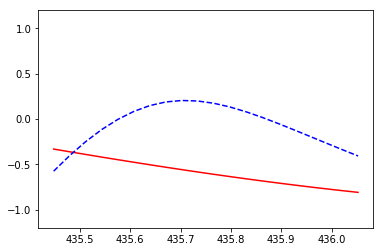

   [[436.08454407 436.11637506 436.14820605 436.18003704 436.21186803
  436.24369901 436.27553    436.30736099 436.33919198 436.37102297
  436.40285396 436.43468495 436.46651594 436.49834692 436.53017791
  436.5620089  436.59383989 436.62567088 436.65750187 436.68933286]
 [436.72116384 436.75299483 436.78482582 436.81665681 436.8484878
  436.88031879 436.91214978 436.94398076 436.97581175 437.00764274
  437.03947373 437.07130472 437.10313571 437.1349667  437.16679768
  437.19862867 437.23045966 437.26229065 437.29412164 437.32595263]
 [437.35778362 437.38961461 437.42144559 437.45327658 437.48510757
  437.51693856 437.54876955 437.58060054 437.61243153 437.64426251
  437.6760935  437.70792449 437.73975548 437.77158647 437.80341746
  437.83524845 437.86707943 437.89891042 437.93074141 437.9625724 ]
 [437.99440339 438.02623438 438.05806537 438.08989635 438.12172734
  438.15355833 438.18538932 438.21722031 438.2490513  438.28088229
  438.31271328 438.34454426 438.37637525 438.40820624 438

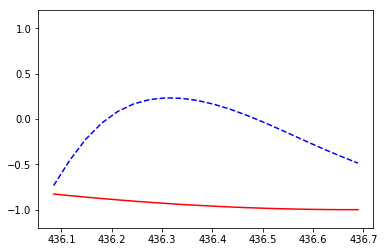

   [[436.72116384 436.75299483 436.78482582 436.81665681 436.8484878
  436.88031879 436.91214978 436.94398076 436.97581175 437.00764274
  437.03947373 437.07130472 437.10313571 437.1349667  437.16679768
  437.19862867 437.23045966 437.26229065 437.29412164 437.32595263]
 [437.35778362 437.38961461 437.42144559 437.45327658 437.48510757
  437.51693856 437.54876955 437.58060054 437.61243153 437.64426251
  437.6760935  437.70792449 437.73975548 437.77158647 437.80341746
  437.83524845 437.86707943 437.89891042 437.93074141 437.9625724 ]
 [437.99440339 438.02623438 438.05806537 438.08989635 438.12172734
  438.15355833 438.18538932 438.21722031 438.2490513  438.28088229
  438.31271328 438.34454426 438.37637525 438.40820624 438.44003723
  438.47186822 438.50369921 438.5355302  438.56736118 438.59919217]
 [438.63102316 438.66285415 438.69468514 438.72651613 438.75834712
  438.7901781  438.82200909 438.85384008 438.88567107 438.91750206
  438.94933305 438.98116404 439.01299502 439.04482601 439

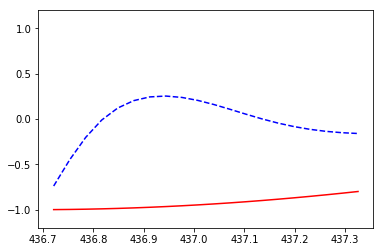

   [[437.35778362 437.38961461 437.42144559 437.45327658 437.48510757
  437.51693856 437.54876955 437.58060054 437.61243153 437.64426251
  437.6760935  437.70792449 437.73975548 437.77158647 437.80341746
  437.83524845 437.86707943 437.89891042 437.93074141 437.9625724 ]
 [437.99440339 438.02623438 438.05806537 438.08989635 438.12172734
  438.15355833 438.18538932 438.21722031 438.2490513  438.28088229
  438.31271328 438.34454426 438.37637525 438.40820624 438.44003723
  438.47186822 438.50369921 438.5355302  438.56736118 438.59919217]
 [438.63102316 438.66285415 438.69468514 438.72651613 438.75834712
  438.7901781  438.82200909 438.85384008 438.88567107 438.91750206
  438.94933305 438.98116404 439.01299502 439.04482601 439.076657
  439.10848799 439.14031898 439.17214997 439.20398096 439.23581195]
 [439.26764293 439.29947392 439.33130491 439.3631359  439.39496689
  439.42679788 439.45862887 439.49045985 439.52229084 439.55412183
  439.58595282 439.61778381 439.6496148  439.68144579 439.

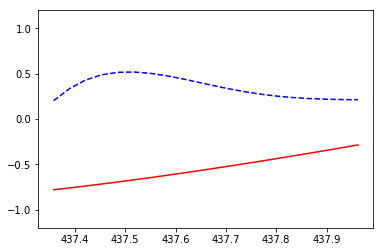

   [[437.99440339 438.02623438 438.05806537 438.08989635 438.12172734
  438.15355833 438.18538932 438.21722031 438.2490513  438.28088229
  438.31271328 438.34454426 438.37637525 438.40820624 438.44003723
  438.47186822 438.50369921 438.5355302  438.56736118 438.59919217]
 [438.63102316 438.66285415 438.69468514 438.72651613 438.75834712
  438.7901781  438.82200909 438.85384008 438.88567107 438.91750206
  438.94933305 438.98116404 439.01299502 439.04482601 439.076657
  439.10848799 439.14031898 439.17214997 439.20398096 439.23581195]
 [439.26764293 439.29947392 439.33130491 439.3631359  439.39496689
  439.42679788 439.45862887 439.49045985 439.52229084 439.55412183
  439.58595282 439.61778381 439.6496148  439.68144579 439.71327677
  439.74510776 439.77693875 439.80876974 439.84060073 439.87243172]
 [439.90426271 439.93609369 439.96792468 439.99975567 440.03158666
  440.06341765 440.09524864 440.12707963 440.15891061 440.1907416
  440.22257259 440.25440358 440.28623457 440.31806556 440.3

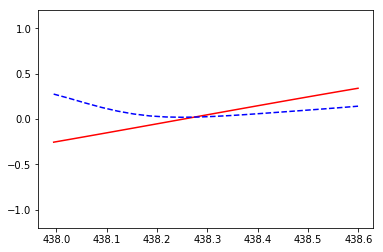

   [[438.63102316 438.66285415 438.69468514 438.72651613 438.75834712
  438.7901781  438.82200909 438.85384008 438.88567107 438.91750206
  438.94933305 438.98116404 439.01299502 439.04482601 439.076657
  439.10848799 439.14031898 439.17214997 439.20398096 439.23581195]
 [439.26764293 439.29947392 439.33130491 439.3631359  439.39496689
  439.42679788 439.45862887 439.49045985 439.52229084 439.55412183
  439.58595282 439.61778381 439.6496148  439.68144579 439.71327677
  439.74510776 439.77693875 439.80876974 439.84060073 439.87243172]
 [439.90426271 439.93609369 439.96792468 439.99975567 440.03158666
  440.06341765 440.09524864 440.12707963 440.15891061 440.1907416
  440.22257259 440.25440358 440.28623457 440.31806556 440.34989655
  440.38172754 440.41355852 440.44538951 440.4772205  440.50905149]
 [440.54088248 440.57271347 440.60454446 440.63637544 440.66820643
  440.70003742 440.73186841 440.7636994  440.79553039 440.82736138
  440.85919236 440.89102335 440.92285434 440.95468533 440.9

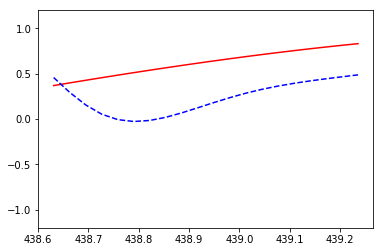

   [[439.26764293 439.29947392 439.33130491 439.3631359  439.39496689
  439.42679788 439.45862887 439.49045985 439.52229084 439.55412183
  439.58595282 439.61778381 439.6496148  439.68144579 439.71327677
  439.74510776 439.77693875 439.80876974 439.84060073 439.87243172]
 [439.90426271 439.93609369 439.96792468 439.99975567 440.03158666
  440.06341765 440.09524864 440.12707963 440.15891061 440.1907416
  440.22257259 440.25440358 440.28623457 440.31806556 440.34989655
  440.38172754 440.41355852 440.44538951 440.4772205  440.50905149]
 [440.54088248 440.57271347 440.60454446 440.63637544 440.66820643
  440.70003742 440.73186841 440.7636994  440.79553039 440.82736138
  440.85919236 440.89102335 440.92285434 440.95468533 440.98651632
  441.01834731 441.0501783  441.08200928 441.11384027 441.14567126]
 [441.17750225 441.20933324 441.24116423 441.27299522 441.30482621
  441.33665719 441.36848818 441.40031917 441.43215016 441.46398115
  441.49581214 441.52764313 441.55947411 441.5913051  441

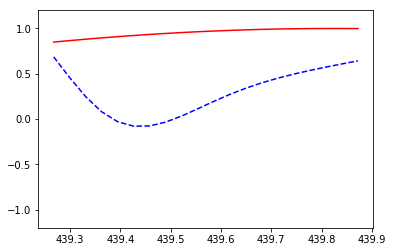

   [[439.90426271 439.93609369 439.96792468 439.99975567 440.03158666
  440.06341765 440.09524864 440.12707963 440.15891061 440.1907416
  440.22257259 440.25440358 440.28623457 440.31806556 440.34989655
  440.38172754 440.41355852 440.44538951 440.4772205  440.50905149]
 [440.54088248 440.57271347 440.60454446 440.63637544 440.66820643
  440.70003742 440.73186841 440.7636994  440.79553039 440.82736138
  440.85919236 440.89102335 440.92285434 440.95468533 440.98651632
  441.01834731 441.0501783  441.08200928 441.11384027 441.14567126]
 [441.17750225 441.20933324 441.24116423 441.27299522 441.30482621
  441.33665719 441.36848818 441.40031917 441.43215016 441.46398115
  441.49581214 441.52764313 441.55947411 441.5913051  441.62313609
  441.65496708 441.68679807 441.71862906 441.75046005 441.78229103]
 [441.81412202 441.84595301 441.877784   441.90961499 441.94144598
  441.97327697 442.00510795 442.03693894 442.06876993 442.10060092
  442.13243191 442.1642629  442.19609389 442.22792488 442

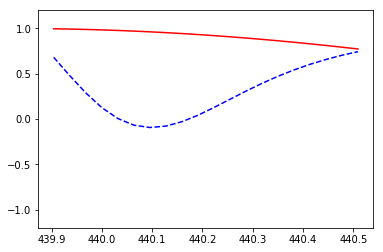

   [[440.54088248 440.57271347 440.60454446 440.63637544 440.66820643
  440.70003742 440.73186841 440.7636994  440.79553039 440.82736138
  440.85919236 440.89102335 440.92285434 440.95468533 440.98651632
  441.01834731 441.0501783  441.08200928 441.11384027 441.14567126]
 [441.17750225 441.20933324 441.24116423 441.27299522 441.30482621
  441.33665719 441.36848818 441.40031917 441.43215016 441.46398115
  441.49581214 441.52764313 441.55947411 441.5913051  441.62313609
  441.65496708 441.68679807 441.71862906 441.75046005 441.78229103]
 [441.81412202 441.84595301 441.877784   441.90961499 441.94144598
  441.97327697 442.00510795 442.03693894 442.06876993 442.10060092
  442.13243191 442.1642629  442.19609389 442.22792488 442.25975586
  442.29158685 442.32341784 442.35524883 442.38707982 442.41891081]
 [442.4507418  442.48257278 442.51440377 442.54623476 442.57806575
  442.60989674 442.64172773 442.67355872 442.7053897  442.73722069
  442.76905168 442.80088267 442.83271366 442.86454465 44

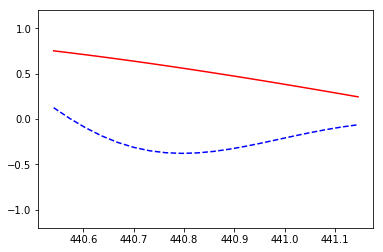

   0.058257926
   [[441.17750225 441.20933324 441.24116423 441.27299522 441.30482621
  441.33665719 441.36848818 441.40031917 441.43215016 441.46398115
  441.49581214 441.52764313 441.55947411 441.5913051  441.62313609
  441.65496708 441.68679807 441.71862906 441.75046005 441.78229103]
 [441.81412202 441.84595301 441.877784   441.90961499 441.94144598
  441.97327697 442.00510795 442.03693894 442.06876993 442.10060092
  442.13243191 442.1642629  442.19609389 442.22792488 442.25975586
  442.29158685 442.32341784 442.35524883 442.38707982 442.41891081]
 [442.4507418  442.48257278 442.51440377 442.54623476 442.57806575
  442.60989674 442.64172773 442.67355872 442.7053897  442.73722069
  442.76905168 442.80088267 442.83271366 442.86454465 442.89637564
  442.92820662 442.96003761 442.9918686  443.02369959 443.05553058]
 [443.08736157 443.11919256 443.15102355 443.18285453 443.21468552
  443.24651651 443.2783475  443.31017849 443.34200948 443.37384047
  443.40567145 443.43750244 443.46933343 

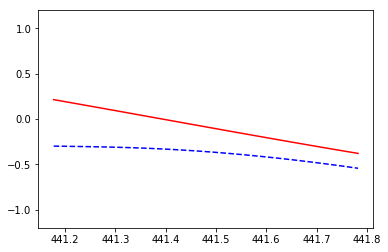

   [[441.81412202 441.84595301 441.877784   441.90961499 441.94144598
  441.97327697 442.00510795 442.03693894 442.06876993 442.10060092
  442.13243191 442.1642629  442.19609389 442.22792488 442.25975586
  442.29158685 442.32341784 442.35524883 442.38707982 442.41891081]
 [442.4507418  442.48257278 442.51440377 442.54623476 442.57806575
  442.60989674 442.64172773 442.67355872 442.7053897  442.73722069
  442.76905168 442.80088267 442.83271366 442.86454465 442.89637564
  442.92820662 442.96003761 442.9918686  443.02369959 443.05553058]
 [443.08736157 443.11919256 443.15102355 443.18285453 443.21468552
  443.24651651 443.2783475  443.31017849 443.34200948 443.37384047
  443.40567145 443.43750244 443.46933343 443.50116442 443.53299541
  443.5648264  443.59665739 443.62848837 443.66031936 443.69215035]
 [443.72398134 443.75581233 443.78764332 443.81947431 443.85130529
  443.88313628 443.91496727 443.94679826 443.97862925 444.01046024
  444.04229123 444.07412222 444.1059532  444.13778419 44

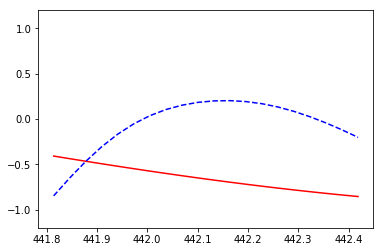

   [[442.4507418  442.48257278 442.51440377 442.54623476 442.57806575
  442.60989674 442.64172773 442.67355872 442.7053897  442.73722069
  442.76905168 442.80088267 442.83271366 442.86454465 442.89637564
  442.92820662 442.96003761 442.9918686  443.02369959 443.05553058]
 [443.08736157 443.11919256 443.15102355 443.18285453 443.21468552
  443.24651651 443.2783475  443.31017849 443.34200948 443.37384047
  443.40567145 443.43750244 443.46933343 443.50116442 443.53299541
  443.5648264  443.59665739 443.62848837 443.66031936 443.69215035]
 [443.72398134 443.75581233 443.78764332 443.81947431 443.85130529
  443.88313628 443.91496727 443.94679826 443.97862925 444.01046024
  444.04229123 444.07412222 444.1059532  444.13778419 444.16961518
  444.20144617 444.23327716 444.26510815 444.29693914 444.32877012]
 [444.36060111 444.3924321  444.42426309 444.45609408 444.48792507
  444.51975606 444.55158704 444.58341803 444.61524902 444.64708001
  444.678911   444.71074199 444.74257298 444.77440396 44

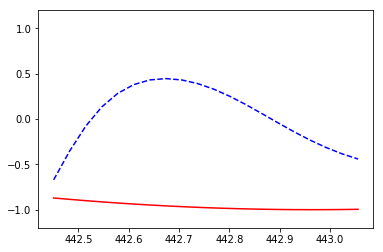

   [[443.08736157 443.11919256 443.15102355 443.18285453 443.21468552
  443.24651651 443.2783475  443.31017849 443.34200948 443.37384047
  443.40567145 443.43750244 443.46933343 443.50116442 443.53299541
  443.5648264  443.59665739 443.62848837 443.66031936 443.69215035]
 [443.72398134 443.75581233 443.78764332 443.81947431 443.85130529
  443.88313628 443.91496727 443.94679826 443.97862925 444.01046024
  444.04229123 444.07412222 444.1059532  444.13778419 444.16961518
  444.20144617 444.23327716 444.26510815 444.29693914 444.32877012]
 [444.36060111 444.3924321  444.42426309 444.45609408 444.48792507
  444.51975606 444.55158704 444.58341803 444.61524902 444.64708001
  444.678911   444.71074199 444.74257298 444.77440396 444.80623495
  444.83806594 444.86989693 444.90172792 444.93355891 444.9653899 ]
 [444.99722088 445.02905187 445.06088286 445.09271385 445.12454484
  445.15637583 445.18820682 445.22003781 445.25186879 445.28369978
  445.31553077 445.34736176 445.37919275 445.41102374 44

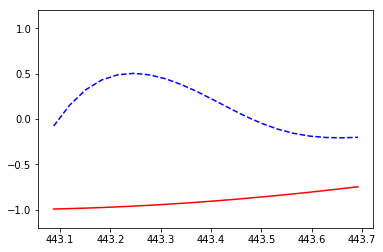

   [[443.72398134 443.75581233 443.78764332 443.81947431 443.85130529
  443.88313628 443.91496727 443.94679826 443.97862925 444.01046024
  444.04229123 444.07412222 444.1059532  444.13778419 444.16961518
  444.20144617 444.23327716 444.26510815 444.29693914 444.32877012]
 [444.36060111 444.3924321  444.42426309 444.45609408 444.48792507
  444.51975606 444.55158704 444.58341803 444.61524902 444.64708001
  444.678911   444.71074199 444.74257298 444.77440396 444.80623495
  444.83806594 444.86989693 444.90172792 444.93355891 444.9653899 ]
 [444.99722088 445.02905187 445.06088286 445.09271385 445.12454484
  445.15637583 445.18820682 445.22003781 445.25186879 445.28369978
  445.31553077 445.34736176 445.37919275 445.41102374 445.44285473
  445.47468571 445.5065167  445.53834769 445.57017868 445.60200967]
 [445.63384066 445.66567165 445.69750263 445.72933362 445.76116461
  445.7929956  445.82482659 445.85665758 445.88848857 445.92031955
  445.95215054 445.98398153 446.01581252 446.04764351 44

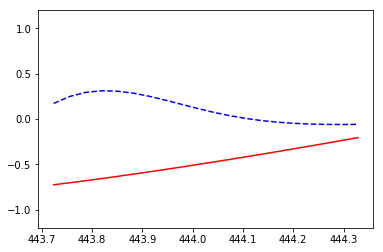

   [[444.36060111 444.3924321  444.42426309 444.45609408 444.48792507
  444.51975606 444.55158704 444.58341803 444.61524902 444.64708001
  444.678911   444.71074199 444.74257298 444.77440396 444.80623495
  444.83806594 444.86989693 444.90172792 444.93355891 444.9653899 ]
 [444.99722088 445.02905187 445.06088286 445.09271385 445.12454484
  445.15637583 445.18820682 445.22003781 445.25186879 445.28369978
  445.31553077 445.34736176 445.37919275 445.41102374 445.44285473
  445.47468571 445.5065167  445.53834769 445.57017868 445.60200967]
 [445.63384066 445.66567165 445.69750263 445.72933362 445.76116461
  445.7929956  445.82482659 445.85665758 445.88848857 445.92031955
  445.95215054 445.98398153 446.01581252 446.04764351 446.0794745
  446.11130549 446.14313648 446.17496746 446.20679845 446.23862944]
 [446.27046043 446.30229142 446.33412241 446.3659534  446.39778438
  446.42961537 446.46144636 446.49327735 446.52510834 446.55693933
  446.58877032 446.6206013  446.65243229 446.68426328 446

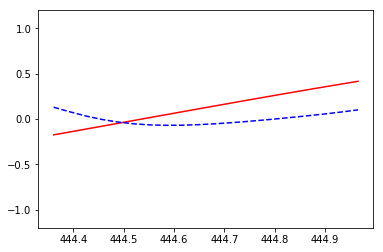

   [[444.99722088 445.02905187 445.06088286 445.09271385 445.12454484
  445.15637583 445.18820682 445.22003781 445.25186879 445.28369978
  445.31553077 445.34736176 445.37919275 445.41102374 445.44285473
  445.47468571 445.5065167  445.53834769 445.57017868 445.60200967]
 [445.63384066 445.66567165 445.69750263 445.72933362 445.76116461
  445.7929956  445.82482659 445.85665758 445.88848857 445.92031955
  445.95215054 445.98398153 446.01581252 446.04764351 446.0794745
  446.11130549 446.14313648 446.17496746 446.20679845 446.23862944]
 [446.27046043 446.30229142 446.33412241 446.3659534  446.39778438
  446.42961537 446.46144636 446.49327735 446.52510834 446.55693933
  446.58877032 446.6206013  446.65243229 446.68426328 446.71609427
  446.74792526 446.77975625 446.81158724 446.84341822 446.87524921]
 [446.9070802  446.93891119 446.97074218 447.00257317 447.03440416
  447.06623515 447.09806613 447.12989712 447.16172811 447.1935591
  447.22539009 447.25722108 447.28905207 447.32088305 447.

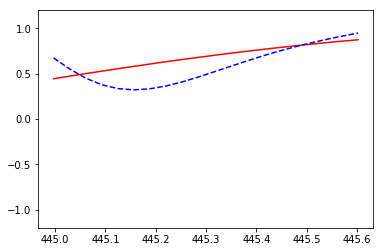

   [[445.63384066 445.66567165 445.69750263 445.72933362 445.76116461
  445.7929956  445.82482659 445.85665758 445.88848857 445.92031955
  445.95215054 445.98398153 446.01581252 446.04764351 446.0794745
  446.11130549 446.14313648 446.17496746 446.20679845 446.23862944]
 [446.27046043 446.30229142 446.33412241 446.3659534  446.39778438
  446.42961537 446.46144636 446.49327735 446.52510834 446.55693933
  446.58877032 446.6206013  446.65243229 446.68426328 446.71609427
  446.74792526 446.77975625 446.81158724 446.84341822 446.87524921]
 [446.9070802  446.93891119 446.97074218 447.00257317 447.03440416
  447.06623515 447.09806613 447.12989712 447.16172811 447.1935591
  447.22539009 447.25722108 447.28905207 447.32088305 447.35271404
  447.38454503 447.41637602 447.44820701 447.480038   447.51186899]
 [447.54369997 447.57553096 447.60736195 447.63919294 447.67102393
  447.70285492 447.73468591 447.76651689 447.79834788 447.83017887
  447.86200986 447.89384085 447.92567184 447.95750283 447.

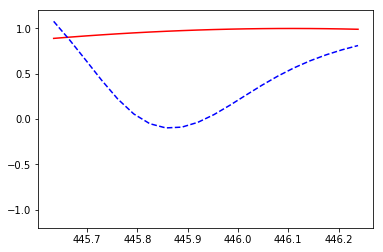

   [[446.27046043 446.30229142 446.33412241 446.3659534  446.39778438
  446.42961537 446.46144636 446.49327735 446.52510834 446.55693933
  446.58877032 446.6206013  446.65243229 446.68426328 446.71609427
  446.74792526 446.77975625 446.81158724 446.84341822 446.87524921]
 [446.9070802  446.93891119 446.97074218 447.00257317 447.03440416
  447.06623515 447.09806613 447.12989712 447.16172811 447.1935591
  447.22539009 447.25722108 447.28905207 447.32088305 447.35271404
  447.38454503 447.41637602 447.44820701 447.480038   447.51186899]
 [447.54369997 447.57553096 447.60736195 447.63919294 447.67102393
  447.70285492 447.73468591 447.76651689 447.79834788 447.83017887
  447.86200986 447.89384085 447.92567184 447.95750283 447.98933382
  448.0211648  448.05299579 448.08482678 448.11665777 448.14848876]
 [448.18031975 448.21215074 448.24398172 448.27581271 448.3076437
  448.33947469 448.37130568 448.40313667 448.43496766 448.46679864
  448.49862963 448.53046062 448.56229161 448.5941226  448.

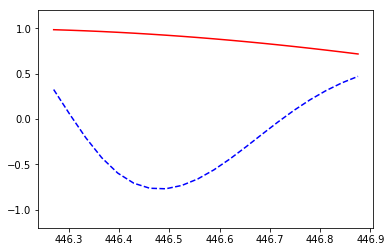

   [[446.9070802  446.93891119 446.97074218 447.00257317 447.03440416
  447.06623515 447.09806613 447.12989712 447.16172811 447.1935591
  447.22539009 447.25722108 447.28905207 447.32088305 447.35271404
  447.38454503 447.41637602 447.44820701 447.480038   447.51186899]
 [447.54369997 447.57553096 447.60736195 447.63919294 447.67102393
  447.70285492 447.73468591 447.76651689 447.79834788 447.83017887
  447.86200986 447.89384085 447.92567184 447.95750283 447.98933382
  448.0211648  448.05299579 448.08482678 448.11665777 448.14848876]
 [448.18031975 448.21215074 448.24398172 448.27581271 448.3076437
  448.33947469 448.37130568 448.40313667 448.43496766 448.46679864
  448.49862963 448.53046062 448.56229161 448.5941226  448.62595359
  448.65778458 448.68961556 448.72144655 448.75327754 448.78510853]
 [448.81693952 448.84877051 448.8806015  448.91243249 448.94426347
  448.97609446 449.00792545 449.03975644 449.07158743 449.10341842
  449.13524941 449.16708039 449.19891138 449.23074237 449.

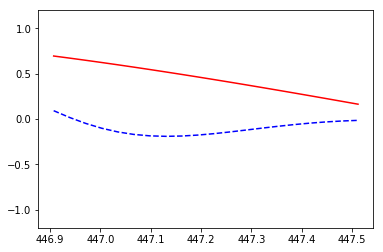

   0.045946326
   [[447.54369997 447.57553096 447.60736195 447.63919294 447.67102393
  447.70285492 447.73468591 447.76651689 447.79834788 447.83017887
  447.86200986 447.89384085 447.92567184 447.95750283 447.98933382
  448.0211648  448.05299579 448.08482678 448.11665777 448.14848876]
 [448.18031975 448.21215074 448.24398172 448.27581271 448.3076437
  448.33947469 448.37130568 448.40313667 448.43496766 448.46679864
  448.49862963 448.53046062 448.56229161 448.5941226  448.62595359
  448.65778458 448.68961556 448.72144655 448.75327754 448.78510853]
 [448.81693952 448.84877051 448.8806015  448.91243249 448.94426347
  448.97609446 449.00792545 449.03975644 449.07158743 449.10341842
  449.13524941 449.16708039 449.19891138 449.23074237 449.26257336
  449.29440435 449.32623534 449.35806633 449.38989731 449.4217283 ]
 [449.45355929 449.48539028 449.51722127 449.54905226 449.58088325
  449.61271423 449.64454522 449.67637621 449.7082072  449.74003819
  449.77186918 449.80370017 449.83553115 4

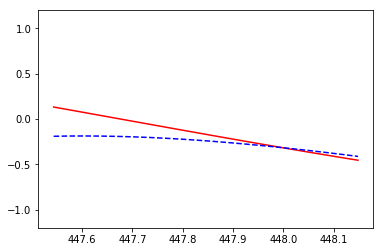

   [[448.18031975 448.21215074 448.24398172 448.27581271 448.3076437
  448.33947469 448.37130568 448.40313667 448.43496766 448.46679864
  448.49862963 448.53046062 448.56229161 448.5941226  448.62595359
  448.65778458 448.68961556 448.72144655 448.75327754 448.78510853]
 [448.81693952 448.84877051 448.8806015  448.91243249 448.94426347
  448.97609446 449.00792545 449.03975644 449.07158743 449.10341842
  449.13524941 449.16708039 449.19891138 449.23074237 449.26257336
  449.29440435 449.32623534 449.35806633 449.38989731 449.4217283 ]
 [449.45355929 449.48539028 449.51722127 449.54905226 449.58088325
  449.61271423 449.64454522 449.67637621 449.7082072  449.74003819
  449.77186918 449.80370017 449.83553115 449.86736214 449.89919313
  449.93102412 449.96285511 449.9946861  450.02651709 450.05834808]
 [450.09017906 450.12201005 450.15384104 450.18567203 450.21750302
  450.24933401 450.281165   450.31299598 450.34482697 450.37665796
  450.40848895 450.44031994 450.47215093 450.50398192 450

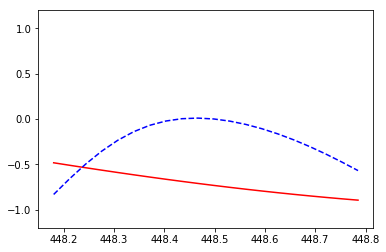

   [[448.81693952 448.84877051 448.8806015  448.91243249 448.94426347
  448.97609446 449.00792545 449.03975644 449.07158743 449.10341842
  449.13524941 449.16708039 449.19891138 449.23074237 449.26257336
  449.29440435 449.32623534 449.35806633 449.38989731 449.4217283 ]
 [449.45355929 449.48539028 449.51722127 449.54905226 449.58088325
  449.61271423 449.64454522 449.67637621 449.7082072  449.74003819
  449.77186918 449.80370017 449.83553115 449.86736214 449.89919313
  449.93102412 449.96285511 449.9946861  450.02651709 450.05834808]
 [450.09017906 450.12201005 450.15384104 450.18567203 450.21750302
  450.24933401 450.281165   450.31299598 450.34482697 450.37665796
  450.40848895 450.44031994 450.47215093 450.50398192 450.5358129
  450.56764389 450.59947488 450.63130587 450.66313686 450.69496785]
 [450.72679884 450.75862982 450.79046081 450.8222918  450.85412279
  450.88595378 450.91778477 450.94961576 450.98144675 451.01327773
  451.04510872 451.07693971 451.1087707  451.14060169 451

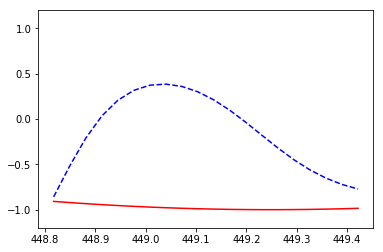

   [[449.45355929 449.48539028 449.51722127 449.54905226 449.58088325
  449.61271423 449.64454522 449.67637621 449.7082072  449.74003819
  449.77186918 449.80370017 449.83553115 449.86736214 449.89919313
  449.93102412 449.96285511 449.9946861  450.02651709 450.05834808]
 [450.09017906 450.12201005 450.15384104 450.18567203 450.21750302
  450.24933401 450.281165   450.31299598 450.34482697 450.37665796
  450.40848895 450.44031994 450.47215093 450.50398192 450.5358129
  450.56764389 450.59947488 450.63130587 450.66313686 450.69496785]
 [450.72679884 450.75862982 450.79046081 450.8222918  450.85412279
  450.88595378 450.91778477 450.94961576 450.98144675 451.01327773
  451.04510872 451.07693971 451.1087707  451.14060169 451.17243268
  451.20426367 451.23609465 451.26792564 451.29975663 451.33158762]
 [451.36341861 451.3952496  451.42708059 451.45891157 451.49074256
  451.52257355 451.55440454 451.58623553 451.61806652 451.64989751
  451.68172849 451.71355948 451.74539047 451.77722146 451

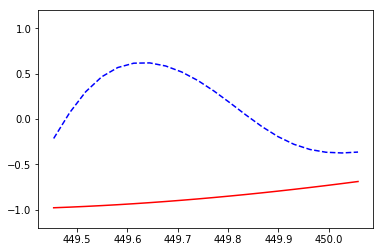

   [[450.09017906 450.12201005 450.15384104 450.18567203 450.21750302
  450.24933401 450.281165   450.31299598 450.34482697 450.37665796
  450.40848895 450.44031994 450.47215093 450.50398192 450.5358129
  450.56764389 450.59947488 450.63130587 450.66313686 450.69496785]
 [450.72679884 450.75862982 450.79046081 450.8222918  450.85412279
  450.88595378 450.91778477 450.94961576 450.98144675 451.01327773
  451.04510872 451.07693971 451.1087707  451.14060169 451.17243268
  451.20426367 451.23609465 451.26792564 451.29975663 451.33158762]
 [451.36341861 451.3952496  451.42708059 451.45891157 451.49074256
  451.52257355 451.55440454 451.58623553 451.61806652 451.64989751
  451.68172849 451.71355948 451.74539047 451.77722146 451.80905245
  451.84088344 451.87271443 451.90454542 451.9363764  451.96820739]
 [452.00003838 452.03186937 452.06370036 452.09553135 452.12736234
  452.15919332 452.19102431 452.2228553  452.25468629 452.28651728
  452.31834827 452.35017926 452.38201024 452.41384123 452

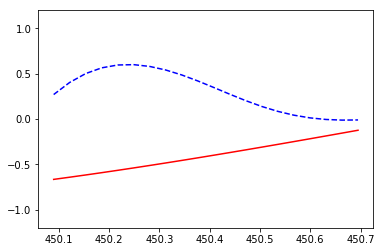

   [[450.72679884 450.75862982 450.79046081 450.8222918  450.85412279
  450.88595378 450.91778477 450.94961576 450.98144675 451.01327773
  451.04510872 451.07693971 451.1087707  451.14060169 451.17243268
  451.20426367 451.23609465 451.26792564 451.29975663 451.33158762]
 [451.36341861 451.3952496  451.42708059 451.45891157 451.49074256
  451.52257355 451.55440454 451.58623553 451.61806652 451.64989751
  451.68172849 451.71355948 451.74539047 451.77722146 451.80905245
  451.84088344 451.87271443 451.90454542 451.9363764  451.96820739]
 [452.00003838 452.03186937 452.06370036 452.09553135 452.12736234
  452.15919332 452.19102431 452.2228553  452.25468629 452.28651728
  452.31834827 452.35017926 452.38201024 452.41384123 452.44567222
  452.47750321 452.5093342  452.54116519 452.57299618 452.60482716]
 [452.63665815 452.66848914 452.70032013 452.73215112 452.76398211
  452.7958131  452.82764409 452.85947507 452.89130606 452.92313705
  452.95496804 452.98679903 453.01863002 453.05046101 45

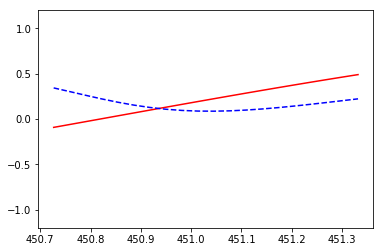

   [[451.36341861 451.3952496  451.42708059 451.45891157 451.49074256
  451.52257355 451.55440454 451.58623553 451.61806652 451.64989751
  451.68172849 451.71355948 451.74539047 451.77722146 451.80905245
  451.84088344 451.87271443 451.90454542 451.9363764  451.96820739]
 [452.00003838 452.03186937 452.06370036 452.09553135 452.12736234
  452.15919332 452.19102431 452.2228553  452.25468629 452.28651728
  452.31834827 452.35017926 452.38201024 452.41384123 452.44567222
  452.47750321 452.5093342  452.54116519 452.57299618 452.60482716]
 [452.63665815 452.66848914 452.70032013 452.73215112 452.76398211
  452.7958131  452.82764409 452.85947507 452.89130606 452.92313705
  452.95496804 452.98679903 453.01863002 453.05046101 453.08229199
  453.11412298 453.14595397 453.17778496 453.20961595 453.24144694]
 [453.27327793 453.30510891 453.3369399  453.36877089 453.40060188
  453.43243287 453.46426386 453.49609485 453.52792583 453.55975682
  453.59158781 453.6234188  453.65524979 453.68708078 45

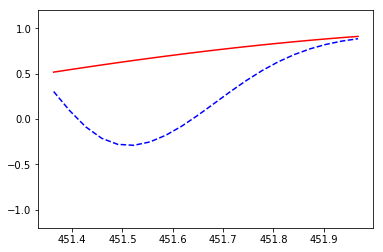

   [[452.00003838 452.03186937 452.06370036 452.09553135 452.12736234
  452.15919332 452.19102431 452.2228553  452.25468629 452.28651728
  452.31834827 452.35017926 452.38201024 452.41384123 452.44567222
  452.47750321 452.5093342  452.54116519 452.57299618 452.60482716]
 [452.63665815 452.66848914 452.70032013 452.73215112 452.76398211
  452.7958131  452.82764409 452.85947507 452.89130606 452.92313705
  452.95496804 452.98679903 453.01863002 453.05046101 453.08229199
  453.11412298 453.14595397 453.17778496 453.20961595 453.24144694]
 [453.27327793 453.30510891 453.3369399  453.36877089 453.40060188
  453.43243287 453.46426386 453.49609485 453.52792583 453.55975682
  453.59158781 453.6234188  453.65524979 453.68708078 453.71891177
  453.75074275 453.78257374 453.81440473 453.84623572 453.87806671]
 [453.9098977  453.94172869 453.97355968 454.00539066 454.03722165
  454.06905264 454.10088363 454.13271462 454.16454561 454.1963766
  454.22820758 454.26003857 454.29186956 454.32370055 454

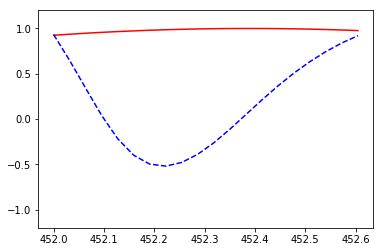

   [[452.63665815 452.66848914 452.70032013 452.73215112 452.76398211
  452.7958131  452.82764409 452.85947507 452.89130606 452.92313705
  452.95496804 452.98679903 453.01863002 453.05046101 453.08229199
  453.11412298 453.14595397 453.17778496 453.20961595 453.24144694]
 [453.27327793 453.30510891 453.3369399  453.36877089 453.40060188
  453.43243287 453.46426386 453.49609485 453.52792583 453.55975682
  453.59158781 453.6234188  453.65524979 453.68708078 453.71891177
  453.75074275 453.78257374 453.81440473 453.84623572 453.87806671]
 [453.9098977  453.94172869 453.97355968 454.00539066 454.03722165
  454.06905264 454.10088363 454.13271462 454.16454561 454.1963766
  454.22820758 454.26003857 454.29186956 454.32370055 454.35553154
  454.38736253 454.41919352 454.4510245  454.48285549 454.51468648]
 [454.54651747 454.57834846 454.61017945 454.64201044 454.67384142
  454.70567241 454.7375034  454.76933439 454.80116538 454.83299637
  454.86482736 454.89665835 454.92848933 454.96032032 454

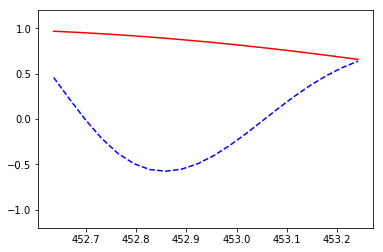

   [[453.27327793 453.30510891 453.3369399  453.36877089 453.40060188
  453.43243287 453.46426386 453.49609485 453.52792583 453.55975682
  453.59158781 453.6234188  453.65524979 453.68708078 453.71891177
  453.75074275 453.78257374 453.81440473 453.84623572 453.87806671]
 [453.9098977  453.94172869 453.97355968 454.00539066 454.03722165
  454.06905264 454.10088363 454.13271462 454.16454561 454.1963766
  454.22820758 454.26003857 454.29186956 454.32370055 454.35553154
  454.38736253 454.41919352 454.4510245  454.48285549 454.51468648]
 [454.54651747 454.57834846 454.61017945 454.64201044 454.67384142
  454.70567241 454.7375034  454.76933439 454.80116538 454.83299637
  454.86482736 454.89665835 454.92848933 454.96032032 454.99215131
  455.0239823  455.05581329 455.08764428 455.11947527 455.15130625]
 [455.18313724 455.21496823 455.24679922 455.27863021 455.3104612
  455.34229219 455.37412317 455.40595416 455.43778515 455.46961614
  455.50144713 455.53327812 455.56510911 455.59694009 455.

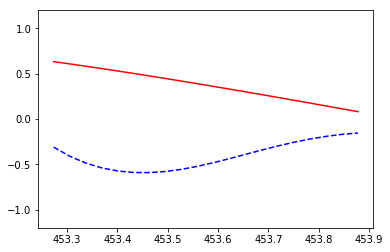

   0.04450233
   [[453.9098977  453.94172869 453.97355968 454.00539066 454.03722165
  454.06905264 454.10088363 454.13271462 454.16454561 454.1963766
  454.22820758 454.26003857 454.29186956 454.32370055 454.35553154
  454.38736253 454.41919352 454.4510245  454.48285549 454.51468648]
 [454.54651747 454.57834846 454.61017945 454.64201044 454.67384142
  454.70567241 454.7375034  454.76933439 454.80116538 454.83299637
  454.86482736 454.89665835 454.92848933 454.96032032 454.99215131
  455.0239823  455.05581329 455.08764428 455.11947527 455.15130625]
 [455.18313724 455.21496823 455.24679922 455.27863021 455.3104612
  455.34229219 455.37412317 455.40595416 455.43778515 455.46961614
  455.50144713 455.53327812 455.56510911 455.59694009 455.62877108
  455.66060207 455.69243306 455.72426405 455.75609504 455.78792603]
 [455.81975702 455.851588   455.88341899 455.91524998 455.94708097
  455.97891196 456.01074295 456.04257394 456.07440492 456.10623591
  456.1380669  456.16989789 456.20172888 456

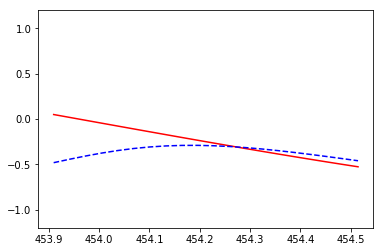

   [[454.54651747 454.57834846 454.61017945 454.64201044 454.67384142
  454.70567241 454.7375034  454.76933439 454.80116538 454.83299637
  454.86482736 454.89665835 454.92848933 454.96032032 454.99215131
  455.0239823  455.05581329 455.08764428 455.11947527 455.15130625]
 [455.18313724 455.21496823 455.24679922 455.27863021 455.3104612
  455.34229219 455.37412317 455.40595416 455.43778515 455.46961614
  455.50144713 455.53327812 455.56510911 455.59694009 455.62877108
  455.66060207 455.69243306 455.72426405 455.75609504 455.78792603]
 [455.81975702 455.851588   455.88341899 455.91524998 455.94708097
  455.97891196 456.01074295 456.04257394 456.07440492 456.10623591
  456.1380669  456.16989789 456.20172888 456.23355987 456.26539086
  456.29722184 456.32905283 456.36088382 456.39271481 456.4245458 ]
 [456.45637679 456.48820778 456.52003876 456.55186975 456.58370074
  456.61553173 456.64736272 456.67919371 456.7110247  456.74285569
  456.77468667 456.80651766 456.83834865 456.87017964 456

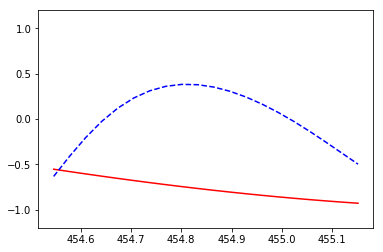

   [[455.18313724 455.21496823 455.24679922 455.27863021 455.3104612
  455.34229219 455.37412317 455.40595416 455.43778515 455.46961614
  455.50144713 455.53327812 455.56510911 455.59694009 455.62877108
  455.66060207 455.69243306 455.72426405 455.75609504 455.78792603]
 [455.81975702 455.851588   455.88341899 455.91524998 455.94708097
  455.97891196 456.01074295 456.04257394 456.07440492 456.10623591
  456.1380669  456.16989789 456.20172888 456.23355987 456.26539086
  456.29722184 456.32905283 456.36088382 456.39271481 456.4245458 ]
 [456.45637679 456.48820778 456.52003876 456.55186975 456.58370074
  456.61553173 456.64736272 456.67919371 456.7110247  456.74285569
  456.77468667 456.80651766 456.83834865 456.87017964 456.90201063
  456.93384162 456.96567261 456.99750359 457.02933458 457.06116557]
 [457.09299656 457.12482755 457.15665854 457.18848953 457.22032051
  457.2521515  457.28398249 457.31581348 457.34764447 457.37947546
  457.41130645 457.44313743 457.47496842 457.50679941 457

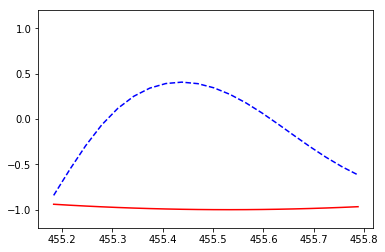

   [[455.81975702 455.851588   455.88341899 455.91524998 455.94708097
  455.97891196 456.01074295 456.04257394 456.07440492 456.10623591
  456.1380669  456.16989789 456.20172888 456.23355987 456.26539086
  456.29722184 456.32905283 456.36088382 456.39271481 456.4245458 ]
 [456.45637679 456.48820778 456.52003876 456.55186975 456.58370074
  456.61553173 456.64736272 456.67919371 456.7110247  456.74285569
  456.77468667 456.80651766 456.83834865 456.87017964 456.90201063
  456.93384162 456.96567261 456.99750359 457.02933458 457.06116557]
 [457.09299656 457.12482755 457.15665854 457.18848953 457.22032051
  457.2521515  457.28398249 457.31581348 457.34764447 457.37947546
  457.41130645 457.44313743 457.47496842 457.50679941 457.5386304
  457.57046139 457.60229238 457.63412337 457.66595436 457.69778534]
 [457.72961633 457.76144732 457.79327831 457.8251093  457.85694029
  457.88877128 457.92060226 457.95243325 457.98426424 458.01609523
  458.04792622 458.07975721 458.1115882  458.14341918 458

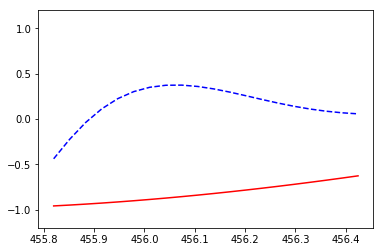

   [[456.45637679 456.48820778 456.52003876 456.55186975 456.58370074
  456.61553173 456.64736272 456.67919371 456.7110247  456.74285569
  456.77468667 456.80651766 456.83834865 456.87017964 456.90201063
  456.93384162 456.96567261 456.99750359 457.02933458 457.06116557]
 [457.09299656 457.12482755 457.15665854 457.18848953 457.22032051
  457.2521515  457.28398249 457.31581348 457.34764447 457.37947546
  457.41130645 457.44313743 457.47496842 457.50679941 457.5386304
  457.57046139 457.60229238 457.63412337 457.66595436 457.69778534]
 [457.72961633 457.76144732 457.79327831 457.8251093  457.85694029
  457.88877128 457.92060226 457.95243325 457.98426424 458.01609523
  458.04792622 458.07975721 458.1115882  458.14341918 458.17525017
  458.20708116 458.23891215 458.27074314 458.30257413 458.33440512]
 [458.3662361  458.39806709 458.42989808 458.46172907 458.49356006
  458.52539105 458.55722204 458.58905302 458.62088401 458.652715
  458.68454599 458.71637698 458.74820797 458.78003896 458.8

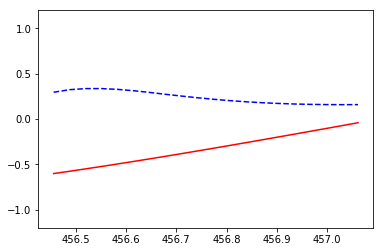

   [[457.09299656 457.12482755 457.15665854 457.18848953 457.22032051
  457.2521515  457.28398249 457.31581348 457.34764447 457.37947546
  457.41130645 457.44313743 457.47496842 457.50679941 457.5386304
  457.57046139 457.60229238 457.63412337 457.66595436 457.69778534]
 [457.72961633 457.76144732 457.79327831 457.8251093  457.85694029
  457.88877128 457.92060226 457.95243325 457.98426424 458.01609523
  458.04792622 458.07975721 458.1115882  458.14341918 458.17525017
  458.20708116 458.23891215 458.27074314 458.30257413 458.33440512]
 [458.3662361  458.39806709 458.42989808 458.46172907 458.49356006
  458.52539105 458.55722204 458.58905302 458.62088401 458.652715
  458.68454599 458.71637698 458.74820797 458.78003896 458.81186995
  458.84370093 458.87553192 458.90736291 458.9391939  458.97102489]
 [459.00285588 459.03468687 459.06651785 459.09834884 459.13017983
  459.16201082 459.19384181 459.2256728  459.25750379 459.28933477
  459.32116576 459.35299675 459.38482774 459.41665873 459.4

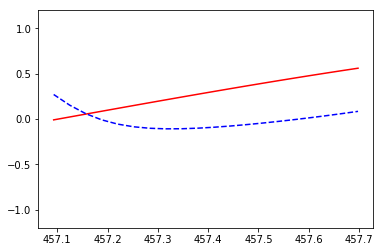

   [[457.72961633 457.76144732 457.79327831 457.8251093  457.85694029
  457.88877128 457.92060226 457.95243325 457.98426424 458.01609523
  458.04792622 458.07975721 458.1115882  458.14341918 458.17525017
  458.20708116 458.23891215 458.27074314 458.30257413 458.33440512]
 [458.3662361  458.39806709 458.42989808 458.46172907 458.49356006
  458.52539105 458.55722204 458.58905302 458.62088401 458.652715
  458.68454599 458.71637698 458.74820797 458.78003896 458.81186995
  458.84370093 458.87553192 458.90736291 458.9391939  458.97102489]
 [459.00285588 459.03468687 459.06651785 459.09834884 459.13017983
  459.16201082 459.19384181 459.2256728  459.25750379 459.28933477
  459.32116576 459.35299675 459.38482774 459.41665873 459.44848972
  459.48032071 459.51215169 459.54398268 459.57581367 459.60764466]
 [459.63947565 459.67130664 459.70313763 459.73496862 459.7667996
  459.79863059 459.83046158 459.86229257 459.89412356 459.92595455
  459.95778554 459.98961652 460.02144751 460.0532785  460.0

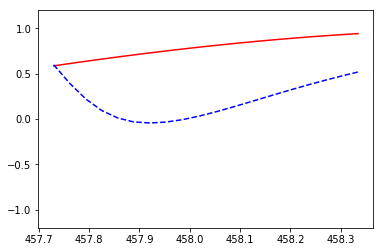

   [[458.3662361  458.39806709 458.42989808 458.46172907 458.49356006
  458.52539105 458.55722204 458.58905302 458.62088401 458.652715
  458.68454599 458.71637698 458.74820797 458.78003896 458.81186995
  458.84370093 458.87553192 458.90736291 458.9391939  458.97102489]
 [459.00285588 459.03468687 459.06651785 459.09834884 459.13017983
  459.16201082 459.19384181 459.2256728  459.25750379 459.28933477
  459.32116576 459.35299675 459.38482774 459.41665873 459.44848972
  459.48032071 459.51215169 459.54398268 459.57581367 459.60764466]
 [459.63947565 459.67130664 459.70313763 459.73496862 459.7667996
  459.79863059 459.83046158 459.86229257 459.89412356 459.92595455
  459.95778554 459.98961652 460.02144751 460.0532785  460.08510949
  460.11694048 460.14877147 460.18060246 460.21243344 460.24426443]
 [460.27609542 460.30792641 460.3397574  460.37158839 460.40341938
  460.43525036 460.46708135 460.49891234 460.53074333 460.56257432
  460.59440531 460.6262363  460.65806729 460.68989827 460.7

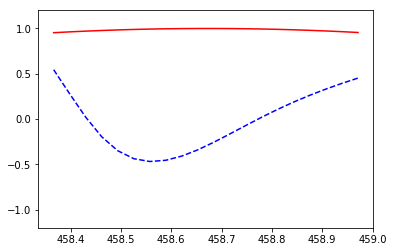

   [[459.00285588 459.03468687 459.06651785 459.09834884 459.13017983
  459.16201082 459.19384181 459.2256728  459.25750379 459.28933477
  459.32116576 459.35299675 459.38482774 459.41665873 459.44848972
  459.48032071 459.51215169 459.54398268 459.57581367 459.60764466]
 [459.63947565 459.67130664 459.70313763 459.73496862 459.7667996
  459.79863059 459.83046158 459.86229257 459.89412356 459.92595455
  459.95778554 459.98961652 460.02144751 460.0532785  460.08510949
  460.11694048 460.14877147 460.18060246 460.21243344 460.24426443]
 [460.27609542 460.30792641 460.3397574  460.37158839 460.40341938
  460.43525036 460.46708135 460.49891234 460.53074333 460.56257432
  460.59440531 460.6262363  460.65806729 460.68989827 460.72172926
  460.75356025 460.78539124 460.81722223 460.84905322 460.88088421]
 [460.91271519 460.94454618 460.97637717 461.00820816 461.04003915
  461.07187014 461.10370113 461.13553211 461.1673631  461.19919409
  461.23102508 461.26285607 461.29468706 461.32651805 461

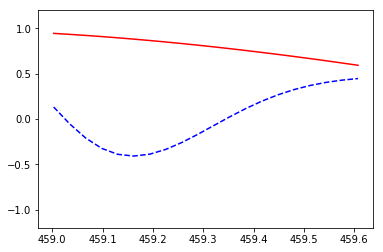

   [[459.63947565 459.67130664 459.70313763 459.73496862 459.7667996
  459.79863059 459.83046158 459.86229257 459.89412356 459.92595455
  459.95778554 459.98961652 460.02144751 460.0532785  460.08510949
  460.11694048 460.14877147 460.18060246 460.21243344 460.24426443]
 [460.27609542 460.30792641 460.3397574  460.37158839 460.40341938
  460.43525036 460.46708135 460.49891234 460.53074333 460.56257432
  460.59440531 460.6262363  460.65806729 460.68989827 460.72172926
  460.75356025 460.78539124 460.81722223 460.84905322 460.88088421]
 [460.91271519 460.94454618 460.97637717 461.00820816 461.04003915
  461.07187014 461.10370113 461.13553211 461.1673631  461.19919409
  461.23102508 461.26285607 461.29468706 461.32651805 461.35834903
  461.39018002 461.42201101 461.453842   461.48567299 461.51750398]
 [461.54933497 461.58116596 461.61299694 461.64482793 461.67665892
  461.70848991 461.7403209  461.77215189 461.80398288 461.83581386
  461.86764485 461.89947584 461.93130683 461.96313782 461

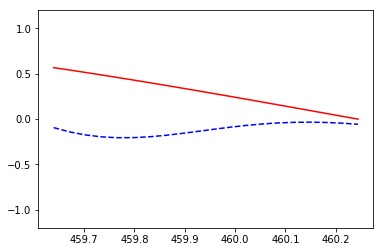

   0.033253234
   [[460.27609542 460.30792641 460.3397574  460.37158839 460.40341938
  460.43525036 460.46708135 460.49891234 460.53074333 460.56257432
  460.59440531 460.6262363  460.65806729 460.68989827 460.72172926
  460.75356025 460.78539124 460.81722223 460.84905322 460.88088421]
 [460.91271519 460.94454618 460.97637717 461.00820816 461.04003915
  461.07187014 461.10370113 461.13553211 461.1673631  461.19919409
  461.23102508 461.26285607 461.29468706 461.32651805 461.35834903
  461.39018002 461.42201101 461.453842   461.48567299 461.51750398]
 [461.54933497 461.58116596 461.61299694 461.64482793 461.67665892
  461.70848991 461.7403209  461.77215189 461.80398288 461.83581386
  461.86764485 461.89947584 461.93130683 461.96313782 461.99496881
  462.0267998  462.05863078 462.09046177 462.12229276 462.15412375]
 [462.18595474 462.21778573 462.24961672 462.2814477  462.31327869
  462.34510968 462.37694067 462.40877166 462.44060265 462.47243364
  462.50426463 462.53609561 462.5679266  

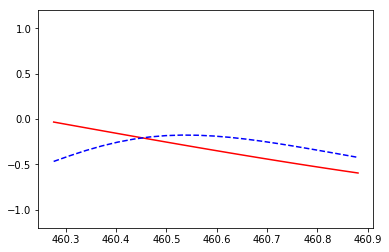

   [[460.91271519 460.94454618 460.97637717 461.00820816 461.04003915
  461.07187014 461.10370113 461.13553211 461.1673631  461.19919409
  461.23102508 461.26285607 461.29468706 461.32651805 461.35834903
  461.39018002 461.42201101 461.453842   461.48567299 461.51750398]
 [461.54933497 461.58116596 461.61299694 461.64482793 461.67665892
  461.70848991 461.7403209  461.77215189 461.80398288 461.83581386
  461.86764485 461.89947584 461.93130683 461.96313782 461.99496881
  462.0267998  462.05863078 462.09046177 462.12229276 462.15412375]
 [462.18595474 462.21778573 462.24961672 462.2814477  462.31327869
  462.34510968 462.37694067 462.40877166 462.44060265 462.47243364
  462.50426463 462.53609561 462.5679266  462.59975759 462.63158858
  462.66341957 462.69525056 462.72708155 462.75891253 462.79074352]
 [462.82257451 462.8544055  462.88623649 462.91806748 462.94989847
  462.98172945 463.01356044 463.04539143 463.07722242 463.10905341
  463.1408844  463.17271539 463.20454637 463.23637736 46

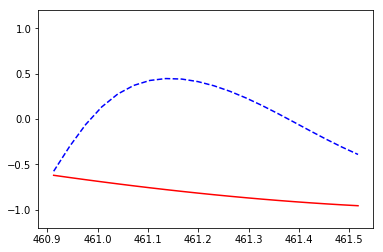

   [[461.54933497 461.58116596 461.61299694 461.64482793 461.67665892
  461.70848991 461.7403209  461.77215189 461.80398288 461.83581386
  461.86764485 461.89947584 461.93130683 461.96313782 461.99496881
  462.0267998  462.05863078 462.09046177 462.12229276 462.15412375]
 [462.18595474 462.21778573 462.24961672 462.2814477  462.31327869
  462.34510968 462.37694067 462.40877166 462.44060265 462.47243364
  462.50426463 462.53609561 462.5679266  462.59975759 462.63158858
  462.66341957 462.69525056 462.72708155 462.75891253 462.79074352]
 [462.82257451 462.8544055  462.88623649 462.91806748 462.94989847
  462.98172945 463.01356044 463.04539143 463.07722242 463.10905341
  463.1408844  463.17271539 463.20454637 463.23637736 463.26820835
  463.30003934 463.33187033 463.36370132 463.39553231 463.42736329]
 [463.45919428 463.49102527 463.52285626 463.55468725 463.58651824
  463.61834923 463.65018022 463.6820112  463.71384219 463.74567318
  463.77750417 463.80933516 463.84116615 463.87299714 46

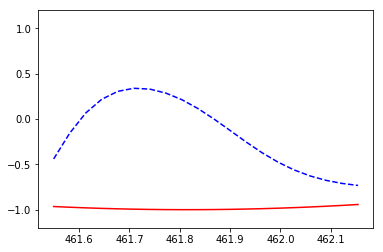

   [[462.18595474 462.21778573 462.24961672 462.2814477  462.31327869
  462.34510968 462.37694067 462.40877166 462.44060265 462.47243364
  462.50426463 462.53609561 462.5679266  462.59975759 462.63158858
  462.66341957 462.69525056 462.72708155 462.75891253 462.79074352]
 [462.82257451 462.8544055  462.88623649 462.91806748 462.94989847
  462.98172945 463.01356044 463.04539143 463.07722242 463.10905341
  463.1408844  463.17271539 463.20454637 463.23637736 463.26820835
  463.30003934 463.33187033 463.36370132 463.39553231 463.42736329]
 [463.45919428 463.49102527 463.52285626 463.55468725 463.58651824
  463.61834923 463.65018022 463.6820112  463.71384219 463.74567318
  463.77750417 463.80933516 463.84116615 463.87299714 463.90482812
  463.93665911 463.9684901  464.00032109 464.03215208 464.06398307]
 [464.09581406 464.12764504 464.15947603 464.19130702 464.22313801
  464.254969   464.28679999 464.31863098 464.35046196 464.38229295
  464.41412394 464.44595493 464.47778592 464.50961691 46

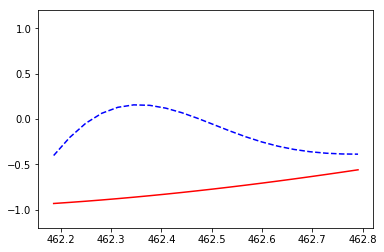

   [[462.82257451 462.8544055  462.88623649 462.91806748 462.94989847
  462.98172945 463.01356044 463.04539143 463.07722242 463.10905341
  463.1408844  463.17271539 463.20454637 463.23637736 463.26820835
  463.30003934 463.33187033 463.36370132 463.39553231 463.42736329]
 [463.45919428 463.49102527 463.52285626 463.55468725 463.58651824
  463.61834923 463.65018022 463.6820112  463.71384219 463.74567318
  463.77750417 463.80933516 463.84116615 463.87299714 463.90482812
  463.93665911 463.9684901  464.00032109 464.03215208 464.06398307]
 [464.09581406 464.12764504 464.15947603 464.19130702 464.22313801
  464.254969   464.28679999 464.31863098 464.35046196 464.38229295
  464.41412394 464.44595493 464.47778592 464.50961691 464.5414479
  464.57327889 464.60510987 464.63694086 464.66877185 464.70060284]
 [464.73243383 464.76426482 464.79609581 464.82792679 464.85975778
  464.89158877 464.92341976 464.95525075 464.98708174 465.01891273
  465.05074371 465.0825747  465.11440569 465.14623668 465

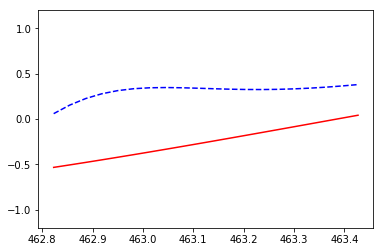

   [[463.45919428 463.49102527 463.52285626 463.55468725 463.58651824
  463.61834923 463.65018022 463.6820112  463.71384219 463.74567318
  463.77750417 463.80933516 463.84116615 463.87299714 463.90482812
  463.93665911 463.9684901  464.00032109 464.03215208 464.06398307]
 [464.09581406 464.12764504 464.15947603 464.19130702 464.22313801
  464.254969   464.28679999 464.31863098 464.35046196 464.38229295
  464.41412394 464.44595493 464.47778592 464.50961691 464.5414479
  464.57327889 464.60510987 464.63694086 464.66877185 464.70060284]
 [464.73243383 464.76426482 464.79609581 464.82792679 464.85975778
  464.89158877 464.92341976 464.95525075 464.98708174 465.01891273
  465.05074371 465.0825747  465.11440569 465.14623668 465.17806767
  465.20989866 465.24172965 465.27356063 465.30539162 465.33722261]
 [465.3690536  465.40088459 465.43271558 465.46454657 465.49637756
  465.52820854 465.56003953 465.59187052 465.62370151 465.6555325
  465.68736349 465.71919448 465.75102546 465.78285645 465.

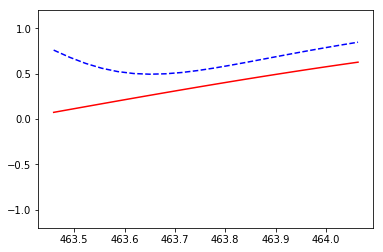

   [[464.09581406 464.12764504 464.15947603 464.19130702 464.22313801
  464.254969   464.28679999 464.31863098 464.35046196 464.38229295
  464.41412394 464.44595493 464.47778592 464.50961691 464.5414479
  464.57327889 464.60510987 464.63694086 464.66877185 464.70060284]
 [464.73243383 464.76426482 464.79609581 464.82792679 464.85975778
  464.89158877 464.92341976 464.95525075 464.98708174 465.01891273
  465.05074371 465.0825747  465.11440569 465.14623668 465.17806767
  465.20989866 465.24172965 465.27356063 465.30539162 465.33722261]
 [465.3690536  465.40088459 465.43271558 465.46454657 465.49637756
  465.52820854 465.56003953 465.59187052 465.62370151 465.6555325
  465.68736349 465.71919448 465.75102546 465.78285645 465.81468744
  465.84651843 465.87834942 465.91018041 465.9420114  465.97384238]
 [466.00567337 466.03750436 466.06933535 466.10116634 466.13299733
  466.16482832 466.1966593  466.22849029 466.26032128 466.29215227
  466.32398326 466.35581425 466.38764524 466.41947623 466.

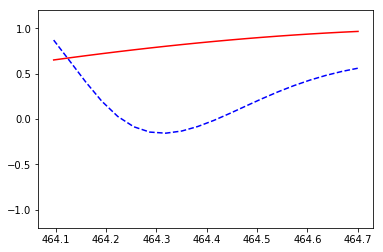

   [[464.73243383 464.76426482 464.79609581 464.82792679 464.85975778
  464.89158877 464.92341976 464.95525075 464.98708174 465.01891273
  465.05074371 465.0825747  465.11440569 465.14623668 465.17806767
  465.20989866 465.24172965 465.27356063 465.30539162 465.33722261]
 [465.3690536  465.40088459 465.43271558 465.46454657 465.49637756
  465.52820854 465.56003953 465.59187052 465.62370151 465.6555325
  465.68736349 465.71919448 465.75102546 465.78285645 465.81468744
  465.84651843 465.87834942 465.91018041 465.9420114  465.97384238]
 [466.00567337 466.03750436 466.06933535 466.10116634 466.13299733
  466.16482832 466.1966593  466.22849029 466.26032128 466.29215227
  466.32398326 466.35581425 466.38764524 466.41947623 466.45130721
  466.4831382  466.51496919 466.54680018 466.57863117 466.61046216]
 [466.64229315 466.67412413 466.70595512 466.73778611 466.7696171
  466.80144809 466.83327908 466.86511007 466.89694105 466.92877204
  466.96060303 466.99243402 467.02426501 467.056096   467.

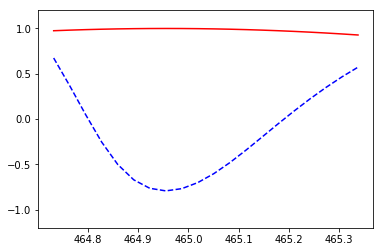

   [[465.3690536  465.40088459 465.43271558 465.46454657 465.49637756
  465.52820854 465.56003953 465.59187052 465.62370151 465.6555325
  465.68736349 465.71919448 465.75102546 465.78285645 465.81468744
  465.84651843 465.87834942 465.91018041 465.9420114  465.97384238]
 [466.00567337 466.03750436 466.06933535 466.10116634 466.13299733
  466.16482832 466.1966593  466.22849029 466.26032128 466.29215227
  466.32398326 466.35581425 466.38764524 466.41947623 466.45130721
  466.4831382  466.51496919 466.54680018 466.57863117 466.61046216]
 [466.64229315 466.67412413 466.70595512 466.73778611 466.7696171
  466.80144809 466.83327908 466.86511007 466.89694105 466.92877204
  466.96060303 466.99243402 467.02426501 467.056096   467.08792699
  467.11975797 467.15158896 467.18341995 467.21525094 467.24708193]
 [467.27891292 467.31074391 467.3425749  467.37440588 467.40623687
  467.43806786 467.46989885 467.50172984 467.53356083 467.56539182
  467.5972228  467.62905379 467.66088478 467.69271577 467.

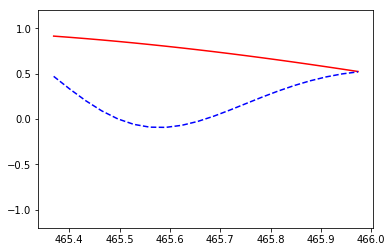

   [[466.00567337 466.03750436 466.06933535 466.10116634 466.13299733
  466.16482832 466.1966593  466.22849029 466.26032128 466.29215227
  466.32398326 466.35581425 466.38764524 466.41947623 466.45130721
  466.4831382  466.51496919 466.54680018 466.57863117 466.61046216]
 [466.64229315 466.67412413 466.70595512 466.73778611 466.7696171
  466.80144809 466.83327908 466.86511007 466.89694105 466.92877204
  466.96060303 466.99243402 467.02426501 467.056096   467.08792699
  467.11975797 467.15158896 467.18341995 467.21525094 467.24708193]
 [467.27891292 467.31074391 467.3425749  467.37440588 467.40623687
  467.43806786 467.46989885 467.50172984 467.53356083 467.56539182
  467.5972228  467.62905379 467.66088478 467.69271577 467.72454676
  467.75637775 467.78820874 467.82003972 467.85187071 467.8837017 ]
 [467.91553269 467.94736368 467.97919467 468.01102566 468.04285664
  468.07468763 468.10651862 468.13834961 468.1701806  468.20201159
  468.23384258 468.26567356 468.29750455 468.32933554 468

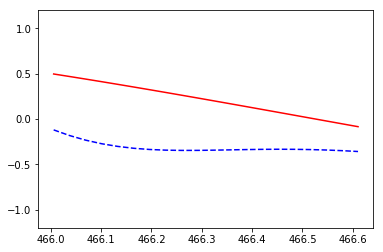

   0.042423703
   [[466.64229315 466.67412413 466.70595512 466.73778611 466.7696171
  466.80144809 466.83327908 466.86511007 466.89694105 466.92877204
  466.96060303 466.99243402 467.02426501 467.056096   467.08792699
  467.11975797 467.15158896 467.18341995 467.21525094 467.24708193]
 [467.27891292 467.31074391 467.3425749  467.37440588 467.40623687
  467.43806786 467.46989885 467.50172984 467.53356083 467.56539182
  467.5972228  467.62905379 467.66088478 467.69271577 467.72454676
  467.75637775 467.78820874 467.82003972 467.85187071 467.8837017 ]
 [467.91553269 467.94736368 467.97919467 468.01102566 468.04285664
  468.07468763 468.10651862 468.13834961 468.1701806  468.20201159
  468.23384258 468.26567356 468.29750455 468.32933554 468.36116653
  468.39299752 468.42482851 468.4566595  468.48849049 468.52032147]
 [468.55215246 468.58398345 468.61581444 468.64764543 468.67947642
  468.71130741 468.74313839 468.77496938 468.80680037 468.83863136
  468.87046235 468.90229334 468.93412433 4

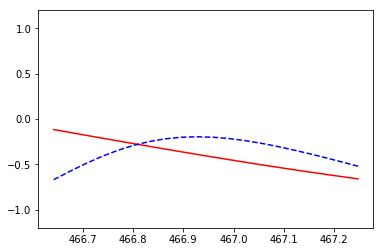

   [[467.27891292 467.31074391 467.3425749  467.37440588 467.40623687
  467.43806786 467.46989885 467.50172984 467.53356083 467.56539182
  467.5972228  467.62905379 467.66088478 467.69271577 467.72454676
  467.75637775 467.78820874 467.82003972 467.85187071 467.8837017 ]
 [467.91553269 467.94736368 467.97919467 468.01102566 468.04285664
  468.07468763 468.10651862 468.13834961 468.1701806  468.20201159
  468.23384258 468.26567356 468.29750455 468.32933554 468.36116653
  468.39299752 468.42482851 468.4566595  468.48849049 468.52032147]
 [468.55215246 468.58398345 468.61581444 468.64764543 468.67947642
  468.71130741 468.74313839 468.77496938 468.80680037 468.83863136
  468.87046235 468.90229334 468.93412433 468.96595531 468.9977863
  469.02961729 469.06144828 469.09327927 469.12511026 469.15694125]
 [469.18877223 469.22060322 469.25243421 469.2842652  469.31609619
  469.34792718 469.37975817 469.41158916 469.44342014 469.47525113
  469.50708212 469.53891311 469.5707441  469.60257509 469

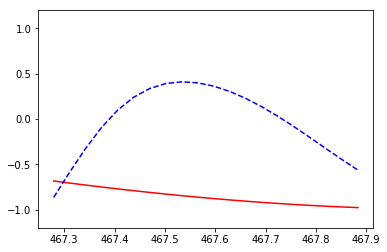

   [[467.91553269 467.94736368 467.97919467 468.01102566 468.04285664
  468.07468763 468.10651862 468.13834961 468.1701806  468.20201159
  468.23384258 468.26567356 468.29750455 468.32933554 468.36116653
  468.39299752 468.42482851 468.4566595  468.48849049 468.52032147]
 [468.55215246 468.58398345 468.61581444 468.64764543 468.67947642
  468.71130741 468.74313839 468.77496938 468.80680037 468.83863136
  468.87046235 468.90229334 468.93412433 468.96595531 468.9977863
  469.02961729 469.06144828 469.09327927 469.12511026 469.15694125]
 [469.18877223 469.22060322 469.25243421 469.2842652  469.31609619
  469.34792718 469.37975817 469.41158916 469.44342014 469.47525113
  469.50708212 469.53891311 469.5707441  469.60257509 469.63440608
  469.66623706 469.69806805 469.72989904 469.76173003 469.79356102]
 [469.82539201 469.857223   469.88905398 469.92088497 469.95271596
  469.98454695 470.01637794 470.04820893 470.08003992 470.1118709
  470.14370189 470.17553288 470.20736387 470.23919486 470.

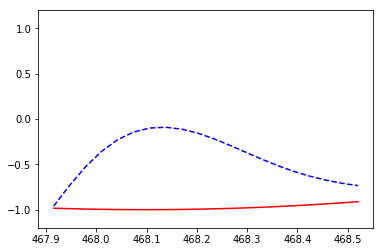

   [[468.55215246 468.58398345 468.61581444 468.64764543 468.67947642
  468.71130741 468.74313839 468.77496938 468.80680037 468.83863136
  468.87046235 468.90229334 468.93412433 468.96595531 468.9977863
  469.02961729 469.06144828 469.09327927 469.12511026 469.15694125]
 [469.18877223 469.22060322 469.25243421 469.2842652  469.31609619
  469.34792718 469.37975817 469.41158916 469.44342014 469.47525113
  469.50708212 469.53891311 469.5707441  469.60257509 469.63440608
  469.66623706 469.69806805 469.72989904 469.76173003 469.79356102]
 [469.82539201 469.857223   469.88905398 469.92088497 469.95271596
  469.98454695 470.01637794 470.04820893 470.08003992 470.1118709
  470.14370189 470.17553288 470.20736387 470.23919486 470.27102585
  470.30285684 470.33468783 470.36651881 470.3983498  470.43018079]
 [470.46201178 470.49384277 470.52567376 470.55750475 470.58933573
  470.62116672 470.65299771 470.6848287  470.71665969 470.74849068
  470.78032167 470.81215265 470.84398364 470.87581463 470.

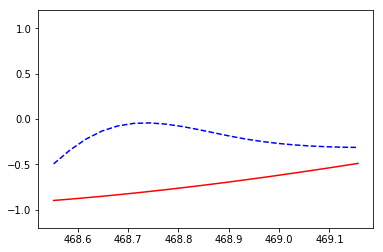

   [[469.18877223 469.22060322 469.25243421 469.2842652  469.31609619
  469.34792718 469.37975817 469.41158916 469.44342014 469.47525113
  469.50708212 469.53891311 469.5707441  469.60257509 469.63440608
  469.66623706 469.69806805 469.72989904 469.76173003 469.79356102]
 [469.82539201 469.857223   469.88905398 469.92088497 469.95271596
  469.98454695 470.01637794 470.04820893 470.08003992 470.1118709
  470.14370189 470.17553288 470.20736387 470.23919486 470.27102585
  470.30285684 470.33468783 470.36651881 470.3983498  470.43018079]
 [470.46201178 470.49384277 470.52567376 470.55750475 470.58933573
  470.62116672 470.65299771 470.6848287  470.71665969 470.74849068
  470.78032167 470.81215265 470.84398364 470.87581463 470.90764562
  470.93947661 470.9713076  471.00313859 471.03496957 471.06680056]
 [471.09863155 471.13046254 471.16229353 471.19412452 471.22595551
  471.2577865  471.28961748 471.32144847 471.35327946 471.38511045
  471.41694144 471.44877243 471.48060342 471.5124344  471

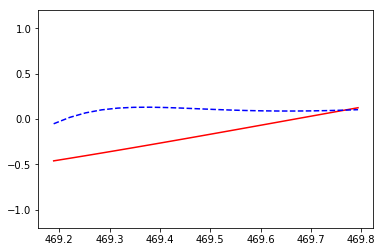

   [[469.82539201 469.857223   469.88905398 469.92088497 469.95271596
  469.98454695 470.01637794 470.04820893 470.08003992 470.1118709
  470.14370189 470.17553288 470.20736387 470.23919486 470.27102585
  470.30285684 470.33468783 470.36651881 470.3983498  470.43018079]
 [470.46201178 470.49384277 470.52567376 470.55750475 470.58933573
  470.62116672 470.65299771 470.6848287  470.71665969 470.74849068
  470.78032167 470.81215265 470.84398364 470.87581463 470.90764562
  470.93947661 470.9713076  471.00313859 471.03496957 471.06680056]
 [471.09863155 471.13046254 471.16229353 471.19412452 471.22595551
  471.2577865  471.28961748 471.32144847 471.35327946 471.38511045
  471.41694144 471.44877243 471.48060342 471.5124344  471.54426539
  471.57609638 471.60792737 471.63975836 471.67158935 471.70342034]
 [471.73525132 471.76708231 471.7989133  471.83074429 471.86257528
  471.89440627 471.92623726 471.95806824 471.98989923 472.02173022
  472.05356121 472.0853922  472.11722319 472.14905418 472

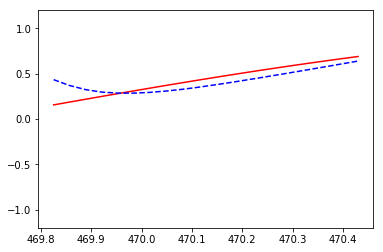

   [[470.46201178 470.49384277 470.52567376 470.55750475 470.58933573
  470.62116672 470.65299771 470.6848287  470.71665969 470.74849068
  470.78032167 470.81215265 470.84398364 470.87581463 470.90764562
  470.93947661 470.9713076  471.00313859 471.03496957 471.06680056]
 [471.09863155 471.13046254 471.16229353 471.19412452 471.22595551
  471.2577865  471.28961748 471.32144847 471.35327946 471.38511045
  471.41694144 471.44877243 471.48060342 471.5124344  471.54426539
  471.57609638 471.60792737 471.63975836 471.67158935 471.70342034]
 [471.73525132 471.76708231 471.7989133  471.83074429 471.86257528
  471.89440627 471.92623726 471.95806824 471.98989923 472.02173022
  472.05356121 472.0853922  472.11722319 472.14905418 472.18088517
  472.21271615 472.24454714 472.27637813 472.30820912 472.34004011]
 [472.3718711  472.40370209 472.43553307 472.46736406 472.49919505
  472.53102604 472.56285703 472.59468802 472.62651901 472.65834999
  472.69018098 472.72201197 472.75384296 472.78567395 47

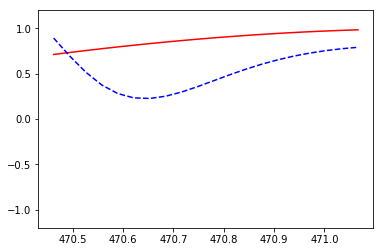

   [[471.09863155 471.13046254 471.16229353 471.19412452 471.22595551
  471.2577865  471.28961748 471.32144847 471.35327946 471.38511045
  471.41694144 471.44877243 471.48060342 471.5124344  471.54426539
  471.57609638 471.60792737 471.63975836 471.67158935 471.70342034]
 [471.73525132 471.76708231 471.7989133  471.83074429 471.86257528
  471.89440627 471.92623726 471.95806824 471.98989923 472.02173022
  472.05356121 472.0853922  472.11722319 472.14905418 472.18088517
  472.21271615 472.24454714 472.27637813 472.30820912 472.34004011]
 [472.3718711  472.40370209 472.43553307 472.46736406 472.49919505
  472.53102604 472.56285703 472.59468802 472.62651901 472.65834999
  472.69018098 472.72201197 472.75384296 472.78567395 472.81750494
  472.84933593 472.88116691 472.9129979  472.94482889 472.97665988]
 [473.00849087 473.04032186 473.07215285 473.10398383 473.13581482
  473.16764581 473.1994768  473.23130779 473.26313878 473.29496977
  473.32680076 473.35863174 473.39046273 473.42229372 47

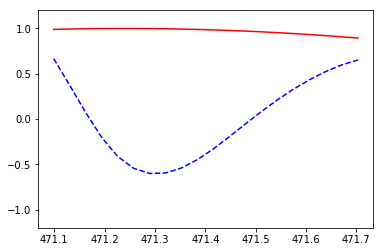

   [[471.73525132 471.76708231 471.7989133  471.83074429 471.86257528
  471.89440627 471.92623726 471.95806824 471.98989923 472.02173022
  472.05356121 472.0853922  472.11722319 472.14905418 472.18088517
  472.21271615 472.24454714 472.27637813 472.30820912 472.34004011]
 [472.3718711  472.40370209 472.43553307 472.46736406 472.49919505
  472.53102604 472.56285703 472.59468802 472.62651901 472.65834999
  472.69018098 472.72201197 472.75384296 472.78567395 472.81750494
  472.84933593 472.88116691 472.9129979  472.94482889 472.97665988]
 [473.00849087 473.04032186 473.07215285 473.10398383 473.13581482
  473.16764581 473.1994768  473.23130779 473.26313878 473.29496977
  473.32680076 473.35863174 473.39046273 473.42229372 473.45412471
  473.4859557  473.51778669 473.54961768 473.58144866 473.61327965]
 [473.64511064 473.67694163 473.70877262 473.74060361 473.7724346
  473.80426558 473.83609657 473.86792756 473.89975855 473.93158954
  473.96342053 473.99525152 474.0270825  474.05891349 474

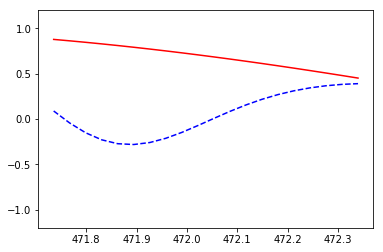

   [[472.3718711  472.40370209 472.43553307 472.46736406 472.49919505
  472.53102604 472.56285703 472.59468802 472.62651901 472.65834999
  472.69018098 472.72201197 472.75384296 472.78567395 472.81750494
  472.84933593 472.88116691 472.9129979  472.94482889 472.97665988]
 [473.00849087 473.04032186 473.07215285 473.10398383 473.13581482
  473.16764581 473.1994768  473.23130779 473.26313878 473.29496977
  473.32680076 473.35863174 473.39046273 473.42229372 473.45412471
  473.4859557  473.51778669 473.54961768 473.58144866 473.61327965]
 [473.64511064 473.67694163 473.70877262 473.74060361 473.7724346
  473.80426558 473.83609657 473.86792756 473.89975855 473.93158954
  473.96342053 473.99525152 474.0270825  474.05891349 474.09074448
  474.12257547 474.15440646 474.18623745 474.21806844 474.24989943]
 [474.28173041 474.3135614  474.34539239 474.37722338 474.40905437
  474.44088536 474.47271635 474.50454733 474.53637832 474.56820931
  474.6000403  474.63187129 474.66370228 474.69553327 474

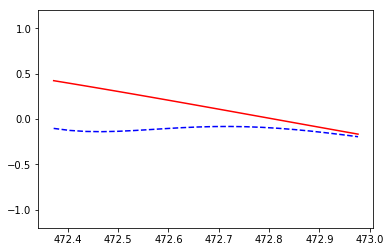

   0.036413196
   [[473.00849087 473.04032186 473.07215285 473.10398383 473.13581482
  473.16764581 473.1994768  473.23130779 473.26313878 473.29496977
  473.32680076 473.35863174 473.39046273 473.42229372 473.45412471
  473.4859557  473.51778669 473.54961768 473.58144866 473.61327965]
 [473.64511064 473.67694163 473.70877262 473.74060361 473.7724346
  473.80426558 473.83609657 473.86792756 473.89975855 473.93158954
  473.96342053 473.99525152 474.0270825  474.05891349 474.09074448
  474.12257547 474.15440646 474.18623745 474.21806844 474.24989943]
 [474.28173041 474.3135614  474.34539239 474.37722338 474.40905437
  474.44088536 474.47271635 474.50454733 474.53637832 474.56820931
  474.6000403  474.63187129 474.66370228 474.69553327 474.72736425
  474.75919524 474.79102623 474.82285722 474.85468821 474.8865192 ]
 [474.91835019 474.95018117 474.98201216 475.01384315 475.04567414
  475.07750513 475.10933612 475.14116711 475.1729981  475.20482908
  475.23666007 475.26849106 475.30032205 4

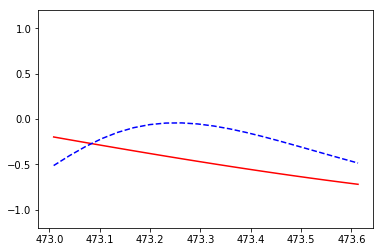

   [[473.64511064 473.67694163 473.70877262 473.74060361 473.7724346
  473.80426558 473.83609657 473.86792756 473.89975855 473.93158954
  473.96342053 473.99525152 474.0270825  474.05891349 474.09074448
  474.12257547 474.15440646 474.18623745 474.21806844 474.24989943]
 [474.28173041 474.3135614  474.34539239 474.37722338 474.40905437
  474.44088536 474.47271635 474.50454733 474.53637832 474.56820931
  474.6000403  474.63187129 474.66370228 474.69553327 474.72736425
  474.75919524 474.79102623 474.82285722 474.85468821 474.8865192 ]
 [474.91835019 474.95018117 474.98201216 475.01384315 475.04567414
  475.07750513 475.10933612 475.14116711 475.1729981  475.20482908
  475.23666007 475.26849106 475.30032205 475.33215304 475.36398403
  475.39581502 475.427646   475.45947699 475.49130798 475.52313897]
 [475.55496996 475.58680095 475.61863194 475.65046292 475.68229391
  475.7141249  475.74595589 475.77778688 475.80961787 475.84144886
  475.87327984 475.90511083 475.93694182 475.96877281 476

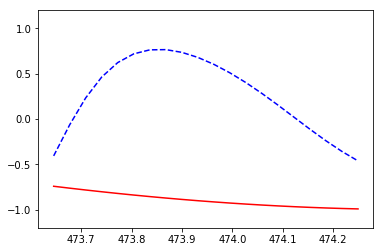

   [[474.28173041 474.3135614  474.34539239 474.37722338 474.40905437
  474.44088536 474.47271635 474.50454733 474.53637832 474.56820931
  474.6000403  474.63187129 474.66370228 474.69553327 474.72736425
  474.75919524 474.79102623 474.82285722 474.85468821 474.8865192 ]
 [474.91835019 474.95018117 474.98201216 475.01384315 475.04567414
  475.07750513 475.10933612 475.14116711 475.1729981  475.20482908
  475.23666007 475.26849106 475.30032205 475.33215304 475.36398403
  475.39581502 475.427646   475.45947699 475.49130798 475.52313897]
 [475.55496996 475.58680095 475.61863194 475.65046292 475.68229391
  475.7141249  475.74595589 475.77778688 475.80961787 475.84144886
  475.87327984 475.90511083 475.93694182 475.96877281 476.0006038
  476.03243479 476.06426578 476.09609677 476.12792775 476.15975874]
 [476.19158973 476.22342072 476.25525171 476.2870827  476.31891369
  476.35074467 476.38257566 476.41440665 476.44623764 476.47806863
  476.50989962 476.54173061 476.57356159 476.60539258 476

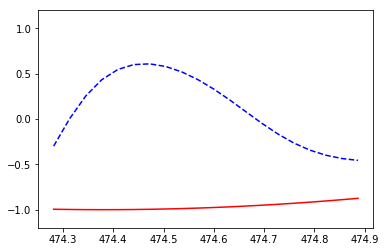

   [[474.91835019 474.95018117 474.98201216 475.01384315 475.04567414
  475.07750513 475.10933612 475.14116711 475.1729981  475.20482908
  475.23666007 475.26849106 475.30032205 475.33215304 475.36398403
  475.39581502 475.427646   475.45947699 475.49130798 475.52313897]
 [475.55496996 475.58680095 475.61863194 475.65046292 475.68229391
  475.7141249  475.74595589 475.77778688 475.80961787 475.84144886
  475.87327984 475.90511083 475.93694182 475.96877281 476.0006038
  476.03243479 476.06426578 476.09609677 476.12792775 476.15975874]
 [476.19158973 476.22342072 476.25525171 476.2870827  476.31891369
  476.35074467 476.38257566 476.41440665 476.44623764 476.47806863
  476.50989962 476.54173061 476.57356159 476.60539258 476.63722357
  476.66905456 476.70088555 476.73271654 476.76454753 476.79637851]
 [476.8282095  476.86004049 476.89187148 476.92370247 476.95553346
  476.98736445 477.01919544 477.05102642 477.08285741 477.1146884
  477.14651939 477.17835038 477.21018137 477.24201236 477.

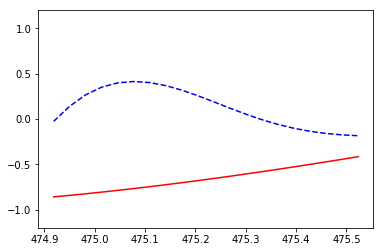

   [[475.55496996 475.58680095 475.61863194 475.65046292 475.68229391
  475.7141249  475.74595589 475.77778688 475.80961787 475.84144886
  475.87327984 475.90511083 475.93694182 475.96877281 476.0006038
  476.03243479 476.06426578 476.09609677 476.12792775 476.15975874]
 [476.19158973 476.22342072 476.25525171 476.2870827  476.31891369
  476.35074467 476.38257566 476.41440665 476.44623764 476.47806863
  476.50989962 476.54173061 476.57356159 476.60539258 476.63722357
  476.66905456 476.70088555 476.73271654 476.76454753 476.79637851]
 [476.8282095  476.86004049 476.89187148 476.92370247 476.95553346
  476.98736445 477.01919544 477.05102642 477.08285741 477.1146884
  477.14651939 477.17835038 477.21018137 477.24201236 477.27384334
  477.30567433 477.33750532 477.36933631 477.4011673  477.43299829]
 [477.46482928 477.49666026 477.52849125 477.56032224 477.59215323
  477.62398422 477.65581521 477.6876462  477.71947718 477.75130817
  477.78313916 477.81497015 477.84680114 477.87863213 477.

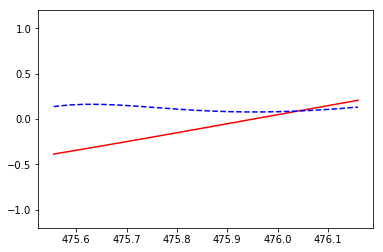

   [[476.19158973 476.22342072 476.25525171 476.2870827  476.31891369
  476.35074467 476.38257566 476.41440665 476.44623764 476.47806863
  476.50989962 476.54173061 476.57356159 476.60539258 476.63722357
  476.66905456 476.70088555 476.73271654 476.76454753 476.79637851]
 [476.8282095  476.86004049 476.89187148 476.92370247 476.95553346
  476.98736445 477.01919544 477.05102642 477.08285741 477.1146884
  477.14651939 477.17835038 477.21018137 477.24201236 477.27384334
  477.30567433 477.33750532 477.36933631 477.4011673  477.43299829]
 [477.46482928 477.49666026 477.52849125 477.56032224 477.59215323
  477.62398422 477.65581521 477.6876462  477.71947718 477.75130817
  477.78313916 477.81497015 477.84680114 477.87863213 477.91046312
  477.9422941  477.97412509 478.00595608 478.03778707 478.06961806]
 [478.10144905 478.13328004 478.16511103 478.19694201 478.228773
  478.26060399 478.29243498 478.32426597 478.35609696 478.38792795
  478.41975893 478.45158992 478.48342091 478.5152519  478.5

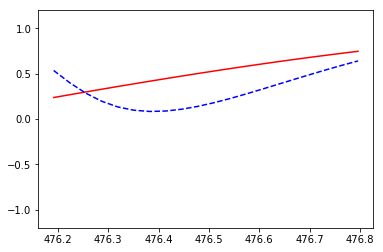

   [[476.8282095  476.86004049 476.89187148 476.92370247 476.95553346
  476.98736445 477.01919544 477.05102642 477.08285741 477.1146884
  477.14651939 477.17835038 477.21018137 477.24201236 477.27384334
  477.30567433 477.33750532 477.36933631 477.4011673  477.43299829]
 [477.46482928 477.49666026 477.52849125 477.56032224 477.59215323
  477.62398422 477.65581521 477.6876462  477.71947718 477.75130817
  477.78313916 477.81497015 477.84680114 477.87863213 477.91046312
  477.9422941  477.97412509 478.00595608 478.03778707 478.06961806]
 [478.10144905 478.13328004 478.16511103 478.19694201 478.228773
  478.26060399 478.29243498 478.32426597 478.35609696 478.38792795
  478.41975893 478.45158992 478.48342091 478.5152519  478.54708289
  478.57891388 478.61074487 478.64257585 478.67440684 478.70623783]
 [478.73806882 478.76989981 478.8017308  478.83356179 478.86539277
  478.89722376 478.92905475 478.96088574 478.99271673 479.02454772
  479.05637871 479.0882097  479.12004068 479.15187167 479.1

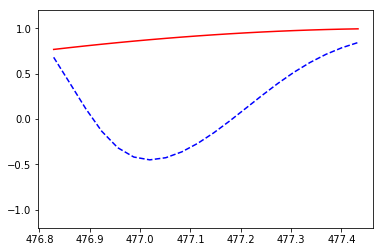

   [[477.46482928 477.49666026 477.52849125 477.56032224 477.59215323
  477.62398422 477.65581521 477.6876462  477.71947718 477.75130817
  477.78313916 477.81497015 477.84680114 477.87863213 477.91046312
  477.9422941  477.97412509 478.00595608 478.03778707 478.06961806]
 [478.10144905 478.13328004 478.16511103 478.19694201 478.228773
  478.26060399 478.29243498 478.32426597 478.35609696 478.38792795
  478.41975893 478.45158992 478.48342091 478.5152519  478.54708289
  478.57891388 478.61074487 478.64257585 478.67440684 478.70623783]
 [478.73806882 478.76989981 478.8017308  478.83356179 478.86539277
  478.89722376 478.92905475 478.96088574 478.99271673 479.02454772
  479.05637871 479.0882097  479.12004068 479.15187167 479.18370266
  479.21553365 479.24736464 479.27919563 479.31102662 479.3428576 ]
 [479.37468859 479.40651958 479.43835057 479.47018156 479.50201255
  479.53384354 479.56567452 479.59750551 479.6293365  479.66116749
  479.69299848 479.72482947 479.75666046 479.78849144 479.

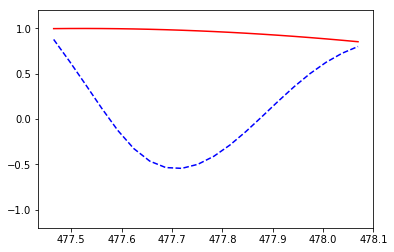

   [[478.10144905 478.13328004 478.16511103 478.19694201 478.228773
  478.26060399 478.29243498 478.32426597 478.35609696 478.38792795
  478.41975893 478.45158992 478.48342091 478.5152519  478.54708289
  478.57891388 478.61074487 478.64257585 478.67440684 478.70623783]
 [478.73806882 478.76989981 478.8017308  478.83356179 478.86539277
  478.89722376 478.92905475 478.96088574 478.99271673 479.02454772
  479.05637871 479.0882097  479.12004068 479.15187167 479.18370266
  479.21553365 479.24736464 479.27919563 479.31102662 479.3428576 ]
 [479.37468859 479.40651958 479.43835057 479.47018156 479.50201255
  479.53384354 479.56567452 479.59750551 479.6293365  479.66116749
  479.69299848 479.72482947 479.75666046 479.78849144 479.82032243
  479.85215342 479.88398441 479.9158154  479.94764639 479.97947738]
 [480.01130837 480.04313935 480.07497034 480.10680133 480.13863232
  480.17046331 480.2022943  480.23412529 480.26595627 480.29778726
  480.32961825 480.36144924 480.39328023 480.42511122 480.

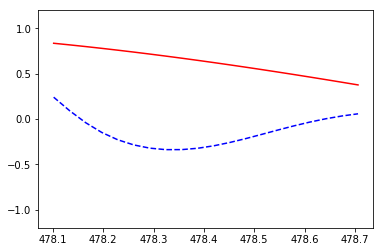

   [[478.73806882 478.76989981 478.8017308  478.83356179 478.86539277
  478.89722376 478.92905475 478.96088574 478.99271673 479.02454772
  479.05637871 479.0882097  479.12004068 479.15187167 479.18370266
  479.21553365 479.24736464 479.27919563 479.31102662 479.3428576 ]
 [479.37468859 479.40651958 479.43835057 479.47018156 479.50201255
  479.53384354 479.56567452 479.59750551 479.6293365  479.66116749
  479.69299848 479.72482947 479.75666046 479.78849144 479.82032243
  479.85215342 479.88398441 479.9158154  479.94764639 479.97947738]
 [480.01130837 480.04313935 480.07497034 480.10680133 480.13863232
  480.17046331 480.2022943  480.23412529 480.26595627 480.29778726
  480.32961825 480.36144924 480.39328023 480.42511122 480.45694221
  480.48877319 480.52060418 480.55243517 480.58426616 480.61609715]
 [480.64792814 480.67975913 480.71159011 480.7434211  480.77525209
  480.80708308 480.83891407 480.87074506 480.90257605 480.93440704
  480.96623802 480.99806901 481.0299     481.06173099 48

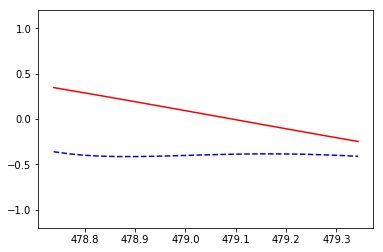

   0.020835249
   [[479.37468859 479.40651958 479.43835057 479.47018156 479.50201255
  479.53384354 479.56567452 479.59750551 479.6293365  479.66116749
  479.69299848 479.72482947 479.75666046 479.78849144 479.82032243
  479.85215342 479.88398441 479.9158154  479.94764639 479.97947738]
 [480.01130837 480.04313935 480.07497034 480.10680133 480.13863232
  480.17046331 480.2022943  480.23412529 480.26595627 480.29778726
  480.32961825 480.36144924 480.39328023 480.42511122 480.45694221
  480.48877319 480.52060418 480.55243517 480.58426616 480.61609715]
 [480.64792814 480.67975913 480.71159011 480.7434211  480.77525209
  480.80708308 480.83891407 480.87074506 480.90257605 480.93440704
  480.96623802 480.99806901 481.0299     481.06173099 481.09356198
  481.12539297 481.15722396 481.18905494 481.22088593 481.25271692]
 [481.28454791 481.3163789  481.34820989 481.38004088 481.41187186
  481.44370285 481.47553384 481.50736483 481.53919582 481.57102681
  481.6028578  481.63468878 481.66651977 

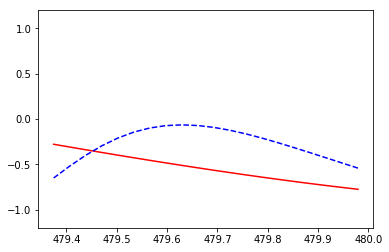

   [[480.01130837 480.04313935 480.07497034 480.10680133 480.13863232
  480.17046331 480.2022943  480.23412529 480.26595627 480.29778726
  480.32961825 480.36144924 480.39328023 480.42511122 480.45694221
  480.48877319 480.52060418 480.55243517 480.58426616 480.61609715]
 [480.64792814 480.67975913 480.71159011 480.7434211  480.77525209
  480.80708308 480.83891407 480.87074506 480.90257605 480.93440704
  480.96623802 480.99806901 481.0299     481.06173099 481.09356198
  481.12539297 481.15722396 481.18905494 481.22088593 481.25271692]
 [481.28454791 481.3163789  481.34820989 481.38004088 481.41187186
  481.44370285 481.47553384 481.50736483 481.53919582 481.57102681
  481.6028578  481.63468878 481.66651977 481.69835076 481.73018175
  481.76201274 481.79384373 481.82567472 481.85750571 481.88933669]
 [481.92116768 481.95299867 481.98482966 482.01666065 482.04849164
  482.08032263 482.11215361 482.1439846  482.17581559 482.20764658
  482.23947757 482.27130856 482.30313955 482.33497053 48

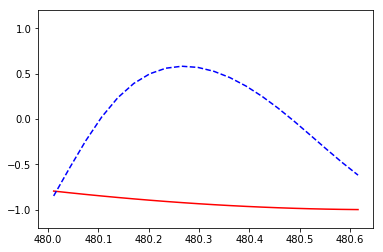

   [[480.64792814 480.67975913 480.71159011 480.7434211  480.77525209
  480.80708308 480.83891407 480.87074506 480.90257605 480.93440704
  480.96623802 480.99806901 481.0299     481.06173099 481.09356198
  481.12539297 481.15722396 481.18905494 481.22088593 481.25271692]
 [481.28454791 481.3163789  481.34820989 481.38004088 481.41187186
  481.44370285 481.47553384 481.50736483 481.53919582 481.57102681
  481.6028578  481.63468878 481.66651977 481.69835076 481.73018175
  481.76201274 481.79384373 481.82567472 481.85750571 481.88933669]
 [481.92116768 481.95299867 481.98482966 482.01666065 482.04849164
  482.08032263 482.11215361 482.1439846  482.17581559 482.20764658
  482.23947757 482.27130856 482.30313955 482.33497053 482.36680152
  482.39863251 482.4304635  482.46229449 482.49412548 482.52595647]
 [482.55778745 482.58961844 482.62144943 482.65328042 482.68511141
  482.7169424  482.74877339 482.78060437 482.81243536 482.84426635
  482.87609734 482.90792833 482.93975932 482.97159031 48

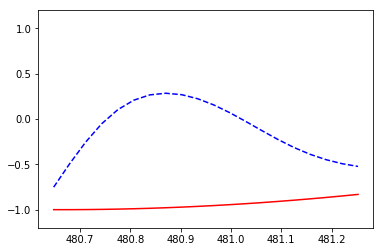

   [[481.28454791 481.3163789  481.34820989 481.38004088 481.41187186
  481.44370285 481.47553384 481.50736483 481.53919582 481.57102681
  481.6028578  481.63468878 481.66651977 481.69835076 481.73018175
  481.76201274 481.79384373 481.82567472 481.85750571 481.88933669]
 [481.92116768 481.95299867 481.98482966 482.01666065 482.04849164
  482.08032263 482.11215361 482.1439846  482.17581559 482.20764658
  482.23947757 482.27130856 482.30313955 482.33497053 482.36680152
  482.39863251 482.4304635  482.46229449 482.49412548 482.52595647]
 [482.55778745 482.58961844 482.62144943 482.65328042 482.68511141
  482.7169424  482.74877339 482.78060437 482.81243536 482.84426635
  482.87609734 482.90792833 482.93975932 482.97159031 483.0034213
  483.03525228 483.06708327 483.09891426 483.13074525 483.16257624]
 [483.19440723 483.22623822 483.2580692  483.28990019 483.32173118
  483.35356217 483.38539316 483.41722415 483.44905514 483.48088612
  483.51271711 483.5445481  483.57637909 483.60821008 483

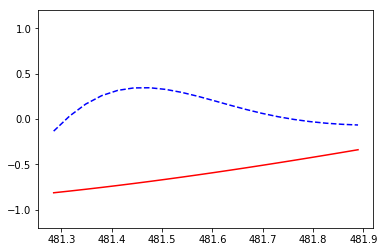

   [[481.92116768 481.95299867 481.98482966 482.01666065 482.04849164
  482.08032263 482.11215361 482.1439846  482.17581559 482.20764658
  482.23947757 482.27130856 482.30313955 482.33497053 482.36680152
  482.39863251 482.4304635  482.46229449 482.49412548 482.52595647]
 [482.55778745 482.58961844 482.62144943 482.65328042 482.68511141
  482.7169424  482.74877339 482.78060437 482.81243536 482.84426635
  482.87609734 482.90792833 482.93975932 482.97159031 483.0034213
  483.03525228 483.06708327 483.09891426 483.13074525 483.16257624]
 [483.19440723 483.22623822 483.2580692  483.28990019 483.32173118
  483.35356217 483.38539316 483.41722415 483.44905514 483.48088612
  483.51271711 483.5445481  483.57637909 483.60821008 483.64004107
  483.67187206 483.70370304 483.73553403 483.76736502 483.79919601]
 [483.831027   483.86285799 483.89468898 483.92651997 483.95835095
  483.99018194 484.02201293 484.05384392 484.08567491 484.1175059
  484.14933689 484.18116787 484.21299886 484.24482985 484.

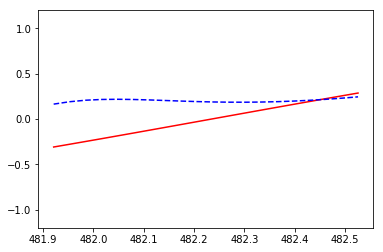

   [[482.55778745 482.58961844 482.62144943 482.65328042 482.68511141
  482.7169424  482.74877339 482.78060437 482.81243536 482.84426635
  482.87609734 482.90792833 482.93975932 482.97159031 483.0034213
  483.03525228 483.06708327 483.09891426 483.13074525 483.16257624]
 [483.19440723 483.22623822 483.2580692  483.28990019 483.32173118
  483.35356217 483.38539316 483.41722415 483.44905514 483.48088612
  483.51271711 483.5445481  483.57637909 483.60821008 483.64004107
  483.67187206 483.70370304 483.73553403 483.76736502 483.79919601]
 [483.831027   483.86285799 483.89468898 483.92651997 483.95835095
  483.99018194 484.02201293 484.05384392 484.08567491 484.1175059
  484.14933689 484.18116787 484.21299886 484.24482985 484.27666084
  484.30849183 484.34032282 484.37215381 484.40398479 484.43581578]
 [484.46764677 484.49947776 484.53130875 484.56313974 484.59497073
  484.62680171 484.6586327  484.69046369 484.72229468 484.75412567
  484.78595666 484.81778765 484.84961864 484.88144962 484.

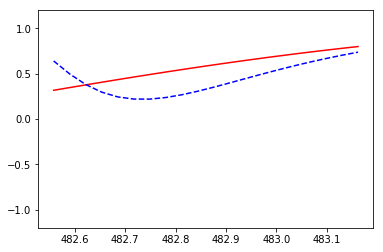

   [[483.19440723 483.22623822 483.2580692  483.28990019 483.32173118
  483.35356217 483.38539316 483.41722415 483.44905514 483.48088612
  483.51271711 483.5445481  483.57637909 483.60821008 483.64004107
  483.67187206 483.70370304 483.73553403 483.76736502 483.79919601]
 [483.831027   483.86285799 483.89468898 483.92651997 483.95835095
  483.99018194 484.02201293 484.05384392 484.08567491 484.1175059
  484.14933689 484.18116787 484.21299886 484.24482985 484.27666084
  484.30849183 484.34032282 484.37215381 484.40398479 484.43581578]
 [484.46764677 484.49947776 484.53130875 484.56313974 484.59497073
  484.62680171 484.6586327  484.69046369 484.72229468 484.75412567
  484.78595666 484.81778765 484.84961864 484.88144962 484.91328061
  484.9451116  484.97694259 485.00877358 485.04060457 485.07243556]
 [485.10426654 485.13609753 485.16792852 485.19975951 485.2315905
  485.26342149 485.29525248 485.32708346 485.35891445 485.39074544
  485.42257643 485.45440742 485.48623841 485.5180694  485.

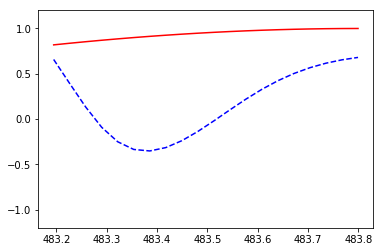

   [[483.831027   483.86285799 483.89468898 483.92651997 483.95835095
  483.99018194 484.02201293 484.05384392 484.08567491 484.1175059
  484.14933689 484.18116787 484.21299886 484.24482985 484.27666084
  484.30849183 484.34032282 484.37215381 484.40398479 484.43581578]
 [484.46764677 484.49947776 484.53130875 484.56313974 484.59497073
  484.62680171 484.6586327  484.69046369 484.72229468 484.75412567
  484.78595666 484.81778765 484.84961864 484.88144962 484.91328061
  484.9451116  484.97694259 485.00877358 485.04060457 485.07243556]
 [485.10426654 485.13609753 485.16792852 485.19975951 485.2315905
  485.26342149 485.29525248 485.32708346 485.35891445 485.39074544
  485.42257643 485.45440742 485.48623841 485.5180694  485.54990038
  485.58173137 485.61356236 485.64539335 485.67722434 485.70905533]
 [485.74088632 485.77271731 485.80454829 485.83637928 485.86821027
  485.90004126 485.93187225 485.96370324 485.99553423 486.02736521
  486.0591962  486.09102719 486.12285818 486.15468917 486.

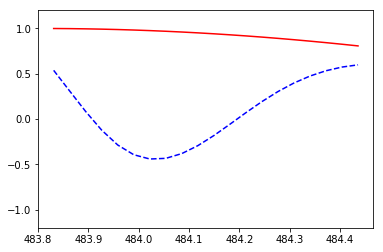

   [[484.46764677 484.49947776 484.53130875 484.56313974 484.59497073
  484.62680171 484.6586327  484.69046369 484.72229468 484.75412567
  484.78595666 484.81778765 484.84961864 484.88144962 484.91328061
  484.9451116  484.97694259 485.00877358 485.04060457 485.07243556]
 [485.10426654 485.13609753 485.16792852 485.19975951 485.2315905
  485.26342149 485.29525248 485.32708346 485.35891445 485.39074544
  485.42257643 485.45440742 485.48623841 485.5180694  485.54990038
  485.58173137 485.61356236 485.64539335 485.67722434 485.70905533]
 [485.74088632 485.77271731 485.80454829 485.83637928 485.86821027
  485.90004126 485.93187225 485.96370324 485.99553423 486.02736521
  486.0591962  486.09102719 486.12285818 486.15468917 486.18652016
  486.21835115 486.25018213 486.28201312 486.31384411 486.3456751 ]
 [486.37750609 486.40933708 486.44116807 486.47299905 486.50483004
  486.53666103 486.56849202 486.60032301 486.632154   486.66398499
  486.69581598 486.72764696 486.75947795 486.79130894 486

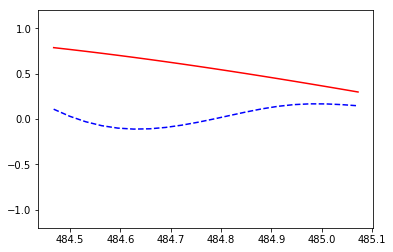

   [[485.10426654 485.13609753 485.16792852 485.19975951 485.2315905
  485.26342149 485.29525248 485.32708346 485.35891445 485.39074544
  485.42257643 485.45440742 485.48623841 485.5180694  485.54990038
  485.58173137 485.61356236 485.64539335 485.67722434 485.70905533]
 [485.74088632 485.77271731 485.80454829 485.83637928 485.86821027
  485.90004126 485.93187225 485.96370324 485.99553423 486.02736521
  486.0591962  486.09102719 486.12285818 486.15468917 486.18652016
  486.21835115 486.25018213 486.28201312 486.31384411 486.3456751 ]
 [486.37750609 486.40933708 486.44116807 486.47299905 486.50483004
  486.53666103 486.56849202 486.60032301 486.632154   486.66398499
  486.69581598 486.72764696 486.75947795 486.79130894 486.82313993
  486.85497092 486.88680191 486.9186329  486.95046388 486.98229487]
 [487.01412586 487.04595685 487.07778784 487.10961883 487.14144982
  487.1732808  487.20511179 487.23694278 487.26877377 487.30060476
  487.33243575 487.36426674 487.39609772 487.42792871 487

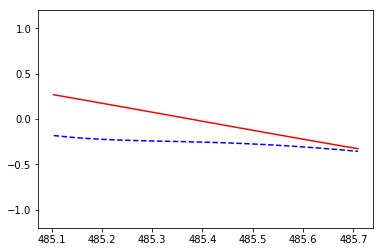

   0.017248204
   [[485.74088632 485.77271731 485.80454829 485.83637928 485.86821027
  485.90004126 485.93187225 485.96370324 485.99553423 486.02736521
  486.0591962  486.09102719 486.12285818 486.15468917 486.18652016
  486.21835115 486.25018213 486.28201312 486.31384411 486.3456751 ]
 [486.37750609 486.40933708 486.44116807 486.47299905 486.50483004
  486.53666103 486.56849202 486.60032301 486.632154   486.66398499
  486.69581598 486.72764696 486.75947795 486.79130894 486.82313993
  486.85497092 486.88680191 486.9186329  486.95046388 486.98229487]
 [487.01412586 487.04595685 487.07778784 487.10961883 487.14144982
  487.1732808  487.20511179 487.23694278 487.26877377 487.30060476
  487.33243575 487.36426674 487.39609772 487.42792871 487.4597597
  487.49159069 487.52342168 487.55525267 487.58708366 487.61891464]
 [487.65074563 487.68257662 487.71440761 487.7462386  487.77806959
  487.80990058 487.84173157 487.87356255 487.90539354 487.93722453
  487.96905552 488.00088651 488.0327175  4

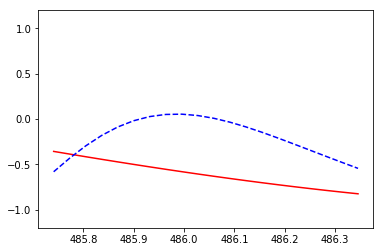

   [[486.37750609 486.40933708 486.44116807 486.47299905 486.50483004
  486.53666103 486.56849202 486.60032301 486.632154   486.66398499
  486.69581598 486.72764696 486.75947795 486.79130894 486.82313993
  486.85497092 486.88680191 486.9186329  486.95046388 486.98229487]
 [487.01412586 487.04595685 487.07778784 487.10961883 487.14144982
  487.1732808  487.20511179 487.23694278 487.26877377 487.30060476
  487.33243575 487.36426674 487.39609772 487.42792871 487.4597597
  487.49159069 487.52342168 487.55525267 487.58708366 487.61891464]
 [487.65074563 487.68257662 487.71440761 487.7462386  487.77806959
  487.80990058 487.84173157 487.87356255 487.90539354 487.93722453
  487.96905552 488.00088651 488.0327175  488.06454849 488.09637947
  488.12821046 488.16004145 488.19187244 488.22370343 488.25553442]
 [488.28736541 488.31919639 488.35102738 488.38285837 488.41468936
  488.44652035 488.47835134 488.51018233 488.54201331 488.5738443
  488.60567529 488.63750628 488.66933727 488.70116826 488.

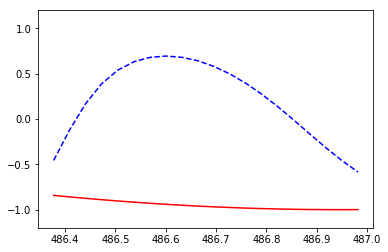

   [[487.01412586 487.04595685 487.07778784 487.10961883 487.14144982
  487.1732808  487.20511179 487.23694278 487.26877377 487.30060476
  487.33243575 487.36426674 487.39609772 487.42792871 487.4597597
  487.49159069 487.52342168 487.55525267 487.58708366 487.61891464]
 [487.65074563 487.68257662 487.71440761 487.7462386  487.77806959
  487.80990058 487.84173157 487.87356255 487.90539354 487.93722453
  487.96905552 488.00088651 488.0327175  488.06454849 488.09637947
  488.12821046 488.16004145 488.19187244 488.22370343 488.25553442]
 [488.28736541 488.31919639 488.35102738 488.38285837 488.41468936
  488.44652035 488.47835134 488.51018233 488.54201331 488.5738443
  488.60567529 488.63750628 488.66933727 488.70116826 488.73299925
  488.76483024 488.79666122 488.82849221 488.8603232  488.89215419]
 [488.92398518 488.95581617 488.98764716 489.01947814 489.05130913
  489.08314012 489.11497111 489.1468021  489.17863309 489.21046408
  489.24229506 489.27412605 489.30595704 489.33778803 489.

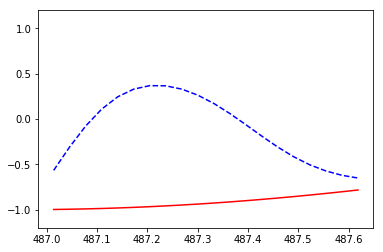

   [[487.65074563 487.68257662 487.71440761 487.7462386  487.77806959
  487.80990058 487.84173157 487.87356255 487.90539354 487.93722453
  487.96905552 488.00088651 488.0327175  488.06454849 488.09637947
  488.12821046 488.16004145 488.19187244 488.22370343 488.25553442]
 [488.28736541 488.31919639 488.35102738 488.38285837 488.41468936
  488.44652035 488.47835134 488.51018233 488.54201331 488.5738443
  488.60567529 488.63750628 488.66933727 488.70116826 488.73299925
  488.76483024 488.79666122 488.82849221 488.8603232  488.89215419]
 [488.92398518 488.95581617 488.98764716 489.01947814 489.05130913
  489.08314012 489.11497111 489.1468021  489.17863309 489.21046408
  489.24229506 489.27412605 489.30595704 489.33778803 489.36961902
  489.40145001 489.433281   489.46511198 489.49694297 489.52877396]
 [489.56060495 489.59243594 489.62426693 489.65609792 489.68792891
  489.71975989 489.75159088 489.78342187 489.81525286 489.84708385
  489.87891484 489.91074583 489.94257681 489.9744078  490

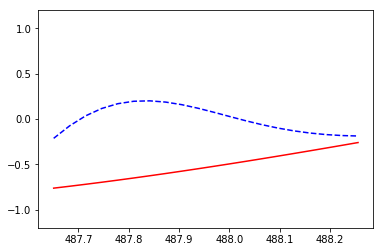

   [[488.28736541 488.31919639 488.35102738 488.38285837 488.41468936
  488.44652035 488.47835134 488.51018233 488.54201331 488.5738443
  488.60567529 488.63750628 488.66933727 488.70116826 488.73299925
  488.76483024 488.79666122 488.82849221 488.8603232  488.89215419]
 [488.92398518 488.95581617 488.98764716 489.01947814 489.05130913
  489.08314012 489.11497111 489.1468021  489.17863309 489.21046408
  489.24229506 489.27412605 489.30595704 489.33778803 489.36961902
  489.40145001 489.433281   489.46511198 489.49694297 489.52877396]
 [489.56060495 489.59243594 489.62426693 489.65609792 489.68792891
  489.71975989 489.75159088 489.78342187 489.81525286 489.84708385
  489.87891484 489.91074583 489.94257681 489.9744078  490.00623879
  490.03806978 490.06990077 490.10173176 490.13356275 490.16539373]
 [490.19722472 490.22905571 490.2608867  490.29271769 490.32454868
  490.35637967 490.38821065 490.42004164 490.45187263 490.48370362
  490.51553461 490.5473656  490.57919659 490.61102758 490

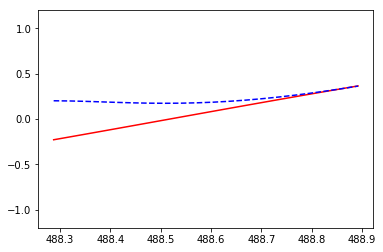

   [[488.92398518 488.95581617 488.98764716 489.01947814 489.05130913
  489.08314012 489.11497111 489.1468021  489.17863309 489.21046408
  489.24229506 489.27412605 489.30595704 489.33778803 489.36961902
  489.40145001 489.433281   489.46511198 489.49694297 489.52877396]
 [489.56060495 489.59243594 489.62426693 489.65609792 489.68792891
  489.71975989 489.75159088 489.78342187 489.81525286 489.84708385
  489.87891484 489.91074583 489.94257681 489.9744078  490.00623879
  490.03806978 490.06990077 490.10173176 490.13356275 490.16539373]
 [490.19722472 490.22905571 490.2608867  490.29271769 490.32454868
  490.35637967 490.38821065 490.42004164 490.45187263 490.48370362
  490.51553461 490.5473656  490.57919659 490.61102758 490.64285856
  490.67468955 490.70652054 490.73835153 490.77018252 490.80201351]
 [490.8338445  490.86567548 490.89750647 490.92933746 490.96116845
  490.99299944 491.02483043 491.05666142 491.0884924  491.12032339
  491.15215438 491.18398537 491.21581636 491.24764735 49

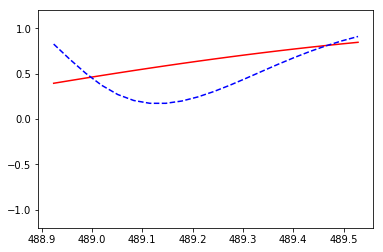

   [[489.56060495 489.59243594 489.62426693 489.65609792 489.68792891
  489.71975989 489.75159088 489.78342187 489.81525286 489.84708385
  489.87891484 489.91074583 489.94257681 489.9744078  490.00623879
  490.03806978 490.06990077 490.10173176 490.13356275 490.16539373]
 [490.19722472 490.22905571 490.2608867  490.29271769 490.32454868
  490.35637967 490.38821065 490.42004164 490.45187263 490.48370362
  490.51553461 490.5473656  490.57919659 490.61102758 490.64285856
  490.67468955 490.70652054 490.73835153 490.77018252 490.80201351]
 [490.8338445  490.86567548 490.89750647 490.92933746 490.96116845
  490.99299944 491.02483043 491.05666142 491.0884924  491.12032339
  491.15215438 491.18398537 491.21581636 491.24764735 491.27947834
  491.31130932 491.34314031 491.3749713  491.40680229 491.43863328]
 [491.47046427 491.50229526 491.53412625 491.56595723 491.59778822
  491.62961921 491.6614502  491.69328119 491.72511218 491.75694317
  491.78877415 491.82060514 491.85243613 491.88426712 49

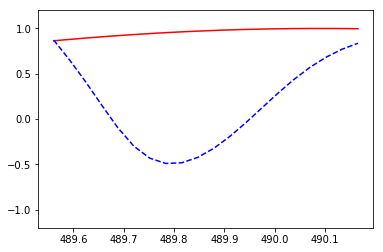

   [[490.19722472 490.22905571 490.2608867  490.29271769 490.32454868
  490.35637967 490.38821065 490.42004164 490.45187263 490.48370362
  490.51553461 490.5473656  490.57919659 490.61102758 490.64285856
  490.67468955 490.70652054 490.73835153 490.77018252 490.80201351]
 [490.8338445  490.86567548 490.89750647 490.92933746 490.96116845
  490.99299944 491.02483043 491.05666142 491.0884924  491.12032339
  491.15215438 491.18398537 491.21581636 491.24764735 491.27947834
  491.31130932 491.34314031 491.3749713  491.40680229 491.43863328]
 [491.47046427 491.50229526 491.53412625 491.56595723 491.59778822
  491.62961921 491.6614502  491.69328119 491.72511218 491.75694317
  491.78877415 491.82060514 491.85243613 491.88426712 491.91609811
  491.9479291  491.97976009 492.01159107 492.04342206 492.07525305]
 [492.10708404 492.13891503 492.17074602 492.20257701 492.23440799
  492.26623898 492.29806997 492.32990096 492.36173195 492.39356294
  492.42539393 492.45722491 492.4890559  492.52088689 49

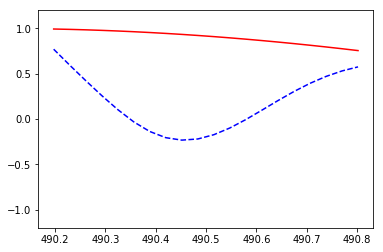

   [[490.8338445  490.86567548 490.89750647 490.92933746 490.96116845
  490.99299944 491.02483043 491.05666142 491.0884924  491.12032339
  491.15215438 491.18398537 491.21581636 491.24764735 491.27947834
  491.31130932 491.34314031 491.3749713  491.40680229 491.43863328]
 [491.47046427 491.50229526 491.53412625 491.56595723 491.59778822
  491.62961921 491.6614502  491.69328119 491.72511218 491.75694317
  491.78877415 491.82060514 491.85243613 491.88426712 491.91609811
  491.9479291  491.97976009 492.01159107 492.04342206 492.07525305]
 [492.10708404 492.13891503 492.17074602 492.20257701 492.23440799
  492.26623898 492.29806997 492.32990096 492.36173195 492.39356294
  492.42539393 492.45722491 492.4890559  492.52088689 492.55271788
  492.58454887 492.61637986 492.64821085 492.68004184 492.71187282]
 [492.74370381 492.7755348  492.80736579 492.83919678 492.87102777
  492.90285876 492.93468974 492.96652073 492.99835172 493.03018271
  493.0620137  493.09384469 493.12567568 493.15750666 49

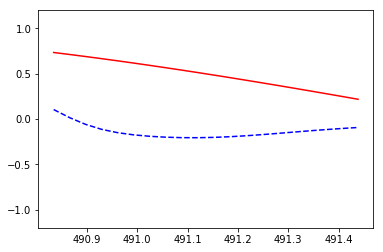

   [[491.47046427 491.50229526 491.53412625 491.56595723 491.59778822
  491.62961921 491.6614502  491.69328119 491.72511218 491.75694317
  491.78877415 491.82060514 491.85243613 491.88426712 491.91609811
  491.9479291  491.97976009 492.01159107 492.04342206 492.07525305]
 [492.10708404 492.13891503 492.17074602 492.20257701 492.23440799
  492.26623898 492.29806997 492.32990096 492.36173195 492.39356294
  492.42539393 492.45722491 492.4890559  492.52088689 492.55271788
  492.58454887 492.61637986 492.64821085 492.68004184 492.71187282]
 [492.74370381 492.7755348  492.80736579 492.83919678 492.87102777
  492.90285876 492.93468974 492.96652073 492.99835172 493.03018271
  493.0620137  493.09384469 493.12567568 493.15750666 493.18933765
  493.22116864 493.25299963 493.28483062 493.31666161 493.3484926 ]
 [493.38032358 493.41215457 493.44398556 493.47581655 493.50764754
  493.53947853 493.57130952 493.60314051 493.63497149 493.66680248
  493.69863347 493.73046446 493.76229545 493.79412644 49

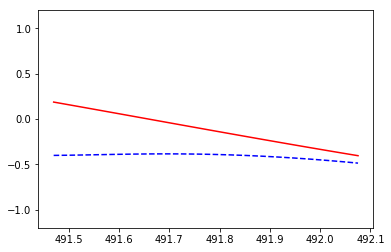

   0.011204188
   [[492.10708404 492.13891503 492.17074602 492.20257701 492.23440799
  492.26623898 492.29806997 492.32990096 492.36173195 492.39356294
  492.42539393 492.45722491 492.4890559  492.52088689 492.55271788
  492.58454887 492.61637986 492.64821085 492.68004184 492.71187282]
 [492.74370381 492.7755348  492.80736579 492.83919678 492.87102777
  492.90285876 492.93468974 492.96652073 492.99835172 493.03018271
  493.0620137  493.09384469 493.12567568 493.15750666 493.18933765
  493.22116864 493.25299963 493.28483062 493.31666161 493.3484926 ]
 [493.38032358 493.41215457 493.44398556 493.47581655 493.50764754
  493.53947853 493.57130952 493.60314051 493.63497149 493.66680248
  493.69863347 493.73046446 493.76229545 493.79412644 493.82595743
  493.85778841 493.8896194  493.92145039 493.95328138 493.98511237]
 [494.01694336 494.04877435 494.08060533 494.11243632 494.14426731
  494.1760983  494.20792929 494.23976028 494.27159127 494.30342225
  494.33525324 494.36708423 494.39891522 

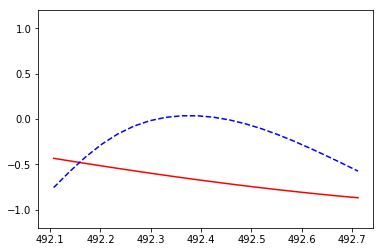

   [[492.74370381 492.7755348  492.80736579 492.83919678 492.87102777
  492.90285876 492.93468974 492.96652073 492.99835172 493.03018271
  493.0620137  493.09384469 493.12567568 493.15750666 493.18933765
  493.22116864 493.25299963 493.28483062 493.31666161 493.3484926 ]
 [493.38032358 493.41215457 493.44398556 493.47581655 493.50764754
  493.53947853 493.57130952 493.60314051 493.63497149 493.66680248
  493.69863347 493.73046446 493.76229545 493.79412644 493.82595743
  493.85778841 493.8896194  493.92145039 493.95328138 493.98511237]
 [494.01694336 494.04877435 494.08060533 494.11243632 494.14426731
  494.1760983  494.20792929 494.23976028 494.27159127 494.30342225
  494.33525324 494.36708423 494.39891522 494.43074621 494.4625772
  494.49440819 494.52623918 494.55807016 494.58990115 494.62173214]
 [494.65356313 494.68539412 494.71722511 494.7490561  494.78088708
  494.81271807 494.84454906 494.87638005 494.90821104 494.94004203
  494.97187302 495.003704   495.03553499 495.06736598 495

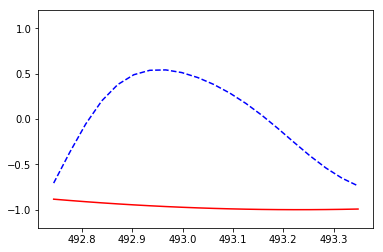

   [[493.38032358 493.41215457 493.44398556 493.47581655 493.50764754
  493.53947853 493.57130952 493.60314051 493.63497149 493.66680248
  493.69863347 493.73046446 493.76229545 493.79412644 493.82595743
  493.85778841 493.8896194  493.92145039 493.95328138 493.98511237]
 [494.01694336 494.04877435 494.08060533 494.11243632 494.14426731
  494.1760983  494.20792929 494.23976028 494.27159127 494.30342225
  494.33525324 494.36708423 494.39891522 494.43074621 494.4625772
  494.49440819 494.52623918 494.55807016 494.58990115 494.62173214]
 [494.65356313 494.68539412 494.71722511 494.7490561  494.78088708
  494.81271807 494.84454906 494.87638005 494.90821104 494.94004203
  494.97187302 495.003704   495.03553499 495.06736598 495.09919697
  495.13102796 495.16285895 495.19468994 495.22652092 495.25835191]
 [495.2901829  495.32201389 495.35384488 495.38567587 495.41750686
  495.44933785 495.48116883 495.51299982 495.54483081 495.5766618
  495.60849279 495.64032378 495.67215477 495.70398575 495.

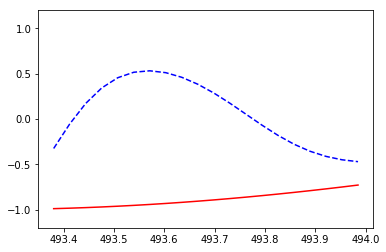

   [[494.01694336 494.04877435 494.08060533 494.11243632 494.14426731
  494.1760983  494.20792929 494.23976028 494.27159127 494.30342225
  494.33525324 494.36708423 494.39891522 494.43074621 494.4625772
  494.49440819 494.52623918 494.55807016 494.58990115 494.62173214]
 [494.65356313 494.68539412 494.71722511 494.7490561  494.78088708
  494.81271807 494.84454906 494.87638005 494.90821104 494.94004203
  494.97187302 495.003704   495.03553499 495.06736598 495.09919697
  495.13102796 495.16285895 495.19468994 495.22652092 495.25835191]
 [495.2901829  495.32201389 495.35384488 495.38567587 495.41750686
  495.44933785 495.48116883 495.51299982 495.54483081 495.5766618
  495.60849279 495.64032378 495.67215477 495.70398575 495.73581674
  495.76764773 495.79947872 495.83130971 495.8631407  495.89497169]
 [495.92680267 495.95863366 495.99046465 496.02229564 496.05412663
  496.08595762 496.11778861 496.14961959 496.18145058 496.21328157
  496.24511256 496.27694355 496.30877454 496.34060553 496.

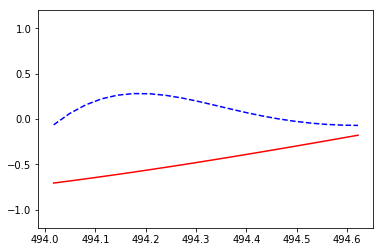

   [[494.65356313 494.68539412 494.71722511 494.7490561  494.78088708
  494.81271807 494.84454906 494.87638005 494.90821104 494.94004203
  494.97187302 495.003704   495.03553499 495.06736598 495.09919697
  495.13102796 495.16285895 495.19468994 495.22652092 495.25835191]
 [495.2901829  495.32201389 495.35384488 495.38567587 495.41750686
  495.44933785 495.48116883 495.51299982 495.54483081 495.5766618
  495.60849279 495.64032378 495.67215477 495.70398575 495.73581674
  495.76764773 495.79947872 495.83130971 495.8631407  495.89497169]
 [495.92680267 495.95863366 495.99046465 496.02229564 496.05412663
  496.08595762 496.11778861 496.14961959 496.18145058 496.21328157
  496.24511256 496.27694355 496.30877454 496.34060553 496.37243652
  496.4042675  496.43609849 496.46792948 496.49976047 496.53159146]
 [496.56342245 496.59525344 496.62708442 496.65891541 496.6907464
  496.72257739 496.75440838 496.78623937 496.81807036 496.84990134
  496.88173233 496.91356332 496.94539431 496.9772253  497.

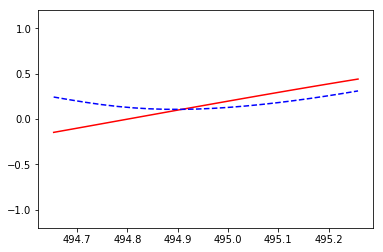

   [[495.2901829  495.32201389 495.35384488 495.38567587 495.41750686
  495.44933785 495.48116883 495.51299982 495.54483081 495.5766618
  495.60849279 495.64032378 495.67215477 495.70398575 495.73581674
  495.76764773 495.79947872 495.83130971 495.8631407  495.89497169]
 [495.92680267 495.95863366 495.99046465 496.02229564 496.05412663
  496.08595762 496.11778861 496.14961959 496.18145058 496.21328157
  496.24511256 496.27694355 496.30877454 496.34060553 496.37243652
  496.4042675  496.43609849 496.46792948 496.49976047 496.53159146]
 [496.56342245 496.59525344 496.62708442 496.65891541 496.6907464
  496.72257739 496.75440838 496.78623937 496.81807036 496.84990134
  496.88173233 496.91356332 496.94539431 496.9772253  497.00905629
  497.04088728 497.07271826 497.10454925 497.13638024 497.16821123]
 [497.20004222 497.23187321 497.2637042  497.29553518 497.32736617
  497.35919716 497.39102815 497.42285914 497.45469013 497.48652112
  497.51835211 497.55018309 497.58201408 497.61384507 497.

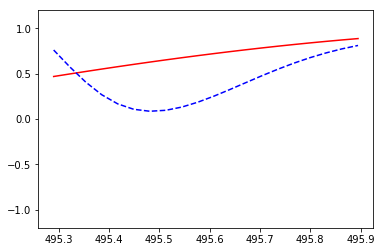

   [[495.92680267 495.95863366 495.99046465 496.02229564 496.05412663
  496.08595762 496.11778861 496.14961959 496.18145058 496.21328157
  496.24511256 496.27694355 496.30877454 496.34060553 496.37243652
  496.4042675  496.43609849 496.46792948 496.49976047 496.53159146]
 [496.56342245 496.59525344 496.62708442 496.65891541 496.6907464
  496.72257739 496.75440838 496.78623937 496.81807036 496.84990134
  496.88173233 496.91356332 496.94539431 496.9772253  497.00905629
  497.04088728 497.07271826 497.10454925 497.13638024 497.16821123]
 [497.20004222 497.23187321 497.2637042  497.29553518 497.32736617
  497.35919716 497.39102815 497.42285914 497.45469013 497.48652112
  497.51835211 497.55018309 497.58201408 497.61384507 497.64567606
  497.67750705 497.70933804 497.74116903 497.77300001 497.804831  ]
 [497.83666199 497.86849298 497.90032397 497.93215496 497.96398595
  497.99581693 498.02764792 498.05947891 498.0913099  498.12314089
  498.15497188 498.18680287 498.21863385 498.25046484 498

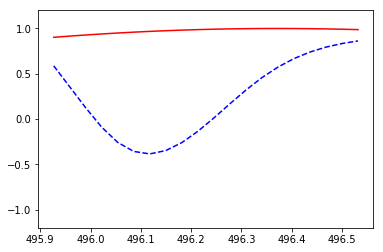

   [[496.56342245 496.59525344 496.62708442 496.65891541 496.6907464
  496.72257739 496.75440838 496.78623937 496.81807036 496.84990134
  496.88173233 496.91356332 496.94539431 496.9772253  497.00905629
  497.04088728 497.07271826 497.10454925 497.13638024 497.16821123]
 [497.20004222 497.23187321 497.2637042  497.29553518 497.32736617
  497.35919716 497.39102815 497.42285914 497.45469013 497.48652112
  497.51835211 497.55018309 497.58201408 497.61384507 497.64567606
  497.67750705 497.70933804 497.74116903 497.77300001 497.804831  ]
 [497.83666199 497.86849298 497.90032397 497.93215496 497.96398595
  497.99581693 498.02764792 498.05947891 498.0913099  498.12314089
  498.15497188 498.18680287 498.21863385 498.25046484 498.28229583
  498.31412682 498.34595781 498.3777888  498.40961979 498.44145078]
 [498.47328176 498.50511275 498.53694374 498.56877473 498.60060572
  498.63243671 498.6642677  498.69609868 498.72792967 498.75976066
  498.79159165 498.82342264 498.85525363 498.88708462 498

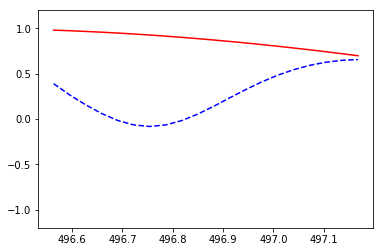

   [[497.20004222 497.23187321 497.2637042  497.29553518 497.32736617
  497.35919716 497.39102815 497.42285914 497.45469013 497.48652112
  497.51835211 497.55018309 497.58201408 497.61384507 497.64567606
  497.67750705 497.70933804 497.74116903 497.77300001 497.804831  ]
 [497.83666199 497.86849298 497.90032397 497.93215496 497.96398595
  497.99581693 498.02764792 498.05947891 498.0913099  498.12314089
  498.15497188 498.18680287 498.21863385 498.25046484 498.28229583
  498.31412682 498.34595781 498.3777888  498.40961979 498.44145078]
 [498.47328176 498.50511275 498.53694374 498.56877473 498.60060572
  498.63243671 498.6642677  498.69609868 498.72792967 498.75976066
  498.79159165 498.82342264 498.85525363 498.88708462 498.9189156
  498.95074659 498.98257758 499.01440857 499.04623956 499.07807055]
 [499.10990154 499.14173252 499.17356351 499.2053945  499.23722549
  499.26905648 499.30088747 499.33271846 499.36454945 499.39638043
  499.42821142 499.46004241 499.4918734  499.52370439 499

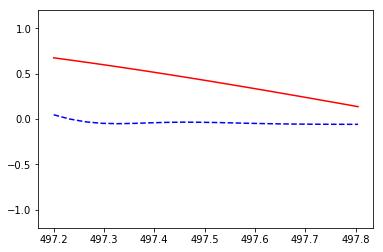

   [[497.83666199 497.86849298 497.90032397 497.93215496 497.96398595
  497.99581693 498.02764792 498.05947891 498.0913099  498.12314089
  498.15497188 498.18680287 498.21863385 498.25046484 498.28229583
  498.31412682 498.34595781 498.3777888  498.40961979 498.44145078]
 [498.47328176 498.50511275 498.53694374 498.56877473 498.60060572
  498.63243671 498.6642677  498.69609868 498.72792967 498.75976066
  498.79159165 498.82342264 498.85525363 498.88708462 498.9189156
  498.95074659 498.98257758 499.01440857 499.04623956 499.07807055]
 [499.10990154 499.14173252 499.17356351 499.2053945  499.23722549
  499.26905648 499.30088747 499.33271846 499.36454945 499.39638043
  499.42821142 499.46004241 499.4918734  499.52370439 499.55553538
  499.58736637 499.61919735 499.65102834 499.68285933 499.71469032]
 [499.74652131 499.7783523  499.81018329 499.84201427 499.87384526
  499.90567625 499.93750724 499.96933823 500.00116922 500.03300021
  500.06483119 500.09666218 500.12849317 500.16032416 500

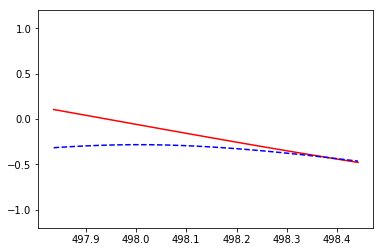

   0.01023547
   [[498.47328176 498.50511275 498.53694374 498.56877473 498.60060572
  498.63243671 498.6642677  498.69609868 498.72792967 498.75976066
  498.79159165 498.82342264 498.85525363 498.88708462 498.9189156
  498.95074659 498.98257758 499.01440857 499.04623956 499.07807055]
 [499.10990154 499.14173252 499.17356351 499.2053945  499.23722549
  499.26905648 499.30088747 499.33271846 499.36454945 499.39638043
  499.42821142 499.46004241 499.4918734  499.52370439 499.55553538
  499.58736637 499.61919735 499.65102834 499.68285933 499.71469032]
 [499.74652131 499.7783523  499.81018329 499.84201427 499.87384526
  499.90567625 499.93750724 499.96933823 500.00116922 500.03300021
  500.06483119 500.09666218 500.12849317 500.16032416 500.19215515
  500.22398614 500.25581713 500.28764812 500.3194791  500.35131009]
 [500.38314108 500.41497207 500.44680306 500.47863405 500.51046504
  500.54229602 500.57412701 500.605958   500.63778899 500.66961998
  500.70145097 500.73328196 500.76511294 50

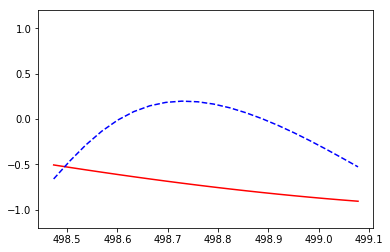

   [[499.10990154 499.14173252 499.17356351 499.2053945  499.23722549
  499.26905648 499.30088747 499.33271846 499.36454945 499.39638043
  499.42821142 499.46004241 499.4918734  499.52370439 499.55553538
  499.58736637 499.61919735 499.65102834 499.68285933 499.71469032]
 [499.74652131 499.7783523  499.81018329 499.84201427 499.87384526
  499.90567625 499.93750724 499.96933823 500.00116922 500.03300021
  500.06483119 500.09666218 500.12849317 500.16032416 500.19215515
  500.22398614 500.25581713 500.28764812 500.3194791  500.35131009]
 [500.38314108 500.41497207 500.44680306 500.47863405 500.51046504
  500.54229602 500.57412701 500.605958   500.63778899 500.66961998
  500.70145097 500.73328196 500.76511294 500.79694393 500.82877492
  500.86060591 500.8924369  500.92426789 500.95609888 500.98792986]
 [501.01976085 501.05159184 501.08342283 501.11525382 501.14708481
  501.1789158  501.21074678 501.24257777 501.27440876 501.30623975
  501.33807074 501.36990173 501.40173272 501.43356371 50

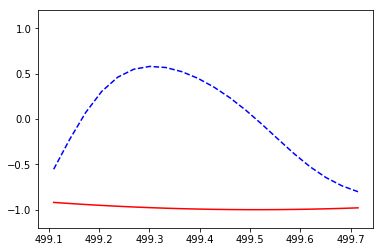

   [[499.74652131 499.7783523  499.81018329 499.84201427 499.87384526
  499.90567625 499.93750724 499.96933823 500.00116922 500.03300021
  500.06483119 500.09666218 500.12849317 500.16032416 500.19215515
  500.22398614 500.25581713 500.28764812 500.3194791  500.35131009]
 [500.38314108 500.41497207 500.44680306 500.47863405 500.51046504
  500.54229602 500.57412701 500.605958   500.63778899 500.66961998
  500.70145097 500.73328196 500.76511294 500.79694393 500.82877492
  500.86060591 500.8924369  500.92426789 500.95609888 500.98792986]
 [501.01976085 501.05159184 501.08342283 501.11525382 501.14708481
  501.1789158  501.21074678 501.24257777 501.27440876 501.30623975
  501.33807074 501.36990173 501.40173272 501.43356371 501.46539469
  501.49722568 501.52905667 501.56088766 501.59271865 501.62454964]
 [501.65638063 501.68821161 501.7200426  501.75187359 501.78370458
  501.81553557 501.84736656 501.87919755 501.91102853 501.94285952
  501.97469051 502.0065215  502.03835249 502.07018348 50

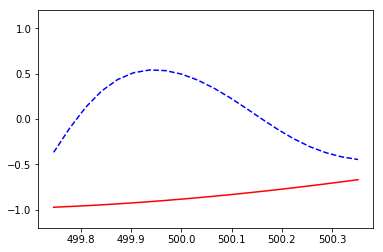

   [[500.38314108 500.41497207 500.44680306 500.47863405 500.51046504
  500.54229602 500.57412701 500.605958   500.63778899 500.66961998
  500.70145097 500.73328196 500.76511294 500.79694393 500.82877492
  500.86060591 500.8924369  500.92426789 500.95609888 500.98792986]
 [501.01976085 501.05159184 501.08342283 501.11525382 501.14708481
  501.1789158  501.21074678 501.24257777 501.27440876 501.30623975
  501.33807074 501.36990173 501.40173272 501.43356371 501.46539469
  501.49722568 501.52905667 501.56088766 501.59271865 501.62454964]
 [501.65638063 501.68821161 501.7200426  501.75187359 501.78370458
  501.81553557 501.84736656 501.87919755 501.91102853 501.94285952
  501.97469051 502.0065215  502.03835249 502.07018348 502.10201447
  502.13384545 502.16567644 502.19750743 502.22933842 502.26116941]
 [502.2930004  502.32483139 502.35666238 502.38849336 502.42032435
  502.45215534 502.48398633 502.51581732 502.54764831 502.5794793
  502.61131028 502.64314127 502.67497226 502.70680325 502

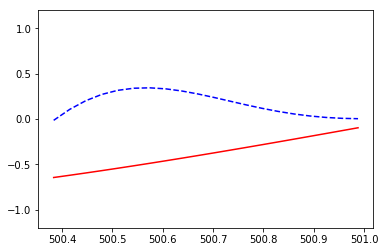

   [[501.01976085 501.05159184 501.08342283 501.11525382 501.14708481
  501.1789158  501.21074678 501.24257777 501.27440876 501.30623975
  501.33807074 501.36990173 501.40173272 501.43356371 501.46539469
  501.49722568 501.52905667 501.56088766 501.59271865 501.62454964]
 [501.65638063 501.68821161 501.7200426  501.75187359 501.78370458
  501.81553557 501.84736656 501.87919755 501.91102853 501.94285952
  501.97469051 502.0065215  502.03835249 502.07018348 502.10201447
  502.13384545 502.16567644 502.19750743 502.22933842 502.26116941]
 [502.2930004  502.32483139 502.35666238 502.38849336 502.42032435
  502.45215534 502.48398633 502.51581732 502.54764831 502.5794793
  502.61131028 502.64314127 502.67497226 502.70680325 502.73863424
  502.77046523 502.80229622 502.8341272  502.86595819 502.89778918]
 [502.92962017 502.96145116 502.99328215 503.02511314 503.05694412
  503.08877511 503.1206061  503.15243709 503.18426808 503.21609907
  503.24793006 503.27976105 503.31159203 503.34342302 503

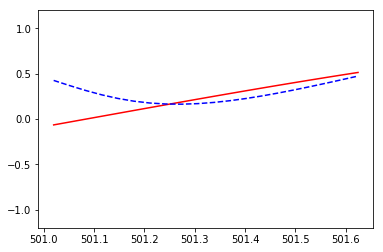

   [[501.65638063 501.68821161 501.7200426  501.75187359 501.78370458
  501.81553557 501.84736656 501.87919755 501.91102853 501.94285952
  501.97469051 502.0065215  502.03835249 502.07018348 502.10201447
  502.13384545 502.16567644 502.19750743 502.22933842 502.26116941]
 [502.2930004  502.32483139 502.35666238 502.38849336 502.42032435
  502.45215534 502.48398633 502.51581732 502.54764831 502.5794793
  502.61131028 502.64314127 502.67497226 502.70680325 502.73863424
  502.77046523 502.80229622 502.8341272  502.86595819 502.89778918]
 [502.92962017 502.96145116 502.99328215 503.02511314 503.05694412
  503.08877511 503.1206061  503.15243709 503.18426808 503.21609907
  503.24793006 503.27976105 503.31159203 503.34342302 503.37525401
  503.407085   503.43891599 503.47074698 503.50257797 503.53440895]
 [503.56623994 503.59807093 503.62990192 503.66173291 503.6935639
  503.72539489 503.75722587 503.78905686 503.82088785 503.85271884
  503.88454983 503.91638082 503.94821181 503.98004279 504.

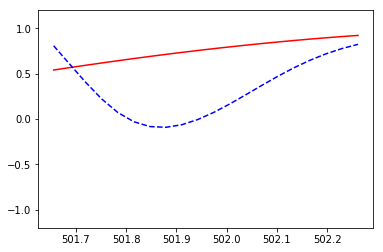

   [[502.2930004  502.32483139 502.35666238 502.38849336 502.42032435
  502.45215534 502.48398633 502.51581732 502.54764831 502.5794793
  502.61131028 502.64314127 502.67497226 502.70680325 502.73863424
  502.77046523 502.80229622 502.8341272  502.86595819 502.89778918]
 [502.92962017 502.96145116 502.99328215 503.02511314 503.05694412
  503.08877511 503.1206061  503.15243709 503.18426808 503.21609907
  503.24793006 503.27976105 503.31159203 503.34342302 503.37525401
  503.407085   503.43891599 503.47074698 503.50257797 503.53440895]
 [503.56623994 503.59807093 503.62990192 503.66173291 503.6935639
  503.72539489 503.75722587 503.78905686 503.82088785 503.85271884
  503.88454983 503.91638082 503.94821181 503.98004279 504.01187378
  504.04370477 504.07553576 504.10736675 504.13919774 504.17102873]
 [504.20285972 504.2346907  504.26652169 504.29835268 504.33018367
  504.36201466 504.39384565 504.42567664 504.45750762 504.48933861
  504.5211696  504.55300059 504.58483158 504.61666257 504.

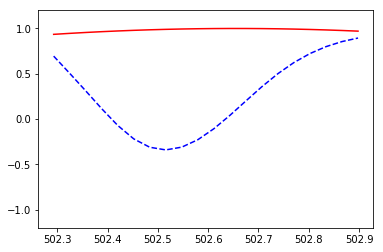

   [[502.92962017 502.96145116 502.99328215 503.02511314 503.05694412
  503.08877511 503.1206061  503.15243709 503.18426808 503.21609907
  503.24793006 503.27976105 503.31159203 503.34342302 503.37525401
  503.407085   503.43891599 503.47074698 503.50257797 503.53440895]
 [503.56623994 503.59807093 503.62990192 503.66173291 503.6935639
  503.72539489 503.75722587 503.78905686 503.82088785 503.85271884
  503.88454983 503.91638082 503.94821181 503.98004279 504.01187378
  504.04370477 504.07553576 504.10736675 504.13919774 504.17102873]
 [504.20285972 504.2346907  504.26652169 504.29835268 504.33018367
  504.36201466 504.39384565 504.42567664 504.45750762 504.48933861
  504.5211696  504.55300059 504.58483158 504.61666257 504.64849356
  504.68032454 504.71215553 504.74398652 504.77581751 504.8076485 ]
 [504.83947949 504.87131048 504.90314146 504.93497245 504.96680344
  504.99863443 505.03046542 505.06229641 505.0941274  505.12595839
  505.15778937 505.18962036 505.22145135 505.25328234 505

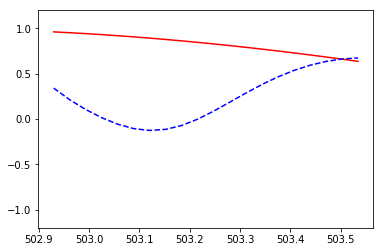

   [[503.56623994 503.59807093 503.62990192 503.66173291 503.6935639
  503.72539489 503.75722587 503.78905686 503.82088785 503.85271884
  503.88454983 503.91638082 503.94821181 503.98004279 504.01187378
  504.04370477 504.07553576 504.10736675 504.13919774 504.17102873]
 [504.20285972 504.2346907  504.26652169 504.29835268 504.33018367
  504.36201466 504.39384565 504.42567664 504.45750762 504.48933861
  504.5211696  504.55300059 504.58483158 504.61666257 504.64849356
  504.68032454 504.71215553 504.74398652 504.77581751 504.8076485 ]
 [504.83947949 504.87131048 504.90314146 504.93497245 504.96680344
  504.99863443 505.03046542 505.06229641 505.0941274  505.12595839
  505.15778937 505.18962036 505.22145135 505.25328234 505.28511333
  505.31694432 505.34877531 505.38060629 505.41243728 505.44426827]
 [505.47609926 505.50793025 505.53976124 505.57159223 505.60342321
  505.6352542  505.66708519 505.69891618 505.73074717 505.76257816
  505.79440915 505.82624013 505.85807112 505.88990211 505

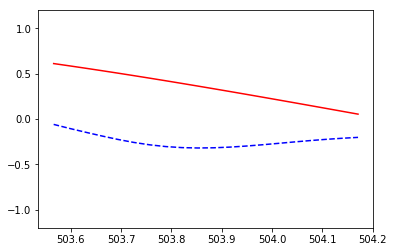

   [[504.20285972 504.2346907  504.26652169 504.29835268 504.33018367
  504.36201466 504.39384565 504.42567664 504.45750762 504.48933861
  504.5211696  504.55300059 504.58483158 504.61666257 504.64849356
  504.68032454 504.71215553 504.74398652 504.77581751 504.8076485 ]
 [504.83947949 504.87131048 504.90314146 504.93497245 504.96680344
  504.99863443 505.03046542 505.06229641 505.0941274  505.12595839
  505.15778937 505.18962036 505.22145135 505.25328234 505.28511333
  505.31694432 505.34877531 505.38060629 505.41243728 505.44426827]
 [505.47609926 505.50793025 505.53976124 505.57159223 505.60342321
  505.6352542  505.66708519 505.69891618 505.73074717 505.76257816
  505.79440915 505.82624013 505.85807112 505.88990211 505.9217331
  505.95356409 505.98539508 506.01722607 506.04905705 506.08088804]
 [506.11271903 506.14455002 506.17638101 506.208212   506.24004299
  506.27187398 506.30370496 506.33553595 506.36736694 506.39919793
  506.43102892 506.46285991 506.4946909  506.52652188 506

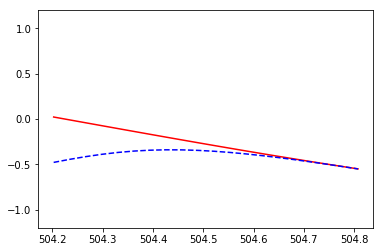

   0.008605147
   [[504.83947949 504.87131048 504.90314146 504.93497245 504.96680344
  504.99863443 505.03046542 505.06229641 505.0941274  505.12595839
  505.15778937 505.18962036 505.22145135 505.25328234 505.28511333
  505.31694432 505.34877531 505.38060629 505.41243728 505.44426827]
 [505.47609926 505.50793025 505.53976124 505.57159223 505.60342321
  505.6352542  505.66708519 505.69891618 505.73074717 505.76257816
  505.79440915 505.82624013 505.85807112 505.88990211 505.9217331
  505.95356409 505.98539508 506.01722607 506.04905705 506.08088804]
 [506.11271903 506.14455002 506.17638101 506.208212   506.24004299
  506.27187398 506.30370496 506.33553595 506.36736694 506.39919793
  506.43102892 506.46285991 506.4946909  506.52652188 506.55835287
  506.59018386 506.62201485 506.65384584 506.68567683 506.71750782]
 [506.7493388  506.78116979 506.81300078 506.84483177 506.87666276
  506.90849375 506.94032474 506.97215572 507.00398671 507.0358177
  507.06764869 507.09947968 507.13131067 50

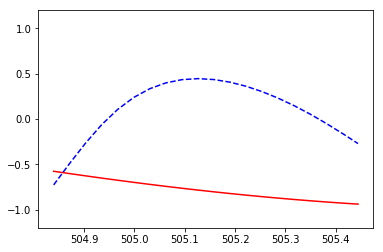

   [[505.47609926 505.50793025 505.53976124 505.57159223 505.60342321
  505.6352542  505.66708519 505.69891618 505.73074717 505.76257816
  505.79440915 505.82624013 505.85807112 505.88990211 505.9217331
  505.95356409 505.98539508 506.01722607 506.04905705 506.08088804]
 [506.11271903 506.14455002 506.17638101 506.208212   506.24004299
  506.27187398 506.30370496 506.33553595 506.36736694 506.39919793
  506.43102892 506.46285991 506.4946909  506.52652188 506.55835287
  506.59018386 506.62201485 506.65384584 506.68567683 506.71750782]
 [506.7493388  506.78116979 506.81300078 506.84483177 506.87666276
  506.90849375 506.94032474 506.97215572 507.00398671 507.0358177
  507.06764869 507.09947968 507.13131067 507.16314166 507.19497265
  507.22680363 507.25863462 507.29046561 507.3222966  507.35412759]
 [507.38595858 507.41778957 507.44962055 507.48145154 507.51328253
  507.54511352 507.57694451 507.6087755  507.64060649 507.67243747
  507.70426846 507.73609945 507.76793044 507.79976143 507.

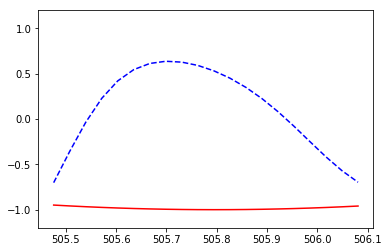

   [[506.11271903 506.14455002 506.17638101 506.208212   506.24004299
  506.27187398 506.30370496 506.33553595 506.36736694 506.39919793
  506.43102892 506.46285991 506.4946909  506.52652188 506.55835287
  506.59018386 506.62201485 506.65384584 506.68567683 506.71750782]
 [506.7493388  506.78116979 506.81300078 506.84483177 506.87666276
  506.90849375 506.94032474 506.97215572 507.00398671 507.0358177
  507.06764869 507.09947968 507.13131067 507.16314166 507.19497265
  507.22680363 507.25863462 507.29046561 507.3222966  507.35412759]
 [507.38595858 507.41778957 507.44962055 507.48145154 507.51328253
  507.54511352 507.57694451 507.6087755  507.64060649 507.67243747
  507.70426846 507.73609945 507.76793044 507.79976143 507.83159242
  507.86342341 507.89525439 507.92708538 507.95891637 507.99074736]
 [508.02257835 508.05440934 508.08624033 508.11807132 508.1499023
  508.18173329 508.21356428 508.24539527 508.27722626 508.30905725
  508.34088824 508.37271922 508.40455021 508.4363812  508.

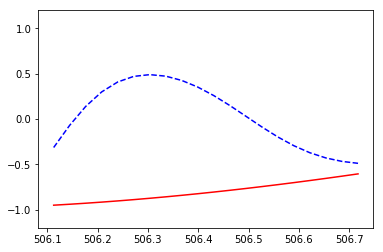

   [[506.7493388  506.78116979 506.81300078 506.84483177 506.87666276
  506.90849375 506.94032474 506.97215572 507.00398671 507.0358177
  507.06764869 507.09947968 507.13131067 507.16314166 507.19497265
  507.22680363 507.25863462 507.29046561 507.3222966  507.35412759]
 [507.38595858 507.41778957 507.44962055 507.48145154 507.51328253
  507.54511352 507.57694451 507.6087755  507.64060649 507.67243747
  507.70426846 507.73609945 507.76793044 507.79976143 507.83159242
  507.86342341 507.89525439 507.92708538 507.95891637 507.99074736]
 [508.02257835 508.05440934 508.08624033 508.11807132 508.1499023
  508.18173329 508.21356428 508.24539527 508.27722626 508.30905725
  508.34088824 508.37271922 508.40455021 508.4363812  508.46821219
  508.50004318 508.53187417 508.56370516 508.59553614 508.62736713]
 [508.65919812 508.69102911 508.7228601  508.75469109 508.78652208
  508.81835306 508.85018405 508.88201504 508.91384603 508.94567702
  508.97750801 509.009339   509.04116999 509.07300097 509.

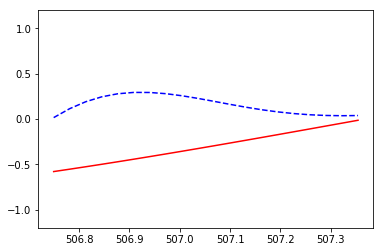

   [[507.38595858 507.41778957 507.44962055 507.48145154 507.51328253
  507.54511352 507.57694451 507.6087755  507.64060649 507.67243747
  507.70426846 507.73609945 507.76793044 507.79976143 507.83159242
  507.86342341 507.89525439 507.92708538 507.95891637 507.99074736]
 [508.02257835 508.05440934 508.08624033 508.11807132 508.1499023
  508.18173329 508.21356428 508.24539527 508.27722626 508.30905725
  508.34088824 508.37271922 508.40455021 508.4363812  508.46821219
  508.50004318 508.53187417 508.56370516 508.59553614 508.62736713]
 [508.65919812 508.69102911 508.7228601  508.75469109 508.78652208
  508.81835306 508.85018405 508.88201504 508.91384603 508.94567702
  508.97750801 509.009339   509.04116999 509.07300097 509.10483196
  509.13666295 509.16849394 509.20032493 509.23215592 509.26398691]
 [509.29581789 509.32764888 509.35947987 509.39131086 509.42314185
  509.45497284 509.48680383 509.51863481 509.5504658  509.58229679
  509.61412778 509.64595877 509.67778976 509.70962075 509

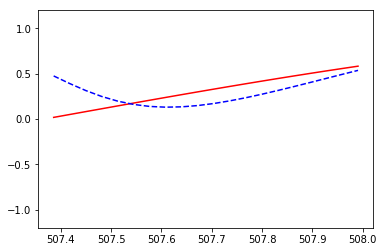

   [[508.02257835 508.05440934 508.08624033 508.11807132 508.1499023
  508.18173329 508.21356428 508.24539527 508.27722626 508.30905725
  508.34088824 508.37271922 508.40455021 508.4363812  508.46821219
  508.50004318 508.53187417 508.56370516 508.59553614 508.62736713]
 [508.65919812 508.69102911 508.7228601  508.75469109 508.78652208
  508.81835306 508.85018405 508.88201504 508.91384603 508.94567702
  508.97750801 509.009339   509.04116999 509.07300097 509.10483196
  509.13666295 509.16849394 509.20032493 509.23215592 509.26398691]
 [509.29581789 509.32764888 509.35947987 509.39131086 509.42314185
  509.45497284 509.48680383 509.51863481 509.5504658  509.58229679
  509.61412778 509.64595877 509.67778976 509.70962075 509.74145173
  509.77328272 509.80511371 509.8369447  509.86877569 509.90060668]
 [509.93243767 509.96426866 509.99609964 510.02793063 510.05976162
  510.09159261 510.1234236  510.15525459 510.18708558 510.21891656
  510.25074755 510.28257854 510.31440953 510.34624052 510

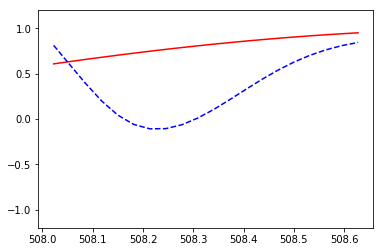

   [[508.65919812 508.69102911 508.7228601  508.75469109 508.78652208
  508.81835306 508.85018405 508.88201504 508.91384603 508.94567702
  508.97750801 509.009339   509.04116999 509.07300097 509.10483196
  509.13666295 509.16849394 509.20032493 509.23215592 509.26398691]
 [509.29581789 509.32764888 509.35947987 509.39131086 509.42314185
  509.45497284 509.48680383 509.51863481 509.5504658  509.58229679
  509.61412778 509.64595877 509.67778976 509.70962075 509.74145173
  509.77328272 509.80511371 509.8369447  509.86877569 509.90060668]
 [509.93243767 509.96426866 509.99609964 510.02793063 510.05976162
  510.09159261 510.1234236  510.15525459 510.18708558 510.21891656
  510.25074755 510.28257854 510.31440953 510.34624052 510.37807151
  510.4099025  510.44173348 510.47356447 510.50539546 510.53722645]
 [510.56905744 510.60088843 510.63271942 510.6645504  510.69638139
  510.72821238 510.76004337 510.79187436 510.82370535 510.85553634
  510.88736732 510.91919831 510.9510293  510.98286029 51

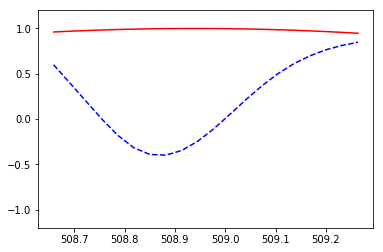

   [[509.29581789 509.32764888 509.35947987 509.39131086 509.42314185
  509.45497284 509.48680383 509.51863481 509.5504658  509.58229679
  509.61412778 509.64595877 509.67778976 509.70962075 509.74145173
  509.77328272 509.80511371 509.8369447  509.86877569 509.90060668]
 [509.93243767 509.96426866 509.99609964 510.02793063 510.05976162
  510.09159261 510.1234236  510.15525459 510.18708558 510.21891656
  510.25074755 510.28257854 510.31440953 510.34624052 510.37807151
  510.4099025  510.44173348 510.47356447 510.50539546 510.53722645]
 [510.56905744 510.60088843 510.63271942 510.6645504  510.69638139
  510.72821238 510.76004337 510.79187436 510.82370535 510.85553634
  510.88736732 510.91919831 510.9510293  510.98286029 511.01469128
  511.04652227 511.07835326 511.11018425 511.14201523 511.17384622]
 [511.20567721 511.2375082  511.26933919 511.30117018 511.33300117
  511.36483215 511.39666314 511.42849413 511.46032512 511.49215611
  511.5239871  511.55581809 511.58764907 511.61948006 51

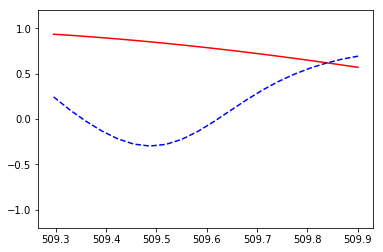

   [[509.93243767 509.96426866 509.99609964 510.02793063 510.05976162
  510.09159261 510.1234236  510.15525459 510.18708558 510.21891656
  510.25074755 510.28257854 510.31440953 510.34624052 510.37807151
  510.4099025  510.44173348 510.47356447 510.50539546 510.53722645]
 [510.56905744 510.60088843 510.63271942 510.6645504  510.69638139
  510.72821238 510.76004337 510.79187436 510.82370535 510.85553634
  510.88736732 510.91919831 510.9510293  510.98286029 511.01469128
  511.04652227 511.07835326 511.11018425 511.14201523 511.17384622]
 [511.20567721 511.2375082  511.26933919 511.30117018 511.33300117
  511.36483215 511.39666314 511.42849413 511.46032512 511.49215611
  511.5239871  511.55581809 511.58764907 511.61948006 511.65131105
  511.68314204 511.71497303 511.74680402 511.77863501 511.81046599]
 [511.84229698 511.87412797 511.90595896 511.93778995 511.96962094
  512.00145193 512.03328292 512.0651139  512.09694489 512.12877588
  512.16060687 512.19243786 512.22426885 512.25609984 51

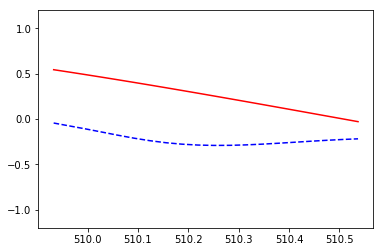

   [[510.56905744 510.60088843 510.63271942 510.6645504  510.69638139
  510.72821238 510.76004337 510.79187436 510.82370535 510.85553634
  510.88736732 510.91919831 510.9510293  510.98286029 511.01469128
  511.04652227 511.07835326 511.11018425 511.14201523 511.17384622]
 [511.20567721 511.2375082  511.26933919 511.30117018 511.33300117
  511.36483215 511.39666314 511.42849413 511.46032512 511.49215611
  511.5239871  511.55581809 511.58764907 511.61948006 511.65131105
  511.68314204 511.71497303 511.74680402 511.77863501 511.81046599]
 [511.84229698 511.87412797 511.90595896 511.93778995 511.96962094
  512.00145193 512.03328292 512.0651139  512.09694489 512.12877588
  512.16060687 512.19243786 512.22426885 512.25609984 512.28793082
  512.31976181 512.3515928  512.38342379 512.41525478 512.44708577]
 [512.47891676 512.51074774 512.54257873 512.57440972 512.60624071
  512.6380717  512.66990269 512.70173368 512.73356466 512.76539565
  512.79722664 512.82905763 512.86088862 512.89271961 51

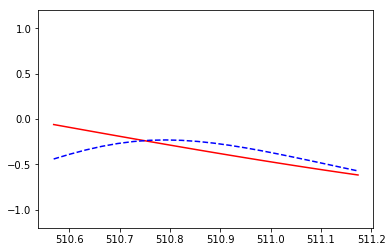

   0.008631808
   [[511.20567721 511.2375082  511.26933919 511.30117018 511.33300117
  511.36483215 511.39666314 511.42849413 511.46032512 511.49215611
  511.5239871  511.55581809 511.58764907 511.61948006 511.65131105
  511.68314204 511.71497303 511.74680402 511.77863501 511.81046599]
 [511.84229698 511.87412797 511.90595896 511.93778995 511.96962094
  512.00145193 512.03328292 512.0651139  512.09694489 512.12877588
  512.16060687 512.19243786 512.22426885 512.25609984 512.28793082
  512.31976181 512.3515928  512.38342379 512.41525478 512.44708577]
 [512.47891676 512.51074774 512.54257873 512.57440972 512.60624071
  512.6380717  512.66990269 512.70173368 512.73356466 512.76539565
  512.79722664 512.82905763 512.86088862 512.89271961 512.9245506
  512.95638159 512.98821257 513.02004356 513.05187455 513.08370554]
 [513.11553653 513.14736752 513.17919851 513.21102949 513.24286048
  513.27469147 513.30652246 513.33835345 513.37018444 513.40201543
  513.43384641 513.4656774  513.49750839 5

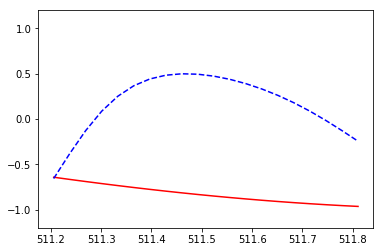

   [[511.84229698 511.87412797 511.90595896 511.93778995 511.96962094
  512.00145193 512.03328292 512.0651139  512.09694489 512.12877588
  512.16060687 512.19243786 512.22426885 512.25609984 512.28793082
  512.31976181 512.3515928  512.38342379 512.41525478 512.44708577]
 [512.47891676 512.51074774 512.54257873 512.57440972 512.60624071
  512.6380717  512.66990269 512.70173368 512.73356466 512.76539565
  512.79722664 512.82905763 512.86088862 512.89271961 512.9245506
  512.95638159 512.98821257 513.02004356 513.05187455 513.08370554]
 [513.11553653 513.14736752 513.17919851 513.21102949 513.24286048
  513.27469147 513.30652246 513.33835345 513.37018444 513.40201543
  513.43384641 513.4656774  513.49750839 513.52933938 513.56117037
  513.59300136 513.62483235 513.65666333 513.68849432 513.72032531]
 [513.7521563  513.78398729 513.81581828 513.84764927 513.87948026
  513.91131124 513.94314223 513.97497322 514.00680421 514.0386352
  514.07046619 514.10229718 514.13412816 514.16595915 514.

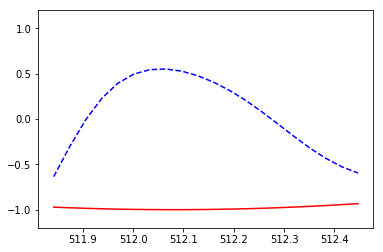

   [[512.47891676 512.51074774 512.54257873 512.57440972 512.60624071
  512.6380717  512.66990269 512.70173368 512.73356466 512.76539565
  512.79722664 512.82905763 512.86088862 512.89271961 512.9245506
  512.95638159 512.98821257 513.02004356 513.05187455 513.08370554]
 [513.11553653 513.14736752 513.17919851 513.21102949 513.24286048
  513.27469147 513.30652246 513.33835345 513.37018444 513.40201543
  513.43384641 513.4656774  513.49750839 513.52933938 513.56117037
  513.59300136 513.62483235 513.65666333 513.68849432 513.72032531]
 [513.7521563  513.78398729 513.81581828 513.84764927 513.87948026
  513.91131124 513.94314223 513.97497322 514.00680421 514.0386352
  514.07046619 514.10229718 514.13412816 514.16595915 514.19779014
  514.22962113 514.26145212 514.29328311 514.3251141  514.35694508]
 [514.38877607 514.42060706 514.45243805 514.48426904 514.51610003
  514.54793102 514.579762   514.61159299 514.64342398 514.67525497
  514.70708596 514.73891695 514.77074794 514.80257893 514.

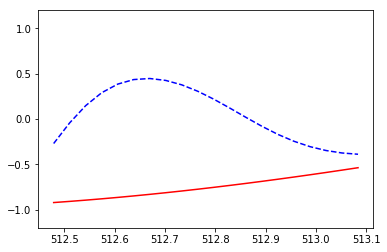

   [[513.11553653 513.14736752 513.17919851 513.21102949 513.24286048
  513.27469147 513.30652246 513.33835345 513.37018444 513.40201543
  513.43384641 513.4656774  513.49750839 513.52933938 513.56117037
  513.59300136 513.62483235 513.65666333 513.68849432 513.72032531]
 [513.7521563  513.78398729 513.81581828 513.84764927 513.87948026
  513.91131124 513.94314223 513.97497322 514.00680421 514.0386352
  514.07046619 514.10229718 514.13412816 514.16595915 514.19779014
  514.22962113 514.26145212 514.29328311 514.3251141  514.35694508]
 [514.38877607 514.42060706 514.45243805 514.48426904 514.51610003
  514.54793102 514.579762   514.61159299 514.64342398 514.67525497
  514.70708596 514.73891695 514.77074794 514.80257893 514.83440991
  514.8662409  514.89807189 514.92990288 514.96173387 514.99356486]
 [515.02539585 515.05722683 515.08905782 515.12088881 515.1527198
  515.18455079 515.21638178 515.24821277 515.28004375 515.31187474
  515.34370573 515.37553672 515.40736771 515.4391987  515.

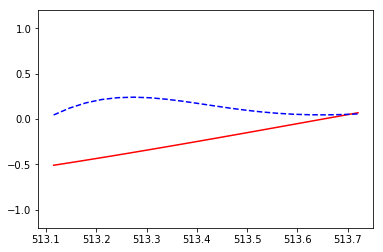

   [[513.7521563  513.78398729 513.81581828 513.84764927 513.87948026
  513.91131124 513.94314223 513.97497322 514.00680421 514.0386352
  514.07046619 514.10229718 514.13412816 514.16595915 514.19779014
  514.22962113 514.26145212 514.29328311 514.3251141  514.35694508]
 [514.38877607 514.42060706 514.45243805 514.48426904 514.51610003
  514.54793102 514.579762   514.61159299 514.64342398 514.67525497
  514.70708596 514.73891695 514.77074794 514.80257893 514.83440991
  514.8662409  514.89807189 514.92990288 514.96173387 514.99356486]
 [515.02539585 515.05722683 515.08905782 515.12088881 515.1527198
  515.18455079 515.21638178 515.24821277 515.28004375 515.31187474
  515.34370573 515.37553672 515.40736771 515.4391987  515.47102969
  515.50286067 515.53469166 515.56652265 515.59835364 515.63018463]
 [515.66201562 515.69384661 515.72567759 515.75750858 515.78933957
  515.82117056 515.85300155 515.88483254 515.91666353 515.94849452
  515.9803255  516.01215649 516.04398748 516.07581847 516.

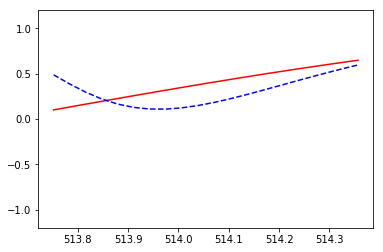

   [[514.38877607 514.42060706 514.45243805 514.48426904 514.51610003
  514.54793102 514.579762   514.61159299 514.64342398 514.67525497
  514.70708596 514.73891695 514.77074794 514.80257893 514.83440991
  514.8662409  514.89807189 514.92990288 514.96173387 514.99356486]
 [515.02539585 515.05722683 515.08905782 515.12088881 515.1527198
  515.18455079 515.21638178 515.24821277 515.28004375 515.31187474
  515.34370573 515.37553672 515.40736771 515.4391987  515.47102969
  515.50286067 515.53469166 515.56652265 515.59835364 515.63018463]
 [515.66201562 515.69384661 515.72567759 515.75750858 515.78933957
  515.82117056 515.85300155 515.88483254 515.91666353 515.94849452
  515.9803255  516.01215649 516.04398748 516.07581847 516.10764946
  516.13948045 516.17131144 516.20314242 516.23497341 516.2668044 ]
 [516.29863539 516.33046638 516.36229737 516.39412836 516.42595934
  516.45779033 516.48962132 516.52145231 516.5532833  516.58511429
  516.61694528 516.64877626 516.68060725 516.71243824 516

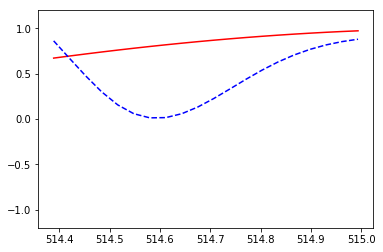

   [[515.02539585 515.05722683 515.08905782 515.12088881 515.1527198
  515.18455079 515.21638178 515.24821277 515.28004375 515.31187474
  515.34370573 515.37553672 515.40736771 515.4391987  515.47102969
  515.50286067 515.53469166 515.56652265 515.59835364 515.63018463]
 [515.66201562 515.69384661 515.72567759 515.75750858 515.78933957
  515.82117056 515.85300155 515.88483254 515.91666353 515.94849452
  515.9803255  516.01215649 516.04398748 516.07581847 516.10764946
  516.13948045 516.17131144 516.20314242 516.23497341 516.2668044 ]
 [516.29863539 516.33046638 516.36229737 516.39412836 516.42595934
  516.45779033 516.48962132 516.52145231 516.5532833  516.58511429
  516.61694528 516.64877626 516.68060725 516.71243824 516.74426923
  516.77610022 516.80793121 516.8397622  516.87159319 516.90342417]
 [516.93525516 516.96708615 516.99891714 517.03074813 517.06257912
  517.09441011 517.12624109 517.15807208 517.18990307 517.22173406
  517.25356505 517.28539604 517.31722703 517.34905801 517

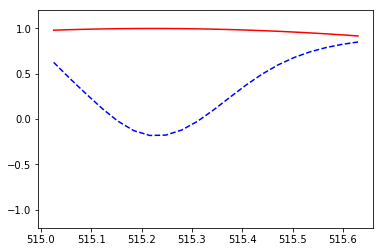

   [[515.66201562 515.69384661 515.72567759 515.75750858 515.78933957
  515.82117056 515.85300155 515.88483254 515.91666353 515.94849452
  515.9803255  516.01215649 516.04398748 516.07581847 516.10764946
  516.13948045 516.17131144 516.20314242 516.23497341 516.2668044 ]
 [516.29863539 516.33046638 516.36229737 516.39412836 516.42595934
  516.45779033 516.48962132 516.52145231 516.5532833  516.58511429
  516.61694528 516.64877626 516.68060725 516.71243824 516.74426923
  516.77610022 516.80793121 516.8397622  516.87159319 516.90342417]
 [516.93525516 516.96708615 516.99891714 517.03074813 517.06257912
  517.09441011 517.12624109 517.15807208 517.18990307 517.22173406
  517.25356505 517.28539604 517.31722703 517.34905801 517.380889
  517.41271999 517.44455098 517.47638197 517.50821296 517.54004395]
 [517.57187493 517.60370592 517.63553691 517.6673679  517.69919889
  517.73102988 517.76286087 517.79469186 517.82652284 517.85835383
  517.89018482 517.92201581 517.9538468  517.98567779 518.

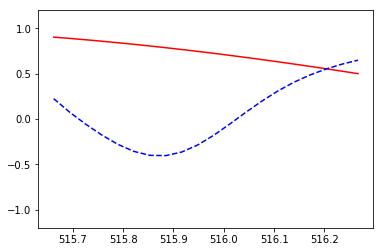

   [[516.29863539 516.33046638 516.36229737 516.39412836 516.42595934
  516.45779033 516.48962132 516.52145231 516.5532833  516.58511429
  516.61694528 516.64877626 516.68060725 516.71243824 516.74426923
  516.77610022 516.80793121 516.8397622  516.87159319 516.90342417]
 [516.93525516 516.96708615 516.99891714 517.03074813 517.06257912
  517.09441011 517.12624109 517.15807208 517.18990307 517.22173406
  517.25356505 517.28539604 517.31722703 517.34905801 517.380889
  517.41271999 517.44455098 517.47638197 517.50821296 517.54004395]
 [517.57187493 517.60370592 517.63553691 517.6673679  517.69919889
  517.73102988 517.76286087 517.79469186 517.82652284 517.85835383
  517.89018482 517.92201581 517.9538468  517.98567779 518.01750878
  518.04933976 518.08117075 518.11300174 518.14483273 518.17666372]
 [518.20849471 518.2403257  518.27215668 518.30398767 518.33581866
  518.36764965 518.39948064 518.43131163 518.46314262 518.4949736
  518.52680459 518.55863558 518.59046657 518.62229756 518.6

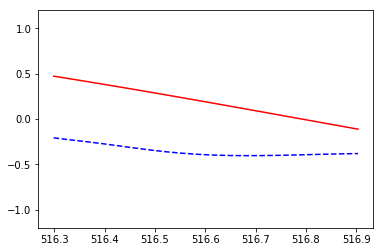

   [[516.93525516 516.96708615 516.99891714 517.03074813 517.06257912
  517.09441011 517.12624109 517.15807208 517.18990307 517.22173406
  517.25356505 517.28539604 517.31722703 517.34905801 517.380889
  517.41271999 517.44455098 517.47638197 517.50821296 517.54004395]
 [517.57187493 517.60370592 517.63553691 517.6673679  517.69919889
  517.73102988 517.76286087 517.79469186 517.82652284 517.85835383
  517.89018482 517.92201581 517.9538468  517.98567779 518.01750878
  518.04933976 518.08117075 518.11300174 518.14483273 518.17666372]
 [518.20849471 518.2403257  518.27215668 518.30398767 518.33581866
  518.36764965 518.39948064 518.43131163 518.46314262 518.4949736
  518.52680459 518.55863558 518.59046657 518.62229756 518.65412855
  518.68595954 518.71779053 518.74962151 518.7814525  518.81328349]
 [518.84511448 518.87694547 518.90877646 518.94060745 518.97243843
  519.00426942 519.03610041 519.0679314  519.09976239 519.13159338
  519.16342437 519.19525535 519.22708634 519.25891733 519.2

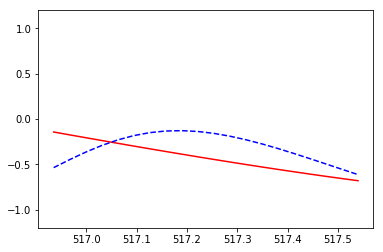

   0.00763514
   [[517.57187493 517.60370592 517.63553691 517.6673679  517.69919889
  517.73102988 517.76286087 517.79469186 517.82652284 517.85835383
  517.89018482 517.92201581 517.9538468  517.98567779 518.01750878
  518.04933976 518.08117075 518.11300174 518.14483273 518.17666372]
 [518.20849471 518.2403257  518.27215668 518.30398767 518.33581866
  518.36764965 518.39948064 518.43131163 518.46314262 518.4949736
  518.52680459 518.55863558 518.59046657 518.62229756 518.65412855
  518.68595954 518.71779053 518.74962151 518.7814525  518.81328349]
 [518.84511448 518.87694547 518.90877646 518.94060745 518.97243843
  519.00426942 519.03610041 519.0679314  519.09976239 519.13159338
  519.16342437 519.19525535 519.22708634 519.25891733 519.29074832
  519.32257931 519.3544103  519.38624129 519.41807227 519.44990326]
 [519.48173425 519.51356524 519.54539623 519.57722722 519.60905821
  519.6408892  519.67272018 519.70455117 519.73638216 519.76821315
  519.80004414 519.83187513 519.86370612 51

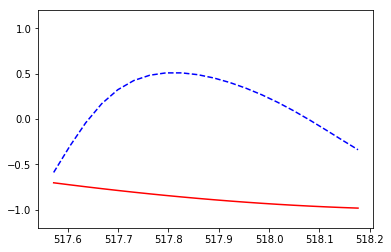

   [[518.20849471 518.2403257  518.27215668 518.30398767 518.33581866
  518.36764965 518.39948064 518.43131163 518.46314262 518.4949736
  518.52680459 518.55863558 518.59046657 518.62229756 518.65412855
  518.68595954 518.71779053 518.74962151 518.7814525  518.81328349]
 [518.84511448 518.87694547 518.90877646 518.94060745 518.97243843
  519.00426942 519.03610041 519.0679314  519.09976239 519.13159338
  519.16342437 519.19525535 519.22708634 519.25891733 519.29074832
  519.32257931 519.3544103  519.38624129 519.41807227 519.44990326]
 [519.48173425 519.51356524 519.54539623 519.57722722 519.60905821
  519.6408892  519.67272018 519.70455117 519.73638216 519.76821315
  519.80004414 519.83187513 519.86370612 519.8955371  519.92736809
  519.95919908 519.99103007 520.02286106 520.05469205 520.08652304]
 [520.11835402 520.15018501 520.182016   520.21384699 520.24567798
  520.27750897 520.30933996 520.34117094 520.37300193 520.40483292
  520.43666391 520.4684949  520.50032589 520.53215688 520

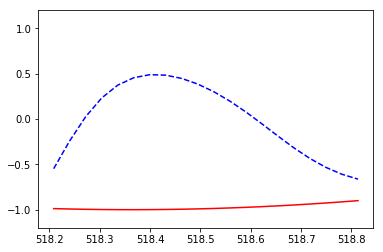

   [[518.84511448 518.87694547 518.90877646 518.94060745 518.97243843
  519.00426942 519.03610041 519.0679314  519.09976239 519.13159338
  519.16342437 519.19525535 519.22708634 519.25891733 519.29074832
  519.32257931 519.3544103  519.38624129 519.41807227 519.44990326]
 [519.48173425 519.51356524 519.54539623 519.57722722 519.60905821
  519.6408892  519.67272018 519.70455117 519.73638216 519.76821315
  519.80004414 519.83187513 519.86370612 519.8955371  519.92736809
  519.95919908 519.99103007 520.02286106 520.05469205 520.08652304]
 [520.11835402 520.15018501 520.182016   520.21384699 520.24567798
  520.27750897 520.30933996 520.34117094 520.37300193 520.40483292
  520.43666391 520.4684949  520.50032589 520.53215688 520.56398786
  520.59581885 520.62764984 520.65948083 520.69131182 520.72314281]
 [520.7549738  520.78680479 520.81863577 520.85046676 520.88229775
  520.91412874 520.94595973 520.97779072 521.00962171 521.04145269
  521.07328368 521.10511467 521.13694566 521.16877665 52

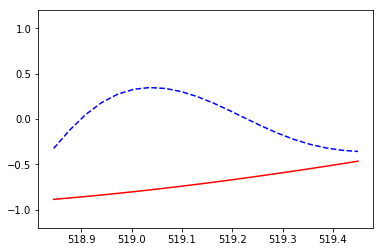

   [[519.48173425 519.51356524 519.54539623 519.57722722 519.60905821
  519.6408892  519.67272018 519.70455117 519.73638216 519.76821315
  519.80004414 519.83187513 519.86370612 519.8955371  519.92736809
  519.95919908 519.99103007 520.02286106 520.05469205 520.08652304]
 [520.11835402 520.15018501 520.182016   520.21384699 520.24567798
  520.27750897 520.30933996 520.34117094 520.37300193 520.40483292
  520.43666391 520.4684949  520.50032589 520.53215688 520.56398786
  520.59581885 520.62764984 520.65948083 520.69131182 520.72314281]
 [520.7549738  520.78680479 520.81863577 520.85046676 520.88229775
  520.91412874 520.94595973 520.97779072 521.00962171 521.04145269
  521.07328368 521.10511467 521.13694566 521.16877665 521.20060764
  521.23243863 521.26426961 521.2961006  521.32793159 521.35976258]
 [521.39159357 521.42342456 521.45525555 521.48708653 521.51891752
  521.55074851 521.5825795  521.61441049 521.64624148 521.67807247
  521.70990346 521.74173444 521.77356543 521.80539642 52

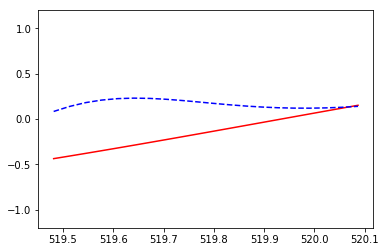

   [[520.11835402 520.15018501 520.182016   520.21384699 520.24567798
  520.27750897 520.30933996 520.34117094 520.37300193 520.40483292
  520.43666391 520.4684949  520.50032589 520.53215688 520.56398786
  520.59581885 520.62764984 520.65948083 520.69131182 520.72314281]
 [520.7549738  520.78680479 520.81863577 520.85046676 520.88229775
  520.91412874 520.94595973 520.97779072 521.00962171 521.04145269
  521.07328368 521.10511467 521.13694566 521.16877665 521.20060764
  521.23243863 521.26426961 521.2961006  521.32793159 521.35976258]
 [521.39159357 521.42342456 521.45525555 521.48708653 521.51891752
  521.55074851 521.5825795  521.61441049 521.64624148 521.67807247
  521.70990346 521.74173444 521.77356543 521.80539642 521.83722741
  521.8690584  521.90088939 521.93272038 521.96455136 521.99638235]
 [522.02821334 522.06004433 522.09187532 522.12370631 522.1555373
  522.18736828 522.21919927 522.25103026 522.28286125 522.31469224
  522.34652323 522.37835422 522.4101852  522.44201619 522

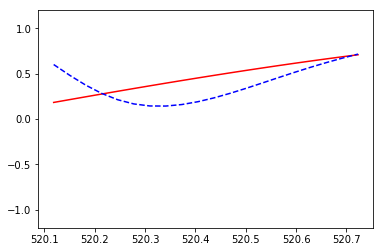

   [[520.7549738  520.78680479 520.81863577 520.85046676 520.88229775
  520.91412874 520.94595973 520.97779072 521.00962171 521.04145269
  521.07328368 521.10511467 521.13694566 521.16877665 521.20060764
  521.23243863 521.26426961 521.2961006  521.32793159 521.35976258]
 [521.39159357 521.42342456 521.45525555 521.48708653 521.51891752
  521.55074851 521.5825795  521.61441049 521.64624148 521.67807247
  521.70990346 521.74173444 521.77356543 521.80539642 521.83722741
  521.8690584  521.90088939 521.93272038 521.96455136 521.99638235]
 [522.02821334 522.06004433 522.09187532 522.12370631 522.1555373
  522.18736828 522.21919927 522.25103026 522.28286125 522.31469224
  522.34652323 522.37835422 522.4101852  522.44201619 522.47384718
  522.50567817 522.53750916 522.56934015 522.60117114 522.63300213]
 [522.66483311 522.6966641  522.72849509 522.76032608 522.79215707
  522.82398806 522.85581905 522.88765003 522.91948102 522.95131201
  522.983143   523.01497399 523.04680498 523.07863597 523

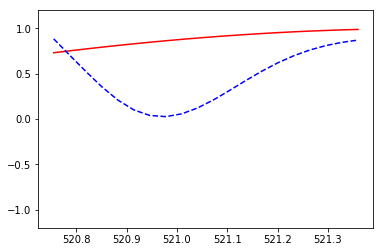

   [[521.39159357 521.42342456 521.45525555 521.48708653 521.51891752
  521.55074851 521.5825795  521.61441049 521.64624148 521.67807247
  521.70990346 521.74173444 521.77356543 521.80539642 521.83722741
  521.8690584  521.90088939 521.93272038 521.96455136 521.99638235]
 [522.02821334 522.06004433 522.09187532 522.12370631 522.1555373
  522.18736828 522.21919927 522.25103026 522.28286125 522.31469224
  522.34652323 522.37835422 522.4101852  522.44201619 522.47384718
  522.50567817 522.53750916 522.56934015 522.60117114 522.63300213]
 [522.66483311 522.6966641  522.72849509 522.76032608 522.79215707
  522.82398806 522.85581905 522.88765003 522.91948102 522.95131201
  522.983143   523.01497399 523.04680498 523.07863597 523.11046695
  523.14229794 523.17412893 523.20595992 523.23779091 523.2696219 ]
 [523.30145289 523.33328387 523.36511486 523.39694585 523.42877684
  523.46060783 523.49243882 523.52426981 523.5561008  523.58793178
  523.61976277 523.65159376 523.68342475 523.71525574 523

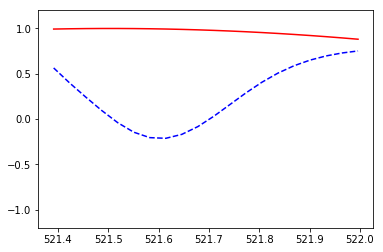

   [[522.02821334 522.06004433 522.09187532 522.12370631 522.1555373
  522.18736828 522.21919927 522.25103026 522.28286125 522.31469224
  522.34652323 522.37835422 522.4101852  522.44201619 522.47384718
  522.50567817 522.53750916 522.56934015 522.60117114 522.63300213]
 [522.66483311 522.6966641  522.72849509 522.76032608 522.79215707
  522.82398806 522.85581905 522.88765003 522.91948102 522.95131201
  522.983143   523.01497399 523.04680498 523.07863597 523.11046695
  523.14229794 523.17412893 523.20595992 523.23779091 523.2696219 ]
 [523.30145289 523.33328387 523.36511486 523.39694585 523.42877684
  523.46060783 523.49243882 523.52426981 523.5561008  523.58793178
  523.61976277 523.65159376 523.68342475 523.71525574 523.74708673
  523.77891772 523.8107487  523.84257969 523.87441068 523.90624167]
 [523.93807266 523.96990365 524.00173464 524.03356562 524.06539661
  524.0972276  524.12905859 524.16088958 524.19272057 524.22455156
  524.25638254 524.28821353 524.32004452 524.35187551 524

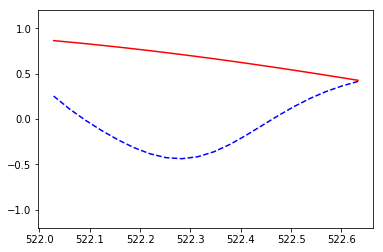

   [[522.66483311 522.6966641  522.72849509 522.76032608 522.79215707
  522.82398806 522.85581905 522.88765003 522.91948102 522.95131201
  522.983143   523.01497399 523.04680498 523.07863597 523.11046695
  523.14229794 523.17412893 523.20595992 523.23779091 523.2696219 ]
 [523.30145289 523.33328387 523.36511486 523.39694585 523.42877684
  523.46060783 523.49243882 523.52426981 523.5561008  523.58793178
  523.61976277 523.65159376 523.68342475 523.71525574 523.74708673
  523.77891772 523.8107487  523.84257969 523.87441068 523.90624167]
 [523.93807266 523.96990365 524.00173464 524.03356562 524.06539661
  524.0972276  524.12905859 524.16088958 524.19272057 524.22455156
  524.25638254 524.28821353 524.32004452 524.35187551 524.3837065
  524.41553749 524.44736848 524.47919947 524.51103045 524.54286144]
 [524.57469243 524.60652342 524.63835441 524.6701854  524.70201639
  524.73384737 524.76567836 524.79750935 524.82934034 524.86117133
  524.89300232 524.92483331 524.95666429 524.98849528 525

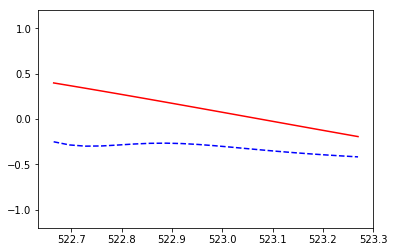

   [[523.30145289 523.33328387 523.36511486 523.39694585 523.42877684
  523.46060783 523.49243882 523.52426981 523.5561008  523.58793178
  523.61976277 523.65159376 523.68342475 523.71525574 523.74708673
  523.77891772 523.8107487  523.84257969 523.87441068 523.90624167]
 [523.93807266 523.96990365 524.00173464 524.03356562 524.06539661
  524.0972276  524.12905859 524.16088958 524.19272057 524.22455156
  524.25638254 524.28821353 524.32004452 524.35187551 524.3837065
  524.41553749 524.44736848 524.47919947 524.51103045 524.54286144]
 [524.57469243 524.60652342 524.63835441 524.6701854  524.70201639
  524.73384737 524.76567836 524.79750935 524.82934034 524.86117133
  524.89300232 524.92483331 524.95666429 524.98849528 525.02032627
  525.05215726 525.08398825 525.11581924 525.14765023 525.17948121]
 [525.2113122  525.24314319 525.27497418 525.30680517 525.33863616
  525.37046715 525.40229813 525.43412912 525.46596011 525.4977911
  525.52962209 525.56145308 525.59328407 525.62511506 525.

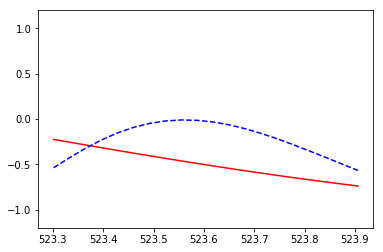

   0.010637585
   [[523.93807266 523.96990365 524.00173464 524.03356562 524.06539661
  524.0972276  524.12905859 524.16088958 524.19272057 524.22455156
  524.25638254 524.28821353 524.32004452 524.35187551 524.3837065
  524.41553749 524.44736848 524.47919947 524.51103045 524.54286144]
 [524.57469243 524.60652342 524.63835441 524.6701854  524.70201639
  524.73384737 524.76567836 524.79750935 524.82934034 524.86117133
  524.89300232 524.92483331 524.95666429 524.98849528 525.02032627
  525.05215726 525.08398825 525.11581924 525.14765023 525.17948121]
 [525.2113122  525.24314319 525.27497418 525.30680517 525.33863616
  525.37046715 525.40229813 525.43412912 525.46596011 525.4977911
  525.52962209 525.56145308 525.59328407 525.62511506 525.65694604
  525.68877703 525.72060802 525.75243901 525.78427    525.81610099]
 [525.84793198 525.87976296 525.91159395 525.94342494 525.97525593
  526.00708692 526.03891791 526.0707489  526.10257988 526.13441087
  526.16624186 526.19807285 526.22990384 52

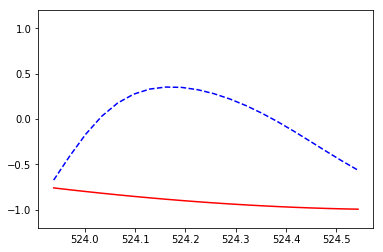

   [[524.57469243 524.60652342 524.63835441 524.6701854  524.70201639
  524.73384737 524.76567836 524.79750935 524.82934034 524.86117133
  524.89300232 524.92483331 524.95666429 524.98849528 525.02032627
  525.05215726 525.08398825 525.11581924 525.14765023 525.17948121]
 [525.2113122  525.24314319 525.27497418 525.30680517 525.33863616
  525.37046715 525.40229813 525.43412912 525.46596011 525.4977911
  525.52962209 525.56145308 525.59328407 525.62511506 525.65694604
  525.68877703 525.72060802 525.75243901 525.78427    525.81610099]
 [525.84793198 525.87976296 525.91159395 525.94342494 525.97525593
  526.00708692 526.03891791 526.0707489  526.10257988 526.13441087
  526.16624186 526.19807285 526.22990384 526.26173483 526.29356582
  526.3253968  526.35722779 526.38905878 526.42088977 526.45272076]
 [526.48455175 526.51638274 526.54821373 526.58004471 526.6118757
  526.64370669 526.67553768 526.70736867 526.73919966 526.77103065
  526.80286163 526.83469262 526.86652361 526.8983546  526.

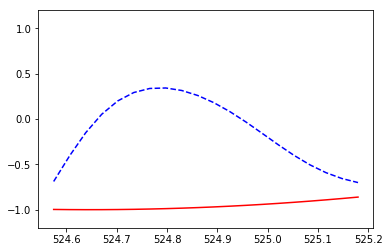

   [[525.2113122  525.24314319 525.27497418 525.30680517 525.33863616
  525.37046715 525.40229813 525.43412912 525.46596011 525.4977911
  525.52962209 525.56145308 525.59328407 525.62511506 525.65694604
  525.68877703 525.72060802 525.75243901 525.78427    525.81610099]
 [525.84793198 525.87976296 525.91159395 525.94342494 525.97525593
  526.00708692 526.03891791 526.0707489  526.10257988 526.13441087
  526.16624186 526.19807285 526.22990384 526.26173483 526.29356582
  526.3253968  526.35722779 526.38905878 526.42088977 526.45272076]
 [526.48455175 526.51638274 526.54821373 526.58004471 526.6118757
  526.64370669 526.67553768 526.70736867 526.73919966 526.77103065
  526.80286163 526.83469262 526.86652361 526.8983546  526.93018559
  526.96201658 526.99384757 527.02567855 527.05750954 527.08934053]
 [527.12117152 527.15300251 527.1848335  527.21666449 527.24849547
  527.28032646 527.31215745 527.34398844 527.37581943 527.40765042
  527.43948141 527.4713124  527.50314338 527.53497437 527.

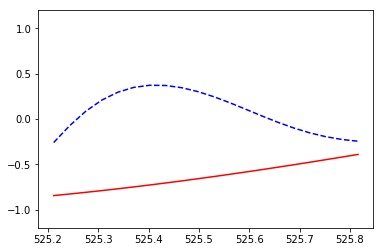

   [[525.84793198 525.87976296 525.91159395 525.94342494 525.97525593
  526.00708692 526.03891791 526.0707489  526.10257988 526.13441087
  526.16624186 526.19807285 526.22990384 526.26173483 526.29356582
  526.3253968  526.35722779 526.38905878 526.42088977 526.45272076]
 [526.48455175 526.51638274 526.54821373 526.58004471 526.6118757
  526.64370669 526.67553768 526.70736867 526.73919966 526.77103065
  526.80286163 526.83469262 526.86652361 526.8983546  526.93018559
  526.96201658 526.99384757 527.02567855 527.05750954 527.08934053]
 [527.12117152 527.15300251 527.1848335  527.21666449 527.24849547
  527.28032646 527.31215745 527.34398844 527.37581943 527.40765042
  527.43948141 527.4713124  527.50314338 527.53497437 527.56680536
  527.59863635 527.63046734 527.66229833 527.69412932 527.7259603 ]
 [527.75779129 527.78962228 527.82145327 527.85328426 527.88511525
  527.91694624 527.94877722 527.98060821 528.0124392  528.04427019
  528.07610118 528.10793217 528.13976316 528.17159414 528

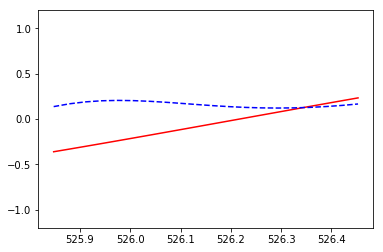

   [[526.48455175 526.51638274 526.54821373 526.58004471 526.6118757
  526.64370669 526.67553768 526.70736867 526.73919966 526.77103065
  526.80286163 526.83469262 526.86652361 526.8983546  526.93018559
  526.96201658 526.99384757 527.02567855 527.05750954 527.08934053]
 [527.12117152 527.15300251 527.1848335  527.21666449 527.24849547
  527.28032646 527.31215745 527.34398844 527.37581943 527.40765042
  527.43948141 527.4713124  527.50314338 527.53497437 527.56680536
  527.59863635 527.63046734 527.66229833 527.69412932 527.7259603 ]
 [527.75779129 527.78962228 527.82145327 527.85328426 527.88511525
  527.91694624 527.94877722 527.98060821 528.0124392  528.04427019
  528.07610118 528.10793217 528.13976316 528.17159414 528.20342513
  528.23525612 528.26708711 528.2989181  528.33074909 528.36258008]
 [528.39441107 528.42624205 528.45807304 528.48990403 528.52173502
  528.55356601 528.585397   528.61722799 528.64905897 528.68088996
  528.71272095 528.74455194 528.77638293 528.80821392 528

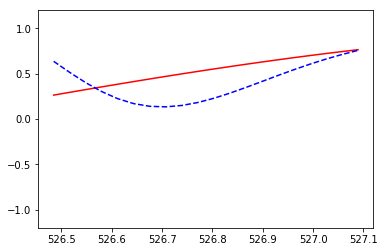

   [[527.12117152 527.15300251 527.1848335  527.21666449 527.24849547
  527.28032646 527.31215745 527.34398844 527.37581943 527.40765042
  527.43948141 527.4713124  527.50314338 527.53497437 527.56680536
  527.59863635 527.63046734 527.66229833 527.69412932 527.7259603 ]
 [527.75779129 527.78962228 527.82145327 527.85328426 527.88511525
  527.91694624 527.94877722 527.98060821 528.0124392  528.04427019
  528.07610118 528.10793217 528.13976316 528.17159414 528.20342513
  528.23525612 528.26708711 528.2989181  528.33074909 528.36258008]
 [528.39441107 528.42624205 528.45807304 528.48990403 528.52173502
  528.55356601 528.585397   528.61722799 528.64905897 528.68088996
  528.71272095 528.74455194 528.77638293 528.80821392 528.84004491
  528.87187589 528.90370688 528.93553787 528.96736886 528.99919985]
 [529.03103084 529.06286183 529.09469281 529.1265238  529.15835479
  529.19018578 529.22201677 529.25384776 529.28567875 529.31750974
  529.34934072 529.38117171 529.4130027  529.44483369 52

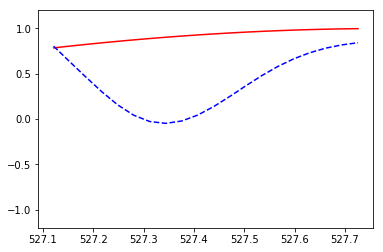

   [[527.75779129 527.78962228 527.82145327 527.85328426 527.88511525
  527.91694624 527.94877722 527.98060821 528.0124392  528.04427019
  528.07610118 528.10793217 528.13976316 528.17159414 528.20342513
  528.23525612 528.26708711 528.2989181  528.33074909 528.36258008]
 [528.39441107 528.42624205 528.45807304 528.48990403 528.52173502
  528.55356601 528.585397   528.61722799 528.64905897 528.68088996
  528.71272095 528.74455194 528.77638293 528.80821392 528.84004491
  528.87187589 528.90370688 528.93553787 528.96736886 528.99919985]
 [529.03103084 529.06286183 529.09469281 529.1265238  529.15835479
  529.19018578 529.22201677 529.25384776 529.28567875 529.31750974
  529.34934072 529.38117171 529.4130027  529.44483369 529.47666468
  529.50849567 529.54032666 529.57215764 529.60398863 529.63581962]
 [529.66765061 529.6994816  529.73131259 529.76314358 529.79497456
  529.82680555 529.85863654 529.89046753 529.92229852 529.95412951
  529.9859605  530.01779148 530.04962247 530.08145346 53

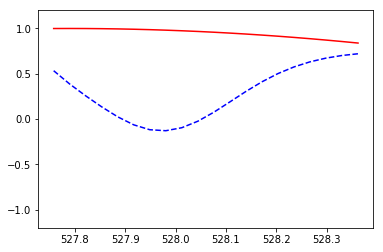

   [[528.39441107 528.42624205 528.45807304 528.48990403 528.52173502
  528.55356601 528.585397   528.61722799 528.64905897 528.68088996
  528.71272095 528.74455194 528.77638293 528.80821392 528.84004491
  528.87187589 528.90370688 528.93553787 528.96736886 528.99919985]
 [529.03103084 529.06286183 529.09469281 529.1265238  529.15835479
  529.19018578 529.22201677 529.25384776 529.28567875 529.31750974
  529.34934072 529.38117171 529.4130027  529.44483369 529.47666468
  529.50849567 529.54032666 529.57215764 529.60398863 529.63581962]
 [529.66765061 529.6994816  529.73131259 529.76314358 529.79497456
  529.82680555 529.85863654 529.89046753 529.92229852 529.95412951
  529.9859605  530.01779148 530.04962247 530.08145346 530.11328445
  530.14511544 530.17694643 530.20877742 530.2406084  530.27243939]
 [530.30427038 530.33610137 530.36793236 530.39976335 530.43159434
  530.46342533 530.49525631 530.5270873  530.55891829 530.59074928
  530.62258027 530.65441126 530.68624225 530.71807323 53

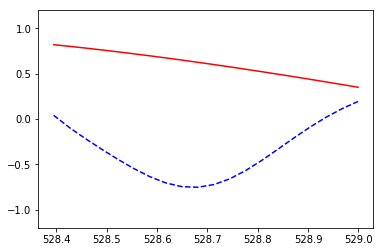

   [[529.03103084 529.06286183 529.09469281 529.1265238  529.15835479
  529.19018578 529.22201677 529.25384776 529.28567875 529.31750974
  529.34934072 529.38117171 529.4130027  529.44483369 529.47666468
  529.50849567 529.54032666 529.57215764 529.60398863 529.63581962]
 [529.66765061 529.6994816  529.73131259 529.76314358 529.79497456
  529.82680555 529.85863654 529.89046753 529.92229852 529.95412951
  529.9859605  530.01779148 530.04962247 530.08145346 530.11328445
  530.14511544 530.17694643 530.20877742 530.2406084  530.27243939]
 [530.30427038 530.33610137 530.36793236 530.39976335 530.43159434
  530.46342533 530.49525631 530.5270873  530.55891829 530.59074928
  530.62258027 530.65441126 530.68624225 530.71807323 530.74990422
  530.78173521 530.8135662  530.84539719 530.87722818 530.90905917]
 [530.94089015 530.97272114 531.00455213 531.03638312 531.06821411
  531.1000451  531.13187609 531.16370707 531.19553806 531.22736905
  531.25920004 531.29103103 531.32286202 531.35469301 53

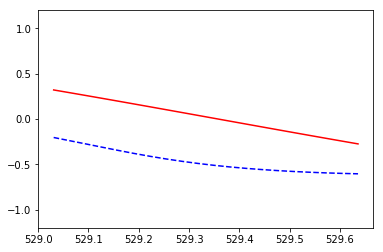

   [[529.66765061 529.6994816  529.73131259 529.76314358 529.79497456
  529.82680555 529.85863654 529.89046753 529.92229852 529.95412951
  529.9859605  530.01779148 530.04962247 530.08145346 530.11328445
  530.14511544 530.17694643 530.20877742 530.2406084  530.27243939]
 [530.30427038 530.33610137 530.36793236 530.39976335 530.43159434
  530.46342533 530.49525631 530.5270873  530.55891829 530.59074928
  530.62258027 530.65441126 530.68624225 530.71807323 530.74990422
  530.78173521 530.8135662  530.84539719 530.87722818 530.90905917]
 [530.94089015 530.97272114 531.00455213 531.03638312 531.06821411
  531.1000451  531.13187609 531.16370707 531.19553806 531.22736905
  531.25920004 531.29103103 531.32286202 531.35469301 531.386524
  531.41835498 531.45018597 531.48201696 531.51384795 531.54567894]
 [531.57750993 531.60934092 531.6411719  531.67300289 531.70483388
  531.73666487 531.76849586 531.80032685 531.83215784 531.86398882
  531.89581981 531.9276508  531.95948179 531.99131278 532.

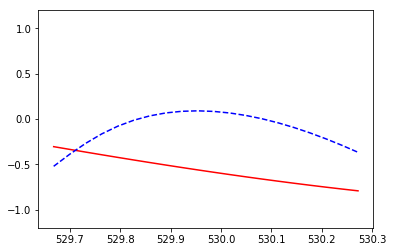

   0.017762266
   [[530.30427038 530.33610137 530.36793236 530.39976335 530.43159434
  530.46342533 530.49525631 530.5270873  530.55891829 530.59074928
  530.62258027 530.65441126 530.68624225 530.71807323 530.74990422
  530.78173521 530.8135662  530.84539719 530.87722818 530.90905917]
 [530.94089015 530.97272114 531.00455213 531.03638312 531.06821411
  531.1000451  531.13187609 531.16370707 531.19553806 531.22736905
  531.25920004 531.29103103 531.32286202 531.35469301 531.386524
  531.41835498 531.45018597 531.48201696 531.51384795 531.54567894]
 [531.57750993 531.60934092 531.6411719  531.67300289 531.70483388
  531.73666487 531.76849586 531.80032685 531.83215784 531.86398882
  531.89581981 531.9276508  531.95948179 531.99131278 532.02314377
  532.05497476 532.08680574 532.11863673 532.15046772 532.18229871]
 [532.2141297  532.24596069 532.27779168 532.30962267 532.34145365
  532.37328464 532.40511563 532.43694662 532.46877761 532.5006086
  532.53243959 532.56427057 532.59610156 532

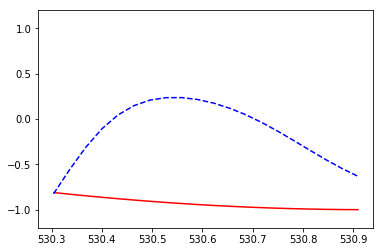

   [[530.94089015 530.97272114 531.00455213 531.03638312 531.06821411
  531.1000451  531.13187609 531.16370707 531.19553806 531.22736905
  531.25920004 531.29103103 531.32286202 531.35469301 531.386524
  531.41835498 531.45018597 531.48201696 531.51384795 531.54567894]
 [531.57750993 531.60934092 531.6411719  531.67300289 531.70483388
  531.73666487 531.76849586 531.80032685 531.83215784 531.86398882
  531.89581981 531.9276508  531.95948179 531.99131278 532.02314377
  532.05497476 532.08680574 532.11863673 532.15046772 532.18229871]
 [532.2141297  532.24596069 532.27779168 532.30962267 532.34145365
  532.37328464 532.40511563 532.43694662 532.46877761 532.5006086
  532.53243959 532.56427057 532.59610156 532.62793255 532.65976354
  532.69159453 532.72342552 532.75525651 532.78708749 532.81891848]
 [532.85074947 532.88258046 532.91441145 532.94624244 532.97807343
  533.00990441 533.0417354  533.07356639 533.10539738 533.13722837
  533.16905936 533.20089035 533.23272134 533.26455232 533.2

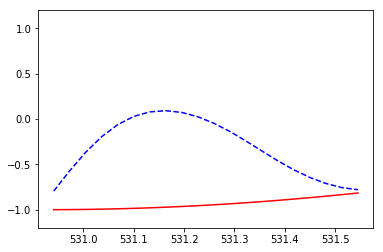

   [[531.57750993 531.60934092 531.6411719  531.67300289 531.70483388
  531.73666487 531.76849586 531.80032685 531.83215784 531.86398882
  531.89581981 531.9276508  531.95948179 531.99131278 532.02314377
  532.05497476 532.08680574 532.11863673 532.15046772 532.18229871]
 [532.2141297  532.24596069 532.27779168 532.30962267 532.34145365
  532.37328464 532.40511563 532.43694662 532.46877761 532.5006086
  532.53243959 532.56427057 532.59610156 532.62793255 532.65976354
  532.69159453 532.72342552 532.75525651 532.78708749 532.81891848]
 [532.85074947 532.88258046 532.91441145 532.94624244 532.97807343
  533.00990441 533.0417354  533.07356639 533.10539738 533.13722837
  533.16905936 533.20089035 533.23272134 533.26455232 533.29638331
  533.3282143  533.36004529 533.39187628 533.42370727 533.45553826]
 [533.48736924 533.51920023 533.55103122 533.58286221 533.6146932
  533.64652419 533.67835518 533.71018616 533.74201715 533.77384814
  533.80567913 533.83751012 533.86934111 533.9011721  533.

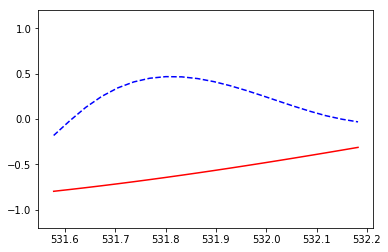

   [[532.2141297  532.24596069 532.27779168 532.30962267 532.34145365
  532.37328464 532.40511563 532.43694662 532.46877761 532.5006086
  532.53243959 532.56427057 532.59610156 532.62793255 532.65976354
  532.69159453 532.72342552 532.75525651 532.78708749 532.81891848]
 [532.85074947 532.88258046 532.91441145 532.94624244 532.97807343
  533.00990441 533.0417354  533.07356639 533.10539738 533.13722837
  533.16905936 533.20089035 533.23272134 533.26455232 533.29638331
  533.3282143  533.36004529 533.39187628 533.42370727 533.45553826]
 [533.48736924 533.51920023 533.55103122 533.58286221 533.6146932
  533.64652419 533.67835518 533.71018616 533.74201715 533.77384814
  533.80567913 533.83751012 533.86934111 533.9011721  533.93300308
  533.96483407 533.99666506 534.02849605 534.06032704 534.09215803]
 [534.12398902 534.15582001 534.18765099 534.21948198 534.25131297
  534.28314396 534.31497495 534.34680594 534.37863693 534.41046791
  534.4422989  534.47412989 534.50596088 534.53779187 534.

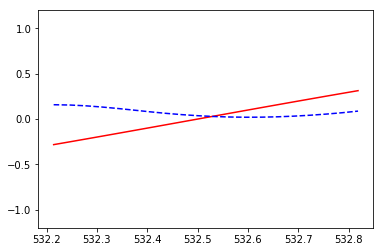

   [[532.85074947 532.88258046 532.91441145 532.94624244 532.97807343
  533.00990441 533.0417354  533.07356639 533.10539738 533.13722837
  533.16905936 533.20089035 533.23272134 533.26455232 533.29638331
  533.3282143  533.36004529 533.39187628 533.42370727 533.45553826]
 [533.48736924 533.51920023 533.55103122 533.58286221 533.6146932
  533.64652419 533.67835518 533.71018616 533.74201715 533.77384814
  533.80567913 533.83751012 533.86934111 533.9011721  533.93300308
  533.96483407 533.99666506 534.02849605 534.06032704 534.09215803]
 [534.12398902 534.15582001 534.18765099 534.21948198 534.25131297
  534.28314396 534.31497495 534.34680594 534.37863693 534.41046791
  534.4422989  534.47412989 534.50596088 534.53779187 534.56962286
  534.60145385 534.63328483 534.66511582 534.69694681 534.7287778 ]
 [534.76060879 534.79243978 534.82427077 534.85610175 534.88793274
  534.91976373 534.95159472 534.98342571 535.0152567  535.04708769
  535.07891867 535.11074966 535.14258065 535.17441164 535

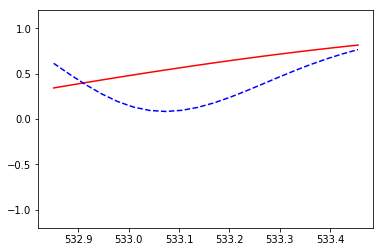

   [[533.48736924 533.51920023 533.55103122 533.58286221 533.6146932
  533.64652419 533.67835518 533.71018616 533.74201715 533.77384814
  533.80567913 533.83751012 533.86934111 533.9011721  533.93300308
  533.96483407 533.99666506 534.02849605 534.06032704 534.09215803]
 [534.12398902 534.15582001 534.18765099 534.21948198 534.25131297
  534.28314396 534.31497495 534.34680594 534.37863693 534.41046791
  534.4422989  534.47412989 534.50596088 534.53779187 534.56962286
  534.60145385 534.63328483 534.66511582 534.69694681 534.7287778 ]
 [534.76060879 534.79243978 534.82427077 534.85610175 534.88793274
  534.91976373 534.95159472 534.98342571 535.0152567  535.04708769
  535.07891867 535.11074966 535.14258065 535.17441164 535.20624263
  535.23807362 535.26990461 535.3017356  535.33356658 535.36539757]
 [535.39722856 535.42905955 535.46089054 535.49272153 535.52455252
  535.5563835  535.58821449 535.62004548 535.65187647 535.68370746
  535.71553845 535.74736944 535.77920042 535.81103141 535

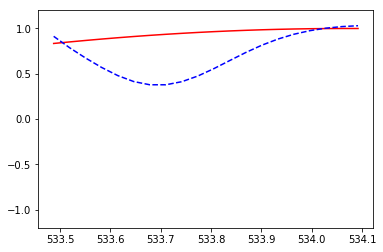

   [[534.12398902 534.15582001 534.18765099 534.21948198 534.25131297
  534.28314396 534.31497495 534.34680594 534.37863693 534.41046791
  534.4422989  534.47412989 534.50596088 534.53779187 534.56962286
  534.60145385 534.63328483 534.66511582 534.69694681 534.7287778 ]
 [534.76060879 534.79243978 534.82427077 534.85610175 534.88793274
  534.91976373 534.95159472 534.98342571 535.0152567  535.04708769
  535.07891867 535.11074966 535.14258065 535.17441164 535.20624263
  535.23807362 535.26990461 535.3017356  535.33356658 535.36539757]
 [535.39722856 535.42905955 535.46089054 535.49272153 535.52455252
  535.5563835  535.58821449 535.62004548 535.65187647 535.68370746
  535.71553845 535.74736944 535.77920042 535.81103141 535.8428624
  535.87469339 535.90652438 535.93835537 535.97018636 536.00201734]
 [536.03384833 536.06567932 536.09751031 536.1293413  536.16117229
  536.19300328 536.22483427 536.25666525 536.28849624 536.32032723
  536.35215822 536.38398921 536.4158202  536.44765119 536

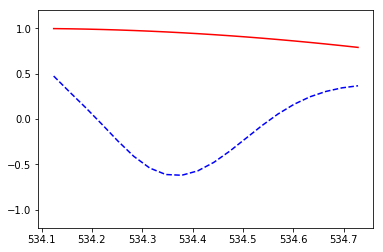

   [[534.76060879 534.79243978 534.82427077 534.85610175 534.88793274
  534.91976373 534.95159472 534.98342571 535.0152567  535.04708769
  535.07891867 535.11074966 535.14258065 535.17441164 535.20624263
  535.23807362 535.26990461 535.3017356  535.33356658 535.36539757]
 [535.39722856 535.42905955 535.46089054 535.49272153 535.52455252
  535.5563835  535.58821449 535.62004548 535.65187647 535.68370746
  535.71553845 535.74736944 535.77920042 535.81103141 535.8428624
  535.87469339 535.90652438 535.93835537 535.97018636 536.00201734]
 [536.03384833 536.06567932 536.09751031 536.1293413  536.16117229
  536.19300328 536.22483427 536.25666525 536.28849624 536.32032723
  536.35215822 536.38398921 536.4158202  536.44765119 536.47948217
  536.51131316 536.54314415 536.57497514 536.60680613 536.63863712]
 [536.67046811 536.70229909 536.73413008 536.76596107 536.79779206
  536.82962305 536.86145404 536.89328503 536.92511601 536.956947
  536.98877799 537.02060898 537.05243997 537.08427096 537.1

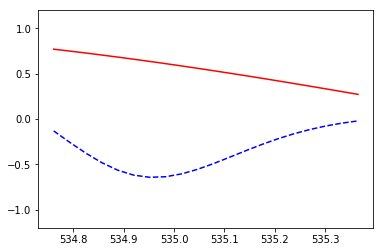

   [[535.39722856 535.42905955 535.46089054 535.49272153 535.52455252
  535.5563835  535.58821449 535.62004548 535.65187647 535.68370746
  535.71553845 535.74736944 535.77920042 535.81103141 535.8428624
  535.87469339 535.90652438 535.93835537 535.97018636 536.00201734]
 [536.03384833 536.06567932 536.09751031 536.1293413  536.16117229
  536.19300328 536.22483427 536.25666525 536.28849624 536.32032723
  536.35215822 536.38398921 536.4158202  536.44765119 536.47948217
  536.51131316 536.54314415 536.57497514 536.60680613 536.63863712]
 [536.67046811 536.70229909 536.73413008 536.76596107 536.79779206
  536.82962305 536.86145404 536.89328503 536.92511601 536.956947
  536.98877799 537.02060898 537.05243997 537.08427096 537.11610195
  537.14793294 537.17976392 537.21159491 537.2434259  537.27525689]
 [537.30708788 537.33891887 537.37074986 537.40258084 537.43441183
  537.46624282 537.49807381 537.5299048  537.56173579 537.59356678
  537.62539776 537.65722875 537.68905974 537.72089073 537.7

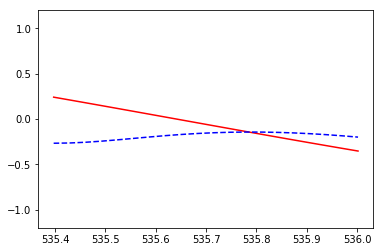

   [[536.03384833 536.06567932 536.09751031 536.1293413  536.16117229
  536.19300328 536.22483427 536.25666525 536.28849624 536.32032723
  536.35215822 536.38398921 536.4158202  536.44765119 536.47948217
  536.51131316 536.54314415 536.57497514 536.60680613 536.63863712]
 [536.67046811 536.70229909 536.73413008 536.76596107 536.79779206
  536.82962305 536.86145404 536.89328503 536.92511601 536.956947
  536.98877799 537.02060898 537.05243997 537.08427096 537.11610195
  537.14793294 537.17976392 537.21159491 537.2434259  537.27525689]
 [537.30708788 537.33891887 537.37074986 537.40258084 537.43441183
  537.46624282 537.49807381 537.5299048  537.56173579 537.59356678
  537.62539776 537.65722875 537.68905974 537.72089073 537.75272172
  537.78455271 537.8163837  537.84821468 537.88004567 537.91187666]
 [537.94370765 537.97553864 538.00736963 538.03920062 538.07103161
  538.10286259 538.13469358 538.16652457 538.19835556 538.23018655
  538.26201754 538.29384853 538.32567951 538.3575105  538.

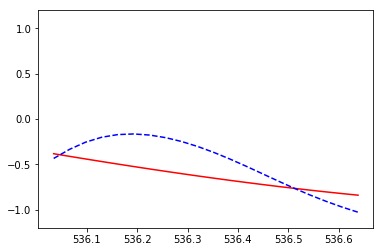

   0.074628614
   [[536.67046811 536.70229909 536.73413008 536.76596107 536.79779206
  536.82962305 536.86145404 536.89328503 536.92511601 536.956947
  536.98877799 537.02060898 537.05243997 537.08427096 537.11610195
  537.14793294 537.17976392 537.21159491 537.2434259  537.27525689]
 [537.30708788 537.33891887 537.37074986 537.40258084 537.43441183
  537.46624282 537.49807381 537.5299048  537.56173579 537.59356678
  537.62539776 537.65722875 537.68905974 537.72089073 537.75272172
  537.78455271 537.8163837  537.84821468 537.88004567 537.91187666]
 [537.94370765 537.97553864 538.00736963 538.03920062 538.07103161
  538.10286259 538.13469358 538.16652457 538.19835556 538.23018655
  538.26201754 538.29384853 538.32567951 538.3575105  538.38934149
  538.42117248 538.45300347 538.48483446 538.51666545 538.54849643]
 [538.58032742 538.61215841 538.6439894  538.67582039 538.70765138
  538.73948237 538.77131335 538.80314434 538.83497533 538.86680632
  538.89863731 538.9304683  538.96229929 53

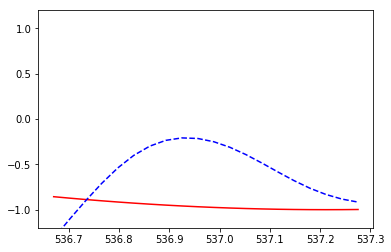

   [[537.30708788 537.33891887 537.37074986 537.40258084 537.43441183
  537.46624282 537.49807381 537.5299048  537.56173579 537.59356678
  537.62539776 537.65722875 537.68905974 537.72089073 537.75272172
  537.78455271 537.8163837  537.84821468 537.88004567 537.91187666]
 [537.94370765 537.97553864 538.00736963 538.03920062 538.07103161
  538.10286259 538.13469358 538.16652457 538.19835556 538.23018655
  538.26201754 538.29384853 538.32567951 538.3575105  538.38934149
  538.42117248 538.45300347 538.48483446 538.51666545 538.54849643]
 [538.58032742 538.61215841 538.6439894  538.67582039 538.70765138
  538.73948237 538.77131335 538.80314434 538.83497533 538.86680632
  538.89863731 538.9304683  538.96229929 538.99413028 539.02596126
  539.05779225 539.08962324 539.12145423 539.15328522 539.18511621]
 [539.2169472  539.24877818 539.28060917 539.31244016 539.34427115
  539.37610214 539.40793313 539.43976412 539.4715951  539.50342609
  539.53525708 539.56708807 539.59891906 539.63075005 53

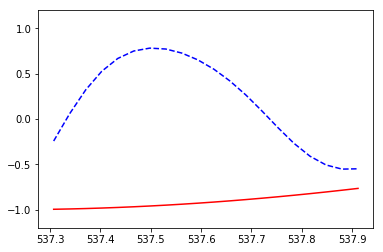

   [[537.94370765 537.97553864 538.00736963 538.03920062 538.07103161
  538.10286259 538.13469358 538.16652457 538.19835556 538.23018655
  538.26201754 538.29384853 538.32567951 538.3575105  538.38934149
  538.42117248 538.45300347 538.48483446 538.51666545 538.54849643]
 [538.58032742 538.61215841 538.6439894  538.67582039 538.70765138
  538.73948237 538.77131335 538.80314434 538.83497533 538.86680632
  538.89863731 538.9304683  538.96229929 538.99413028 539.02596126
  539.05779225 539.08962324 539.12145423 539.15328522 539.18511621]
 [539.2169472  539.24877818 539.28060917 539.31244016 539.34427115
  539.37610214 539.40793313 539.43976412 539.4715951  539.50342609
  539.53525708 539.56708807 539.59891906 539.63075005 539.66258104
  539.69441202 539.72624301 539.758074   539.78990499 539.82173598]
 [539.85356697 539.88539796 539.91722894 539.94905993 539.98089092
  540.01272191 540.0445529  540.07638389 540.10821488 540.14004587
  540.17187685 540.20370784 540.23553883 540.26736982 54

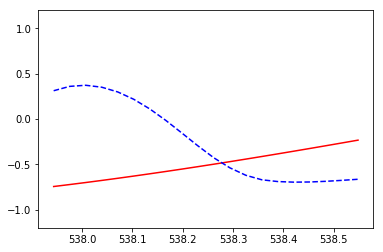

   [[538.58032742 538.61215841 538.6439894  538.67582039 538.70765138
  538.73948237 538.77131335 538.80314434 538.83497533 538.86680632
  538.89863731 538.9304683  538.96229929 538.99413028 539.02596126
  539.05779225 539.08962324 539.12145423 539.15328522 539.18511621]
 [539.2169472  539.24877818 539.28060917 539.31244016 539.34427115
  539.37610214 539.40793313 539.43976412 539.4715951  539.50342609
  539.53525708 539.56708807 539.59891906 539.63075005 539.66258104
  539.69441202 539.72624301 539.758074   539.78990499 539.82173598]
 [539.85356697 539.88539796 539.91722894 539.94905993 539.98089092
  540.01272191 540.0445529  540.07638389 540.10821488 540.14004587
  540.17187685 540.20370784 540.23553883 540.26736982 540.29920081
  540.3310318  540.36286279 540.39469377 540.42652476 540.45835575]
 [540.49018674 540.52201773 540.55384872 540.58567971 540.61751069
  540.64934168 540.68117267 540.71300366 540.74483465 540.77666564
  540.80849663 540.84032761 540.8721586  540.90398959 54

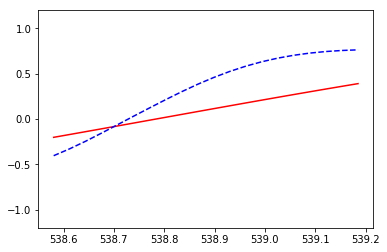

   [[539.2169472  539.24877818 539.28060917 539.31244016 539.34427115
  539.37610214 539.40793313 539.43976412 539.4715951  539.50342609
  539.53525708 539.56708807 539.59891906 539.63075005 539.66258104
  539.69441202 539.72624301 539.758074   539.78990499 539.82173598]
 [539.85356697 539.88539796 539.91722894 539.94905993 539.98089092
  540.01272191 540.0445529  540.07638389 540.10821488 540.14004587
  540.17187685 540.20370784 540.23553883 540.26736982 540.29920081
  540.3310318  540.36286279 540.39469377 540.42652476 540.45835575]
 [540.49018674 540.52201773 540.55384872 540.58567971 540.61751069
  540.64934168 540.68117267 540.71300366 540.74483465 540.77666564
  540.80849663 540.84032761 540.8721586  540.90398959 540.93582058
  540.96765157 540.99948256 541.03131355 541.06314454 541.09497552]
 [541.12680651 541.1586375  541.19046849 541.22229948 541.25413047
  541.28596146 541.31779244 541.34962343 541.38145442 541.41328541
  541.4451164  541.47694739 541.50877838 541.54060936 54

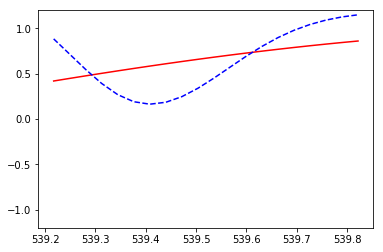

   [[539.85356697 539.88539796 539.91722894 539.94905993 539.98089092
  540.01272191 540.0445529  540.07638389 540.10821488 540.14004587
  540.17187685 540.20370784 540.23553883 540.26736982 540.29920081
  540.3310318  540.36286279 540.39469377 540.42652476 540.45835575]
 [540.49018674 540.52201773 540.55384872 540.58567971 540.61751069
  540.64934168 540.68117267 540.71300366 540.74483465 540.77666564
  540.80849663 540.84032761 540.8721586  540.90398959 540.93582058
  540.96765157 540.99948256 541.03131355 541.06314454 541.09497552]
 [541.12680651 541.1586375  541.19046849 541.22229948 541.25413047
  541.28596146 541.31779244 541.34962343 541.38145442 541.41328541
  541.4451164  541.47694739 541.50877838 541.54060936 541.57244035
  541.60427134 541.63610233 541.66793332 541.69976431 541.7315953 ]
 [541.76342628 541.79525727 541.82708826 541.85891925 541.89075024
  541.92258123 541.95441222 541.98624321 542.01807419 542.04990518
  542.08173617 542.11356716 542.14539815 542.17722914 54

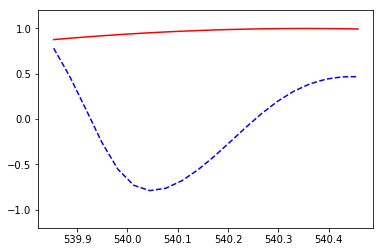

   [[540.49018674 540.52201773 540.55384872 540.58567971 540.61751069
  540.64934168 540.68117267 540.71300366 540.74483465 540.77666564
  540.80849663 540.84032761 540.8721586  540.90398959 540.93582058
  540.96765157 540.99948256 541.03131355 541.06314454 541.09497552]
 [541.12680651 541.1586375  541.19046849 541.22229948 541.25413047
  541.28596146 541.31779244 541.34962343 541.38145442 541.41328541
  541.4451164  541.47694739 541.50877838 541.54060936 541.57244035
  541.60427134 541.63610233 541.66793332 541.69976431 541.7315953 ]
 [541.76342628 541.79525727 541.82708826 541.85891925 541.89075024
  541.92258123 541.95441222 541.98624321 542.01807419 542.04990518
  542.08173617 542.11356716 542.14539815 542.17722914 542.20906013
  542.24089111 542.2727221  542.30455309 542.33638408 542.36821507]
 [542.40004606 542.43187705 542.46370803 542.49553902 542.52737001
  542.559201   542.59103199 542.62286298 542.65469397 542.68652495
  542.71835594 542.75018693 542.78201792 542.81384891 54

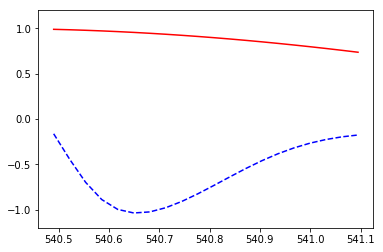

   [[541.12680651 541.1586375  541.19046849 541.22229948 541.25413047
  541.28596146 541.31779244 541.34962343 541.38145442 541.41328541
  541.4451164  541.47694739 541.50877838 541.54060936 541.57244035
  541.60427134 541.63610233 541.66793332 541.69976431 541.7315953 ]
 [541.76342628 541.79525727 541.82708826 541.85891925 541.89075024
  541.92258123 541.95441222 541.98624321 542.01807419 542.04990518
  542.08173617 542.11356716 542.14539815 542.17722914 542.20906013
  542.24089111 542.2727221  542.30455309 542.33638408 542.36821507]
 [542.40004606 542.43187705 542.46370803 542.49553902 542.52737001
  542.559201   542.59103199 542.62286298 542.65469397 542.68652495
  542.71835594 542.75018693 542.78201792 542.81384891 542.8456799
  542.87751089 542.90934188 542.94117286 542.97300385 543.00483484]
 [543.03666583 543.06849682 543.10032781 543.1321588  543.16398978
  543.19582077 543.22765176 543.25948275 543.29131374 543.32314473
  543.35497572 543.3868067  543.41863769 543.45046868 543

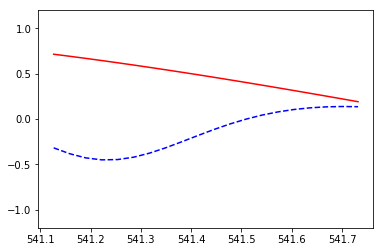

   [[541.76342628 541.79525727 541.82708826 541.85891925 541.89075024
  541.92258123 541.95441222 541.98624321 542.01807419 542.04990518
  542.08173617 542.11356716 542.14539815 542.17722914 542.20906013
  542.24089111 542.2727221  542.30455309 542.33638408 542.36821507]
 [542.40004606 542.43187705 542.46370803 542.49553902 542.52737001
  542.559201   542.59103199 542.62286298 542.65469397 542.68652495
  542.71835594 542.75018693 542.78201792 542.81384891 542.8456799
  542.87751089 542.90934188 542.94117286 542.97300385 543.00483484]
 [543.03666583 543.06849682 543.10032781 543.1321588  543.16398978
  543.19582077 543.22765176 543.25948275 543.29131374 543.32314473
  543.35497572 543.3868067  543.41863769 543.45046868 543.48229967
  543.51413066 543.54596165 543.57779264 543.60962362 543.64145461]
 [543.6732856  543.70511659 543.73694758 543.76877857 543.80060956
  543.83244055 543.86427153 543.89610252 543.92793351 543.9597645
  543.99159549 544.02342648 544.05525747 544.08708845 544.

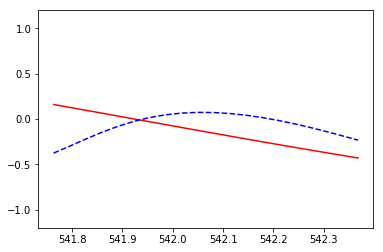

   [[542.40004606 542.43187705 542.46370803 542.49553902 542.52737001
  542.559201   542.59103199 542.62286298 542.65469397 542.68652495
  542.71835594 542.75018693 542.78201792 542.81384891 542.8456799
  542.87751089 542.90934188 542.94117286 542.97300385 543.00483484]
 [543.03666583 543.06849682 543.10032781 543.1321588  543.16398978
  543.19582077 543.22765176 543.25948275 543.29131374 543.32314473
  543.35497572 543.3868067  543.41863769 543.45046868 543.48229967
  543.51413066 543.54596165 543.57779264 543.60962362 543.64145461]
 [543.6732856  543.70511659 543.73694758 543.76877857 543.80060956
  543.83244055 543.86427153 543.89610252 543.92793351 543.9597645
  543.99159549 544.02342648 544.05525747 544.08708845 544.11891944
  544.15075043 544.18258142 544.21441241 544.2462434  544.27807439]
 [544.30990537 544.34173636 544.37356735 544.40539834 544.43722933
  544.46906032 544.50089131 544.53272229 544.56455328 544.59638427
  544.62821526 544.66004625 544.69187724 544.72370823 544.

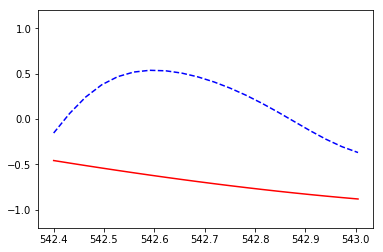

   0.17999102
   [[543.03666583 543.06849682 543.10032781 543.1321588  543.16398978
  543.19582077 543.22765176 543.25948275 543.29131374 543.32314473
  543.35497572 543.3868067  543.41863769 543.45046868 543.48229967
  543.51413066 543.54596165 543.57779264 543.60962362 543.64145461]
 [543.6732856  543.70511659 543.73694758 543.76877857 543.80060956
  543.83244055 543.86427153 543.89610252 543.92793351 543.9597645
  543.99159549 544.02342648 544.05525747 544.08708845 544.11891944
  544.15075043 544.18258142 544.21441241 544.2462434  544.27807439]
 [544.30990537 544.34173636 544.37356735 544.40539834 544.43722933
  544.46906032 544.50089131 544.53272229 544.56455328 544.59638427
  544.62821526 544.66004625 544.69187724 544.72370823 544.75553921
  544.7873702  544.81920119 544.85103218 544.88286317 544.91469416]
 [544.94652515 544.97835614 545.01018712 545.04201811 545.0738491
  545.10568009 545.13751108 545.16934207 545.20117306 545.23300404
  545.26483503 545.29666602 545.32849701 545

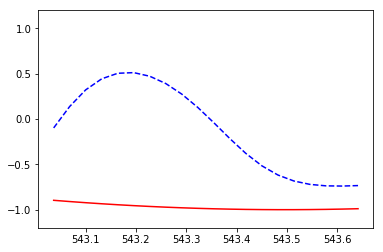

   [[543.6732856  543.70511659 543.73694758 543.76877857 543.80060956
  543.83244055 543.86427153 543.89610252 543.92793351 543.9597645
  543.99159549 544.02342648 544.05525747 544.08708845 544.11891944
  544.15075043 544.18258142 544.21441241 544.2462434  544.27807439]
 [544.30990537 544.34173636 544.37356735 544.40539834 544.43722933
  544.46906032 544.50089131 544.53272229 544.56455328 544.59638427
  544.62821526 544.66004625 544.69187724 544.72370823 544.75553921
  544.7873702  544.81920119 544.85103218 544.88286317 544.91469416]
 [544.94652515 544.97835614 545.01018712 545.04201811 545.0738491
  545.10568009 545.13751108 545.16934207 545.20117306 545.23300404
  545.26483503 545.29666602 545.32849701 545.360328   545.39215899
  545.42398998 545.45582096 545.48765195 545.51948294 545.55131393]
 [545.58314492 545.61497591 545.6468069  545.67863788 545.71046887
  545.74229986 545.77413085 545.80596184 545.83779283 545.86962382
  545.90145481 545.93328579 545.96511678 545.99694777 546.

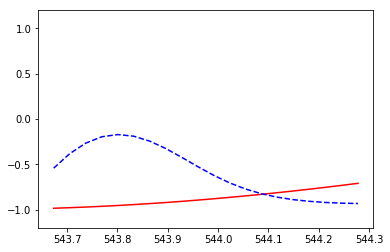

   [[544.30990537 544.34173636 544.37356735 544.40539834 544.43722933
  544.46906032 544.50089131 544.53272229 544.56455328 544.59638427
  544.62821526 544.66004625 544.69187724 544.72370823 544.75553921
  544.7873702  544.81920119 544.85103218 544.88286317 544.91469416]
 [544.94652515 544.97835614 545.01018712 545.04201811 545.0738491
  545.10568009 545.13751108 545.16934207 545.20117306 545.23300404
  545.26483503 545.29666602 545.32849701 545.360328   545.39215899
  545.42398998 545.45582096 545.48765195 545.51948294 545.55131393]
 [545.58314492 545.61497591 545.6468069  545.67863788 545.71046887
  545.74229986 545.77413085 545.80596184 545.83779283 545.86962382
  545.90145481 545.93328579 545.96511678 545.99694777 546.02877876
  546.06060975 546.09244074 546.12427173 546.15610271 546.1879337 ]
 [546.21976469 546.25159568 546.28342667 546.31525766 546.34708865
  546.37891963 546.41075062 546.44258161 546.4744126  546.50624359
  546.53807458 546.56990557 546.60173655 546.63356754 546

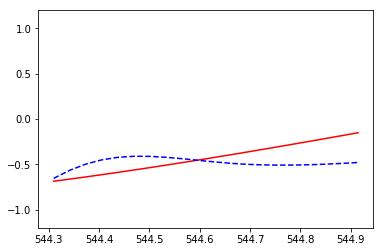

   [[544.94652515 544.97835614 545.01018712 545.04201811 545.0738491
  545.10568009 545.13751108 545.16934207 545.20117306 545.23300404
  545.26483503 545.29666602 545.32849701 545.360328   545.39215899
  545.42398998 545.45582096 545.48765195 545.51948294 545.55131393]
 [545.58314492 545.61497591 545.6468069  545.67863788 545.71046887
  545.74229986 545.77413085 545.80596184 545.83779283 545.86962382
  545.90145481 545.93328579 545.96511678 545.99694777 546.02877876
  546.06060975 546.09244074 546.12427173 546.15610271 546.1879337 ]
 [546.21976469 546.25159568 546.28342667 546.31525766 546.34708865
  546.37891963 546.41075062 546.44258161 546.4744126  546.50624359
  546.53807458 546.56990557 546.60173655 546.63356754 546.66539853
  546.69722952 546.72906051 546.7608915  546.79272249 546.82455348]
 [546.85638446 546.88821545 546.92004644 546.95187743 546.98370842
  547.01553941 547.0473704  547.07920138 547.11103237 547.14286336
  547.17469435 547.20652534 547.23835633 547.27018732 547

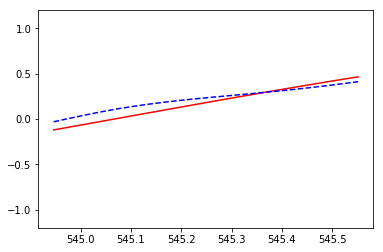

   [[545.58314492 545.61497591 545.6468069  545.67863788 545.71046887
  545.74229986 545.77413085 545.80596184 545.83779283 545.86962382
  545.90145481 545.93328579 545.96511678 545.99694777 546.02877876
  546.06060975 546.09244074 546.12427173 546.15610271 546.1879337 ]
 [546.21976469 546.25159568 546.28342667 546.31525766 546.34708865
  546.37891963 546.41075062 546.44258161 546.4744126  546.50624359
  546.53807458 546.56990557 546.60173655 546.63356754 546.66539853
  546.69722952 546.72906051 546.7608915  546.79272249 546.82455348]
 [546.85638446 546.88821545 546.92004644 546.95187743 546.98370842
  547.01553941 547.0473704  547.07920138 547.11103237 547.14286336
  547.17469435 547.20652534 547.23835633 547.27018732 547.3020183
  547.33384929 547.36568028 547.39751127 547.42934226 547.46117325]
 [547.49300424 547.52483522 547.55666621 547.5884972  547.62032819
  547.65215918 547.68399017 547.71582116 547.74765215 547.77948313
  547.81131412 547.84314511 547.8749761  547.90680709 547

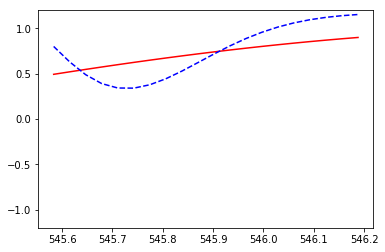

   [[546.21976469 546.25159568 546.28342667 546.31525766 546.34708865
  546.37891963 546.41075062 546.44258161 546.4744126  546.50624359
  546.53807458 546.56990557 546.60173655 546.63356754 546.66539853
  546.69722952 546.72906051 546.7608915  546.79272249 546.82455348]
 [546.85638446 546.88821545 546.92004644 546.95187743 546.98370842
  547.01553941 547.0473704  547.07920138 547.11103237 547.14286336
  547.17469435 547.20652534 547.23835633 547.27018732 547.3020183
  547.33384929 547.36568028 547.39751127 547.42934226 547.46117325]
 [547.49300424 547.52483522 547.55666621 547.5884972  547.62032819
  547.65215918 547.68399017 547.71582116 547.74765215 547.77948313
  547.81131412 547.84314511 547.8749761  547.90680709 547.93863808
  547.97046907 548.00230005 548.03413104 548.06596203 548.09779302]
 [548.12962401 548.161455   548.19328599 548.22511697 548.25694796
  548.28877895 548.32060994 548.35244093 548.38427192 548.41610291
  548.44793389 548.47976488 548.51159587 548.54342686 548

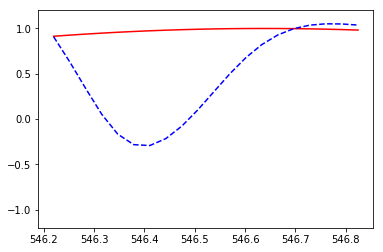

   [[546.85638446 546.88821545 546.92004644 546.95187743 546.98370842
  547.01553941 547.0473704  547.07920138 547.11103237 547.14286336
  547.17469435 547.20652534 547.23835633 547.27018732 547.3020183
  547.33384929 547.36568028 547.39751127 547.42934226 547.46117325]
 [547.49300424 547.52483522 547.55666621 547.5884972  547.62032819
  547.65215918 547.68399017 547.71582116 547.74765215 547.77948313
  547.81131412 547.84314511 547.8749761  547.90680709 547.93863808
  547.97046907 548.00230005 548.03413104 548.06596203 548.09779302]
 [548.12962401 548.161455   548.19328599 548.22511697 548.25694796
  548.28877895 548.32060994 548.35244093 548.38427192 548.41610291
  548.44793389 548.47976488 548.51159587 548.54342686 548.57525785
  548.60708884 548.63891983 548.67075082 548.7025818  548.73441279]
 [548.76624378 548.79807477 548.82990576 548.86173675 548.89356774
  548.92539872 548.95722971 548.9890607  549.02089169 549.05272268
  549.08455367 549.11638466 549.14821564 549.18004663 549

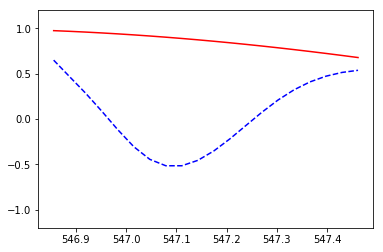

   [[547.49300424 547.52483522 547.55666621 547.5884972  547.62032819
  547.65215918 547.68399017 547.71582116 547.74765215 547.77948313
  547.81131412 547.84314511 547.8749761  547.90680709 547.93863808
  547.97046907 548.00230005 548.03413104 548.06596203 548.09779302]
 [548.12962401 548.161455   548.19328599 548.22511697 548.25694796
  548.28877895 548.32060994 548.35244093 548.38427192 548.41610291
  548.44793389 548.47976488 548.51159587 548.54342686 548.57525785
  548.60708884 548.63891983 548.67075082 548.7025818  548.73441279]
 [548.76624378 548.79807477 548.82990576 548.86173675 548.89356774
  548.92539872 548.95722971 548.9890607  549.02089169 549.05272268
  549.08455367 549.11638466 549.14821564 549.18004663 549.21187762
  549.24370861 549.2755396  549.30737059 549.33920158 549.37103256]
 [549.40286355 549.43469454 549.46652553 549.49835652 549.53018751
  549.5620185  549.59384948 549.62568047 549.65751146 549.68934245
  549.72117344 549.75300443 549.78483542 549.81666641 54

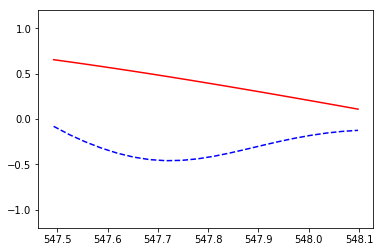

   [[548.12962401 548.161455   548.19328599 548.22511697 548.25694796
  548.28877895 548.32060994 548.35244093 548.38427192 548.41610291
  548.44793389 548.47976488 548.51159587 548.54342686 548.57525785
  548.60708884 548.63891983 548.67075082 548.7025818  548.73441279]
 [548.76624378 548.79807477 548.82990576 548.86173675 548.89356774
  548.92539872 548.95722971 548.9890607  549.02089169 549.05272268
  549.08455367 549.11638466 549.14821564 549.18004663 549.21187762
  549.24370861 549.2755396  549.30737059 549.33920158 549.37103256]
 [549.40286355 549.43469454 549.46652553 549.49835652 549.53018751
  549.5620185  549.59384948 549.62568047 549.65751146 549.68934245
  549.72117344 549.75300443 549.78483542 549.81666641 549.84849739
  549.88032838 549.91215937 549.94399036 549.97582135 550.00765234]
 [550.03948333 550.07131431 550.1031453  550.13497629 550.16680728
  550.19863827 550.23046926 550.26230025 550.29413123 550.32596222
  550.35779321 550.3896242  550.42145519 550.45328618 55

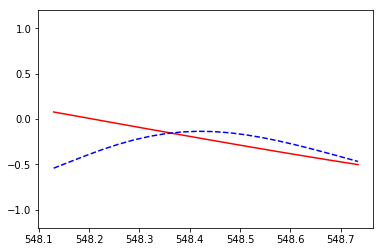

   [[548.76624378 548.79807477 548.82990576 548.86173675 548.89356774
  548.92539872 548.95722971 548.9890607  549.02089169 549.05272268
  549.08455367 549.11638466 549.14821564 549.18004663 549.21187762
  549.24370861 549.2755396  549.30737059 549.33920158 549.37103256]
 [549.40286355 549.43469454 549.46652553 549.49835652 549.53018751
  549.5620185  549.59384948 549.62568047 549.65751146 549.68934245
  549.72117344 549.75300443 549.78483542 549.81666641 549.84849739
  549.88032838 549.91215937 549.94399036 549.97582135 550.00765234]
 [550.03948333 550.07131431 550.1031453  550.13497629 550.16680728
  550.19863827 550.23046926 550.26230025 550.29413123 550.32596222
  550.35779321 550.3896242  550.42145519 550.45328618 550.48511717
  550.51694815 550.54877914 550.58061013 550.61244112 550.64427211]
 [550.6761031  550.70793409 550.73976508 550.77159606 550.80342705
  550.83525804 550.86708903 550.89892002 550.93075101 550.962582
  550.99441298 551.02624397 551.05807496 551.08990595 551.

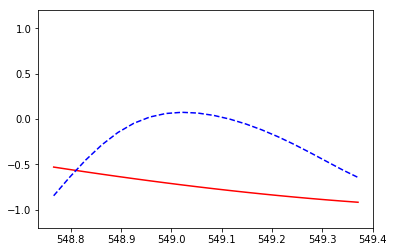

   0.062047947
   [[549.40286355 549.43469454 549.46652553 549.49835652 549.53018751
  549.5620185  549.59384948 549.62568047 549.65751146 549.68934245
  549.72117344 549.75300443 549.78483542 549.81666641 549.84849739
  549.88032838 549.91215937 549.94399036 549.97582135 550.00765234]
 [550.03948333 550.07131431 550.1031453  550.13497629 550.16680728
  550.19863827 550.23046926 550.26230025 550.29413123 550.32596222
  550.35779321 550.3896242  550.42145519 550.45328618 550.48511717
  550.51694815 550.54877914 550.58061013 550.61244112 550.64427211]
 [550.6761031  550.70793409 550.73976508 550.77159606 550.80342705
  550.83525804 550.86708903 550.89892002 550.93075101 550.962582
  550.99441298 551.02624397 551.05807496 551.08990595 551.12173694
  551.15356793 551.18539892 551.2172299  551.24906089 551.28089188]
 [551.31272287 551.34455386 551.37638485 551.40821584 551.44004682
  551.47187781 551.5037088  551.53553979 551.56737078 551.59920177
  551.63103276 551.66286375 551.69469473 55

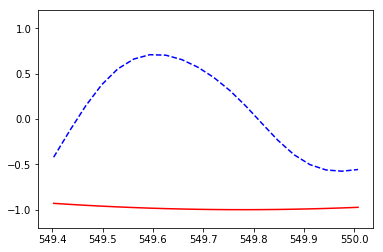

   [[550.03948333 550.07131431 550.1031453  550.13497629 550.16680728
  550.19863827 550.23046926 550.26230025 550.29413123 550.32596222
  550.35779321 550.3896242  550.42145519 550.45328618 550.48511717
  550.51694815 550.54877914 550.58061013 550.61244112 550.64427211]
 [550.6761031  550.70793409 550.73976508 550.77159606 550.80342705
  550.83525804 550.86708903 550.89892002 550.93075101 550.962582
  550.99441298 551.02624397 551.05807496 551.08990595 551.12173694
  551.15356793 551.18539892 551.2172299  551.24906089 551.28089188]
 [551.31272287 551.34455386 551.37638485 551.40821584 551.44004682
  551.47187781 551.5037088  551.53553979 551.56737078 551.59920177
  551.63103276 551.66286375 551.69469473 551.72652572 551.75835671
  551.7901877  551.82201869 551.85384968 551.88568067 551.91751165]
 [551.94934264 551.98117363 552.01300462 552.04483561 552.0766666
  552.10849759 552.14032857 552.17215956 552.20399055 552.23582154
  552.26765253 552.29948352 552.33131451 552.36314549 552.3

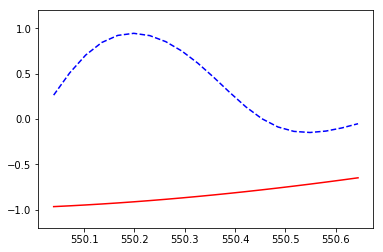

   [[550.6761031  550.70793409 550.73976508 550.77159606 550.80342705
  550.83525804 550.86708903 550.89892002 550.93075101 550.962582
  550.99441298 551.02624397 551.05807496 551.08990595 551.12173694
  551.15356793 551.18539892 551.2172299  551.24906089 551.28089188]
 [551.31272287 551.34455386 551.37638485 551.40821584 551.44004682
  551.47187781 551.5037088  551.53553979 551.56737078 551.59920177
  551.63103276 551.66286375 551.69469473 551.72652572 551.75835671
  551.7901877  551.82201869 551.85384968 551.88568067 551.91751165]
 [551.94934264 551.98117363 552.01300462 552.04483561 552.0766666
  552.10849759 552.14032857 552.17215956 552.20399055 552.23582154
  552.26765253 552.29948352 552.33131451 552.36314549 552.39497648
  552.42680747 552.45863846 552.49046945 552.52230044 552.55413143]
 [552.58596242 552.6177934  552.64962439 552.68145538 552.71328637
  552.74511736 552.77694835 552.80877934 552.84061032 552.87244131
  552.9042723  552.93610329 552.96793428 552.99976527 553.0

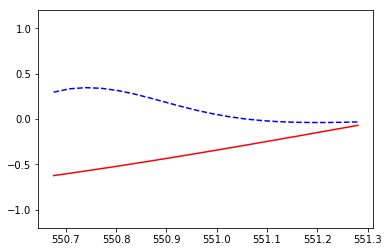

   [[551.31272287 551.34455386 551.37638485 551.40821584 551.44004682
  551.47187781 551.5037088  551.53553979 551.56737078 551.59920177
  551.63103276 551.66286375 551.69469473 551.72652572 551.75835671
  551.7901877  551.82201869 551.85384968 551.88568067 551.91751165]
 [551.94934264 551.98117363 552.01300462 552.04483561 552.0766666
  552.10849759 552.14032857 552.17215956 552.20399055 552.23582154
  552.26765253 552.29948352 552.33131451 552.36314549 552.39497648
  552.42680747 552.45863846 552.49046945 552.52230044 552.55413143]
 [552.58596242 552.6177934  552.64962439 552.68145538 552.71328637
  552.74511736 552.77694835 552.80877934 552.84061032 552.87244131
  552.9042723  552.93610329 552.96793428 552.99976527 553.03159626
  553.06342724 553.09525823 553.12708922 553.15892021 553.1907512 ]
 [553.22258219 553.25441318 553.28624416 553.31807515 553.34990614
  553.38173713 553.41356812 553.44539911 553.4772301  553.50906108
  553.54089207 553.57272306 553.60455405 553.63638504 553

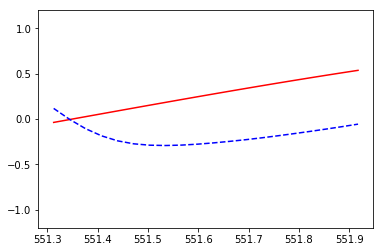

   [[551.94934264 551.98117363 552.01300462 552.04483561 552.0766666
  552.10849759 552.14032857 552.17215956 552.20399055 552.23582154
  552.26765253 552.29948352 552.33131451 552.36314549 552.39497648
  552.42680747 552.45863846 552.49046945 552.52230044 552.55413143]
 [552.58596242 552.6177934  552.64962439 552.68145538 552.71328637
  552.74511736 552.77694835 552.80877934 552.84061032 552.87244131
  552.9042723  552.93610329 552.96793428 552.99976527 553.03159626
  553.06342724 553.09525823 553.12708922 553.15892021 553.1907512 ]
 [553.22258219 553.25441318 553.28624416 553.31807515 553.34990614
  553.38173713 553.41356812 553.44539911 553.4772301  553.50906108
  553.54089207 553.57272306 553.60455405 553.63638504 553.66821603
  553.70004702 553.73187801 553.76370899 553.79553998 553.82737097]
 [553.85920196 553.89103295 553.92286394 553.95469493 553.98652591
  554.0183569  554.05018789 554.08201888 554.11384987 554.14568086
  554.17751185 554.20934283 554.24117382 554.27300481 554

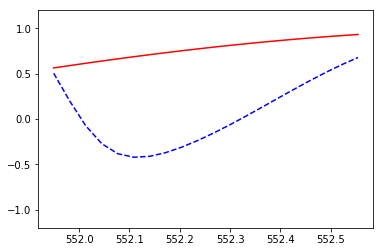

   [[552.58596242 552.6177934  552.64962439 552.68145538 552.71328637
  552.74511736 552.77694835 552.80877934 552.84061032 552.87244131
  552.9042723  552.93610329 552.96793428 552.99976527 553.03159626
  553.06342724 553.09525823 553.12708922 553.15892021 553.1907512 ]
 [553.22258219 553.25441318 553.28624416 553.31807515 553.34990614
  553.38173713 553.41356812 553.44539911 553.4772301  553.50906108
  553.54089207 553.57272306 553.60455405 553.63638504 553.66821603
  553.70004702 553.73187801 553.76370899 553.79553998 553.82737097]
 [553.85920196 553.89103295 553.92286394 553.95469493 553.98652591
  554.0183569  554.05018789 554.08201888 554.11384987 554.14568086
  554.17751185 554.20934283 554.24117382 554.27300481 554.3048358
  554.33666679 554.36849778 554.40032877 554.43215975 554.46399074]
 [554.49582173 554.52765272 554.55948371 554.5913147  554.62314569
  554.65497668 554.68680766 554.71863865 554.75046964 554.78230063
  554.81413162 554.84596261 554.8777936  554.90962458 554

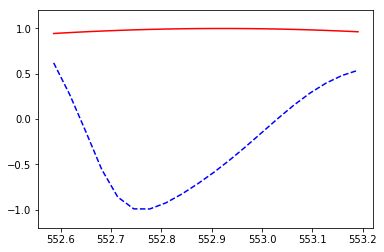

   [[553.22258219 553.25441318 553.28624416 553.31807515 553.34990614
  553.38173713 553.41356812 553.44539911 553.4772301  553.50906108
  553.54089207 553.57272306 553.60455405 553.63638504 553.66821603
  553.70004702 553.73187801 553.76370899 553.79553998 553.82737097]
 [553.85920196 553.89103295 553.92286394 553.95469493 553.98652591
  554.0183569  554.05018789 554.08201888 554.11384987 554.14568086
  554.17751185 554.20934283 554.24117382 554.27300481 554.3048358
  554.33666679 554.36849778 554.40032877 554.43215975 554.46399074]
 [554.49582173 554.52765272 554.55948371 554.5913147  554.62314569
  554.65497668 554.68680766 554.71863865 554.75046964 554.78230063
  554.81413162 554.84596261 554.8777936  554.90962458 554.94145557
  554.97328656 555.00511755 555.03694854 555.06877953 555.10061052]
 [555.1324415  555.16427249 555.19610348 555.22793447 555.25976546
  555.29159645 555.32342744 555.35525842 555.38708941 555.4189204
  555.45075139 555.48258238 555.51441337 555.54624436 555.

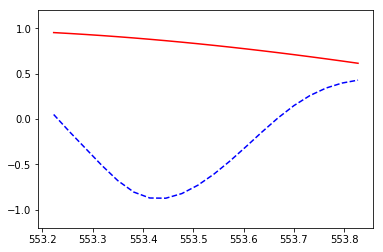

   [[553.85920196 553.89103295 553.92286394 553.95469493 553.98652591
  554.0183569  554.05018789 554.08201888 554.11384987 554.14568086
  554.17751185 554.20934283 554.24117382 554.27300481 554.3048358
  554.33666679 554.36849778 554.40032877 554.43215975 554.46399074]
 [554.49582173 554.52765272 554.55948371 554.5913147  554.62314569
  554.65497668 554.68680766 554.71863865 554.75046964 554.78230063
  554.81413162 554.84596261 554.8777936  554.90962458 554.94145557
  554.97328656 555.00511755 555.03694854 555.06877953 555.10061052]
 [555.1324415  555.16427249 555.19610348 555.22793447 555.25976546
  555.29159645 555.32342744 555.35525842 555.38708941 555.4189204
  555.45075139 555.48258238 555.51441337 555.54624436 555.57807535
  555.60990633 555.64173732 555.67356831 555.7053993  555.73723029]
 [555.76906128 555.80089227 555.83272325 555.86455424 555.89638523
  555.92821622 555.96004721 555.9918782  556.02370919 556.05554017
  556.08737116 556.11920215 556.15103314 556.18286413 556.

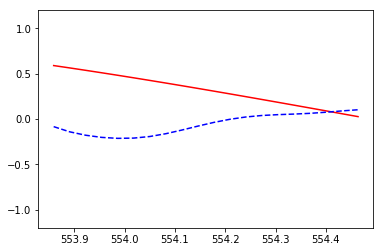

   [[554.49582173 554.52765272 554.55948371 554.5913147  554.62314569
  554.65497668 554.68680766 554.71863865 554.75046964 554.78230063
  554.81413162 554.84596261 554.8777936  554.90962458 554.94145557
  554.97328656 555.00511755 555.03694854 555.06877953 555.10061052]
 [555.1324415  555.16427249 555.19610348 555.22793447 555.25976546
  555.29159645 555.32342744 555.35525842 555.38708941 555.4189204
  555.45075139 555.48258238 555.51441337 555.54624436 555.57807535
  555.60990633 555.64173732 555.67356831 555.7053993  555.73723029]
 [555.76906128 555.80089227 555.83272325 555.86455424 555.89638523
  555.92821622 555.96004721 555.9918782  556.02370919 556.05554017
  556.08737116 556.11920215 556.15103314 556.18286413 556.21469512
  556.24652611 556.27835709 556.31018808 556.34201907 556.37385006]
 [556.40568105 556.43751204 556.46934303 556.50117402 556.533005
  556.56483599 556.59666698 556.62849797 556.66032896 556.69215995
  556.72399094 556.75582192 556.78765291 556.8194839  556.8

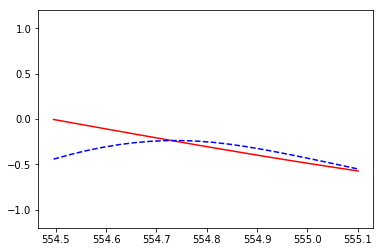

   [[555.1324415  555.16427249 555.19610348 555.22793447 555.25976546
  555.29159645 555.32342744 555.35525842 555.38708941 555.4189204
  555.45075139 555.48258238 555.51441337 555.54624436 555.57807535
  555.60990633 555.64173732 555.67356831 555.7053993  555.73723029]
 [555.76906128 555.80089227 555.83272325 555.86455424 555.89638523
  555.92821622 555.96004721 555.9918782  556.02370919 556.05554017
  556.08737116 556.11920215 556.15103314 556.18286413 556.21469512
  556.24652611 556.27835709 556.31018808 556.34201907 556.37385006]
 [556.40568105 556.43751204 556.46934303 556.50117402 556.533005
  556.56483599 556.59666698 556.62849797 556.66032896 556.69215995
  556.72399094 556.75582192 556.78765291 556.8194839  556.85131489
  556.88314588 556.91497687 556.94680786 556.97863884 557.01046983]
 [557.04230082 557.07413181 557.1059628  557.13779379 557.16962478
  557.20145576 557.23328675 557.26511774 557.29694873 557.32877972
  557.36061071 557.3924417  557.42427269 557.45610367 557.4

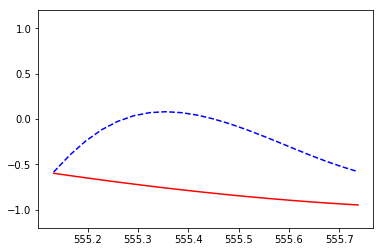

   0.031085337
   [[555.76906128 555.80089227 555.83272325 555.86455424 555.89638523
  555.92821622 555.96004721 555.9918782  556.02370919 556.05554017
  556.08737116 556.11920215 556.15103314 556.18286413 556.21469512
  556.24652611 556.27835709 556.31018808 556.34201907 556.37385006]
 [556.40568105 556.43751204 556.46934303 556.50117402 556.533005
  556.56483599 556.59666698 556.62849797 556.66032896 556.69215995
  556.72399094 556.75582192 556.78765291 556.8194839  556.85131489
  556.88314588 556.91497687 556.94680786 556.97863884 557.01046983]
 [557.04230082 557.07413181 557.1059628  557.13779379 557.16962478
  557.20145576 557.23328675 557.26511774 557.29694873 557.32877972
  557.36061071 557.3924417  557.42427269 557.45610367 557.48793466
  557.51976565 557.55159664 557.58342763 557.61525862 557.64708961]
 [557.67892059 557.71075158 557.74258257 557.77441356 557.80624455
  557.83807554 557.86990653 557.90173751 557.9335685  557.96539949
  557.99723048 558.02906147 558.06089246 55

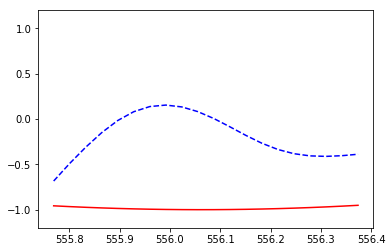

   [[556.40568105 556.43751204 556.46934303 556.50117402 556.533005
  556.56483599 556.59666698 556.62849797 556.66032896 556.69215995
  556.72399094 556.75582192 556.78765291 556.8194839  556.85131489
  556.88314588 556.91497687 556.94680786 556.97863884 557.01046983]
 [557.04230082 557.07413181 557.1059628  557.13779379 557.16962478
  557.20145576 557.23328675 557.26511774 557.29694873 557.32877972
  557.36061071 557.3924417  557.42427269 557.45610367 557.48793466
  557.51976565 557.55159664 557.58342763 557.61525862 557.64708961]
 [557.67892059 557.71075158 557.74258257 557.77441356 557.80624455
  557.83807554 557.86990653 557.90173751 557.9335685  557.96539949
  557.99723048 558.02906147 558.06089246 558.09272345 558.12455443
  558.15638542 558.18821641 558.2200474  558.25187839 558.28370938]
 [558.31554037 558.34737135 558.37920234 558.41103333 558.44286432
  558.47469531 558.5065263  558.53835729 558.57018828 558.60201926
  558.63385025 558.66568124 558.69751223 558.72934322 558.

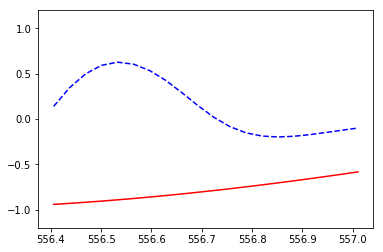

   [[557.04230082 557.07413181 557.1059628  557.13779379 557.16962478
  557.20145576 557.23328675 557.26511774 557.29694873 557.32877972
  557.36061071 557.3924417  557.42427269 557.45610367 557.48793466
  557.51976565 557.55159664 557.58342763 557.61525862 557.64708961]
 [557.67892059 557.71075158 557.74258257 557.77441356 557.80624455
  557.83807554 557.86990653 557.90173751 557.9335685  557.96539949
  557.99723048 558.02906147 558.06089246 558.09272345 558.12455443
  558.15638542 558.18821641 558.2200474  558.25187839 558.28370938]
 [558.31554037 558.34737135 558.37920234 558.41103333 558.44286432
  558.47469531 558.5065263  558.53835729 558.57018828 558.60201926
  558.63385025 558.66568124 558.69751223 558.72934322 558.76117421
  558.7930052  558.82483618 558.85666717 558.88849816 558.92032915]
 [558.95216014 558.98399113 559.01582212 559.0476531  559.07948409
  559.11131508 559.14314607 559.17497706 559.20680805 559.23863904
  559.27047002 559.30230101 559.334132   559.36596299 55

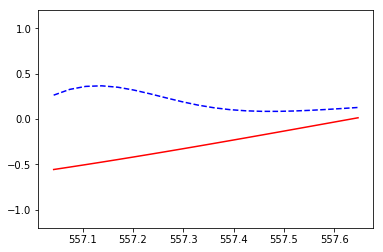

   [[557.67892059 557.71075158 557.74258257 557.77441356 557.80624455
  557.83807554 557.86990653 557.90173751 557.9335685  557.96539949
  557.99723048 558.02906147 558.06089246 558.09272345 558.12455443
  558.15638542 558.18821641 558.2200474  558.25187839 558.28370938]
 [558.31554037 558.34737135 558.37920234 558.41103333 558.44286432
  558.47469531 558.5065263  558.53835729 558.57018828 558.60201926
  558.63385025 558.66568124 558.69751223 558.72934322 558.76117421
  558.7930052  558.82483618 558.85666717 558.88849816 558.92032915]
 [558.95216014 558.98399113 559.01582212 559.0476531  559.07948409
  559.11131508 559.14314607 559.17497706 559.20680805 559.23863904
  559.27047002 559.30230101 559.334132   559.36596299 559.39779398
  559.42962497 559.46145596 559.49328695 559.52511793 559.55694892]
 [559.58877991 559.6206109  559.65244189 559.68427288 559.71610387
  559.74793485 559.77976584 559.81159683 559.84342782 559.87525881
  559.9070898  559.93892079 559.97075177 560.00258276 56

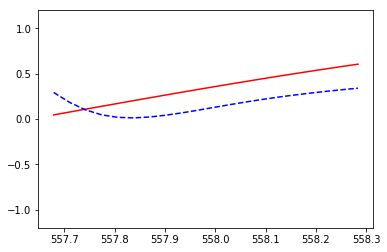

   [[558.31554037 558.34737135 558.37920234 558.41103333 558.44286432
  558.47469531 558.5065263  558.53835729 558.57018828 558.60201926
  558.63385025 558.66568124 558.69751223 558.72934322 558.76117421
  558.7930052  558.82483618 558.85666717 558.88849816 558.92032915]
 [558.95216014 558.98399113 559.01582212 559.0476531  559.07948409
  559.11131508 559.14314607 559.17497706 559.20680805 559.23863904
  559.27047002 559.30230101 559.334132   559.36596299 559.39779398
  559.42962497 559.46145596 559.49328695 559.52511793 559.55694892]
 [559.58877991 559.6206109  559.65244189 559.68427288 559.71610387
  559.74793485 559.77976584 559.81159683 559.84342782 559.87525881
  559.9070898  559.93892079 559.97075177 560.00258276 560.03441375
  560.06624474 560.09807573 560.12990672 560.16173771 560.19356869]
 [560.22539968 560.25723067 560.28906166 560.32089265 560.35272364
  560.38455463 560.41638562 560.4482166  560.48004759 560.51187858
  560.54370957 560.57554056 560.60737155 560.63920254 56

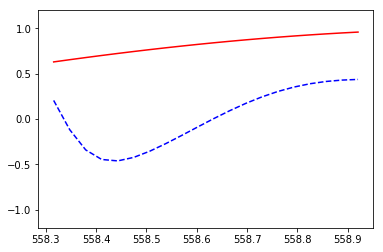

   [[558.95216014 558.98399113 559.01582212 559.0476531  559.07948409
  559.11131508 559.14314607 559.17497706 559.20680805 559.23863904
  559.27047002 559.30230101 559.334132   559.36596299 559.39779398
  559.42962497 559.46145596 559.49328695 559.52511793 559.55694892]
 [559.58877991 559.6206109  559.65244189 559.68427288 559.71610387
  559.74793485 559.77976584 559.81159683 559.84342782 559.87525881
  559.9070898  559.93892079 559.97075177 560.00258276 560.03441375
  560.06624474 560.09807573 560.12990672 560.16173771 560.19356869]
 [560.22539968 560.25723067 560.28906166 560.32089265 560.35272364
  560.38455463 560.41638562 560.4482166  560.48004759 560.51187858
  560.54370957 560.57554056 560.60737155 560.63920254 560.67103352
  560.70286451 560.7346955  560.76652649 560.79835748 560.83018847]
 [560.86201946 560.89385044 560.92568143 560.95751242 560.98934341
  561.0211744  561.05300539 561.08483638 561.11666736 561.14849835
  561.18032934 561.21216033 561.24399132 561.27582231 56

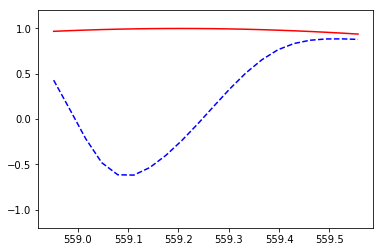

   [[559.58877991 559.6206109  559.65244189 559.68427288 559.71610387
  559.74793485 559.77976584 559.81159683 559.84342782 559.87525881
  559.9070898  559.93892079 559.97075177 560.00258276 560.03441375
  560.06624474 560.09807573 560.12990672 560.16173771 560.19356869]
 [560.22539968 560.25723067 560.28906166 560.32089265 560.35272364
  560.38455463 560.41638562 560.4482166  560.48004759 560.51187858
  560.54370957 560.57554056 560.60737155 560.63920254 560.67103352
  560.70286451 560.7346955  560.76652649 560.79835748 560.83018847]
 [560.86201946 560.89385044 560.92568143 560.95751242 560.98934341
  561.0211744  561.05300539 561.08483638 561.11666736 561.14849835
  561.18032934 561.21216033 561.24399132 561.27582231 561.3076533
  561.33948429 561.37131527 561.40314626 561.43497725 561.46680824]
 [561.49863923 561.53047022 561.56230121 561.59413219 561.62596318
  561.65779417 561.68962516 561.72145615 561.75328714 561.78511813
  561.81694911 561.8487801  561.88061109 561.91244208 561

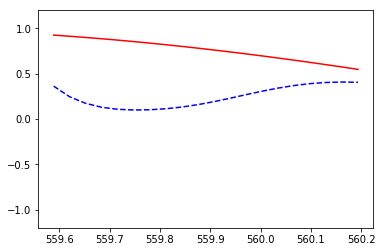

   [[560.22539968 560.25723067 560.28906166 560.32089265 560.35272364
  560.38455463 560.41638562 560.4482166  560.48004759 560.51187858
  560.54370957 560.57554056 560.60737155 560.63920254 560.67103352
  560.70286451 560.7346955  560.76652649 560.79835748 560.83018847]
 [560.86201946 560.89385044 560.92568143 560.95751242 560.98934341
  561.0211744  561.05300539 561.08483638 561.11666736 561.14849835
  561.18032934 561.21216033 561.24399132 561.27582231 561.3076533
  561.33948429 561.37131527 561.40314626 561.43497725 561.46680824]
 [561.49863923 561.53047022 561.56230121 561.59413219 561.62596318
  561.65779417 561.68962516 561.72145615 561.75328714 561.78511813
  561.81694911 561.8487801  561.88061109 561.91244208 561.94427307
  561.97610406 562.00793505 562.03976603 562.07159702 562.10342801]
 [562.135259   562.16708999 562.19892098 562.23075197 562.26258296
  562.29441394 562.32624493 562.35807592 562.38990691 562.4217379
  562.45356889 562.48539988 562.51723086 562.54906185 562.

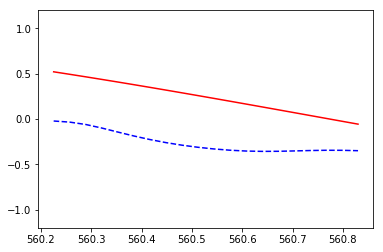

   [[560.86201946 560.89385044 560.92568143 560.95751242 560.98934341
  561.0211744  561.05300539 561.08483638 561.11666736 561.14849835
  561.18032934 561.21216033 561.24399132 561.27582231 561.3076533
  561.33948429 561.37131527 561.40314626 561.43497725 561.46680824]
 [561.49863923 561.53047022 561.56230121 561.59413219 561.62596318
  561.65779417 561.68962516 561.72145615 561.75328714 561.78511813
  561.81694911 561.8487801  561.88061109 561.91244208 561.94427307
  561.97610406 562.00793505 562.03976603 562.07159702 562.10342801]
 [562.135259   562.16708999 562.19892098 562.23075197 562.26258296
  562.29441394 562.32624493 562.35807592 562.38990691 562.4217379
  562.45356889 562.48539988 562.51723086 562.54906185 562.58089284
  562.61272383 562.64455482 562.67638581 562.7082168  562.74004778]
 [562.77187877 562.80370976 562.83554075 562.86737174 562.89920273
  562.93103372 562.9628647  562.99469569 563.02652668 563.05835767
  563.09018866 563.12201965 563.15385064 563.18568162 563.

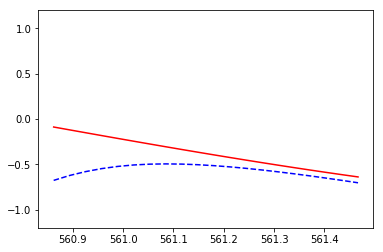

   [[561.49863923 561.53047022 561.56230121 561.59413219 561.62596318
  561.65779417 561.68962516 561.72145615 561.75328714 561.78511813
  561.81694911 561.8487801  561.88061109 561.91244208 561.94427307
  561.97610406 562.00793505 562.03976603 562.07159702 562.10342801]
 [562.135259   562.16708999 562.19892098 562.23075197 562.26258296
  562.29441394 562.32624493 562.35807592 562.38990691 562.4217379
  562.45356889 562.48539988 562.51723086 562.54906185 562.58089284
  562.61272383 562.64455482 562.67638581 562.7082168  562.74004778]
 [562.77187877 562.80370976 562.83554075 562.86737174 562.89920273
  562.93103372 562.9628647  562.99469569 563.02652668 563.05835767
  563.09018866 563.12201965 563.15385064 563.18568162 563.21751261
  563.2493436  563.28117459 563.31300558 563.34483657 563.37666756]
 [563.40849855 563.44032953 563.47216052 563.50399151 563.5358225
  563.56765349 563.59948448 563.63131547 563.66314645 563.69497744
  563.72680843 563.75863942 563.79047041 563.8223014  563.

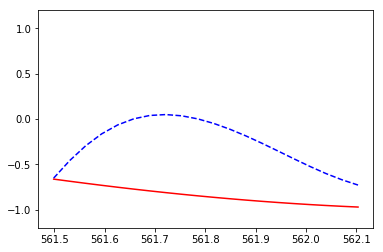

   0.057095695
   [[562.135259   562.16708999 562.19892098 562.23075197 562.26258296
  562.29441394 562.32624493 562.35807592 562.38990691 562.4217379
  562.45356889 562.48539988 562.51723086 562.54906185 562.58089284
  562.61272383 562.64455482 562.67638581 562.7082168  562.74004778]
 [562.77187877 562.80370976 562.83554075 562.86737174 562.89920273
  562.93103372 562.9628647  562.99469569 563.02652668 563.05835767
  563.09018866 563.12201965 563.15385064 563.18568162 563.21751261
  563.2493436  563.28117459 563.31300558 563.34483657 563.37666756]
 [563.40849855 563.44032953 563.47216052 563.50399151 563.5358225
  563.56765349 563.59948448 563.63131547 563.66314645 563.69497744
  563.72680843 563.75863942 563.79047041 563.8223014  563.85413239
  563.88596337 563.91779436 563.94962535 563.98145634 564.01328733]
 [564.04511832 564.07694931 564.10878029 564.14061128 564.17244227
  564.20427326 564.23610425 564.26793524 564.29976623 564.33159722
  564.3634282  564.39525919 564.42709018 56

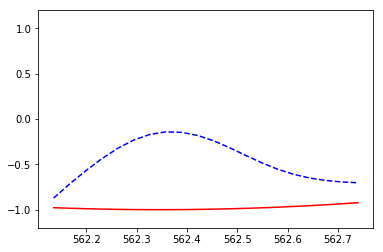

   [[562.77187877 562.80370976 562.83554075 562.86737174 562.89920273
  562.93103372 562.9628647  562.99469569 563.02652668 563.05835767
  563.09018866 563.12201965 563.15385064 563.18568162 563.21751261
  563.2493436  563.28117459 563.31300558 563.34483657 563.37666756]
 [563.40849855 563.44032953 563.47216052 563.50399151 563.5358225
  563.56765349 563.59948448 563.63131547 563.66314645 563.69497744
  563.72680843 563.75863942 563.79047041 563.8223014  563.85413239
  563.88596337 563.91779436 563.94962535 563.98145634 564.01328733]
 [564.04511832 564.07694931 564.10878029 564.14061128 564.17244227
  564.20427326 564.23610425 564.26793524 564.29976623 564.33159722
  564.3634282  564.39525919 564.42709018 564.45892117 564.49075216
  564.52258315 564.55441414 564.58624512 564.61807611 564.6499071 ]
 [564.68173809 564.71356908 564.74540007 564.77723106 564.80906204
  564.84089303 564.87272402 564.90455501 564.936386   564.96821699
  565.00004798 565.03187896 565.06370995 565.09554094 565

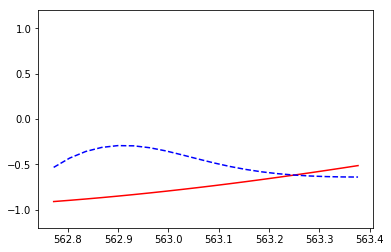

   [[563.40849855 563.44032953 563.47216052 563.50399151 563.5358225
  563.56765349 563.59948448 563.63131547 563.66314645 563.69497744
  563.72680843 563.75863942 563.79047041 563.8223014  563.85413239
  563.88596337 563.91779436 563.94962535 563.98145634 564.01328733]
 [564.04511832 564.07694931 564.10878029 564.14061128 564.17244227
  564.20427326 564.23610425 564.26793524 564.29976623 564.33159722
  564.3634282  564.39525919 564.42709018 564.45892117 564.49075216
  564.52258315 564.55441414 564.58624512 564.61807611 564.6499071 ]
 [564.68173809 564.71356908 564.74540007 564.77723106 564.80906204
  564.84089303 564.87272402 564.90455501 564.936386   564.96821699
  565.00004798 565.03187896 565.06370995 565.09554094 565.12737193
  565.15920292 565.19103391 565.2228649  565.25469589 565.28652687]
 [565.31835786 565.35018885 565.38201984 565.41385083 565.44568182
  565.47751281 565.50934379 565.54117478 565.57300577 565.60483676
  565.63666775 565.66849874 565.70032973 565.73216071 565

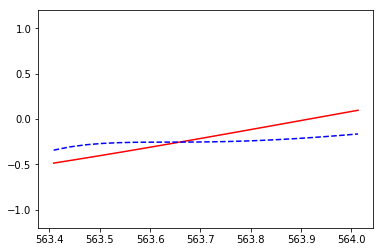

   [[564.04511832 564.07694931 564.10878029 564.14061128 564.17244227
  564.20427326 564.23610425 564.26793524 564.29976623 564.33159722
  564.3634282  564.39525919 564.42709018 564.45892117 564.49075216
  564.52258315 564.55441414 564.58624512 564.61807611 564.6499071 ]
 [564.68173809 564.71356908 564.74540007 564.77723106 564.80906204
  564.84089303 564.87272402 564.90455501 564.936386   564.96821699
  565.00004798 565.03187896 565.06370995 565.09554094 565.12737193
  565.15920292 565.19103391 565.2228649  565.25469589 565.28652687]
 [565.31835786 565.35018885 565.38201984 565.41385083 565.44568182
  565.47751281 565.50934379 565.54117478 565.57300577 565.60483676
  565.63666775 565.66849874 565.70032973 565.73216071 565.7639917
  565.79582269 565.82765368 565.85948467 565.89131566 565.92314665]
 [565.95497763 565.98680862 566.01863961 566.0504706  566.08230159
  566.11413258 566.14596357 566.17779456 566.20962554 566.24145653
  566.27328752 566.30511851 566.3369495  566.36878049 566

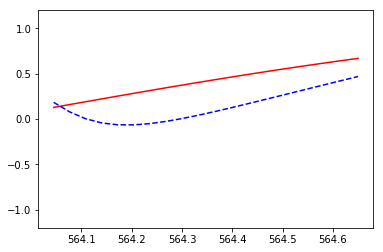

   [[564.68173809 564.71356908 564.74540007 564.77723106 564.80906204
  564.84089303 564.87272402 564.90455501 564.936386   564.96821699
  565.00004798 565.03187896 565.06370995 565.09554094 565.12737193
  565.15920292 565.19103391 565.2228649  565.25469589 565.28652687]
 [565.31835786 565.35018885 565.38201984 565.41385083 565.44568182
  565.47751281 565.50934379 565.54117478 565.57300577 565.60483676
  565.63666775 565.66849874 565.70032973 565.73216071 565.7639917
  565.79582269 565.82765368 565.85948467 565.89131566 565.92314665]
 [565.95497763 565.98680862 566.01863961 566.0504706  566.08230159
  566.11413258 566.14596357 566.17779456 566.20962554 566.24145653
  566.27328752 566.30511851 566.3369495  566.36878049 566.40061148
  566.43244246 566.46427345 566.49610444 566.52793543 566.55976642]
 [566.59159741 566.6234284  566.65525938 566.68709037 566.71892136
  566.75075235 566.78258334 566.81441433 566.84624532 566.8780763
  566.90990729 566.94173828 566.97356927 567.00540026 567.

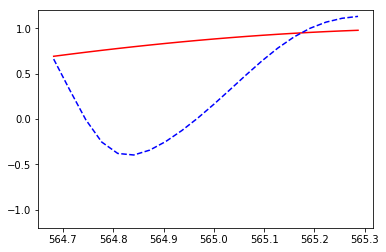

   [[565.31835786 565.35018885 565.38201984 565.41385083 565.44568182
  565.47751281 565.50934379 565.54117478 565.57300577 565.60483676
  565.63666775 565.66849874 565.70032973 565.73216071 565.7639917
  565.79582269 565.82765368 565.85948467 565.89131566 565.92314665]
 [565.95497763 565.98680862 566.01863961 566.0504706  566.08230159
  566.11413258 566.14596357 566.17779456 566.20962554 566.24145653
  566.27328752 566.30511851 566.3369495  566.36878049 566.40061148
  566.43244246 566.46427345 566.49610444 566.52793543 566.55976642]
 [566.59159741 566.6234284  566.65525938 566.68709037 566.71892136
  566.75075235 566.78258334 566.81441433 566.84624532 566.8780763
  566.90990729 566.94173828 566.97356927 567.00540026 567.03723125
  567.06906224 567.10089323 567.13272421 567.1645552  567.19638619]
 [567.22821718 567.26004817 567.29187916 567.32371015 567.35554113
  567.38737212 567.41920311 567.4510341  567.48286509 567.51469608
  567.54652707 567.57835805 567.61018904 567.64202003 567.

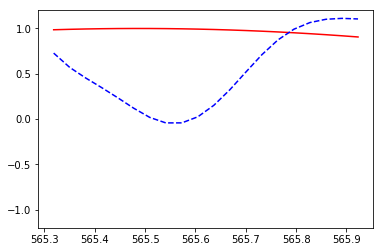

   [[565.95497763 565.98680862 566.01863961 566.0504706  566.08230159
  566.11413258 566.14596357 566.17779456 566.20962554 566.24145653
  566.27328752 566.30511851 566.3369495  566.36878049 566.40061148
  566.43244246 566.46427345 566.49610444 566.52793543 566.55976642]
 [566.59159741 566.6234284  566.65525938 566.68709037 566.71892136
  566.75075235 566.78258334 566.81441433 566.84624532 566.8780763
  566.90990729 566.94173828 566.97356927 567.00540026 567.03723125
  567.06906224 567.10089323 567.13272421 567.1645552  567.19638619]
 [567.22821718 567.26004817 567.29187916 567.32371015 567.35554113
  567.38737212 567.41920311 567.4510341  567.48286509 567.51469608
  567.54652707 567.57835805 567.61018904 567.64202003 567.67385102
  567.70568201 567.737513   567.76934399 567.80117497 567.83300596]
 [567.86483695 567.89666794 567.92849893 567.96032992 567.99216091
  568.02399189 568.05582288 568.08765387 568.11948486 568.15131585
  568.18314684 568.21497783 568.24680882 568.2786398  568

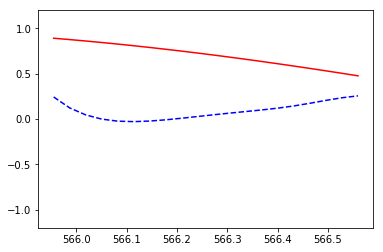

   [[566.59159741 566.6234284  566.65525938 566.68709037 566.71892136
  566.75075235 566.78258334 566.81441433 566.84624532 566.8780763
  566.90990729 566.94173828 566.97356927 567.00540026 567.03723125
  567.06906224 567.10089323 567.13272421 567.1645552  567.19638619]
 [567.22821718 567.26004817 567.29187916 567.32371015 567.35554113
  567.38737212 567.41920311 567.4510341  567.48286509 567.51469608
  567.54652707 567.57835805 567.61018904 567.64202003 567.67385102
  567.70568201 567.737513   567.76934399 567.80117497 567.83300596]
 [567.86483695 567.89666794 567.92849893 567.96032992 567.99216091
  568.02399189 568.05582288 568.08765387 568.11948486 568.15131585
  568.18314684 568.21497783 568.24680882 568.2786398  568.31047079
  568.34230178 568.37413277 568.40596376 568.43779475 568.46962574]
 [568.50145672 568.53328771 568.5651187  568.59694969 568.62878068
  568.66061167 568.69244266 568.72427364 568.75610463 568.78793562
  568.81976661 568.8515976  568.88342859 568.91525958 568

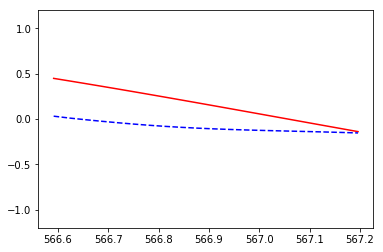

   [[567.22821718 567.26004817 567.29187916 567.32371015 567.35554113
  567.38737212 567.41920311 567.4510341  567.48286509 567.51469608
  567.54652707 567.57835805 567.61018904 567.64202003 567.67385102
  567.70568201 567.737513   567.76934399 567.80117497 567.83300596]
 [567.86483695 567.89666794 567.92849893 567.96032992 567.99216091
  568.02399189 568.05582288 568.08765387 568.11948486 568.15131585
  568.18314684 568.21497783 568.24680882 568.2786398  568.31047079
  568.34230178 568.37413277 568.40596376 568.43779475 568.46962574]
 [568.50145672 568.53328771 568.5651187  568.59694969 568.62878068
  568.66061167 568.69244266 568.72427364 568.75610463 568.78793562
  568.81976661 568.8515976  568.88342859 568.91525958 568.94709056
  568.97892155 569.01075254 569.04258353 569.07441452 569.10624551]
 [569.1380765  569.16990749 569.20173847 569.23356946 569.26540045
  569.29723144 569.32906243 569.36089342 569.39272441 569.42455539
  569.45638638 569.48821737 569.52004836 569.55187935 56

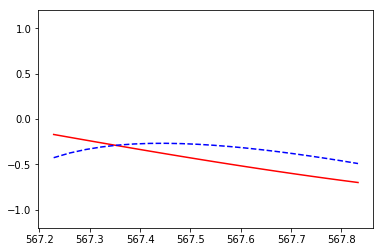

   [[567.86483695 567.89666794 567.92849893 567.96032992 567.99216091
  568.02399189 568.05582288 568.08765387 568.11948486 568.15131585
  568.18314684 568.21497783 568.24680882 568.2786398  568.31047079
  568.34230178 568.37413277 568.40596376 568.43779475 568.46962574]
 [568.50145672 568.53328771 568.5651187  568.59694969 568.62878068
  568.66061167 568.69244266 568.72427364 568.75610463 568.78793562
  568.81976661 568.8515976  568.88342859 568.91525958 568.94709056
  568.97892155 569.01075254 569.04258353 569.07441452 569.10624551]
 [569.1380765  569.16990749 569.20173847 569.23356946 569.26540045
  569.29723144 569.32906243 569.36089342 569.39272441 569.42455539
  569.45638638 569.48821737 569.52004836 569.55187935 569.58371034
  569.61554133 569.64737231 569.6792033  569.71103429 569.74286528]
 [569.77469627 569.80652726 569.83835825 569.87018923 569.90202022
  569.93385121 569.9656822  569.99751319 570.02934418 570.06117517
  570.09300616 570.12483714 570.15666813 570.18849912 57

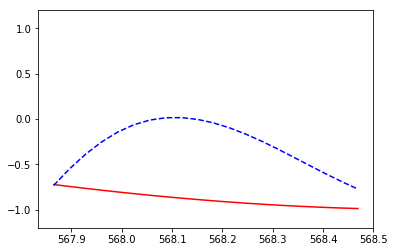

   0.023676205
   [[568.50145672 568.53328771 568.5651187  568.59694969 568.62878068
  568.66061167 568.69244266 568.72427364 568.75610463 568.78793562
  568.81976661 568.8515976  568.88342859 568.91525958 568.94709056
  568.97892155 569.01075254 569.04258353 569.07441452 569.10624551]
 [569.1380765  569.16990749 569.20173847 569.23356946 569.26540045
  569.29723144 569.32906243 569.36089342 569.39272441 569.42455539
  569.45638638 569.48821737 569.52004836 569.55187935 569.58371034
  569.61554133 569.64737231 569.6792033  569.71103429 569.74286528]
 [569.77469627 569.80652726 569.83835825 569.87018923 569.90202022
  569.93385121 569.9656822  569.99751319 570.02934418 570.06117517
  570.09300616 570.12483714 570.15666813 570.18849912 570.22033011
  570.2521611  570.28399209 570.31582308 570.34765406 570.37948505]
 [570.41131604 570.44314703 570.47497802 570.50680901 570.53864
  570.57047098 570.60230197 570.63413296 570.66596395 570.69779494
  570.72962593 570.76145692 570.7932879  570

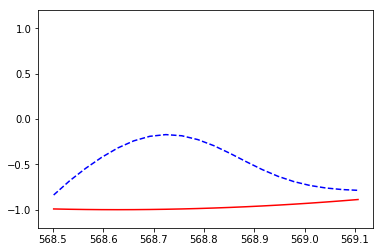

   [[569.1380765  569.16990749 569.20173847 569.23356946 569.26540045
  569.29723144 569.32906243 569.36089342 569.39272441 569.42455539
  569.45638638 569.48821737 569.52004836 569.55187935 569.58371034
  569.61554133 569.64737231 569.6792033  569.71103429 569.74286528]
 [569.77469627 569.80652726 569.83835825 569.87018923 569.90202022
  569.93385121 569.9656822  569.99751319 570.02934418 570.06117517
  570.09300616 570.12483714 570.15666813 570.18849912 570.22033011
  570.2521611  570.28399209 570.31582308 570.34765406 570.37948505]
 [570.41131604 570.44314703 570.47497802 570.50680901 570.53864
  570.57047098 570.60230197 570.63413296 570.66596395 570.69779494
  570.72962593 570.76145692 570.7932879  570.82511889 570.85694988
  570.88878087 570.92061186 570.95244285 570.98427384 571.01610483]
 [571.04793581 571.0797668  571.11159779 571.14342878 571.17525977
  571.20709076 571.23892175 571.27075273 571.30258372 571.33441471
  571.3662457  571.39807669 571.42990768 571.46173867 571.4

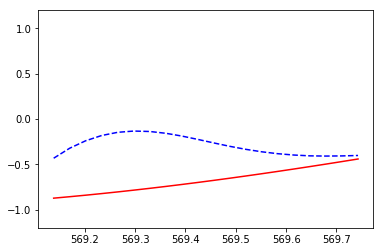

   [[569.77469627 569.80652726 569.83835825 569.87018923 569.90202022
  569.93385121 569.9656822  569.99751319 570.02934418 570.06117517
  570.09300616 570.12483714 570.15666813 570.18849912 570.22033011
  570.2521611  570.28399209 570.31582308 570.34765406 570.37948505]
 [570.41131604 570.44314703 570.47497802 570.50680901 570.53864
  570.57047098 570.60230197 570.63413296 570.66596395 570.69779494
  570.72962593 570.76145692 570.7932879  570.82511889 570.85694988
  570.88878087 570.92061186 570.95244285 570.98427384 571.01610483]
 [571.04793581 571.0797668  571.11159779 571.14342878 571.17525977
  571.20709076 571.23892175 571.27075273 571.30258372 571.33441471
  571.3662457  571.39807669 571.42990768 571.46173867 571.49356965
  571.52540064 571.55723163 571.58906262 571.62089361 571.6527246 ]
 [571.68455559 571.71638657 571.74821756 571.78004855 571.81187954
  571.84371053 571.87554152 571.90737251 571.9392035  571.97103448
  572.00286547 572.03469646 572.06652745 572.09835844 572.1

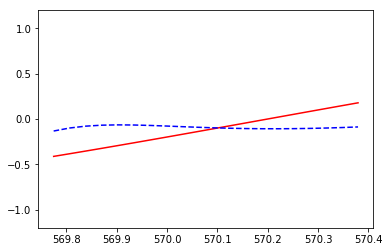

   [[570.41131604 570.44314703 570.47497802 570.50680901 570.53864
  570.57047098 570.60230197 570.63413296 570.66596395 570.69779494
  570.72962593 570.76145692 570.7932879  570.82511889 570.85694988
  570.88878087 570.92061186 570.95244285 570.98427384 571.01610483]
 [571.04793581 571.0797668  571.11159779 571.14342878 571.17525977
  571.20709076 571.23892175 571.27075273 571.30258372 571.33441471
  571.3662457  571.39807669 571.42990768 571.46173867 571.49356965
  571.52540064 571.55723163 571.58906262 571.62089361 571.6527246 ]
 [571.68455559 571.71638657 571.74821756 571.78004855 571.81187954
  571.84371053 571.87554152 571.90737251 571.9392035  571.97103448
  572.00286547 572.03469646 572.06652745 572.09835844 572.13018943
  572.16202042 572.1938514  572.22568239 572.25751338 572.28934437]
 [572.32117536 572.35300635 572.38483734 572.41666832 572.44849931
  572.4803303  572.51216129 572.54399228 572.57582327 572.60765426
  572.63948524 572.67131623 572.70314722 572.73497821 572.7

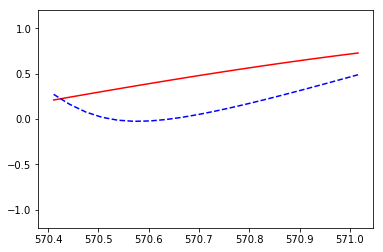

   [[571.04793581 571.0797668  571.11159779 571.14342878 571.17525977
  571.20709076 571.23892175 571.27075273 571.30258372 571.33441471
  571.3662457  571.39807669 571.42990768 571.46173867 571.49356965
  571.52540064 571.55723163 571.58906262 571.62089361 571.6527246 ]
 [571.68455559 571.71638657 571.74821756 571.78004855 571.81187954
  571.84371053 571.87554152 571.90737251 571.9392035  571.97103448
  572.00286547 572.03469646 572.06652745 572.09835844 572.13018943
  572.16202042 572.1938514  572.22568239 572.25751338 572.28934437]
 [572.32117536 572.35300635 572.38483734 572.41666832 572.44849931
  572.4803303  572.51216129 572.54399228 572.57582327 572.60765426
  572.63948524 572.67131623 572.70314722 572.73497821 572.7668092
  572.79864019 572.83047118 572.86230216 572.89413315 572.92596414]
 [572.95779513 572.98962612 573.02145711 573.0532881  573.08511909
  573.11695007 573.14878106 573.18061205 573.21244304 573.24427403
  573.27610502 573.30793601 573.33976699 573.37159798 573

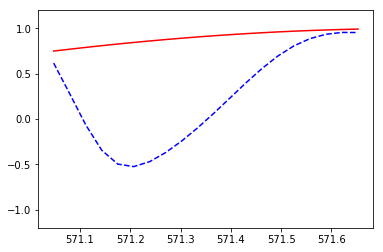

   [[571.68455559 571.71638657 571.74821756 571.78004855 571.81187954
  571.84371053 571.87554152 571.90737251 571.9392035  571.97103448
  572.00286547 572.03469646 572.06652745 572.09835844 572.13018943
  572.16202042 572.1938514  572.22568239 572.25751338 572.28934437]
 [572.32117536 572.35300635 572.38483734 572.41666832 572.44849931
  572.4803303  572.51216129 572.54399228 572.57582327 572.60765426
  572.63948524 572.67131623 572.70314722 572.73497821 572.7668092
  572.79864019 572.83047118 572.86230216 572.89413315 572.92596414]
 [572.95779513 572.98962612 573.02145711 573.0532881  573.08511909
  573.11695007 573.14878106 573.18061205 573.21244304 573.24427403
  573.27610502 573.30793601 573.33976699 573.37159798 573.40342897
  573.43525996 573.46709095 573.49892194 573.53075293 573.56258391]
 [573.5944149  573.62624589 573.65807688 573.68990787 573.72173886
  573.75356985 573.78540083 573.81723182 573.84906281 573.8808938
  573.91272479 573.94455578 573.97638677 574.00821776 574.

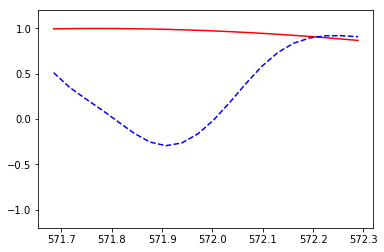

   [[572.32117536 572.35300635 572.38483734 572.41666832 572.44849931
  572.4803303  572.51216129 572.54399228 572.57582327 572.60765426
  572.63948524 572.67131623 572.70314722 572.73497821 572.7668092
  572.79864019 572.83047118 572.86230216 572.89413315 572.92596414]
 [572.95779513 572.98962612 573.02145711 573.0532881  573.08511909
  573.11695007 573.14878106 573.18061205 573.21244304 573.24427403
  573.27610502 573.30793601 573.33976699 573.37159798 573.40342897
  573.43525996 573.46709095 573.49892194 573.53075293 573.56258391]
 [573.5944149  573.62624589 573.65807688 573.68990787 573.72173886
  573.75356985 573.78540083 573.81723182 573.84906281 573.8808938
  573.91272479 573.94455578 573.97638677 574.00821776 574.04004874
  574.07187973 574.10371072 574.13554171 574.1673727  574.19920369]
 [574.23103468 574.26286566 574.29469665 574.32652764 574.35835863
  574.39018962 574.42202061 574.4538516  574.48568258 574.51751357
  574.54934456 574.58117555 574.61300654 574.64483753 574.

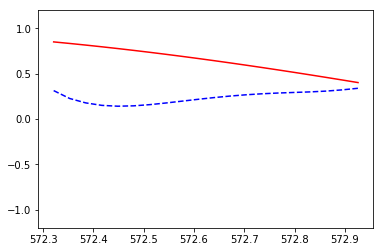

   [[572.95779513 572.98962612 573.02145711 573.0532881  573.08511909
  573.11695007 573.14878106 573.18061205 573.21244304 573.24427403
  573.27610502 573.30793601 573.33976699 573.37159798 573.40342897
  573.43525996 573.46709095 573.49892194 573.53075293 573.56258391]
 [573.5944149  573.62624589 573.65807688 573.68990787 573.72173886
  573.75356985 573.78540083 573.81723182 573.84906281 573.8808938
  573.91272479 573.94455578 573.97638677 574.00821776 574.04004874
  574.07187973 574.10371072 574.13554171 574.1673727  574.19920369]
 [574.23103468 574.26286566 574.29469665 574.32652764 574.35835863
  574.39018962 574.42202061 574.4538516  574.48568258 574.51751357
  574.54934456 574.58117555 574.61300654 574.64483753 574.67666852
  574.7084995  574.74033049 574.77216148 574.80399247 574.83582346]
 [574.86765445 574.89948544 574.93131643 574.96314741 574.9949784
  575.02680939 575.05864038 575.09047137 575.12230236 575.15413335
  575.18596433 575.21779532 575.24962631 575.2814573  575.

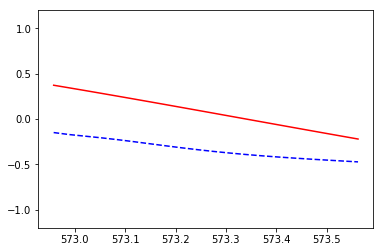

   [[573.5944149  573.62624589 573.65807688 573.68990787 573.72173886
  573.75356985 573.78540083 573.81723182 573.84906281 573.8808938
  573.91272479 573.94455578 573.97638677 574.00821776 574.04004874
  574.07187973 574.10371072 574.13554171 574.1673727  574.19920369]
 [574.23103468 574.26286566 574.29469665 574.32652764 574.35835863
  574.39018962 574.42202061 574.4538516  574.48568258 574.51751357
  574.54934456 574.58117555 574.61300654 574.64483753 574.67666852
  574.7084995  574.74033049 574.77216148 574.80399247 574.83582346]
 [574.86765445 574.89948544 574.93131643 574.96314741 574.9949784
  575.02680939 575.05864038 575.09047137 575.12230236 575.15413335
  575.18596433 575.21779532 575.24962631 575.2814573  575.31328829
  575.34511928 575.37695027 575.40878125 575.44061224 575.47244323]
 [575.50427422 575.53610521 575.5679362  575.59976719 575.63159817
  575.66342916 575.69526015 575.72709114 575.75892213 575.79075312
  575.82258411 575.8544151  575.88624608 575.91807707 575.

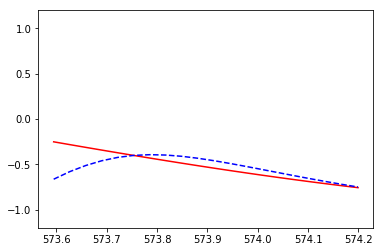

   [[574.23103468 574.26286566 574.29469665 574.32652764 574.35835863
  574.39018962 574.42202061 574.4538516  574.48568258 574.51751357
  574.54934456 574.58117555 574.61300654 574.64483753 574.67666852
  574.7084995  574.74033049 574.77216148 574.80399247 574.83582346]
 [574.86765445 574.89948544 574.93131643 574.96314741 574.9949784
  575.02680939 575.05864038 575.09047137 575.12230236 575.15413335
  575.18596433 575.21779532 575.24962631 575.2814573  575.31328829
  575.34511928 575.37695027 575.40878125 575.44061224 575.47244323]
 [575.50427422 575.53610521 575.5679362  575.59976719 575.63159817
  575.66342916 575.69526015 575.72709114 575.75892213 575.79075312
  575.82258411 575.8544151  575.88624608 575.91807707 575.94990806
  575.98173905 576.01357004 576.04540103 576.07723202 576.109063  ]
 [576.14089399 576.17272498 576.20455597 576.23638696 576.26821795
  576.30004894 576.33187992 576.36371091 576.3955419  576.42737289
  576.45920388 576.49103487 576.52286586 576.55469684 576

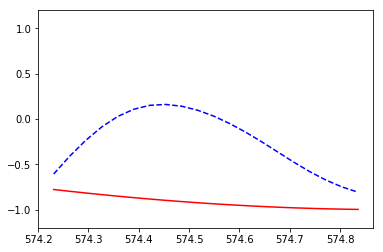

   0.017859008
   [[574.86765445 574.89948544 574.93131643 574.96314741 574.9949784
  575.02680939 575.05864038 575.09047137 575.12230236 575.15413335
  575.18596433 575.21779532 575.24962631 575.2814573  575.31328829
  575.34511928 575.37695027 575.40878125 575.44061224 575.47244323]
 [575.50427422 575.53610521 575.5679362  575.59976719 575.63159817
  575.66342916 575.69526015 575.72709114 575.75892213 575.79075312
  575.82258411 575.8544151  575.88624608 575.91807707 575.94990806
  575.98173905 576.01357004 576.04540103 576.07723202 576.109063  ]
 [576.14089399 576.17272498 576.20455597 576.23638696 576.26821795
  576.30004894 576.33187992 576.36371091 576.3955419  576.42737289
  576.45920388 576.49103487 576.52286586 576.55469684 576.58652783
  576.61835882 576.65018981 576.6820208  576.71385179 576.74568278]
 [576.77751377 576.80934475 576.84117574 576.87300673 576.90483772
  576.93666871 576.9684997  577.00033069 577.03216167 577.06399266
  577.09582365 577.12765464 577.15948563 5

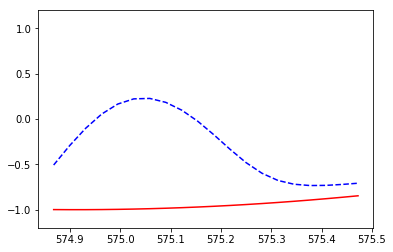

   [[575.50427422 575.53610521 575.5679362  575.59976719 575.63159817
  575.66342916 575.69526015 575.72709114 575.75892213 575.79075312
  575.82258411 575.8544151  575.88624608 575.91807707 575.94990806
  575.98173905 576.01357004 576.04540103 576.07723202 576.109063  ]
 [576.14089399 576.17272498 576.20455597 576.23638696 576.26821795
  576.30004894 576.33187992 576.36371091 576.3955419  576.42737289
  576.45920388 576.49103487 576.52286586 576.55469684 576.58652783
  576.61835882 576.65018981 576.6820208  576.71385179 576.74568278]
 [576.77751377 576.80934475 576.84117574 576.87300673 576.90483772
  576.93666871 576.9684997  577.00033069 577.03216167 577.06399266
  577.09582365 577.12765464 577.15948563 577.19131662 577.22314761
  577.25497859 577.28680958 577.31864057 577.35047156 577.38230255]
 [577.41413354 577.44596453 577.47779551 577.5096265  577.54145749
  577.57328848 577.60511947 577.63695046 577.66878145 577.70061243
  577.73244342 577.76427441 577.7961054  577.82793639 57

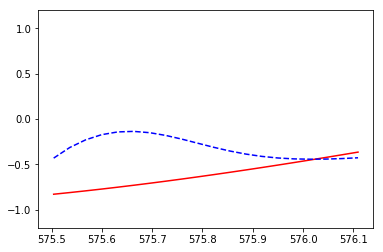

   [[576.14089399 576.17272498 576.20455597 576.23638696 576.26821795
  576.30004894 576.33187992 576.36371091 576.3955419  576.42737289
  576.45920388 576.49103487 576.52286586 576.55469684 576.58652783
  576.61835882 576.65018981 576.6820208  576.71385179 576.74568278]
 [576.77751377 576.80934475 576.84117574 576.87300673 576.90483772
  576.93666871 576.9684997  577.00033069 577.03216167 577.06399266
  577.09582365 577.12765464 577.15948563 577.19131662 577.22314761
  577.25497859 577.28680958 577.31864057 577.35047156 577.38230255]
 [577.41413354 577.44596453 577.47779551 577.5096265  577.54145749
  577.57328848 577.60511947 577.63695046 577.66878145 577.70061243
  577.73244342 577.76427441 577.7961054  577.82793639 577.85976738
  577.89159837 577.92342936 577.95526034 577.98709133 578.01892232]
 [578.05075331 578.0825843  578.11441529 578.14624628 578.17807726
  578.20990825 578.24173924 578.27357023 578.30540122 578.33723221
  578.3690632  578.40089418 578.43272517 578.46455616 57

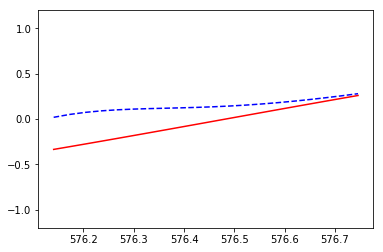

   [[576.77751377 576.80934475 576.84117574 576.87300673 576.90483772
  576.93666871 576.9684997  577.00033069 577.03216167 577.06399266
  577.09582365 577.12765464 577.15948563 577.19131662 577.22314761
  577.25497859 577.28680958 577.31864057 577.35047156 577.38230255]
 [577.41413354 577.44596453 577.47779551 577.5096265  577.54145749
  577.57328848 577.60511947 577.63695046 577.66878145 577.70061243
  577.73244342 577.76427441 577.7961054  577.82793639 577.85976738
  577.89159837 577.92342936 577.95526034 577.98709133 578.01892232]
 [578.05075331 578.0825843  578.11441529 578.14624628 578.17807726
  578.20990825 578.24173924 578.27357023 578.30540122 578.33723221
  578.3690632  578.40089418 578.43272517 578.46455616 578.49638715
  578.52821814 578.56004913 578.59188012 578.6237111  578.65554209]
 [578.68737308 578.71920407 578.75103506 578.78286605 578.81469704
  578.84652803 578.87835901 578.91019    578.94202099 578.97385198
  579.00568297 579.03751396 579.06934495 579.10117593 57

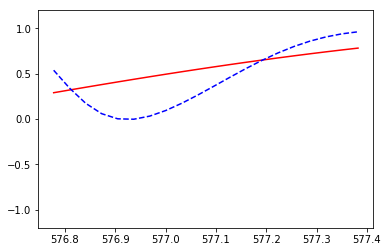

   [[577.41413354 577.44596453 577.47779551 577.5096265  577.54145749
  577.57328848 577.60511947 577.63695046 577.66878145 577.70061243
  577.73244342 577.76427441 577.7961054  577.82793639 577.85976738
  577.89159837 577.92342936 577.95526034 577.98709133 578.01892232]
 [578.05075331 578.0825843  578.11441529 578.14624628 578.17807726
  578.20990825 578.24173924 578.27357023 578.30540122 578.33723221
  578.3690632  578.40089418 578.43272517 578.46455616 578.49638715
  578.52821814 578.56004913 578.59188012 578.6237111  578.65554209]
 [578.68737308 578.71920407 578.75103506 578.78286605 578.81469704
  578.84652803 578.87835901 578.91019    578.94202099 578.97385198
  579.00568297 579.03751396 579.06934495 579.10117593 579.13300692
  579.16483791 579.1966689  579.22849989 579.26033088 579.29216187]
 [579.32399285 579.35582384 579.38765483 579.41948582 579.45131681
  579.4831478  579.51497879 579.54680977 579.57864076 579.61047175
  579.64230274 579.67413373 579.70596472 579.73779571 57

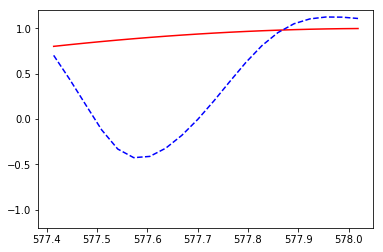

   [[578.05075331 578.0825843  578.11441529 578.14624628 578.17807726
  578.20990825 578.24173924 578.27357023 578.30540122 578.33723221
  578.3690632  578.40089418 578.43272517 578.46455616 578.49638715
  578.52821814 578.56004913 578.59188012 578.6237111  578.65554209]
 [578.68737308 578.71920407 578.75103506 578.78286605 578.81469704
  578.84652803 578.87835901 578.91019    578.94202099 578.97385198
  579.00568297 579.03751396 579.06934495 579.10117593 579.13300692
  579.16483791 579.1966689  579.22849989 579.26033088 579.29216187]
 [579.32399285 579.35582384 579.38765483 579.41948582 579.45131681
  579.4831478  579.51497879 579.54680977 579.57864076 579.61047175
  579.64230274 579.67413373 579.70596472 579.73779571 579.7696267
  579.80145768 579.83328867 579.86511966 579.89695065 579.92878164]
 [579.96061263 579.99244362 580.0242746  580.05610559 580.08793658
  580.11976757 580.15159856 580.18342955 580.21526054 580.24709152
  580.27892251 580.3107535  580.34258449 580.37441548 580

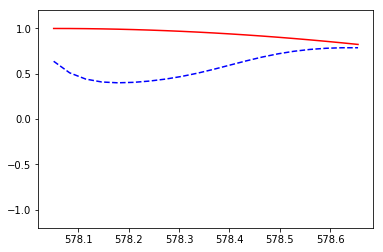

   [[578.68737308 578.71920407 578.75103506 578.78286605 578.81469704
  578.84652803 578.87835901 578.91019    578.94202099 578.97385198
  579.00568297 579.03751396 579.06934495 579.10117593 579.13300692
  579.16483791 579.1966689  579.22849989 579.26033088 579.29216187]
 [579.32399285 579.35582384 579.38765483 579.41948582 579.45131681
  579.4831478  579.51497879 579.54680977 579.57864076 579.61047175
  579.64230274 579.67413373 579.70596472 579.73779571 579.7696267
  579.80145768 579.83328867 579.86511966 579.89695065 579.92878164]
 [579.96061263 579.99244362 580.0242746  580.05610559 580.08793658
  580.11976757 580.15159856 580.18342955 580.21526054 580.24709152
  580.27892251 580.3107535  580.34258449 580.37441548 580.40624647
  580.43807746 580.46990844 580.50173943 580.53357042 580.56540141]
 [580.5972324  580.62906339 580.66089438 580.69272537 580.72455635
  580.75638734 580.78821833 580.82004932 580.85188031 580.8837113
  580.91554229 580.94737327 580.97920426 581.01103525 581.

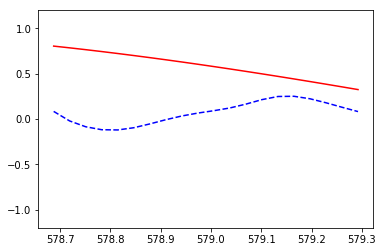

   [[579.32399285 579.35582384 579.38765483 579.41948582 579.45131681
  579.4831478  579.51497879 579.54680977 579.57864076 579.61047175
  579.64230274 579.67413373 579.70596472 579.73779571 579.7696267
  579.80145768 579.83328867 579.86511966 579.89695065 579.92878164]
 [579.96061263 579.99244362 580.0242746  580.05610559 580.08793658
  580.11976757 580.15159856 580.18342955 580.21526054 580.24709152
  580.27892251 580.3107535  580.34258449 580.37441548 580.40624647
  580.43807746 580.46990844 580.50173943 580.53357042 580.56540141]
 [580.5972324  580.62906339 580.66089438 580.69272537 580.72455635
  580.75638734 580.78821833 580.82004932 580.85188031 580.8837113
  580.91554229 580.94737327 580.97920426 581.01103525 581.04286624
  581.07469723 581.10652822 581.13835921 581.17019019 581.20202118]
 [581.23385217 581.26568316 581.29751415 581.32934514 581.36117613
  581.39300711 581.4248381  581.45666909 581.48850008 581.52033107
  581.55216206 581.58399305 581.61582404 581.64765502 581.

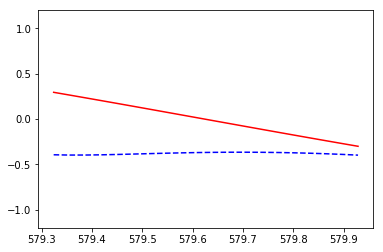

   [[579.96061263 579.99244362 580.0242746  580.05610559 580.08793658
  580.11976757 580.15159856 580.18342955 580.21526054 580.24709152
  580.27892251 580.3107535  580.34258449 580.37441548 580.40624647
  580.43807746 580.46990844 580.50173943 580.53357042 580.56540141]
 [580.5972324  580.62906339 580.66089438 580.69272537 580.72455635
  580.75638734 580.78821833 580.82004932 580.85188031 580.8837113
  580.91554229 580.94737327 580.97920426 581.01103525 581.04286624
  581.07469723 581.10652822 581.13835921 581.17019019 581.20202118]
 [581.23385217 581.26568316 581.29751415 581.32934514 581.36117613
  581.39300711 581.4248381  581.45666909 581.48850008 581.52033107
  581.55216206 581.58399305 581.61582404 581.64765502 581.67948601
  581.711317   581.74314799 581.77497898 581.80680997 581.83864096]
 [581.87047194 581.90230293 581.93413392 581.96596491 581.9977959
  582.02962689 582.06145788 582.09328886 582.12511985 582.15695084
  582.18878183 582.22061282 582.25244381 582.2842748  582.

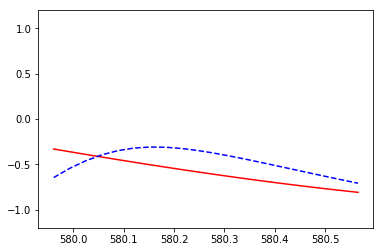

   [[580.5972324  580.62906339 580.66089438 580.69272537 580.72455635
  580.75638734 580.78821833 580.82004932 580.85188031 580.8837113
  580.91554229 580.94737327 580.97920426 581.01103525 581.04286624
  581.07469723 581.10652822 581.13835921 581.17019019 581.20202118]
 [581.23385217 581.26568316 581.29751415 581.32934514 581.36117613
  581.39300711 581.4248381  581.45666909 581.48850008 581.52033107
  581.55216206 581.58399305 581.61582404 581.64765502 581.67948601
  581.711317   581.74314799 581.77497898 581.80680997 581.83864096]
 [581.87047194 581.90230293 581.93413392 581.96596491 581.9977959
  582.02962689 582.06145788 582.09328886 582.12511985 582.15695084
  582.18878183 582.22061282 582.25244381 582.2842748  582.31610578
  582.34793677 582.37976776 582.41159875 582.44342974 582.47526073]
 [582.50709172 582.5389227  582.57075369 582.60258468 582.63441567
  582.66624666 582.69807765 582.72990864 582.76173963 582.79357061
  582.8254016  582.85723259 582.88906358 582.92089457 582.

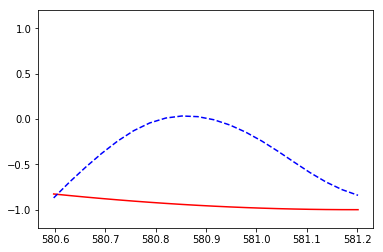

   0.030691536
   [[581.23385217 581.26568316 581.29751415 581.32934514 581.36117613
  581.39300711 581.4248381  581.45666909 581.48850008 581.52033107
  581.55216206 581.58399305 581.61582404 581.64765502 581.67948601
  581.711317   581.74314799 581.77497898 581.80680997 581.83864096]
 [581.87047194 581.90230293 581.93413392 581.96596491 581.9977959
  582.02962689 582.06145788 582.09328886 582.12511985 582.15695084
  582.18878183 582.22061282 582.25244381 582.2842748  582.31610578
  582.34793677 582.37976776 582.41159875 582.44342974 582.47526073]
 [582.50709172 582.5389227  582.57075369 582.60258468 582.63441567
  582.66624666 582.69807765 582.72990864 582.76173963 582.79357061
  582.8254016  582.85723259 582.88906358 582.92089457 582.95272556
  582.98455655 583.01638753 583.04821852 583.08004951 583.1118805 ]
 [583.14371149 583.17554248 583.20737347 583.23920445 583.27103544
  583.30286643 583.33469742 583.36652841 583.3983594  583.43019039
  583.46202137 583.49385236 583.52568335 5

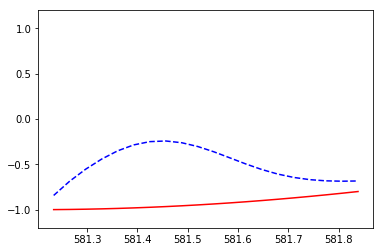

   [[581.87047194 581.90230293 581.93413392 581.96596491 581.9977959
  582.02962689 582.06145788 582.09328886 582.12511985 582.15695084
  582.18878183 582.22061282 582.25244381 582.2842748  582.31610578
  582.34793677 582.37976776 582.41159875 582.44342974 582.47526073]
 [582.50709172 582.5389227  582.57075369 582.60258468 582.63441567
  582.66624666 582.69807765 582.72990864 582.76173963 582.79357061
  582.8254016  582.85723259 582.88906358 582.92089457 582.95272556
  582.98455655 583.01638753 583.04821852 583.08004951 583.1118805 ]
 [583.14371149 583.17554248 583.20737347 583.23920445 583.27103544
  583.30286643 583.33469742 583.36652841 583.3983594  583.43019039
  583.46202137 583.49385236 583.52568335 583.55751434 583.58934533
  583.62117632 583.65300731 583.6848383  583.71666928 583.74850027]
 [583.78033126 583.81216225 583.84399324 583.87582423 583.90765522
  583.9394862  583.97131719 584.00314818 584.03497917 584.06681016
  584.09864115 584.13047214 584.16230312 584.19413411 584

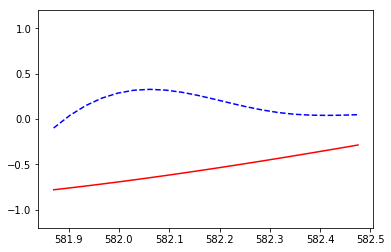

   [[582.50709172 582.5389227  582.57075369 582.60258468 582.63441567
  582.66624666 582.69807765 582.72990864 582.76173963 582.79357061
  582.8254016  582.85723259 582.88906358 582.92089457 582.95272556
  582.98455655 583.01638753 583.04821852 583.08004951 583.1118805 ]
 [583.14371149 583.17554248 583.20737347 583.23920445 583.27103544
  583.30286643 583.33469742 583.36652841 583.3983594  583.43019039
  583.46202137 583.49385236 583.52568335 583.55751434 583.58934533
  583.62117632 583.65300731 583.6848383  583.71666928 583.74850027]
 [583.78033126 583.81216225 583.84399324 583.87582423 583.90765522
  583.9394862  583.97131719 584.00314818 584.03497917 584.06681016
  584.09864115 584.13047214 584.16230312 584.19413411 584.2259651
  584.25779609 584.28962708 584.32145807 584.35328906 584.38512004]
 [584.41695103 584.44878202 584.48061301 584.512444   584.54427499
  584.57610598 584.60793697 584.63976795 584.67159894 584.70342993
  584.73526092 584.76709191 584.7989229  584.83075389 584

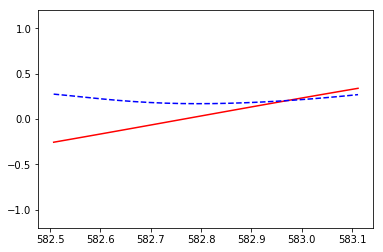

   [[583.14371149 583.17554248 583.20737347 583.23920445 583.27103544
  583.30286643 583.33469742 583.36652841 583.3983594  583.43019039
  583.46202137 583.49385236 583.52568335 583.55751434 583.58934533
  583.62117632 583.65300731 583.6848383  583.71666928 583.74850027]
 [583.78033126 583.81216225 583.84399324 583.87582423 583.90765522
  583.9394862  583.97131719 584.00314818 584.03497917 584.06681016
  584.09864115 584.13047214 584.16230312 584.19413411 584.2259651
  584.25779609 584.28962708 584.32145807 584.35328906 584.38512004]
 [584.41695103 584.44878202 584.48061301 584.512444   584.54427499
  584.57610598 584.60793697 584.63976795 584.67159894 584.70342993
  584.73526092 584.76709191 584.7989229  584.83075389 584.86258487
  584.89441586 584.92624685 584.95807784 584.98990883 585.02173982]
 [585.05357081 585.08540179 585.11723278 585.14906377 585.18089476
  585.21272575 585.24455674 585.27638773 585.30821871 585.3400497
  585.37188069 585.40371168 585.43554267 585.46737366 585.

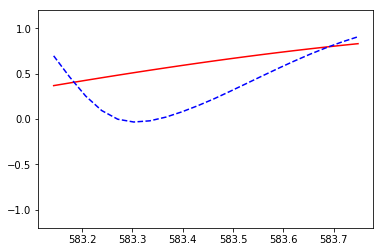

   [[583.78033126 583.81216225 583.84399324 583.87582423 583.90765522
  583.9394862  583.97131719 584.00314818 584.03497917 584.06681016
  584.09864115 584.13047214 584.16230312 584.19413411 584.2259651
  584.25779609 584.28962708 584.32145807 584.35328906 584.38512004]
 [584.41695103 584.44878202 584.48061301 584.512444   584.54427499
  584.57610598 584.60793697 584.63976795 584.67159894 584.70342993
  584.73526092 584.76709191 584.7989229  584.83075389 584.86258487
  584.89441586 584.92624685 584.95807784 584.98990883 585.02173982]
 [585.05357081 585.08540179 585.11723278 585.14906377 585.18089476
  585.21272575 585.24455674 585.27638773 585.30821871 585.3400497
  585.37188069 585.40371168 585.43554267 585.46737366 585.49920465
  585.53103564 585.56286662 585.59469761 585.6265286  585.65835959]
 [585.69019058 585.72202157 585.75385256 585.78568354 585.81751453
  585.84934552 585.88117651 585.9130075  585.94483849 585.97666948
  586.00850046 586.04033145 586.07216244 586.10399343 586.

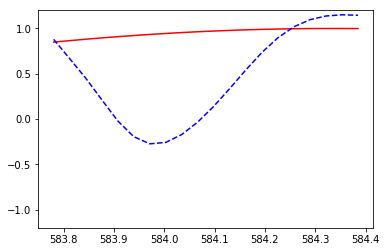

   [[584.41695103 584.44878202 584.48061301 584.512444   584.54427499
  584.57610598 584.60793697 584.63976795 584.67159894 584.70342993
  584.73526092 584.76709191 584.7989229  584.83075389 584.86258487
  584.89441586 584.92624685 584.95807784 584.98990883 585.02173982]
 [585.05357081 585.08540179 585.11723278 585.14906377 585.18089476
  585.21272575 585.24455674 585.27638773 585.30821871 585.3400497
  585.37188069 585.40371168 585.43554267 585.46737366 585.49920465
  585.53103564 585.56286662 585.59469761 585.6265286  585.65835959]
 [585.69019058 585.72202157 585.75385256 585.78568354 585.81751453
  585.84934552 585.88117651 585.9130075  585.94483849 585.97666948
  586.00850046 586.04033145 586.07216244 586.10399343 586.13582442
  586.16765541 586.1994864  586.23131738 586.26314837 586.29497936]
 [586.32681035 586.35864134 586.39047233 586.42230332 586.45413431
  586.48596529 586.51779628 586.54962727 586.58145826 586.61328925
  586.64512024 586.67695123 586.70878221 586.7406132  586

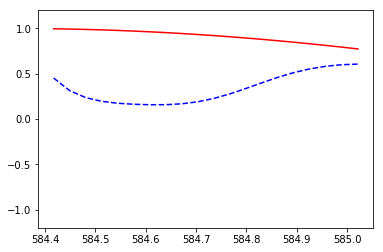

   [[585.05357081 585.08540179 585.11723278 585.14906377 585.18089476
  585.21272575 585.24455674 585.27638773 585.30821871 585.3400497
  585.37188069 585.40371168 585.43554267 585.46737366 585.49920465
  585.53103564 585.56286662 585.59469761 585.6265286  585.65835959]
 [585.69019058 585.72202157 585.75385256 585.78568354 585.81751453
  585.84934552 585.88117651 585.9130075  585.94483849 585.97666948
  586.00850046 586.04033145 586.07216244 586.10399343 586.13582442
  586.16765541 586.1994864  586.23131738 586.26314837 586.29497936]
 [586.32681035 586.35864134 586.39047233 586.42230332 586.45413431
  586.48596529 586.51779628 586.54962727 586.58145826 586.61328925
  586.64512024 586.67695123 586.70878221 586.7406132  586.77244419
  586.80427518 586.83610617 586.86793716 586.89976815 586.93159913]
 [586.96343012 586.99526111 587.0270921  587.05892309 587.09075408
  587.12258507 587.15441605 587.18624704 587.21807803 587.24990902
  587.28174001 587.313571   587.34540199 587.37723297 587

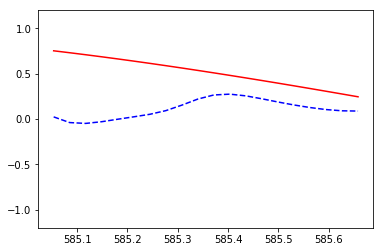

   [[585.69019058 585.72202157 585.75385256 585.78568354 585.81751453
  585.84934552 585.88117651 585.9130075  585.94483849 585.97666948
  586.00850046 586.04033145 586.07216244 586.10399343 586.13582442
  586.16765541 586.1994864  586.23131738 586.26314837 586.29497936]
 [586.32681035 586.35864134 586.39047233 586.42230332 586.45413431
  586.48596529 586.51779628 586.54962727 586.58145826 586.61328925
  586.64512024 586.67695123 586.70878221 586.7406132  586.77244419
  586.80427518 586.83610617 586.86793716 586.89976815 586.93159913]
 [586.96343012 586.99526111 587.0270921  587.05892309 587.09075408
  587.12258507 587.15441605 587.18624704 587.21807803 587.24990902
  587.28174001 587.313571   587.34540199 587.37723297 587.40906396
  587.44089495 587.47272594 587.50455693 587.53638792 587.56821891]
 [587.6000499  587.63188088 587.66371187 587.69554286 587.72737385
  587.75920484 587.79103583 587.82286682 587.8546978  587.88652879
  587.91835978 587.95019077 587.98202176 588.01385275 58

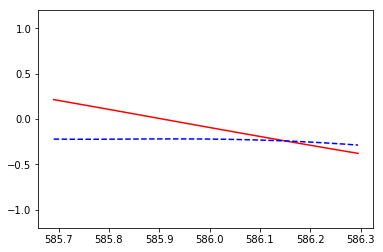

   [[586.32681035 586.35864134 586.39047233 586.42230332 586.45413431
  586.48596529 586.51779628 586.54962727 586.58145826 586.61328925
  586.64512024 586.67695123 586.70878221 586.7406132  586.77244419
  586.80427518 586.83610617 586.86793716 586.89976815 586.93159913]
 [586.96343012 586.99526111 587.0270921  587.05892309 587.09075408
  587.12258507 587.15441605 587.18624704 587.21807803 587.24990902
  587.28174001 587.313571   587.34540199 587.37723297 587.40906396
  587.44089495 587.47272594 587.50455693 587.53638792 587.56821891]
 [587.6000499  587.63188088 587.66371187 587.69554286 587.72737385
  587.75920484 587.79103583 587.82286682 587.8546978  587.88652879
  587.91835978 587.95019077 587.98202176 588.01385275 588.04568374
  588.07751472 588.10934571 588.1411767  588.17300769 588.20483868]
 [588.23666967 588.26850066 588.30033164 588.33216263 588.36399362
  588.39582461 588.4276556  588.45948659 588.49131758 588.52314857
  588.55497955 588.58681054 588.61864153 588.65047252 58

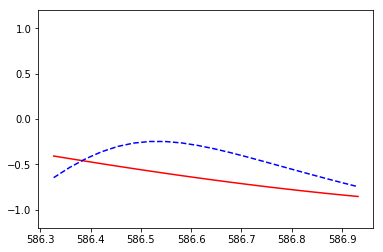

   [[586.96343012 586.99526111 587.0270921  587.05892309 587.09075408
  587.12258507 587.15441605 587.18624704 587.21807803 587.24990902
  587.28174001 587.313571   587.34540199 587.37723297 587.40906396
  587.44089495 587.47272594 587.50455693 587.53638792 587.56821891]
 [587.6000499  587.63188088 587.66371187 587.69554286 587.72737385
  587.75920484 587.79103583 587.82286682 587.8546978  587.88652879
  587.91835978 587.95019077 587.98202176 588.01385275 588.04568374
  588.07751472 588.10934571 588.1411767  588.17300769 588.20483868]
 [588.23666967 588.26850066 588.30033164 588.33216263 588.36399362
  588.39582461 588.4276556  588.45948659 588.49131758 588.52314857
  588.55497955 588.58681054 588.61864153 588.65047252 588.68230351
  588.7141345  588.74596549 588.77779647 588.80962746 588.84145845]
 [588.87328944 588.90512043 588.93695142 588.96878241 589.00061339
  589.03244438 589.06427537 589.09610636 589.12793735 589.15976834
  589.19159933 589.22343031 589.2552613  589.28709229 58

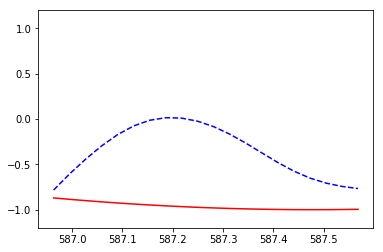

   0.027121024
   [[587.6000499  587.63188088 587.66371187 587.69554286 587.72737385
  587.75920484 587.79103583 587.82286682 587.8546978  587.88652879
  587.91835978 587.95019077 587.98202176 588.01385275 588.04568374
  588.07751472 588.10934571 588.1411767  588.17300769 588.20483868]
 [588.23666967 588.26850066 588.30033164 588.33216263 588.36399362
  588.39582461 588.4276556  588.45948659 588.49131758 588.52314857
  588.55497955 588.58681054 588.61864153 588.65047252 588.68230351
  588.7141345  588.74596549 588.77779647 588.80962746 588.84145845]
 [588.87328944 588.90512043 588.93695142 588.96878241 589.00061339
  589.03244438 589.06427537 589.09610636 589.12793735 589.15976834
  589.19159933 589.22343031 589.2552613  589.28709229 589.31892328
  589.35075427 589.38258526 589.41441625 589.44624724 589.47807822]
 [589.50990921 589.5417402  589.57357119 589.60540218 589.63723317
  589.66906416 589.70089514 589.73272613 589.76455712 589.79638811
  589.8282191  589.86005009 589.89188108 

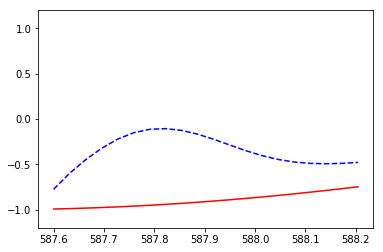

   [[588.23666967 588.26850066 588.30033164 588.33216263 588.36399362
  588.39582461 588.4276556  588.45948659 588.49131758 588.52314857
  588.55497955 588.58681054 588.61864153 588.65047252 588.68230351
  588.7141345  588.74596549 588.77779647 588.80962746 588.84145845]
 [588.87328944 588.90512043 588.93695142 588.96878241 589.00061339
  589.03244438 589.06427537 589.09610636 589.12793735 589.15976834
  589.19159933 589.22343031 589.2552613  589.28709229 589.31892328
  589.35075427 589.38258526 589.41441625 589.44624724 589.47807822]
 [589.50990921 589.5417402  589.57357119 589.60540218 589.63723317
  589.66906416 589.70089514 589.73272613 589.76455712 589.79638811
  589.8282191  589.86005009 589.89188108 589.92371206 589.95554305
  589.98737404 590.01920503 590.05103602 590.08286701 590.114698  ]
 [590.14652898 590.17835997 590.21019096 590.24202195 590.27385294
  590.30568393 590.33751492 590.36934591 590.40117689 590.43300788
  590.46483887 590.49666986 590.52850085 590.56033184 59

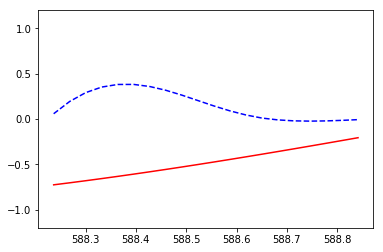

   [[588.87328944 588.90512043 588.93695142 588.96878241 589.00061339
  589.03244438 589.06427537 589.09610636 589.12793735 589.15976834
  589.19159933 589.22343031 589.2552613  589.28709229 589.31892328
  589.35075427 589.38258526 589.41441625 589.44624724 589.47807822]
 [589.50990921 589.5417402  589.57357119 589.60540218 589.63723317
  589.66906416 589.70089514 589.73272613 589.76455712 589.79638811
  589.8282191  589.86005009 589.89188108 589.92371206 589.95554305
  589.98737404 590.01920503 590.05103602 590.08286701 590.114698  ]
 [590.14652898 590.17835997 590.21019096 590.24202195 590.27385294
  590.30568393 590.33751492 590.36934591 590.40117689 590.43300788
  590.46483887 590.49666986 590.52850085 590.56033184 590.59216283
  590.62399381 590.6558248  590.68765579 590.71948678 590.75131777]
 [590.78314876 590.81497975 590.84681073 590.87864172 590.91047271
  590.9423037  590.97413469 591.00596568 591.03779667 591.06962765
  591.10145864 591.13328963 591.16512062 591.19695161 59

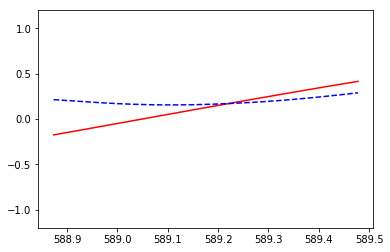

   [[589.50990921 589.5417402  589.57357119 589.60540218 589.63723317
  589.66906416 589.70089514 589.73272613 589.76455712 589.79638811
  589.8282191  589.86005009 589.89188108 589.92371206 589.95554305
  589.98737404 590.01920503 590.05103602 590.08286701 590.114698  ]
 [590.14652898 590.17835997 590.21019096 590.24202195 590.27385294
  590.30568393 590.33751492 590.36934591 590.40117689 590.43300788
  590.46483887 590.49666986 590.52850085 590.56033184 590.59216283
  590.62399381 590.6558248  590.68765579 590.71948678 590.75131777]
 [590.78314876 590.81497975 590.84681073 590.87864172 590.91047271
  590.9423037  590.97413469 591.00596568 591.03779667 591.06962765
  591.10145864 591.13328963 591.16512062 591.19695161 591.2287826
  591.26061359 591.29244458 591.32427556 591.35610655 591.38793754]
 [591.41976853 591.45159952 591.48343051 591.5152615  591.54709248
  591.57892347 591.61075446 591.64258545 591.67441644 591.70624743
  591.73807842 591.7699094  591.80174039 591.83357138 591

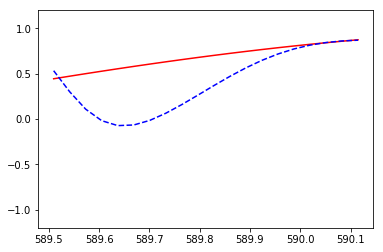

   [[590.14652898 590.17835997 590.21019096 590.24202195 590.27385294
  590.30568393 590.33751492 590.36934591 590.40117689 590.43300788
  590.46483887 590.49666986 590.52850085 590.56033184 590.59216283
  590.62399381 590.6558248  590.68765579 590.71948678 590.75131777]
 [590.78314876 590.81497975 590.84681073 590.87864172 590.91047271
  590.9423037  590.97413469 591.00596568 591.03779667 591.06962765
  591.10145864 591.13328963 591.16512062 591.19695161 591.2287826
  591.26061359 591.29244458 591.32427556 591.35610655 591.38793754]
 [591.41976853 591.45159952 591.48343051 591.5152615  591.54709248
  591.57892347 591.61075446 591.64258545 591.67441644 591.70624743
  591.73807842 591.7699094  591.80174039 591.83357138 591.86540237
  591.89723336 591.92906435 591.96089534 591.99272632 592.02455731]
 [592.0563883  592.08821929 592.12005028 592.15188127 592.18371226
  592.21554324 592.24737423 592.27920522 592.31103621 592.3428672
  592.37469819 592.40652918 592.43836017 592.47019115 592.

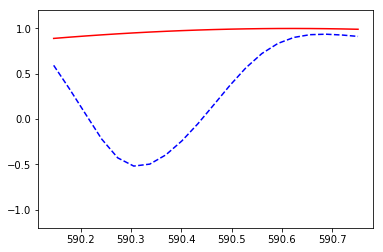

   [[590.78314876 590.81497975 590.84681073 590.87864172 590.91047271
  590.9423037  590.97413469 591.00596568 591.03779667 591.06962765
  591.10145864 591.13328963 591.16512062 591.19695161 591.2287826
  591.26061359 591.29244458 591.32427556 591.35610655 591.38793754]
 [591.41976853 591.45159952 591.48343051 591.5152615  591.54709248
  591.57892347 591.61075446 591.64258545 591.67441644 591.70624743
  591.73807842 591.7699094  591.80174039 591.83357138 591.86540237
  591.89723336 591.92906435 591.96089534 591.99272632 592.02455731]
 [592.0563883  592.08821929 592.12005028 592.15188127 592.18371226
  592.21554324 592.24737423 592.27920522 592.31103621 592.3428672
  592.37469819 592.40652918 592.43836017 592.47019115 592.50202214
  592.53385313 592.56568412 592.59751511 592.6293461  592.66117709]
 [592.69300807 592.72483906 592.75667005 592.78850104 592.82033203
  592.85216302 592.88399401 592.91582499 592.94765598 592.97948697
  593.01131796 593.04314895 593.07497994 593.10681093 593.

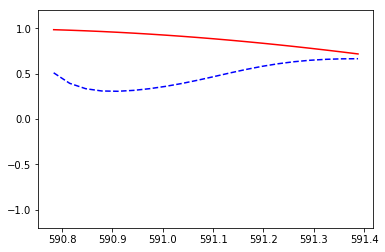

   [[591.41976853 591.45159952 591.48343051 591.5152615  591.54709248
  591.57892347 591.61075446 591.64258545 591.67441644 591.70624743
  591.73807842 591.7699094  591.80174039 591.83357138 591.86540237
  591.89723336 591.92906435 591.96089534 591.99272632 592.02455731]
 [592.0563883  592.08821929 592.12005028 592.15188127 592.18371226
  592.21554324 592.24737423 592.27920522 592.31103621 592.3428672
  592.37469819 592.40652918 592.43836017 592.47019115 592.50202214
  592.53385313 592.56568412 592.59751511 592.6293461  592.66117709]
 [592.69300807 592.72483906 592.75667005 592.78850104 592.82033203
  592.85216302 592.88399401 592.91582499 592.94765598 592.97948697
  593.01131796 593.04314895 593.07497994 593.10681093 593.13864191
  593.1704729  593.20230389 593.23413488 593.26596587 593.29779686]
 [593.32962785 593.36145884 593.39328982 593.42512081 593.4569518
  593.48878279 593.52061378 593.55244477 593.58427576 593.61610674
  593.64793773 593.67976872 593.71159971 593.7434307  593.

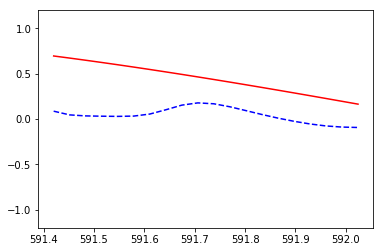

   [[592.0563883  592.08821929 592.12005028 592.15188127 592.18371226
  592.21554324 592.24737423 592.27920522 592.31103621 592.3428672
  592.37469819 592.40652918 592.43836017 592.47019115 592.50202214
  592.53385313 592.56568412 592.59751511 592.6293461  592.66117709]
 [592.69300807 592.72483906 592.75667005 592.78850104 592.82033203
  592.85216302 592.88399401 592.91582499 592.94765598 592.97948697
  593.01131796 593.04314895 593.07497994 593.10681093 593.13864191
  593.1704729  593.20230389 593.23413488 593.26596587 593.29779686]
 [593.32962785 593.36145884 593.39328982 593.42512081 593.4569518
  593.48878279 593.52061378 593.55244477 593.58427576 593.61610674
  593.64793773 593.67976872 593.71159971 593.7434307  593.77526169
  593.80709268 593.83892366 593.87075465 593.90258564 593.93441663]
 [593.96624762 593.99807861 594.0299096  594.06174058 594.09357157
  594.12540256 594.15723355 594.18906454 594.22089553 594.25272652
  594.28455751 594.31638849 594.34821948 594.38005047 594.

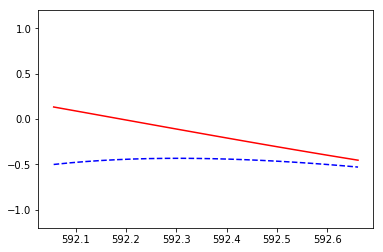

   [[592.69300807 592.72483906 592.75667005 592.78850104 592.82033203
  592.85216302 592.88399401 592.91582499 592.94765598 592.97948697
  593.01131796 593.04314895 593.07497994 593.10681093 593.13864191
  593.1704729  593.20230389 593.23413488 593.26596587 593.29779686]
 [593.32962785 593.36145884 593.39328982 593.42512081 593.4569518
  593.48878279 593.52061378 593.55244477 593.58427576 593.61610674
  593.64793773 593.67976872 593.71159971 593.7434307  593.77526169
  593.80709268 593.83892366 593.87075465 593.90258564 593.93441663]
 [593.96624762 593.99807861 594.0299096  594.06174058 594.09357157
  594.12540256 594.15723355 594.18906454 594.22089553 594.25272652
  594.28455751 594.31638849 594.34821948 594.38005047 594.41188146
  594.44371245 594.47554344 594.50737443 594.53920541 594.5710364 ]
 [594.60286739 594.63469838 594.66652937 594.69836036 594.73019135
  594.76202233 594.79385332 594.82568431 594.8575153  594.88934629
  594.92117728 594.95300827 594.98483925 595.01667024 595

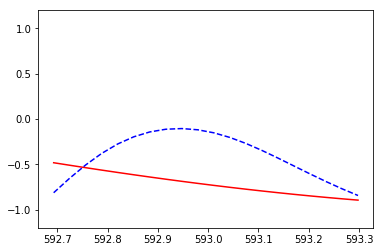

   [[593.32962785 593.36145884 593.39328982 593.42512081 593.4569518
  593.48878279 593.52061378 593.55244477 593.58427576 593.61610674
  593.64793773 593.67976872 593.71159971 593.7434307  593.77526169
  593.80709268 593.83892366 593.87075465 593.90258564 593.93441663]
 [593.96624762 593.99807861 594.0299096  594.06174058 594.09357157
  594.12540256 594.15723355 594.18906454 594.22089553 594.25272652
  594.28455751 594.31638849 594.34821948 594.38005047 594.41188146
  594.44371245 594.47554344 594.50737443 594.53920541 594.5710364 ]
 [594.60286739 594.63469838 594.66652937 594.69836036 594.73019135
  594.76202233 594.79385332 594.82568431 594.8575153  594.88934629
  594.92117728 594.95300827 594.98483925 595.01667024 595.04850123
  595.08033222 595.11216321 595.1439942  595.17582519 595.20765618]
 [595.23948716 595.27131815 595.30314914 595.33498013 595.36681112
  595.39864211 595.4304731  595.46230408 595.49413507 595.52596606
  595.55779705 595.58962804 595.62145903 595.65329002 595

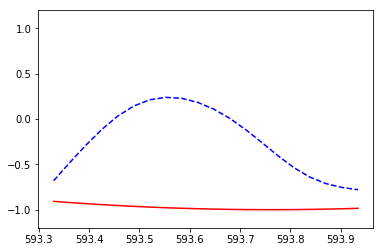

   0.0130478665
   [[593.96624762 593.99807861 594.0299096  594.06174058 594.09357157
  594.12540256 594.15723355 594.18906454 594.22089553 594.25272652
  594.28455751 594.31638849 594.34821948 594.38005047 594.41188146
  594.44371245 594.47554344 594.50737443 594.53920541 594.5710364 ]
 [594.60286739 594.63469838 594.66652937 594.69836036 594.73019135
  594.76202233 594.79385332 594.82568431 594.8575153  594.88934629
  594.92117728 594.95300827 594.98483925 595.01667024 595.04850123
  595.08033222 595.11216321 595.1439942  595.17582519 595.20765618]
 [595.23948716 595.27131815 595.30314914 595.33498013 595.36681112
  595.39864211 595.4304731  595.46230408 595.49413507 595.52596606
  595.55779705 595.58962804 595.62145903 595.65329002 595.685121
  595.71695199 595.74878298 595.78061397 595.81244496 595.84427595]
 [595.87610694 595.90793792 595.93976891 595.9715999  596.00343089
  596.03526188 596.06709287 596.09892386 596.13075485 596.16258583
  596.19441682 596.22624781 596.2580788  5

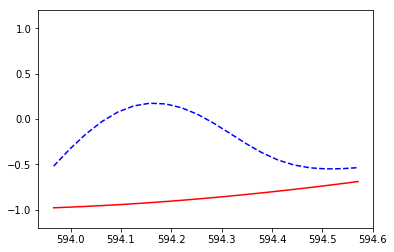

   [[594.60286739 594.63469838 594.66652937 594.69836036 594.73019135
  594.76202233 594.79385332 594.82568431 594.8575153  594.88934629
  594.92117728 594.95300827 594.98483925 595.01667024 595.04850123
  595.08033222 595.11216321 595.1439942  595.17582519 595.20765618]
 [595.23948716 595.27131815 595.30314914 595.33498013 595.36681112
  595.39864211 595.4304731  595.46230408 595.49413507 595.52596606
  595.55779705 595.58962804 595.62145903 595.65329002 595.685121
  595.71695199 595.74878298 595.78061397 595.81244496 595.84427595]
 [595.87610694 595.90793792 595.93976891 595.9715999  596.00343089
  596.03526188 596.06709287 596.09892386 596.13075485 596.16258583
  596.19441682 596.22624781 596.2580788  596.28990979 596.32174078
  596.35357177 596.38540275 596.41723374 596.44906473 596.48089572]
 [596.51272671 596.5445577  596.57638869 596.60821967 596.64005066
  596.67188165 596.70371264 596.73554363 596.76737462 596.79920561
  596.83103659 596.86286758 596.89469857 596.92652956 596.

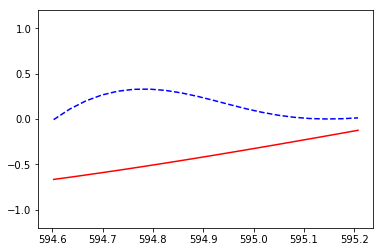

   [[595.23948716 595.27131815 595.30314914 595.33498013 595.36681112
  595.39864211 595.4304731  595.46230408 595.49413507 595.52596606
  595.55779705 595.58962804 595.62145903 595.65329002 595.685121
  595.71695199 595.74878298 595.78061397 595.81244496 595.84427595]
 [595.87610694 595.90793792 595.93976891 595.9715999  596.00343089
  596.03526188 596.06709287 596.09892386 596.13075485 596.16258583
  596.19441682 596.22624781 596.2580788  596.28990979 596.32174078
  596.35357177 596.38540275 596.41723374 596.44906473 596.48089572]
 [596.51272671 596.5445577  596.57638869 596.60821967 596.64005066
  596.67188165 596.70371264 596.73554363 596.76737462 596.79920561
  596.83103659 596.86286758 596.89469857 596.92652956 596.95836055
  596.99019154 597.02202253 597.05385351 597.0856845  597.11751549]
 [597.14934648 597.18117747 597.21300846 597.24483945 597.27667044
  597.30850142 597.34033241 597.3721634  597.40399439 597.43582538
  597.46765637 597.49948736 597.53131834 597.56314933 597.

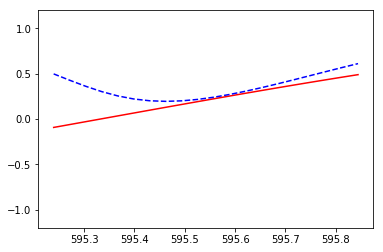

   [[595.87610694 595.90793792 595.93976891 595.9715999  596.00343089
  596.03526188 596.06709287 596.09892386 596.13075485 596.16258583
  596.19441682 596.22624781 596.2580788  596.28990979 596.32174078
  596.35357177 596.38540275 596.41723374 596.44906473 596.48089572]
 [596.51272671 596.5445577  596.57638869 596.60821967 596.64005066
  596.67188165 596.70371264 596.73554363 596.76737462 596.79920561
  596.83103659 596.86286758 596.89469857 596.92652956 596.95836055
  596.99019154 597.02202253 597.05385351 597.0856845  597.11751549]
 [597.14934648 597.18117747 597.21300846 597.24483945 597.27667044
  597.30850142 597.34033241 597.3721634  597.40399439 597.43582538
  597.46765637 597.49948736 597.53131834 597.56314933 597.59498032
  597.62681131 597.6586423  597.69047329 597.72230428 597.75413526]
 [597.78596625 597.81779724 597.84962823 597.88145922 597.91329021
  597.9451212  597.97695218 598.00878317 598.04061416 598.07244515
  598.10427614 598.13610713 598.16793812 598.19976911 59

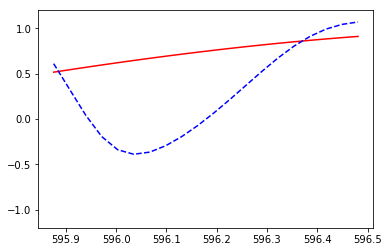

   [[596.51272671 596.5445577  596.57638869 596.60821967 596.64005066
  596.67188165 596.70371264 596.73554363 596.76737462 596.79920561
  596.83103659 596.86286758 596.89469857 596.92652956 596.95836055
  596.99019154 597.02202253 597.05385351 597.0856845  597.11751549]
 [597.14934648 597.18117747 597.21300846 597.24483945 597.27667044
  597.30850142 597.34033241 597.3721634  597.40399439 597.43582538
  597.46765637 597.49948736 597.53131834 597.56314933 597.59498032
  597.62681131 597.6586423  597.69047329 597.72230428 597.75413526]
 [597.78596625 597.81779724 597.84962823 597.88145922 597.91329021
  597.9451212  597.97695218 598.00878317 598.04061416 598.07244515
  598.10427614 598.13610713 598.16793812 598.19976911 598.23160009
  598.26343108 598.29526207 598.32709306 598.35892405 598.39075504]
 [598.42258603 598.45441701 598.486248   598.51807899 598.54990998
  598.58174097 598.61357196 598.64540295 598.67723393 598.70906492
  598.74089591 598.7727269  598.80455789 598.83638888 59

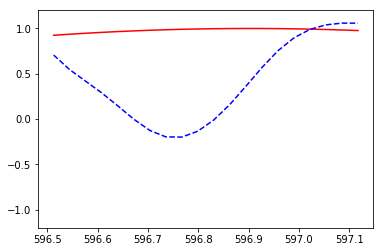

   [[597.14934648 597.18117747 597.21300846 597.24483945 597.27667044
  597.30850142 597.34033241 597.3721634  597.40399439 597.43582538
  597.46765637 597.49948736 597.53131834 597.56314933 597.59498032
  597.62681131 597.6586423  597.69047329 597.72230428 597.75413526]
 [597.78596625 597.81779724 597.84962823 597.88145922 597.91329021
  597.9451212  597.97695218 598.00878317 598.04061416 598.07244515
  598.10427614 598.13610713 598.16793812 598.19976911 598.23160009
  598.26343108 598.29526207 598.32709306 598.35892405 598.39075504]
 [598.42258603 598.45441701 598.486248   598.51807899 598.54990998
  598.58174097 598.61357196 598.64540295 598.67723393 598.70906492
  598.74089591 598.7727269  598.80455789 598.83638888 598.86821987
  598.90005085 598.93188184 598.96371283 598.99554382 599.02737481]
 [599.0592058  599.09103679 599.12286778 599.15469876 599.18652975
  599.21836074 599.25019173 599.28202272 599.31385371 599.3456847
  599.37751568 599.40934667 599.44117766 599.47300865 599

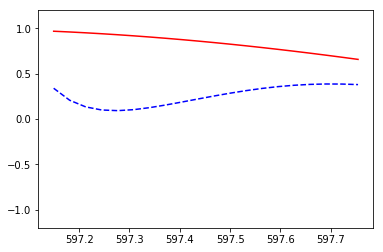

   [[597.78596625 597.81779724 597.84962823 597.88145922 597.91329021
  597.9451212  597.97695218 598.00878317 598.04061416 598.07244515
  598.10427614 598.13610713 598.16793812 598.19976911 598.23160009
  598.26343108 598.29526207 598.32709306 598.35892405 598.39075504]
 [598.42258603 598.45441701 598.486248   598.51807899 598.54990998
  598.58174097 598.61357196 598.64540295 598.67723393 598.70906492
  598.74089591 598.7727269  598.80455789 598.83638888 598.86821987
  598.90005085 598.93188184 598.96371283 598.99554382 599.02737481]
 [599.0592058  599.09103679 599.12286778 599.15469876 599.18652975
  599.21836074 599.25019173 599.28202272 599.31385371 599.3456847
  599.37751568 599.40934667 599.44117766 599.47300865 599.50483964
  599.53667063 599.56850162 599.6003326  599.63216359 599.66399458]
 [599.69582557 599.72765656 599.75948755 599.79131854 599.82314952
  599.85498051 599.8868115  599.91864249 599.95047348 599.98230447
  600.01413546 600.04596645 600.07779743 600.10962842 600

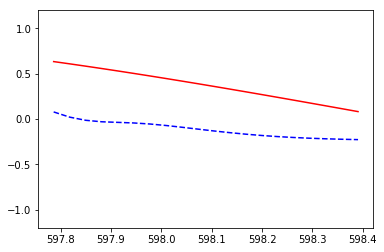

   [[598.42258603 598.45441701 598.486248   598.51807899 598.54990998
  598.58174097 598.61357196 598.64540295 598.67723393 598.70906492
  598.74089591 598.7727269  598.80455789 598.83638888 598.86821987
  598.90005085 598.93188184 598.96371283 598.99554382 599.02737481]
 [599.0592058  599.09103679 599.12286778 599.15469876 599.18652975
  599.21836074 599.25019173 599.28202272 599.31385371 599.3456847
  599.37751568 599.40934667 599.44117766 599.47300865 599.50483964
  599.53667063 599.56850162 599.6003326  599.63216359 599.66399458]
 [599.69582557 599.72765656 599.75948755 599.79131854 599.82314952
  599.85498051 599.8868115  599.91864249 599.95047348 599.98230447
  600.01413546 600.04596645 600.07779743 600.10962842 600.14145941
  600.1732904  600.20512139 600.23695238 600.26878337 600.30061435]
 [600.33244534 600.36427633 600.39610732 600.42793831 600.4597693
  600.49160029 600.52343127 600.55526226 600.58709325 600.61892424
  600.65075523 600.68258622 600.71441721 600.74624819 600.

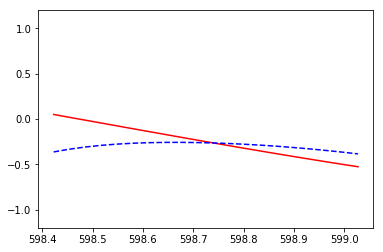

   [[599.0592058  599.09103679 599.12286778 599.15469876 599.18652975
  599.21836074 599.25019173 599.28202272 599.31385371 599.3456847
  599.37751568 599.40934667 599.44117766 599.47300865 599.50483964
  599.53667063 599.56850162 599.6003326  599.63216359 599.66399458]
 [599.69582557 599.72765656 599.75948755 599.79131854 599.82314952
  599.85498051 599.8868115  599.91864249 599.95047348 599.98230447
  600.01413546 600.04596645 600.07779743 600.10962842 600.14145941
  600.1732904  600.20512139 600.23695238 600.26878337 600.30061435]
 [600.33244534 600.36427633 600.39610732 600.42793831 600.4597693
  600.49160029 600.52343127 600.55526226 600.58709325 600.61892424
  600.65075523 600.68258622 600.71441721 600.74624819 600.77807918
  600.80991017 600.84174116 600.87357215 600.90540314 600.93723413]
 [600.96906511 601.0008961  601.03272709 601.06455808 601.09638907
  601.12822006 601.16005105 601.19188204 601.22371302 601.25554401
  601.287375   601.31920599 601.35103698 601.38286797 601.

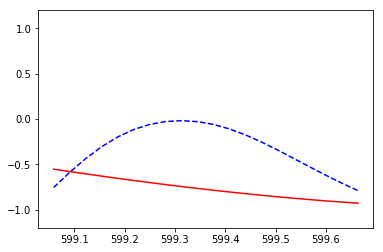

   [[599.69582557 599.72765656 599.75948755 599.79131854 599.82314952
  599.85498051 599.8868115  599.91864249 599.95047348 599.98230447
  600.01413546 600.04596645 600.07779743 600.10962842 600.14145941
  600.1732904  600.20512139 600.23695238 600.26878337 600.30061435]
 [600.33244534 600.36427633 600.39610732 600.42793831 600.4597693
  600.49160029 600.52343127 600.55526226 600.58709325 600.61892424
  600.65075523 600.68258622 600.71441721 600.74624819 600.77807918
  600.80991017 600.84174116 600.87357215 600.90540314 600.93723413]
 [600.96906511 601.0008961  601.03272709 601.06455808 601.09638907
  601.12822006 601.16005105 601.19188204 601.22371302 601.25554401
  601.287375   601.31920599 601.35103698 601.38286797 601.41469896
  601.44652994 601.47836093 601.51019192 601.54202291 601.5738539 ]
 [601.60568489 601.63751588 601.66934686 601.70117785 601.73300884
  601.76483983 601.79667082 601.82850181 601.8603328  601.89216378
  601.92399477 601.95582576 601.98765675 602.01948774 602

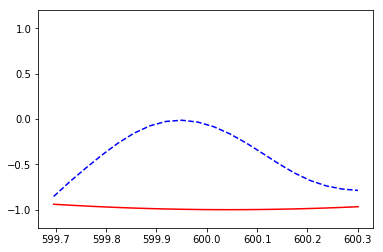

   0.018522132
   [[600.33244534 600.36427633 600.39610732 600.42793831 600.4597693
  600.49160029 600.52343127 600.55526226 600.58709325 600.61892424
  600.65075523 600.68258622 600.71441721 600.74624819 600.77807918
  600.80991017 600.84174116 600.87357215 600.90540314 600.93723413]
 [600.96906511 601.0008961  601.03272709 601.06455808 601.09638907
  601.12822006 601.16005105 601.19188204 601.22371302 601.25554401
  601.287375   601.31920599 601.35103698 601.38286797 601.41469896
  601.44652994 601.47836093 601.51019192 601.54202291 601.5738539 ]
 [601.60568489 601.63751588 601.66934686 601.70117785 601.73300884
  601.76483983 601.79667082 601.82850181 601.8603328  601.89216378
  601.92399477 601.95582576 601.98765675 602.01948774 602.05131873
  602.08314972 602.11498071 602.14681169 602.17864268 602.21047367]
 [602.24230466 602.27413565 602.30596664 602.33779763 602.36962861
  602.4014596  602.43329059 602.46512158 602.49695257 602.52878356
  602.56061455 602.59244553 602.62427652 6

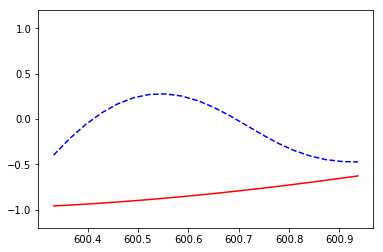

   [[600.96906511 601.0008961  601.03272709 601.06455808 601.09638907
  601.12822006 601.16005105 601.19188204 601.22371302 601.25554401
  601.287375   601.31920599 601.35103698 601.38286797 601.41469896
  601.44652994 601.47836093 601.51019192 601.54202291 601.5738539 ]
 [601.60568489 601.63751588 601.66934686 601.70117785 601.73300884
  601.76483983 601.79667082 601.82850181 601.8603328  601.89216378
  601.92399477 601.95582576 601.98765675 602.01948774 602.05131873
  602.08314972 602.11498071 602.14681169 602.17864268 602.21047367]
 [602.24230466 602.27413565 602.30596664 602.33779763 602.36962861
  602.4014596  602.43329059 602.46512158 602.49695257 602.52878356
  602.56061455 602.59244553 602.62427652 602.65610751 602.6879385
  602.71976949 602.75160048 602.78343147 602.81526245 602.84709344]
 [602.87892443 602.91075542 602.94258641 602.9744174  603.00624839
  603.03807938 603.06991036 603.10174135 603.13357234 603.16540333
  603.19723432 603.22906531 603.2608963  603.29272728 603

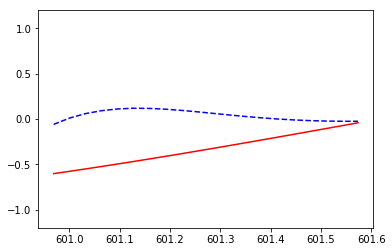

   [[601.60568489 601.63751588 601.66934686 601.70117785 601.73300884
  601.76483983 601.79667082 601.82850181 601.8603328  601.89216378
  601.92399477 601.95582576 601.98765675 602.01948774 602.05131873
  602.08314972 602.11498071 602.14681169 602.17864268 602.21047367]
 [602.24230466 602.27413565 602.30596664 602.33779763 602.36962861
  602.4014596  602.43329059 602.46512158 602.49695257 602.52878356
  602.56061455 602.59244553 602.62427652 602.65610751 602.6879385
  602.71976949 602.75160048 602.78343147 602.81526245 602.84709344]
 [602.87892443 602.91075542 602.94258641 602.9744174  603.00624839
  603.03807938 603.06991036 603.10174135 603.13357234 603.16540333
  603.19723432 603.22906531 603.2608963  603.29272728 603.32455827
  603.35638926 603.38822025 603.42005124 603.45188223 603.48371322]
 [603.5155442  603.54737519 603.57920618 603.61103717 603.64286816
  603.67469915 603.70653014 603.73836112 603.77019211 603.8020231
  603.83385409 603.86568508 603.89751607 603.92934706 603.

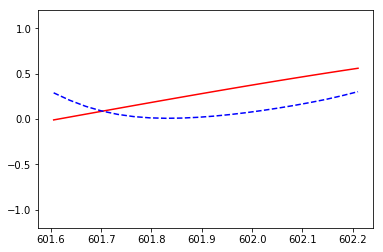

   [[602.24230466 602.27413565 602.30596664 602.33779763 602.36962861
  602.4014596  602.43329059 602.46512158 602.49695257 602.52878356
  602.56061455 602.59244553 602.62427652 602.65610751 602.6879385
  602.71976949 602.75160048 602.78343147 602.81526245 602.84709344]
 [602.87892443 602.91075542 602.94258641 602.9744174  603.00624839
  603.03807938 603.06991036 603.10174135 603.13357234 603.16540333
  603.19723432 603.22906531 603.2608963  603.29272728 603.32455827
  603.35638926 603.38822025 603.42005124 603.45188223 603.48371322]
 [603.5155442  603.54737519 603.57920618 603.61103717 603.64286816
  603.67469915 603.70653014 603.73836112 603.77019211 603.8020231
  603.83385409 603.86568508 603.89751607 603.92934706 603.96117805
  603.99300903 604.02484002 604.05667101 604.088502   604.12033299]
 [604.15216398 604.18399497 604.21582595 604.24765694 604.27948793
  604.31131892 604.34314991 604.3749809  604.40681189 604.43864287
  604.47047386 604.50230485 604.53413584 604.56596683 604.

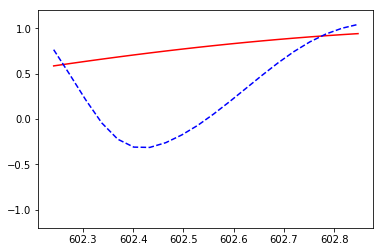

   [[602.87892443 602.91075542 602.94258641 602.9744174  603.00624839
  603.03807938 603.06991036 603.10174135 603.13357234 603.16540333
  603.19723432 603.22906531 603.2608963  603.29272728 603.32455827
  603.35638926 603.38822025 603.42005124 603.45188223 603.48371322]
 [603.5155442  603.54737519 603.57920618 603.61103717 603.64286816
  603.67469915 603.70653014 603.73836112 603.77019211 603.8020231
  603.83385409 603.86568508 603.89751607 603.92934706 603.96117805
  603.99300903 604.02484002 604.05667101 604.088502   604.12033299]
 [604.15216398 604.18399497 604.21582595 604.24765694 604.27948793
  604.31131892 604.34314991 604.3749809  604.40681189 604.43864287
  604.47047386 604.50230485 604.53413584 604.56596683 604.59779782
  604.62962881 604.66145979 604.69329078 604.72512177 604.75695276]
 [604.78878375 604.82061474 604.85244573 604.88427672 604.9161077
  604.94793869 604.97976968 605.01160067 605.04343166 605.07526265
  605.10709364 605.13892462 605.17075561 605.2025866  605.

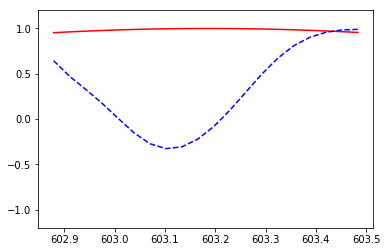

   [[603.5155442  603.54737519 603.57920618 603.61103717 603.64286816
  603.67469915 603.70653014 603.73836112 603.77019211 603.8020231
  603.83385409 603.86568508 603.89751607 603.92934706 603.96117805
  603.99300903 604.02484002 604.05667101 604.088502   604.12033299]
 [604.15216398 604.18399497 604.21582595 604.24765694 604.27948793
  604.31131892 604.34314991 604.3749809  604.40681189 604.43864287
  604.47047386 604.50230485 604.53413584 604.56596683 604.59779782
  604.62962881 604.66145979 604.69329078 604.72512177 604.75695276]
 [604.78878375 604.82061474 604.85244573 604.88427672 604.9161077
  604.94793869 604.97976968 605.01160067 605.04343166 605.07526265
  605.10709364 605.13892462 605.17075561 605.2025866  605.23441759
  605.26624858 605.29807957 605.32991056 605.36174154 605.39357253]
 [605.42540352 605.45723451 605.4890655  605.52089649 605.55272748
  605.58455846 605.61638945 605.64822044 605.68005143 605.71188242
  605.74371341 605.7755444  605.80737538 605.83920637 605.

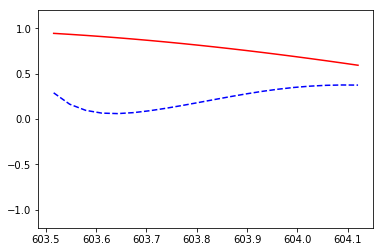

   [[604.15216398 604.18399497 604.21582595 604.24765694 604.27948793
  604.31131892 604.34314991 604.3749809  604.40681189 604.43864287
  604.47047386 604.50230485 604.53413584 604.56596683 604.59779782
  604.62962881 604.66145979 604.69329078 604.72512177 604.75695276]
 [604.78878375 604.82061474 604.85244573 604.88427672 604.9161077
  604.94793869 604.97976968 605.01160067 605.04343166 605.07526265
  605.10709364 605.13892462 605.17075561 605.2025866  605.23441759
  605.26624858 605.29807957 605.32991056 605.36174154 605.39357253]
 [605.42540352 605.45723451 605.4890655  605.52089649 605.55272748
  605.58455846 605.61638945 605.64822044 605.68005143 605.71188242
  605.74371341 605.7755444  605.80737538 605.83920637 605.87103736
  605.90286835 605.93469934 605.96653033 605.99836132 606.03019231]
 [606.06202329 606.09385428 606.12568527 606.15751626 606.18934725
  606.22117824 606.25300923 606.28484021 606.3166712  606.34850219
  606.38033318 606.41216417 606.44399516 606.47582615 606

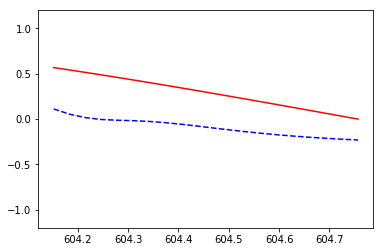

   [[604.78878375 604.82061474 604.85244573 604.88427672 604.9161077
  604.94793869 604.97976968 605.01160067 605.04343166 605.07526265
  605.10709364 605.13892462 605.17075561 605.2025866  605.23441759
  605.26624858 605.29807957 605.32991056 605.36174154 605.39357253]
 [605.42540352 605.45723451 605.4890655  605.52089649 605.55272748
  605.58455846 605.61638945 605.64822044 605.68005143 605.71188242
  605.74371341 605.7755444  605.80737538 605.83920637 605.87103736
  605.90286835 605.93469934 605.96653033 605.99836132 606.03019231]
 [606.06202329 606.09385428 606.12568527 606.15751626 606.18934725
  606.22117824 606.25300923 606.28484021 606.3166712  606.34850219
  606.38033318 606.41216417 606.44399516 606.47582615 606.50765713
  606.53948812 606.57131911 606.6031501  606.63498109 606.66681208]
 [606.69864307 606.73047405 606.76230504 606.79413603 606.82596702
  606.85779801 606.889629   606.92145999 606.95329098 606.98512196
  607.01695295 607.04878394 607.08061493 607.11244592 607

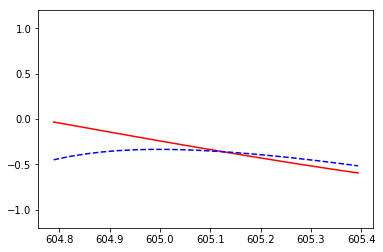

   [[605.42540352 605.45723451 605.4890655  605.52089649 605.55272748
  605.58455846 605.61638945 605.64822044 605.68005143 605.71188242
  605.74371341 605.7755444  605.80737538 605.83920637 605.87103736
  605.90286835 605.93469934 605.96653033 605.99836132 606.03019231]
 [606.06202329 606.09385428 606.12568527 606.15751626 606.18934725
  606.22117824 606.25300923 606.28484021 606.3166712  606.34850219
  606.38033318 606.41216417 606.44399516 606.47582615 606.50765713
  606.53948812 606.57131911 606.6031501  606.63498109 606.66681208]
 [606.69864307 606.73047405 606.76230504 606.79413603 606.82596702
  606.85779801 606.889629   606.92145999 606.95329098 606.98512196
  607.01695295 607.04878394 607.08061493 607.11244592 607.14427691
  607.1761079  607.20793888 607.23976987 607.27160086 607.30343185]
 [607.33526284 607.36709383 607.39892482 607.4307558  607.46258679
  607.49441778 607.52624877 607.55807976 607.58991075 607.62174174
  607.65357272 607.68540371 607.7172347  607.74906569 60

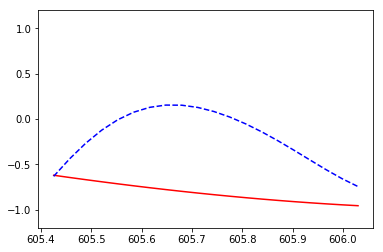

   [[606.06202329 606.09385428 606.12568527 606.15751626 606.18934725
  606.22117824 606.25300923 606.28484021 606.3166712  606.34850219
  606.38033318 606.41216417 606.44399516 606.47582615 606.50765713
  606.53948812 606.57131911 606.6031501  606.63498109 606.66681208]
 [606.69864307 606.73047405 606.76230504 606.79413603 606.82596702
  606.85779801 606.889629   606.92145999 606.95329098 606.98512196
  607.01695295 607.04878394 607.08061493 607.11244592 607.14427691
  607.1761079  607.20793888 607.23976987 607.27160086 607.30343185]
 [607.33526284 607.36709383 607.39892482 607.4307558  607.46258679
  607.49441778 607.52624877 607.55807976 607.58991075 607.62174174
  607.65357272 607.68540371 607.7172347  607.74906569 607.78089668
  607.81272767 607.84455866 607.87638965 607.90822063 607.94005162]
 [607.97188261 608.0037136  608.03554459 608.06737558 608.09920657
  608.13103755 608.16286854 608.19469953 608.22653052 608.25836151
  608.2901925  608.32202349 608.35385447 608.38568546 60

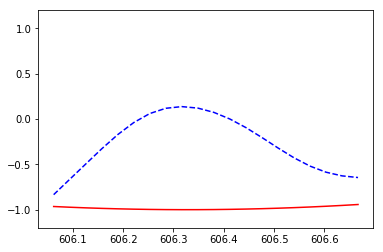

   0.013535022
   [[606.69864307 606.73047405 606.76230504 606.79413603 606.82596702
  606.85779801 606.889629   606.92145999 606.95329098 606.98512196
  607.01695295 607.04878394 607.08061493 607.11244592 607.14427691
  607.1761079  607.20793888 607.23976987 607.27160086 607.30343185]
 [607.33526284 607.36709383 607.39892482 607.4307558  607.46258679
  607.49441778 607.52624877 607.55807976 607.58991075 607.62174174
  607.65357272 607.68540371 607.7172347  607.74906569 607.78089668
  607.81272767 607.84455866 607.87638965 607.90822063 607.94005162]
 [607.97188261 608.0037136  608.03554459 608.06737558 608.09920657
  608.13103755 608.16286854 608.19469953 608.22653052 608.25836151
  608.2901925  608.32202349 608.35385447 608.38568546 608.41751645
  608.44934744 608.48117843 608.51300942 608.54484041 608.57667139]
 [608.60850238 608.64033337 608.67216436 608.70399535 608.73582634
  608.76765733 608.79948832 608.8313193  608.86315029 608.89498128
  608.92681227 608.95864326 608.99047425 

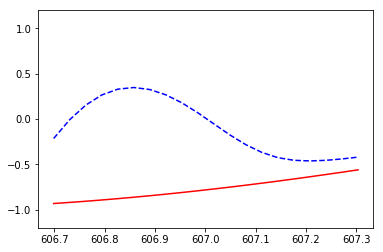

   [[607.33526284 607.36709383 607.39892482 607.4307558  607.46258679
  607.49441778 607.52624877 607.55807976 607.58991075 607.62174174
  607.65357272 607.68540371 607.7172347  607.74906569 607.78089668
  607.81272767 607.84455866 607.87638965 607.90822063 607.94005162]
 [607.97188261 608.0037136  608.03554459 608.06737558 608.09920657
  608.13103755 608.16286854 608.19469953 608.22653052 608.25836151
  608.2901925  608.32202349 608.35385447 608.38568546 608.41751645
  608.44934744 608.48117843 608.51300942 608.54484041 608.57667139]
 [608.60850238 608.64033337 608.67216436 608.70399535 608.73582634
  608.76765733 608.79948832 608.8313193  608.86315029 608.89498128
  608.92681227 608.95864326 608.99047425 609.02230524 609.05413622
  609.08596721 609.1177982  609.14962919 609.18146018 609.21329117]
 [609.24512216 609.27695314 609.30878413 609.34061512 609.37244611
  609.4042771  609.43610809 609.46793908 609.49977006 609.53160105
  609.56343204 609.59526303 609.62709402 609.65892501 60

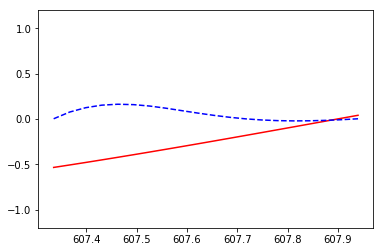

   [[607.97188261 608.0037136  608.03554459 608.06737558 608.09920657
  608.13103755 608.16286854 608.19469953 608.22653052 608.25836151
  608.2901925  608.32202349 608.35385447 608.38568546 608.41751645
  608.44934744 608.48117843 608.51300942 608.54484041 608.57667139]
 [608.60850238 608.64033337 608.67216436 608.70399535 608.73582634
  608.76765733 608.79948832 608.8313193  608.86315029 608.89498128
  608.92681227 608.95864326 608.99047425 609.02230524 609.05413622
  609.08596721 609.1177982  609.14962919 609.18146018 609.21329117]
 [609.24512216 609.27695314 609.30878413 609.34061512 609.37244611
  609.4042771  609.43610809 609.46793908 609.49977006 609.53160105
  609.56343204 609.59526303 609.62709402 609.65892501 609.690756
  609.72258699 609.75441797 609.78624896 609.81807995 609.84991094]
 [609.88174193 609.91357292 609.94540391 609.97723489 610.00906588
  610.04089687 610.07272786 610.10455885 610.13638984 610.16822083
  610.20005181 610.2318828  610.26371379 610.29554478 610.

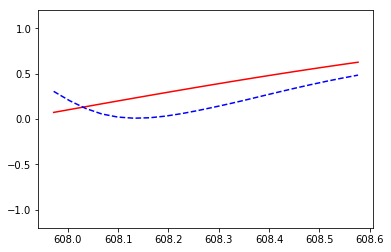

   [[608.60850238 608.64033337 608.67216436 608.70399535 608.73582634
  608.76765733 608.79948832 608.8313193  608.86315029 608.89498128
  608.92681227 608.95864326 608.99047425 609.02230524 609.05413622
  609.08596721 609.1177982  609.14962919 609.18146018 609.21329117]
 [609.24512216 609.27695314 609.30878413 609.34061512 609.37244611
  609.4042771  609.43610809 609.46793908 609.49977006 609.53160105
  609.56343204 609.59526303 609.62709402 609.65892501 609.690756
  609.72258699 609.75441797 609.78624896 609.81807995 609.84991094]
 [609.88174193 609.91357292 609.94540391 609.97723489 610.00906588
  610.04089687 610.07272786 610.10455885 610.13638984 610.16822083
  610.20005181 610.2318828  610.26371379 610.29554478 610.32737577
  610.35920676 610.39103775 610.42286873 610.45469972 610.48653071]
 [610.5183617  610.55019269 610.58202368 610.61385467 610.64568565
  610.67751664 610.70934763 610.74117862 610.77300961 610.8048406
  610.83667159 610.86850258 610.90033356 610.93216455 610.9

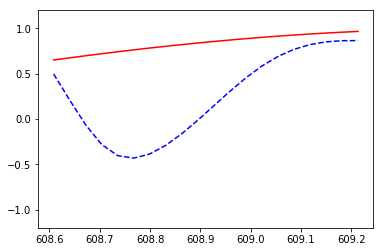

   [[609.24512216 609.27695314 609.30878413 609.34061512 609.37244611
  609.4042771  609.43610809 609.46793908 609.49977006 609.53160105
  609.56343204 609.59526303 609.62709402 609.65892501 609.690756
  609.72258699 609.75441797 609.78624896 609.81807995 609.84991094]
 [609.88174193 609.91357292 609.94540391 609.97723489 610.00906588
  610.04089687 610.07272786 610.10455885 610.13638984 610.16822083
  610.20005181 610.2318828  610.26371379 610.29554478 610.32737577
  610.35920676 610.39103775 610.42286873 610.45469972 610.48653071]
 [610.5183617  610.55019269 610.58202368 610.61385467 610.64568565
  610.67751664 610.70934763 610.74117862 610.77300961 610.8048406
  610.83667159 610.86850258 610.90033356 610.93216455 610.96399554
  610.99582653 611.02765752 611.05948851 611.0913195  611.12315048]
 [611.15498147 611.18681246 611.21864345 611.25047444 611.28230543
  611.31413642 611.3459674  611.37779839 611.40962938 611.44146037
  611.47329136 611.50512235 611.53695334 611.56878432 611.6

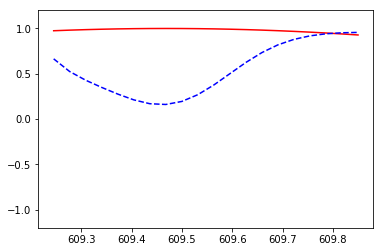

   [[609.88174193 609.91357292 609.94540391 609.97723489 610.00906588
  610.04089687 610.07272786 610.10455885 610.13638984 610.16822083
  610.20005181 610.2318828  610.26371379 610.29554478 610.32737577
  610.35920676 610.39103775 610.42286873 610.45469972 610.48653071]
 [610.5183617  610.55019269 610.58202368 610.61385467 610.64568565
  610.67751664 610.70934763 610.74117862 610.77300961 610.8048406
  610.83667159 610.86850258 610.90033356 610.93216455 610.96399554
  610.99582653 611.02765752 611.05948851 611.0913195  611.12315048]
 [611.15498147 611.18681246 611.21864345 611.25047444 611.28230543
  611.31413642 611.3459674  611.37779839 611.40962938 611.44146037
  611.47329136 611.50512235 611.53695334 611.56878432 611.60061531
  611.6324463  611.66427729 611.69610828 611.72793927 611.75977026]
 [611.79160125 611.82343223 611.85526322 611.88709421 611.9189252
  611.95075619 611.98258718 612.01441817 612.04624915 612.07808014
  612.10991113 612.14174212 612.17357311 612.2054041  612.

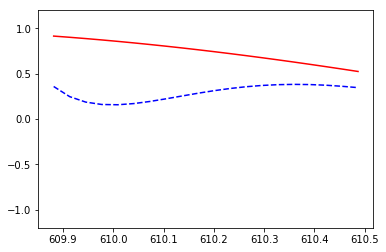

   [[610.5183617  610.55019269 610.58202368 610.61385467 610.64568565
  610.67751664 610.70934763 610.74117862 610.77300961 610.8048406
  610.83667159 610.86850258 610.90033356 610.93216455 610.96399554
  610.99582653 611.02765752 611.05948851 611.0913195  611.12315048]
 [611.15498147 611.18681246 611.21864345 611.25047444 611.28230543
  611.31413642 611.3459674  611.37779839 611.40962938 611.44146037
  611.47329136 611.50512235 611.53695334 611.56878432 611.60061531
  611.6324463  611.66427729 611.69610828 611.72793927 611.75977026]
 [611.79160125 611.82343223 611.85526322 611.88709421 611.9189252
  611.95075619 611.98258718 612.01441817 612.04624915 612.07808014
  612.10991113 612.14174212 612.17357311 612.2054041  612.23723509
  612.26906607 612.30089706 612.33272805 612.36455904 612.39639003]
 [612.42822102 612.46005201 612.49188299 612.52371398 612.55554497
  612.58737596 612.61920695 612.65103794 612.68286893 612.71469992
  612.7465309  612.77836189 612.81019288 612.84202387 612.

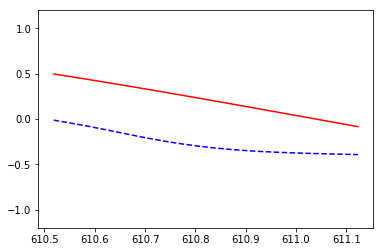

   [[611.15498147 611.18681246 611.21864345 611.25047444 611.28230543
  611.31413642 611.3459674  611.37779839 611.40962938 611.44146037
  611.47329136 611.50512235 611.53695334 611.56878432 611.60061531
  611.6324463  611.66427729 611.69610828 611.72793927 611.75977026]
 [611.79160125 611.82343223 611.85526322 611.88709421 611.9189252
  611.95075619 611.98258718 612.01441817 612.04624915 612.07808014
  612.10991113 612.14174212 612.17357311 612.2054041  612.23723509
  612.26906607 612.30089706 612.33272805 612.36455904 612.39639003]
 [612.42822102 612.46005201 612.49188299 612.52371398 612.55554497
  612.58737596 612.61920695 612.65103794 612.68286893 612.71469992
  612.7465309  612.77836189 612.81019288 612.84202387 612.87385486
  612.90568585 612.93751684 612.96934782 613.00117881 613.0330098 ]
 [613.06484079 613.09667178 613.12850277 613.16033376 613.19216474
  613.22399573 613.25582672 613.28765771 613.3194887  613.35131969
  613.38315068 613.41498166 613.44681265 613.47864364 613

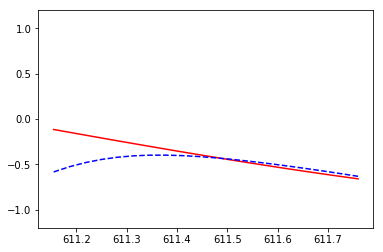

   [[611.79160125 611.82343223 611.85526322 611.88709421 611.9189252
  611.95075619 611.98258718 612.01441817 612.04624915 612.07808014
  612.10991113 612.14174212 612.17357311 612.2054041  612.23723509
  612.26906607 612.30089706 612.33272805 612.36455904 612.39639003]
 [612.42822102 612.46005201 612.49188299 612.52371398 612.55554497
  612.58737596 612.61920695 612.65103794 612.68286893 612.71469992
  612.7465309  612.77836189 612.81019288 612.84202387 612.87385486
  612.90568585 612.93751684 612.96934782 613.00117881 613.0330098 ]
 [613.06484079 613.09667178 613.12850277 613.16033376 613.19216474
  613.22399573 613.25582672 613.28765771 613.3194887  613.35131969
  613.38315068 613.41498166 613.44681265 613.47864364 613.51047463
  613.54230562 613.57413661 613.6059676  613.63779859 613.66962957]
 [613.70146056 613.73329155 613.76512254 613.79695353 613.82878452
  613.86061551 613.89244649 613.92427748 613.95610847 613.98793946
  614.01977045 614.05160144 614.08343243 614.11526341 614

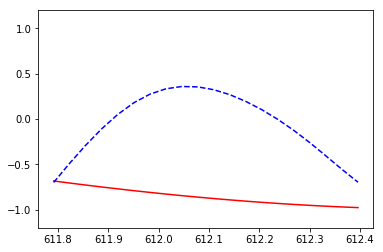

   [[612.42822102 612.46005201 612.49188299 612.52371398 612.55554497
  612.58737596 612.61920695 612.65103794 612.68286893 612.71469992
  612.7465309  612.77836189 612.81019288 612.84202387 612.87385486
  612.90568585 612.93751684 612.96934782 613.00117881 613.0330098 ]
 [613.06484079 613.09667178 613.12850277 613.16033376 613.19216474
  613.22399573 613.25582672 613.28765771 613.3194887  613.35131969
  613.38315068 613.41498166 613.44681265 613.47864364 613.51047463
  613.54230562 613.57413661 613.6059676  613.63779859 613.66962957]
 [613.70146056 613.73329155 613.76512254 613.79695353 613.82878452
  613.86061551 613.89244649 613.92427748 613.95610847 613.98793946
  614.01977045 614.05160144 614.08343243 614.11526341 614.1470944
  614.17892539 614.21075638 614.24258737 614.27441836 614.30624935]
 [614.33808033 614.36991132 614.40174231 614.4335733  614.46540429
  614.49723528 614.52906627 614.56089726 614.59272824 614.62455923
  614.65639022 614.68822121 614.7200522  614.75188319 614

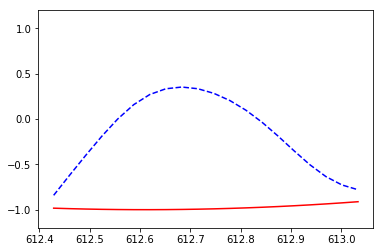

   0.008979578
   [[613.06484079 613.09667178 613.12850277 613.16033376 613.19216474
  613.22399573 613.25582672 613.28765771 613.3194887  613.35131969
  613.38315068 613.41498166 613.44681265 613.47864364 613.51047463
  613.54230562 613.57413661 613.6059676  613.63779859 613.66962957]
 [613.70146056 613.73329155 613.76512254 613.79695353 613.82878452
  613.86061551 613.89244649 613.92427748 613.95610847 613.98793946
  614.01977045 614.05160144 614.08343243 614.11526341 614.1470944
  614.17892539 614.21075638 614.24258737 614.27441836 614.30624935]
 [614.33808033 614.36991132 614.40174231 614.4335733  614.46540429
  614.49723528 614.52906627 614.56089726 614.59272824 614.62455923
  614.65639022 614.68822121 614.7200522  614.75188319 614.78371418
  614.81554516 614.84737615 614.87920714 614.91103813 614.94286912]
 [614.97470011 615.0065311  615.03836208 615.07019307 615.10202406
  615.13385505 615.16568604 615.19751703 615.22934802 615.261179
  615.29300999 615.32484098 615.35667197 615

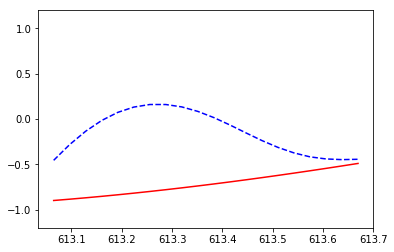

   [[613.70146056 613.73329155 613.76512254 613.79695353 613.82878452
  613.86061551 613.89244649 613.92427748 613.95610847 613.98793946
  614.01977045 614.05160144 614.08343243 614.11526341 614.1470944
  614.17892539 614.21075638 614.24258737 614.27441836 614.30624935]
 [614.33808033 614.36991132 614.40174231 614.4335733  614.46540429
  614.49723528 614.52906627 614.56089726 614.59272824 614.62455923
  614.65639022 614.68822121 614.7200522  614.75188319 614.78371418
  614.81554516 614.84737615 614.87920714 614.91103813 614.94286912]
 [614.97470011 615.0065311  615.03836208 615.07019307 615.10202406
  615.13385505 615.16568604 615.19751703 615.22934802 615.261179
  615.29300999 615.32484098 615.35667197 615.38850296 615.42033395
  615.45216494 615.48399592 615.51582691 615.5476579  615.57948889]
 [615.61131988 615.64315087 615.67498186 615.70681285 615.73864383
  615.77047482 615.80230581 615.8341368  615.86596779 615.89779878
  615.92962977 615.96146075 615.99329174 616.02512273 616.0

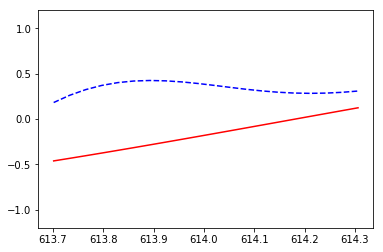

   [[614.33808033 614.36991132 614.40174231 614.4335733  614.46540429
  614.49723528 614.52906627 614.56089726 614.59272824 614.62455923
  614.65639022 614.68822121 614.7200522  614.75188319 614.78371418
  614.81554516 614.84737615 614.87920714 614.91103813 614.94286912]
 [614.97470011 615.0065311  615.03836208 615.07019307 615.10202406
  615.13385505 615.16568604 615.19751703 615.22934802 615.261179
  615.29300999 615.32484098 615.35667197 615.38850296 615.42033395
  615.45216494 615.48399592 615.51582691 615.5476579  615.57948889]
 [615.61131988 615.64315087 615.67498186 615.70681285 615.73864383
  615.77047482 615.80230581 615.8341368  615.86596779 615.89779878
  615.92962977 615.96146075 615.99329174 616.02512273 616.05695372
  616.08878471 616.1206157  616.15244669 616.18427767 616.21610866]
 [616.24793965 616.27977064 616.31160163 616.34343262 616.37526361
  616.40709459 616.43892558 616.47075657 616.50258756 616.53441855
  616.56624954 616.59808053 616.62991152 616.6617425  616.

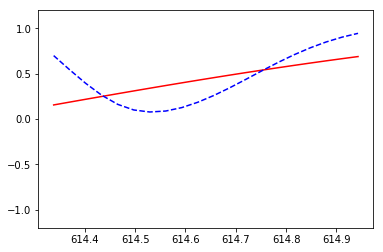

   [[614.97470011 615.0065311  615.03836208 615.07019307 615.10202406
  615.13385505 615.16568604 615.19751703 615.22934802 615.261179
  615.29300999 615.32484098 615.35667197 615.38850296 615.42033395
  615.45216494 615.48399592 615.51582691 615.5476579  615.57948889]
 [615.61131988 615.64315087 615.67498186 615.70681285 615.73864383
  615.77047482 615.80230581 615.8341368  615.86596779 615.89779878
  615.92962977 615.96146075 615.99329174 616.02512273 616.05695372
  616.08878471 616.1206157  616.15244669 616.18427767 616.21610866]
 [616.24793965 616.27977064 616.31160163 616.34343262 616.37526361
  616.40709459 616.43892558 616.47075657 616.50258756 616.53441855
  616.56624954 616.59808053 616.62991152 616.6617425  616.69357349
  616.72540448 616.75723547 616.78906646 616.82089745 616.85272844]
 [616.88455942 616.91639041 616.9482214  616.98005239 617.01188338
  617.04371437 617.07554536 617.10737634 617.13920733 617.17103832
  617.20286931 617.2347003  617.26653129 617.29836228 617.

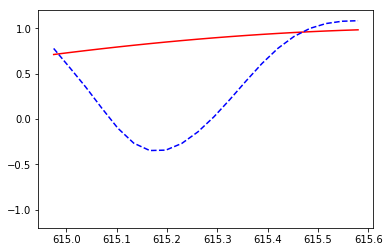

   [[615.61131988 615.64315087 615.67498186 615.70681285 615.73864383
  615.77047482 615.80230581 615.8341368  615.86596779 615.89779878
  615.92962977 615.96146075 615.99329174 616.02512273 616.05695372
  616.08878471 616.1206157  616.15244669 616.18427767 616.21610866]
 [616.24793965 616.27977064 616.31160163 616.34343262 616.37526361
  616.40709459 616.43892558 616.47075657 616.50258756 616.53441855
  616.56624954 616.59808053 616.62991152 616.6617425  616.69357349
  616.72540448 616.75723547 616.78906646 616.82089745 616.85272844]
 [616.88455942 616.91639041 616.9482214  616.98005239 617.01188338
  617.04371437 617.07554536 617.10737634 617.13920733 617.17103832
  617.20286931 617.2347003  617.26653129 617.29836228 617.33019326
  617.36202425 617.39385524 617.42568623 617.45751722 617.48934821]
 [617.5211792  617.55301019 617.58484117 617.61667216 617.64850315
  617.68033414 617.71216513 617.74399612 617.77582711 617.80765809
  617.83948908 617.87132007 617.90315106 617.93498205 61

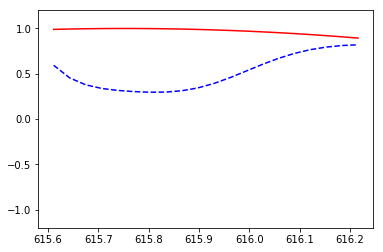

   [[616.24793965 616.27977064 616.31160163 616.34343262 616.37526361
  616.40709459 616.43892558 616.47075657 616.50258756 616.53441855
  616.56624954 616.59808053 616.62991152 616.6617425  616.69357349
  616.72540448 616.75723547 616.78906646 616.82089745 616.85272844]
 [616.88455942 616.91639041 616.9482214  616.98005239 617.01188338
  617.04371437 617.07554536 617.10737634 617.13920733 617.17103832
  617.20286931 617.2347003  617.26653129 617.29836228 617.33019326
  617.36202425 617.39385524 617.42568623 617.45751722 617.48934821]
 [617.5211792  617.55301019 617.58484117 617.61667216 617.64850315
  617.68033414 617.71216513 617.74399612 617.77582711 617.80765809
  617.83948908 617.87132007 617.90315106 617.93498205 617.96681304
  617.99864403 618.03047501 618.062306   618.09413699 618.12596798]
 [618.15779897 618.18962996 618.22146095 618.25329193 618.28512292
  618.31695391 618.3487849  618.38061589 618.41244688 618.44427787
  618.47610886 618.50793984 618.53977083 618.57160182 61

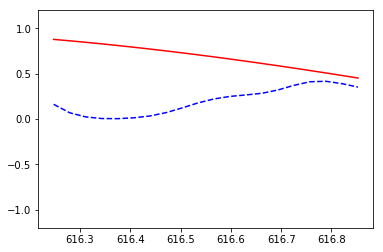

   [[616.88455942 616.91639041 616.9482214  616.98005239 617.01188338
  617.04371437 617.07554536 617.10737634 617.13920733 617.17103832
  617.20286931 617.2347003  617.26653129 617.29836228 617.33019326
  617.36202425 617.39385524 617.42568623 617.45751722 617.48934821]
 [617.5211792  617.55301019 617.58484117 617.61667216 617.64850315
  617.68033414 617.71216513 617.74399612 617.77582711 617.80765809
  617.83948908 617.87132007 617.90315106 617.93498205 617.96681304
  617.99864403 618.03047501 618.062306   618.09413699 618.12596798]
 [618.15779897 618.18962996 618.22146095 618.25329193 618.28512292
  618.31695391 618.3487849  618.38061589 618.41244688 618.44427787
  618.47610886 618.50793984 618.53977083 618.57160182 618.60343281
  618.6352638  618.66709479 618.69892578 618.73075676 618.76258775]
 [618.79441874 618.82624973 618.85808072 618.88991171 618.9217427
  618.95357368 618.98540467 619.01723566 619.04906665 619.08089764
  619.11272863 619.14455962 619.1763906  619.20822159 619

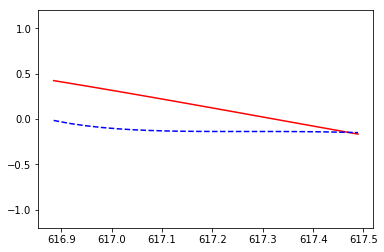

   [[617.5211792  617.55301019 617.58484117 617.61667216 617.64850315
  617.68033414 617.71216513 617.74399612 617.77582711 617.80765809
  617.83948908 617.87132007 617.90315106 617.93498205 617.96681304
  617.99864403 618.03047501 618.062306   618.09413699 618.12596798]
 [618.15779897 618.18962996 618.22146095 618.25329193 618.28512292
  618.31695391 618.3487849  618.38061589 618.41244688 618.44427787
  618.47610886 618.50793984 618.53977083 618.57160182 618.60343281
  618.6352638  618.66709479 618.69892578 618.73075676 618.76258775]
 [618.79441874 618.82624973 618.85808072 618.88991171 618.9217427
  618.95357368 618.98540467 619.01723566 619.04906665 619.08089764
  619.11272863 619.14455962 619.1763906  619.20822159 619.24005258
  619.27188357 619.30371456 619.33554555 619.36737654 619.39920753]
 [619.43103851 619.4628695  619.49470049 619.52653148 619.55836247
  619.59019346 619.62202445 619.65385543 619.68568642 619.71751741
  619.7493484  619.78117939 619.81301038 619.84484137 619

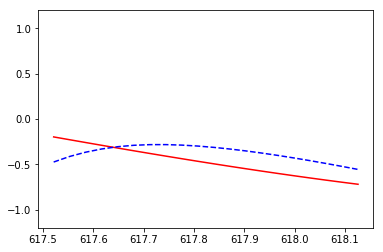

   [[618.15779897 618.18962996 618.22146095 618.25329193 618.28512292
  618.31695391 618.3487849  618.38061589 618.41244688 618.44427787
  618.47610886 618.50793984 618.53977083 618.57160182 618.60343281
  618.6352638  618.66709479 618.69892578 618.73075676 618.76258775]
 [618.79441874 618.82624973 618.85808072 618.88991171 618.9217427
  618.95357368 618.98540467 619.01723566 619.04906665 619.08089764
  619.11272863 619.14455962 619.1763906  619.20822159 619.24005258
  619.27188357 619.30371456 619.33554555 619.36737654 619.39920753]
 [619.43103851 619.4628695  619.49470049 619.52653148 619.55836247
  619.59019346 619.62202445 619.65385543 619.68568642 619.71751741
  619.7493484  619.78117939 619.81301038 619.84484137 619.87667235
  619.90850334 619.94033433 619.97216532 620.00399631 620.0358273 ]
 [620.06765829 620.09948927 620.13132026 620.16315125 620.19498224
  620.22681323 620.25864422 620.29047521 620.32230619 620.35413718
  620.38596817 620.41779916 620.44963015 620.48146114 620

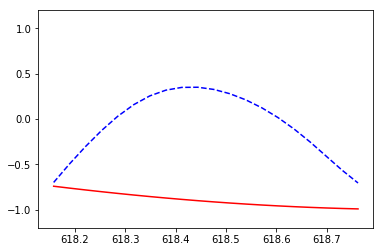

   [[618.79441874 618.82624973 618.85808072 618.88991171 618.9217427
  618.95357368 618.98540467 619.01723566 619.04906665 619.08089764
  619.11272863 619.14455962 619.1763906  619.20822159 619.24005258
  619.27188357 619.30371456 619.33554555 619.36737654 619.39920753]
 [619.43103851 619.4628695  619.49470049 619.52653148 619.55836247
  619.59019346 619.62202445 619.65385543 619.68568642 619.71751741
  619.7493484  619.78117939 619.81301038 619.84484137 619.87667235
  619.90850334 619.94033433 619.97216532 620.00399631 620.0358273 ]
 [620.06765829 620.09948927 620.13132026 620.16315125 620.19498224
  620.22681323 620.25864422 620.29047521 620.32230619 620.35413718
  620.38596817 620.41779916 620.44963015 620.48146114 620.51329213
  620.54512312 620.5769541  620.60878509 620.64061608 620.67244707]
 [620.70427806 620.73610905 620.76794004 620.79977102 620.83160201
  620.863433   620.89526399 620.92709498 620.95892597 620.99075696
  621.02258794 621.05441893 621.08624992 621.11808091 621

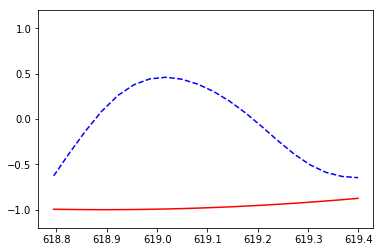

   0.011026878
   [[619.43103851 619.4628695  619.49470049 619.52653148 619.55836247
  619.59019346 619.62202445 619.65385543 619.68568642 619.71751741
  619.7493484  619.78117939 619.81301038 619.84484137 619.87667235
  619.90850334 619.94033433 619.97216532 620.00399631 620.0358273 ]
 [620.06765829 620.09948927 620.13132026 620.16315125 620.19498224
  620.22681323 620.25864422 620.29047521 620.32230619 620.35413718
  620.38596817 620.41779916 620.44963015 620.48146114 620.51329213
  620.54512312 620.5769541  620.60878509 620.64061608 620.67244707]
 [620.70427806 620.73610905 620.76794004 620.79977102 620.83160201
  620.863433   620.89526399 620.92709498 620.95892597 620.99075696
  621.02258794 621.05441893 621.08624992 621.11808091 621.1499119
  621.18174289 621.21357388 621.24540486 621.27723585 621.30906684]
 [621.34089783 621.37272882 621.40455981 621.4363908  621.46822179
  621.50005277 621.53188376 621.56371475 621.59554574 621.62737673
  621.65920772 621.69103871 621.72286969 6

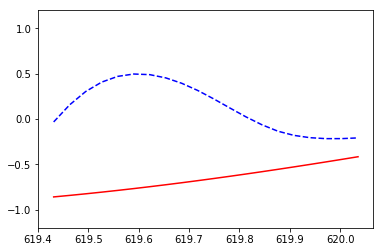

   [[620.06765829 620.09948927 620.13132026 620.16315125 620.19498224
  620.22681323 620.25864422 620.29047521 620.32230619 620.35413718
  620.38596817 620.41779916 620.44963015 620.48146114 620.51329213
  620.54512312 620.5769541  620.60878509 620.64061608 620.67244707]
 [620.70427806 620.73610905 620.76794004 620.79977102 620.83160201
  620.863433   620.89526399 620.92709498 620.95892597 620.99075696
  621.02258794 621.05441893 621.08624992 621.11808091 621.1499119
  621.18174289 621.21357388 621.24540486 621.27723585 621.30906684]
 [621.34089783 621.37272882 621.40455981 621.4363908  621.46822179
  621.50005277 621.53188376 621.56371475 621.59554574 621.62737673
  621.65920772 621.69103871 621.72286969 621.75470068 621.78653167
  621.81836266 621.85019365 621.88202464 621.91385563 621.94568661]
 [621.9775176  622.00934859 622.04117958 622.07301057 622.10484156
  622.13667255 622.16850353 622.20033452 622.23216551 622.2639965
  622.29582749 622.32765848 622.35948947 622.39132046 622.

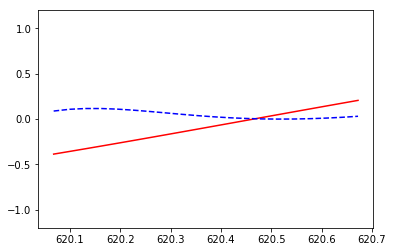

   [[620.70427806 620.73610905 620.76794004 620.79977102 620.83160201
  620.863433   620.89526399 620.92709498 620.95892597 620.99075696
  621.02258794 621.05441893 621.08624992 621.11808091 621.1499119
  621.18174289 621.21357388 621.24540486 621.27723585 621.30906684]
 [621.34089783 621.37272882 621.40455981 621.4363908  621.46822179
  621.50005277 621.53188376 621.56371475 621.59554574 621.62737673
  621.65920772 621.69103871 621.72286969 621.75470068 621.78653167
  621.81836266 621.85019365 621.88202464 621.91385563 621.94568661]
 [621.9775176  622.00934859 622.04117958 622.07301057 622.10484156
  622.13667255 622.16850353 622.20033452 622.23216551 622.2639965
  622.29582749 622.32765848 622.35948947 622.39132046 622.42315144
  622.45498243 622.48681342 622.51864441 622.5504754  622.58230639]
 [622.61413738 622.64596836 622.67779935 622.70963034 622.74146133
  622.77329232 622.80512331 622.8369543  622.86878528 622.90061627
  622.93244726 622.96427825 622.99610924 623.02794023 623.

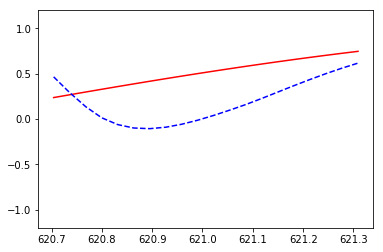

   [[621.34089783 621.37272882 621.40455981 621.4363908  621.46822179
  621.50005277 621.53188376 621.56371475 621.59554574 621.62737673
  621.65920772 621.69103871 621.72286969 621.75470068 621.78653167
  621.81836266 621.85019365 621.88202464 621.91385563 621.94568661]
 [621.9775176  622.00934859 622.04117958 622.07301057 622.10484156
  622.13667255 622.16850353 622.20033452 622.23216551 622.2639965
  622.29582749 622.32765848 622.35948947 622.39132046 622.42315144
  622.45498243 622.48681342 622.51864441 622.5504754  622.58230639]
 [622.61413738 622.64596836 622.67779935 622.70963034 622.74146133
  622.77329232 622.80512331 622.8369543  622.86878528 622.90061627
  622.93244726 622.96427825 622.99610924 623.02794023 623.05977122
  623.0916022  623.12343319 623.15526418 623.18709517 623.21892616]
 [623.25075715 623.28258814 623.31441913 623.34625011 623.3780811
  623.40991209 623.44174308 623.47357407 623.50540506 623.53723605
  623.56906703 623.60089802 623.63272901 623.66456    623.

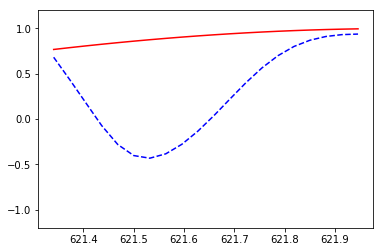

   [[621.9775176  622.00934859 622.04117958 622.07301057 622.10484156
  622.13667255 622.16850353 622.20033452 622.23216551 622.2639965
  622.29582749 622.32765848 622.35948947 622.39132046 622.42315144
  622.45498243 622.48681342 622.51864441 622.5504754  622.58230639]
 [622.61413738 622.64596836 622.67779935 622.70963034 622.74146133
  622.77329232 622.80512331 622.8369543  622.86878528 622.90061627
  622.93244726 622.96427825 622.99610924 623.02794023 623.05977122
  623.0916022  623.12343319 623.15526418 623.18709517 623.21892616]
 [623.25075715 623.28258814 623.31441913 623.34625011 623.3780811
  623.40991209 623.44174308 623.47357407 623.50540506 623.53723605
  623.56906703 623.60089802 623.63272901 623.66456    623.69639099
  623.72822198 623.76005297 623.79188395 623.82371494 623.85554593]
 [623.88737692 623.91920791 623.9510389  623.98286989 624.01470087
  624.04653186 624.07836285 624.11019384 624.14202483 624.17385582
  624.20568681 624.2375178  624.26934878 624.30117977 624.

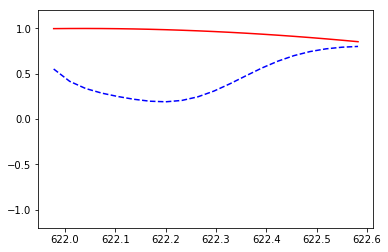

   [[622.61413738 622.64596836 622.67779935 622.70963034 622.74146133
  622.77329232 622.80512331 622.8369543  622.86878528 622.90061627
  622.93244726 622.96427825 622.99610924 623.02794023 623.05977122
  623.0916022  623.12343319 623.15526418 623.18709517 623.21892616]
 [623.25075715 623.28258814 623.31441913 623.34625011 623.3780811
  623.40991209 623.44174308 623.47357407 623.50540506 623.53723605
  623.56906703 623.60089802 623.63272901 623.66456    623.69639099
  623.72822198 623.76005297 623.79188395 623.82371494 623.85554593]
 [623.88737692 623.91920791 623.9510389  623.98286989 624.01470087
  624.04653186 624.07836285 624.11019384 624.14202483 624.17385582
  624.20568681 624.2375178  624.26934878 624.30117977 624.33301076
  624.36484175 624.39667274 624.42850373 624.46033472 624.4921657 ]
 [624.52399669 624.55582768 624.58765867 624.61948966 624.65132065
  624.68315164 624.71498262 624.74681361 624.7786446  624.81047559
  624.84230658 624.87413757 624.90596856 624.93779954 624

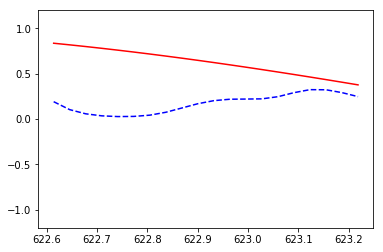

   [[623.25075715 623.28258814 623.31441913 623.34625011 623.3780811
  623.40991209 623.44174308 623.47357407 623.50540506 623.53723605
  623.56906703 623.60089802 623.63272901 623.66456    623.69639099
  623.72822198 623.76005297 623.79188395 623.82371494 623.85554593]
 [623.88737692 623.91920791 623.9510389  623.98286989 624.01470087
  624.04653186 624.07836285 624.11019384 624.14202483 624.17385582
  624.20568681 624.2375178  624.26934878 624.30117977 624.33301076
  624.36484175 624.39667274 624.42850373 624.46033472 624.4921657 ]
 [624.52399669 624.55582768 624.58765867 624.61948966 624.65132065
  624.68315164 624.71498262 624.74681361 624.7786446  624.81047559
  624.84230658 624.87413757 624.90596856 624.93779954 624.96963053
  625.00146152 625.03329251 625.0651235  625.09695449 625.12878548]
 [625.16061646 625.19244745 625.22427844 625.25610943 625.28794042
  625.31977141 625.3516024  625.38343339 625.41526437 625.44709536
  625.47892635 625.51075734 625.54258833 625.57441932 625

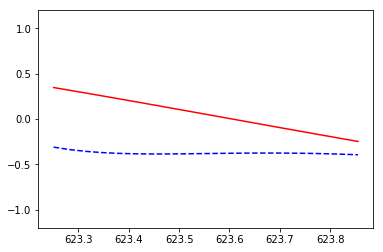

   [[623.88737692 623.91920791 623.9510389  623.98286989 624.01470087
  624.04653186 624.07836285 624.11019384 624.14202483 624.17385582
  624.20568681 624.2375178  624.26934878 624.30117977 624.33301076
  624.36484175 624.39667274 624.42850373 624.46033472 624.4921657 ]
 [624.52399669 624.55582768 624.58765867 624.61948966 624.65132065
  624.68315164 624.71498262 624.74681361 624.7786446  624.81047559
  624.84230658 624.87413757 624.90596856 624.93779954 624.96963053
  625.00146152 625.03329251 625.0651235  625.09695449 625.12878548]
 [625.16061646 625.19244745 625.22427844 625.25610943 625.28794042
  625.31977141 625.3516024  625.38343339 625.41526437 625.44709536
  625.47892635 625.51075734 625.54258833 625.57441932 625.60625031
  625.63808129 625.66991228 625.70174327 625.73357426 625.76540525]
 [625.79723624 625.82906723 625.86089821 625.8927292  625.92456019
  625.95639118 625.98822217 626.02005316 626.05188415 626.08371513
  626.11554612 626.14737711 626.1792081  626.21103909 62

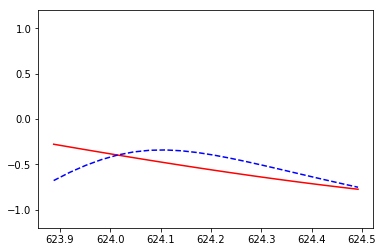

   [[624.52399669 624.55582768 624.58765867 624.61948966 624.65132065
  624.68315164 624.71498262 624.74681361 624.7786446  624.81047559
  624.84230658 624.87413757 624.90596856 624.93779954 624.96963053
  625.00146152 625.03329251 625.0651235  625.09695449 625.12878548]
 [625.16061646 625.19244745 625.22427844 625.25610943 625.28794042
  625.31977141 625.3516024  625.38343339 625.41526437 625.44709536
  625.47892635 625.51075734 625.54258833 625.57441932 625.60625031
  625.63808129 625.66991228 625.70174327 625.73357426 625.76540525]
 [625.79723624 625.82906723 625.86089821 625.8927292  625.92456019
  625.95639118 625.98822217 626.02005316 626.05188415 626.08371513
  626.11554612 626.14737711 626.1792081  626.21103909 626.24287008
  626.27470107 626.30653206 626.33836304 626.37019403 626.40202502]
 [626.43385601 626.465687   626.49751799 626.52934898 626.56117996
  626.59301095 626.62484194 626.65667293 626.68850392 626.72033491
  626.7521659  626.78399688 626.81582787 626.84765886 62

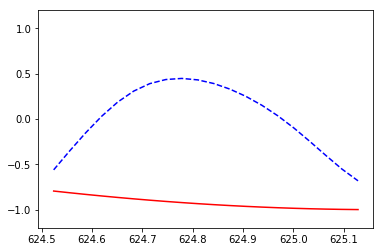

   [[625.16061646 625.19244745 625.22427844 625.25610943 625.28794042
  625.31977141 625.3516024  625.38343339 625.41526437 625.44709536
  625.47892635 625.51075734 625.54258833 625.57441932 625.60625031
  625.63808129 625.66991228 625.70174327 625.73357426 625.76540525]
 [625.79723624 625.82906723 625.86089821 625.8927292  625.92456019
  625.95639118 625.98822217 626.02005316 626.05188415 626.08371513
  626.11554612 626.14737711 626.1792081  626.21103909 626.24287008
  626.27470107 626.30653206 626.33836304 626.37019403 626.40202502]
 [626.43385601 626.465687   626.49751799 626.52934898 626.56117996
  626.59301095 626.62484194 626.65667293 626.68850392 626.72033491
  626.7521659  626.78399688 626.81582787 626.84765886 626.87948985
  626.91132084 626.94315183 626.97498282 627.0068138  627.03864479]
 [627.07047578 627.10230677 627.13413776 627.16596875 627.19779974
  627.22963073 627.26146171 627.2932927  627.32512369 627.35695468
  627.38878567 627.42061666 627.45244765 627.48427863 62

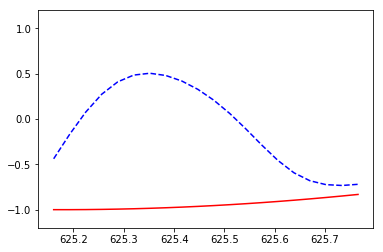

   0.0094730295
   [[625.79723624 625.82906723 625.86089821 625.8927292  625.92456019
  625.95639118 625.98822217 626.02005316 626.05188415 626.08371513
  626.11554612 626.14737711 626.1792081  626.21103909 626.24287008
  626.27470107 626.30653206 626.33836304 626.37019403 626.40202502]
 [626.43385601 626.465687   626.49751799 626.52934898 626.56117996
  626.59301095 626.62484194 626.65667293 626.68850392 626.72033491
  626.7521659  626.78399688 626.81582787 626.84765886 626.87948985
  626.91132084 626.94315183 626.97498282 627.0068138  627.03864479]
 [627.07047578 627.10230677 627.13413776 627.16596875 627.19779974
  627.22963073 627.26146171 627.2932927  627.32512369 627.35695468
  627.38878567 627.42061666 627.45244765 627.48427863 627.51610962
  627.54794061 627.5797716  627.61160259 627.64343358 627.67526457]
 [627.70709555 627.73892654 627.77075753 627.80258852 627.83441951
  627.8662505  627.89808149 627.92991247 627.96174346 627.99357445
  628.02540544 628.05723643 628.08906742

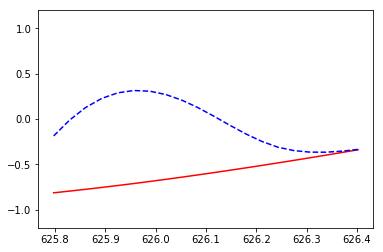

   [[626.43385601 626.465687   626.49751799 626.52934898 626.56117996
  626.59301095 626.62484194 626.65667293 626.68850392 626.72033491
  626.7521659  626.78399688 626.81582787 626.84765886 626.87948985
  626.91132084 626.94315183 626.97498282 627.0068138  627.03864479]
 [627.07047578 627.10230677 627.13413776 627.16596875 627.19779974
  627.22963073 627.26146171 627.2932927  627.32512369 627.35695468
  627.38878567 627.42061666 627.45244765 627.48427863 627.51610962
  627.54794061 627.5797716  627.61160259 627.64343358 627.67526457]
 [627.70709555 627.73892654 627.77075753 627.80258852 627.83441951
  627.8662505  627.89808149 627.92991247 627.96174346 627.99357445
  628.02540544 628.05723643 628.08906742 628.12089841 628.1527294
  628.18456038 628.21639137 628.24822236 628.28005335 628.31188434]
 [628.34371533 628.37554632 628.4073773  628.43920829 628.47103928
  628.50287027 628.53470126 628.56653225 628.59836324 628.63019422
  628.66202521 628.6938562  628.72568719 628.75751818 628

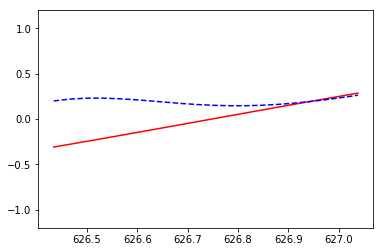

   [[627.07047578 627.10230677 627.13413776 627.16596875 627.19779974
  627.22963073 627.26146171 627.2932927  627.32512369 627.35695468
  627.38878567 627.42061666 627.45244765 627.48427863 627.51610962
  627.54794061 627.5797716  627.61160259 627.64343358 627.67526457]
 [627.70709555 627.73892654 627.77075753 627.80258852 627.83441951
  627.8662505  627.89808149 627.92991247 627.96174346 627.99357445
  628.02540544 628.05723643 628.08906742 628.12089841 628.1527294
  628.18456038 628.21639137 628.24822236 628.28005335 628.31188434]
 [628.34371533 628.37554632 628.4073773  628.43920829 628.47103928
  628.50287027 628.53470126 628.56653225 628.59836324 628.63019422
  628.66202521 628.6938562  628.72568719 628.75751818 628.78934917
  628.82118016 628.85301114 628.88484213 628.91667312 628.94850411]
 [628.9803351  629.01216609 629.04399708 629.07582807 629.10765905
  629.13949004 629.17132103 629.20315202 629.23498301 629.266814
  629.29864499 629.33047597 629.36230696 629.39413795 629.4

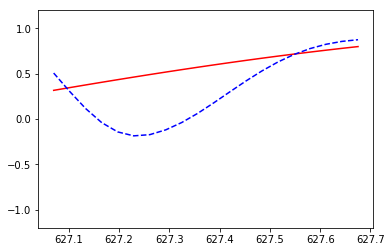

   [[627.70709555 627.73892654 627.77075753 627.80258852 627.83441951
  627.8662505  627.89808149 627.92991247 627.96174346 627.99357445
  628.02540544 628.05723643 628.08906742 628.12089841 628.1527294
  628.18456038 628.21639137 628.24822236 628.28005335 628.31188434]
 [628.34371533 628.37554632 628.4073773  628.43920829 628.47103928
  628.50287027 628.53470126 628.56653225 628.59836324 628.63019422
  628.66202521 628.6938562  628.72568719 628.75751818 628.78934917
  628.82118016 628.85301114 628.88484213 628.91667312 628.94850411]
 [628.9803351  629.01216609 629.04399708 629.07582807 629.10765905
  629.13949004 629.17132103 629.20315202 629.23498301 629.266814
  629.29864499 629.33047597 629.36230696 629.39413795 629.42596894
  629.45779993 629.48963092 629.52146191 629.55329289 629.58512388]
 [629.61695487 629.64878586 629.68061685 629.71244784 629.74427883
  629.77610981 629.8079408  629.83977179 629.87160278 629.90343377
  629.93526476 629.96709575 629.99892673 630.03075772 630.0

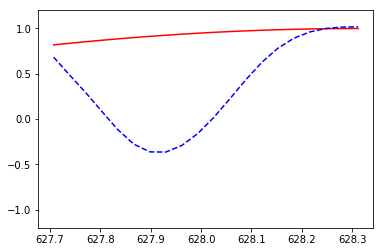

   [[628.34371533 628.37554632 628.4073773  628.43920829 628.47103928
  628.50287027 628.53470126 628.56653225 628.59836324 628.63019422
  628.66202521 628.6938562  628.72568719 628.75751818 628.78934917
  628.82118016 628.85301114 628.88484213 628.91667312 628.94850411]
 [628.9803351  629.01216609 629.04399708 629.07582807 629.10765905
  629.13949004 629.17132103 629.20315202 629.23498301 629.266814
  629.29864499 629.33047597 629.36230696 629.39413795 629.42596894
  629.45779993 629.48963092 629.52146191 629.55329289 629.58512388]
 [629.61695487 629.64878586 629.68061685 629.71244784 629.74427883
  629.77610981 629.8079408  629.83977179 629.87160278 629.90343377
  629.93526476 629.96709575 629.99892673 630.03075772 630.06258871
  630.0944197  630.12625069 630.15808168 630.18991267 630.22174366]
 [630.25357464 630.28540563 630.31723662 630.34906761 630.3808986
  630.41272959 630.44456058 630.47639156 630.50822255 630.54005354
  630.57188453 630.60371552 630.63554651 630.6673775  630.6

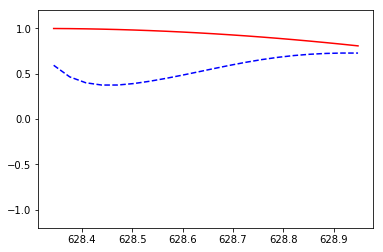

   [[628.9803351  629.01216609 629.04399708 629.07582807 629.10765905
  629.13949004 629.17132103 629.20315202 629.23498301 629.266814
  629.29864499 629.33047597 629.36230696 629.39413795 629.42596894
  629.45779993 629.48963092 629.52146191 629.55329289 629.58512388]
 [629.61695487 629.64878586 629.68061685 629.71244784 629.74427883
  629.77610981 629.8079408  629.83977179 629.87160278 629.90343377
  629.93526476 629.96709575 629.99892673 630.03075772 630.06258871
  630.0944197  630.12625069 630.15808168 630.18991267 630.22174366]
 [630.25357464 630.28540563 630.31723662 630.34906761 630.3808986
  630.41272959 630.44456058 630.47639156 630.50822255 630.54005354
  630.57188453 630.60371552 630.63554651 630.6673775  630.69920848
  630.73103947 630.76287046 630.79470145 630.82653244 630.85836343]
 [630.89019442 630.9220254  630.95385639 630.98568738 631.01751837
  631.04934936 631.08118035 631.11301134 631.14484233 631.17667331
  631.2085043  631.24033529 631.27216628 631.30399727 631.3

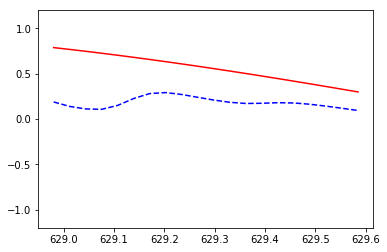

   [[629.61695487 629.64878586 629.68061685 629.71244784 629.74427883
  629.77610981 629.8079408  629.83977179 629.87160278 629.90343377
  629.93526476 629.96709575 629.99892673 630.03075772 630.06258871
  630.0944197  630.12625069 630.15808168 630.18991267 630.22174366]
 [630.25357464 630.28540563 630.31723662 630.34906761 630.3808986
  630.41272959 630.44456058 630.47639156 630.50822255 630.54005354
  630.57188453 630.60371552 630.63554651 630.6673775  630.69920848
  630.73103947 630.76287046 630.79470145 630.82653244 630.85836343]
 [630.89019442 630.9220254  630.95385639 630.98568738 631.01751837
  631.04934936 631.08118035 631.11301134 631.14484233 631.17667331
  631.2085043  631.24033529 631.27216628 631.30399727 631.33582826
  631.36765925 631.39949023 631.43132122 631.46315221 631.4949832 ]
 [631.52681419 631.55864518 631.59047617 631.62230715 631.65413814
  631.68596913 631.71780012 631.74963111 631.7814621  631.81329309
  631.84512407 631.87695506 631.90878605 631.94061704 631

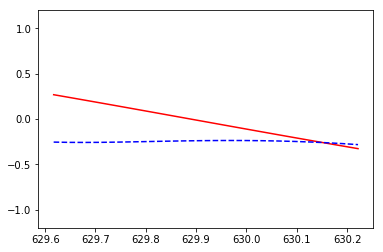

   [[630.25357464 630.28540563 630.31723662 630.34906761 630.3808986
  630.41272959 630.44456058 630.47639156 630.50822255 630.54005354
  630.57188453 630.60371552 630.63554651 630.6673775  630.69920848
  630.73103947 630.76287046 630.79470145 630.82653244 630.85836343]
 [630.89019442 630.9220254  630.95385639 630.98568738 631.01751837
  631.04934936 631.08118035 631.11301134 631.14484233 631.17667331
  631.2085043  631.24033529 631.27216628 631.30399727 631.33582826
  631.36765925 631.39949023 631.43132122 631.46315221 631.4949832 ]
 [631.52681419 631.55864518 631.59047617 631.62230715 631.65413814
  631.68596913 631.71780012 631.74963111 631.7814621  631.81329309
  631.84512407 631.87695506 631.90878605 631.94061704 631.97244803
  632.00427902 632.03611001 632.067941   632.09977198 632.13160297]
 [632.16343396 632.19526495 632.22709594 632.25892693 632.29075792
  632.3225889  632.35441989 632.38625088 632.41808187 632.44991286
  632.48174385 632.51357484 632.54540582 632.57723681 632

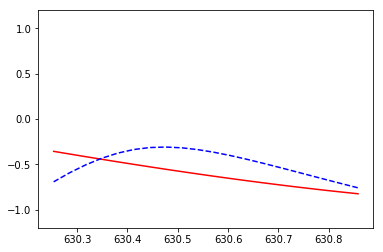

   [[630.89019442 630.9220254  630.95385639 630.98568738 631.01751837
  631.04934936 631.08118035 631.11301134 631.14484233 631.17667331
  631.2085043  631.24033529 631.27216628 631.30399727 631.33582826
  631.36765925 631.39949023 631.43132122 631.46315221 631.4949832 ]
 [631.52681419 631.55864518 631.59047617 631.62230715 631.65413814
  631.68596913 631.71780012 631.74963111 631.7814621  631.81329309
  631.84512407 631.87695506 631.90878605 631.94061704 631.97244803
  632.00427902 632.03611001 632.067941   632.09977198 632.13160297]
 [632.16343396 632.19526495 632.22709594 632.25892693 632.29075792
  632.3225889  632.35441989 632.38625088 632.41808187 632.44991286
  632.48174385 632.51357484 632.54540582 632.57723681 632.6090678
  632.64089879 632.67272978 632.70456077 632.73639176 632.76822274]
 [632.80005373 632.83188472 632.86371571 632.8955467  632.92737769
  632.95920868 632.99103967 633.02287065 633.05470164 633.08653263
  633.11836362 633.15019461 633.1820256  633.21385659 633

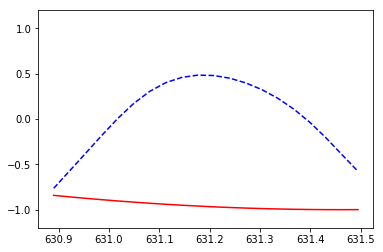

   [[631.52681419 631.55864518 631.59047617 631.62230715 631.65413814
  631.68596913 631.71780012 631.74963111 631.7814621  631.81329309
  631.84512407 631.87695506 631.90878605 631.94061704 631.97244803
  632.00427902 632.03611001 632.067941   632.09977198 632.13160297]
 [632.16343396 632.19526495 632.22709594 632.25892693 632.29075792
  632.3225889  632.35441989 632.38625088 632.41808187 632.44991286
  632.48174385 632.51357484 632.54540582 632.57723681 632.6090678
  632.64089879 632.67272978 632.70456077 632.73639176 632.76822274]
 [632.80005373 632.83188472 632.86371571 632.8955467  632.92737769
  632.95920868 632.99103967 633.02287065 633.05470164 633.08653263
  633.11836362 633.15019461 633.1820256  633.21385659 633.24568757
  633.27751856 633.30934955 633.34118054 633.37301153 633.40484252]
 [633.43667351 633.46850449 633.50033548 633.53216647 633.56399746
  633.59582845 633.62765944 633.65949043 633.69132141 633.7231524
  633.75498339 633.78681438 633.81864537 633.85047636 633.

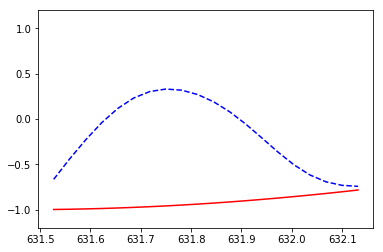

   0.008355244
   [[632.16343396 632.19526495 632.22709594 632.25892693 632.29075792
  632.3225889  632.35441989 632.38625088 632.41808187 632.44991286
  632.48174385 632.51357484 632.54540582 632.57723681 632.6090678
  632.64089879 632.67272978 632.70456077 632.73639176 632.76822274]
 [632.80005373 632.83188472 632.86371571 632.8955467  632.92737769
  632.95920868 632.99103967 633.02287065 633.05470164 633.08653263
  633.11836362 633.15019461 633.1820256  633.21385659 633.24568757
  633.27751856 633.30934955 633.34118054 633.37301153 633.40484252]
 [633.43667351 633.46850449 633.50033548 633.53216647 633.56399746
  633.59582845 633.62765944 633.65949043 633.69132141 633.7231524
  633.75498339 633.78681438 633.81864537 633.85047636 633.88230735
  633.91413834 633.94596932 633.97780031 634.0096313  634.04146229]
 [634.07329328 634.10512427 634.13695526 634.16878624 634.20061723
  634.23244822 634.26427921 634.2961102  634.32794119 634.35977218
  634.39160316 634.42343415 634.45526514 63

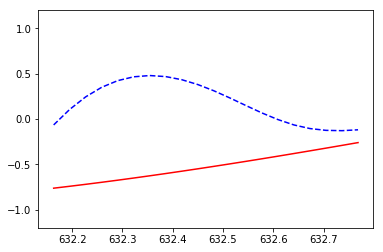

   [[632.80005373 632.83188472 632.86371571 632.8955467  632.92737769
  632.95920868 632.99103967 633.02287065 633.05470164 633.08653263
  633.11836362 633.15019461 633.1820256  633.21385659 633.24568757
  633.27751856 633.30934955 633.34118054 633.37301153 633.40484252]
 [633.43667351 633.46850449 633.50033548 633.53216647 633.56399746
  633.59582845 633.62765944 633.65949043 633.69132141 633.7231524
  633.75498339 633.78681438 633.81864537 633.85047636 633.88230735
  633.91413834 633.94596932 633.97780031 634.0096313  634.04146229]
 [634.07329328 634.10512427 634.13695526 634.16878624 634.20061723
  634.23244822 634.26427921 634.2961102  634.32794119 634.35977218
  634.39160316 634.42343415 634.45526514 634.48709613 634.51892712
  634.55075811 634.5825891  634.61442008 634.64625107 634.67808206]
 [634.70991305 634.74174404 634.77357503 634.80540602 634.837237
  634.86906799 634.90089898 634.93272997 634.96456096 634.99639195
  635.02822294 635.06005393 635.09188491 635.1237159  635.1

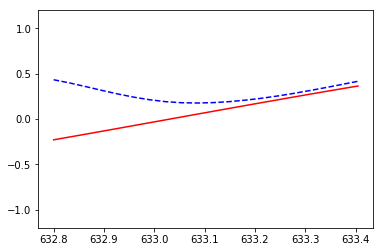

   [[633.43667351 633.46850449 633.50033548 633.53216647 633.56399746
  633.59582845 633.62765944 633.65949043 633.69132141 633.7231524
  633.75498339 633.78681438 633.81864537 633.85047636 633.88230735
  633.91413834 633.94596932 633.97780031 634.0096313  634.04146229]
 [634.07329328 634.10512427 634.13695526 634.16878624 634.20061723
  634.23244822 634.26427921 634.2961102  634.32794119 634.35977218
  634.39160316 634.42343415 634.45526514 634.48709613 634.51892712
  634.55075811 634.5825891  634.61442008 634.64625107 634.67808206]
 [634.70991305 634.74174404 634.77357503 634.80540602 634.837237
  634.86906799 634.90089898 634.93272997 634.96456096 634.99639195
  635.02822294 635.06005393 635.09188491 635.1237159  635.15554689
  635.18737788 635.21920887 635.25103986 635.28287085 635.31470183]
 [635.34653282 635.37836381 635.4101948  635.44202579 635.47385678
  635.50568777 635.53751875 635.56934974 635.60118073 635.63301172
  635.66484271 635.6966737  635.72850469 635.76033567 635.7

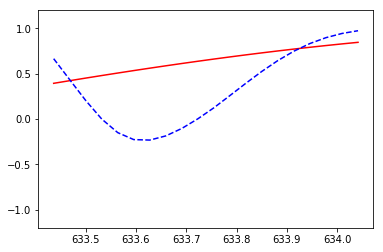

   [[634.07329328 634.10512427 634.13695526 634.16878624 634.20061723
  634.23244822 634.26427921 634.2961102  634.32794119 634.35977218
  634.39160316 634.42343415 634.45526514 634.48709613 634.51892712
  634.55075811 634.5825891  634.61442008 634.64625107 634.67808206]
 [634.70991305 634.74174404 634.77357503 634.80540602 634.837237
  634.86906799 634.90089898 634.93272997 634.96456096 634.99639195
  635.02822294 635.06005393 635.09188491 635.1237159  635.15554689
  635.18737788 635.21920887 635.25103986 635.28287085 635.31470183]
 [635.34653282 635.37836381 635.4101948  635.44202579 635.47385678
  635.50568777 635.53751875 635.56934974 635.60118073 635.63301172
  635.66484271 635.6966737  635.72850469 635.76033567 635.79216666
  635.82399765 635.85582864 635.88765963 635.91949062 635.95132161]
 [635.9831526  636.01498358 636.04681457 636.07864556 636.11047655
  636.14230754 636.17413853 636.20596952 636.2378005  636.26963149
  636.30146248 636.33329347 636.36512446 636.39695545 636.

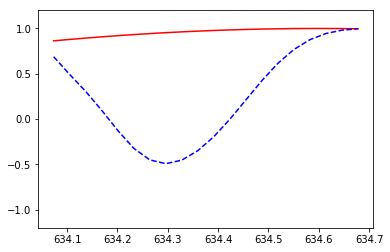

   [[634.70991305 634.74174404 634.77357503 634.80540602 634.837237
  634.86906799 634.90089898 634.93272997 634.96456096 634.99639195
  635.02822294 635.06005393 635.09188491 635.1237159  635.15554689
  635.18737788 635.21920887 635.25103986 635.28287085 635.31470183]
 [635.34653282 635.37836381 635.4101948  635.44202579 635.47385678
  635.50568777 635.53751875 635.56934974 635.60118073 635.63301172
  635.66484271 635.6966737  635.72850469 635.76033567 635.79216666
  635.82399765 635.85582864 635.88765963 635.91949062 635.95132161]
 [635.9831526  636.01498358 636.04681457 636.07864556 636.11047655
  636.14230754 636.17413853 636.20596952 636.2378005  636.26963149
  636.30146248 636.33329347 636.36512446 636.39695545 636.42878644
  636.46061742 636.49244841 636.5242794  636.55611039 636.58794138]
 [636.61977237 636.65160336 636.68343434 636.71526533 636.74709632
  636.77892731 636.8107583  636.84258929 636.87442028 636.90625127
  636.93808225 636.96991324 637.00174423 637.03357522 637.

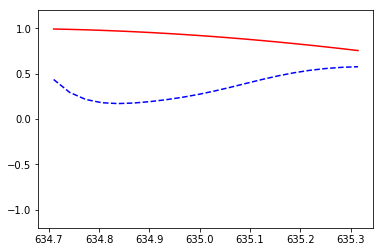

   [[635.34653282 635.37836381 635.4101948  635.44202579 635.47385678
  635.50568777 635.53751875 635.56934974 635.60118073 635.63301172
  635.66484271 635.6966737  635.72850469 635.76033567 635.79216666
  635.82399765 635.85582864 635.88765963 635.91949062 635.95132161]
 [635.9831526  636.01498358 636.04681457 636.07864556 636.11047655
  636.14230754 636.17413853 636.20596952 636.2378005  636.26963149
  636.30146248 636.33329347 636.36512446 636.39695545 636.42878644
  636.46061742 636.49244841 636.5242794  636.55611039 636.58794138]
 [636.61977237 636.65160336 636.68343434 636.71526533 636.74709632
  636.77892731 636.8107583  636.84258929 636.87442028 636.90625127
  636.93808225 636.96991324 637.00174423 637.03357522 637.06540621
  637.0972372  637.12906819 637.16089917 637.19273016 637.22456115]
 [637.25639214 637.28822313 637.32005412 637.35188511 637.38371609
  637.41554708 637.44737807 637.47920906 637.51104005 637.54287104
  637.57470203 637.60653301 637.638364   637.67019499 63

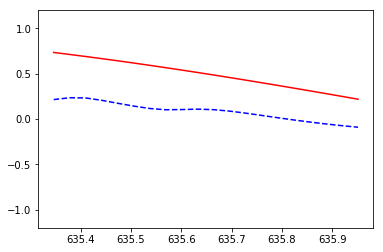

   [[635.9831526  636.01498358 636.04681457 636.07864556 636.11047655
  636.14230754 636.17413853 636.20596952 636.2378005  636.26963149
  636.30146248 636.33329347 636.36512446 636.39695545 636.42878644
  636.46061742 636.49244841 636.5242794  636.55611039 636.58794138]
 [636.61977237 636.65160336 636.68343434 636.71526533 636.74709632
  636.77892731 636.8107583  636.84258929 636.87442028 636.90625127
  636.93808225 636.96991324 637.00174423 637.03357522 637.06540621
  637.0972372  637.12906819 637.16089917 637.19273016 637.22456115]
 [637.25639214 637.28822313 637.32005412 637.35188511 637.38371609
  637.41554708 637.44737807 637.47920906 637.51104005 637.54287104
  637.57470203 637.60653301 637.638364   637.67019499 637.70202598
  637.73385697 637.76568796 637.79751895 637.82934994 637.86118092]
 [637.89301191 637.9248429  637.95667389 637.98850488 638.02033587
  638.05216686 638.08399784 638.11582883 638.14765982 638.17949081
  638.2113218  638.24315279 638.27498378 638.30681476 63

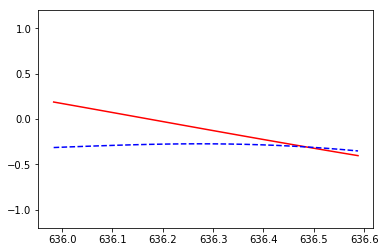

   [[636.61977237 636.65160336 636.68343434 636.71526533 636.74709632
  636.77892731 636.8107583  636.84258929 636.87442028 636.90625127
  636.93808225 636.96991324 637.00174423 637.03357522 637.06540621
  637.0972372  637.12906819 637.16089917 637.19273016 637.22456115]
 [637.25639214 637.28822313 637.32005412 637.35188511 637.38371609
  637.41554708 637.44737807 637.47920906 637.51104005 637.54287104
  637.57470203 637.60653301 637.638364   637.67019499 637.70202598
  637.73385697 637.76568796 637.79751895 637.82934994 637.86118092]
 [637.89301191 637.9248429  637.95667389 637.98850488 638.02033587
  638.05216686 638.08399784 638.11582883 638.14765982 638.17949081
  638.2113218  638.24315279 638.27498378 638.30681476 638.33864575
  638.37047674 638.40230773 638.43413872 638.46596971 638.4978007 ]
 [638.52963168 638.56146267 638.59329366 638.62512465 638.65695564
  638.68878663 638.72061762 638.75244861 638.78427959 638.81611058
  638.84794157 638.87977256 638.91160355 638.94343454 63

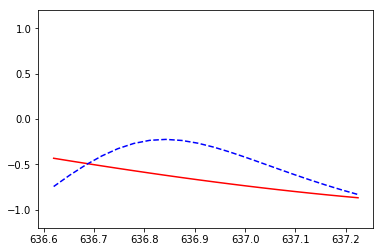

   [[637.25639214 637.28822313 637.32005412 637.35188511 637.38371609
  637.41554708 637.44737807 637.47920906 637.51104005 637.54287104
  637.57470203 637.60653301 637.638364   637.67019499 637.70202598
  637.73385697 637.76568796 637.79751895 637.82934994 637.86118092]
 [637.89301191 637.9248429  637.95667389 637.98850488 638.02033587
  638.05216686 638.08399784 638.11582883 638.14765982 638.17949081
  638.2113218  638.24315279 638.27498378 638.30681476 638.33864575
  638.37047674 638.40230773 638.43413872 638.46596971 638.4978007 ]
 [638.52963168 638.56146267 638.59329366 638.62512465 638.65695564
  638.68878663 638.72061762 638.75244861 638.78427959 638.81611058
  638.84794157 638.87977256 638.91160355 638.94343454 638.97526553
  639.00709651 639.0389275  639.07075849 639.10258948 639.13442047]
 [639.16625146 639.19808245 639.22991343 639.26174442 639.29357541
  639.3254064  639.35723739 639.38906838 639.42089937 639.45273035
  639.48456134 639.51639233 639.54822332 639.58005431 63

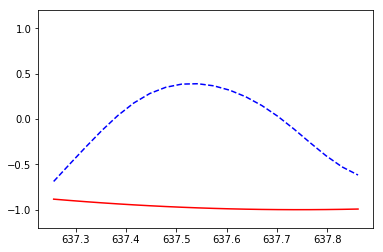

   [[637.89301191 637.9248429  637.95667389 637.98850488 638.02033587
  638.05216686 638.08399784 638.11582883 638.14765982 638.17949081
  638.2113218  638.24315279 638.27498378 638.30681476 638.33864575
  638.37047674 638.40230773 638.43413872 638.46596971 638.4978007 ]
 [638.52963168 638.56146267 638.59329366 638.62512465 638.65695564
  638.68878663 638.72061762 638.75244861 638.78427959 638.81611058
  638.84794157 638.87977256 638.91160355 638.94343454 638.97526553
  639.00709651 639.0389275  639.07075849 639.10258948 639.13442047]
 [639.16625146 639.19808245 639.22991343 639.26174442 639.29357541
  639.3254064  639.35723739 639.38906838 639.42089937 639.45273035
  639.48456134 639.51639233 639.54822332 639.58005431 639.6118853
  639.64371629 639.67554727 639.70737826 639.73920925 639.77104024]
 [639.80287123 639.83470222 639.86653321 639.8983642  639.93019518
  639.96202617 639.99385716 640.02568815 640.05751914 640.08935013
  640.12118112 640.1530121  640.18484309 640.21667408 640

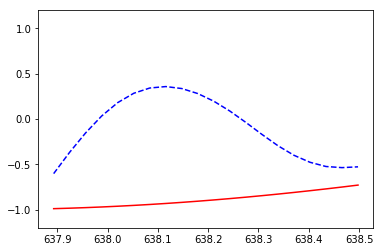

   0.011303247


In [9]:
model = Sequential()
#加入LSTM神经网络
model.add(LSTM(
    batch_input_shape=(batch_size,time_steps,input_size),
    output_dim=cell_size, #输出的大小
    return_sequences=True, #开启循环返回
    stateful=True #存储到神经网络
))
model.add(TimeDistributed(Dense(output_size))) #时间传播
adam = Adam(LR) #优化的参数
model.compile(optimizer=adam,
              loss="mse",) #编译
print("  训练----------------------------")
for step in range(501):
    x_batch,y_batch,xs=get_batch() #抓取数据
    cost = model.train_on_batch(x_batch,y_batch) #训练
    predict = model.predict(x_batch,batch_size) #预测
    plt.plot(xs[0,:],y_batch[0].flatten(),"r",
             xs[0,:],predict.flatten()[:time_steps],"b--")
    plt.ylim(-1.2,1.2)
    plt.draw()
    plt.pause(0.1)
    if step%10==0:
        print("  ",cost)
plt.show()